In [1]:
%precision 3
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg as sl
import scipy.sparse as sp
import scipy.sparse.linalg as spla
# the following allows us to plot triangles indicating convergence order
from matplotlib import cm
# and we will create some animations!
import matplotlib.animation as animation
from IPython.display import HTML
from pprint import pprint

In [2]:
def pressure_poisson_jacobi(p, dx, dy, RHS, rtol = 1.e-5, logs = False):
    """ Solve the pressure Poisson equation (PPE)
    using Jacobi iteration assuming mesh spacing of
    dx and dy (we assume at the moment that dx=dy)
    and the RHS function given by RHS.
    
    Assumes imposition of a Neumann BC on all boundaries.
    
    Return the pressure field.
    """
    # iterate
    tol = 10.*rtol
    it = 0
    p_old = np.copy(p)
    while tol > rtol:
        it += 1
        
        #swap arrays without copying the data
        temp = p_old
        p_old = p
        p = temp
        
        #this version is valid for dx!=dy
        p[1:-1, 1:-1] = 1.0/(2.0+2.0*(dx**2)/(dy**2))*(p_old[2:, 1:-1] + p_old[:-2, 1:-1] +
                                (p_old[1:-1, 2:] + p_old[1:-1,:-2])*(dx**2)/(dy**2)
                                - (dx**2)*RHS[1:-1, 1:-1])
        
        # apply zero gradient Neumann boundary conditions at the no slip walls
        p[:, 0] = p[:, 1]
        p[:, -1] = p[:, -2]

        # relative change in pressure
        tol = sl.norm(p - p_old)/np.maximum(1.0e-10,sl.norm(p))
        
    if logs: print('pressure solve iterations = {:4d}'.format(it))
    return p

In [3]:
def calculate_ppm_RHS_upwind(rho, u, v, RHS, dt, dx, dy):
    """ Calculate the RHS of the 
    Poisson equation resulting from the projection method.
    Use upwind differences for the first derivatives of u and v.
    """
    RHS[1:-1, 1:-1] =rho*(np.select([u[1:-1, 1:-1] > 0, u[1:-1, 1:-1] < 0],
                      [np.diff(u[:-1, 1:-1], n=1, axis=0)/dx,
                       np.diff(u[1:, 1:-1], n=1, axis=0)/dx]) + 
              np.select([v[1:-1, 1:-1] > 0, v[1:-1, 1:-1] < 0],
                      [np.diff(v[1:-1, :-1], n=1, axis=1)/dy,
                       np.diff(v[1:-1, 1:], n=1, axis=1)/dy]))
    return RHS

def calculate_ppm_RHS_central(rho, u, v, RHS, dt, dx, dy):
    """ Calculate the RHS of the 
    Poisson equation resulting from the projection method.
    Use central differences for the first derivatives of u and v.
    """
    RHS[1:-1, 1:-1] = rho * (
        (1.0/dt) * ( (u[2:, 1:-1] - u[:-2, 1:-1]) / (2*dx) 
                   + (v[1:-1, 2:] - v[1:-1, :-2]) / (2*dy) ))
    return RHS


def project_velocity(rho, u, v, dt, dx, dy, p):
    """ Update the velocity to be divergence free using the pressure.
    """
    u[1:-1, 1:-1] = u[1:-1, 1:-1] - dt * (1./rho) * (
        (p[2:, 1:-1] - p[:-2, 1:-1])/(2*dx) )
    v[1:-1, 1:-1] = v[1:-1, 1:-1] - dt * (1./rho) * (
        (p[1:-1, 2:] - p[1:-1, :-2])/(2*dy) )
    
    #apply the velocity boundary condition
    u[0,:] = u[1,:]
    u[-1,:] = u[-2,:]
    return u, v

def calculate_intermediate_velocity(nu, u, v, u_old, v_old, dt, dx, dy):
    """ Calculate the intermediate velocities.
    """
    # intermediate u
    u[1:-1, 1:-1] = u_old[1:-1, 1:-1] - dt * (
                      # ADVECTION:  uu_x + vu_x
                        u_old[1:-1, 1:-1] *
                      # see comments in the upwind based solver for advection above
                      np.select([u_old[1:-1, 1:-1] > 0, u_old[1:-1, 1:-1] < 0],
                      [np.diff(u_old[:-1, 1:-1], n=1, axis=0)/dx,
                       np.diff(u_old[1:, 1:-1], n=1, axis=0)/dx]) +
                             v_old[1:-1, 1:-1] *
                       np.select([v_old[1:-1, 1:-1] > 0, v_old[1:-1, 1:-1] < 0],
                      [np.diff(u_old[1:-1, :-1], n=1, axis=1)/dy,
                       np.diff(u_old[1:-1, 1:], n=1, axis=1)/dy]) ) + (
                       # DIFFUSION
                         dt*nu*(np.diff(u_old[:, 1:-1], n=2, axis=0)/(dx**2)
                                 + np.diff(u_old[1:-1, :], n=2, axis=1)/(dy**2)) )
    # intermediate v
    v[1:-1, 1:-1] = v_old[1:-1, 1:-1] - dt * (
                      # ADVECTION:  uv_x + vv_x
                        u_old[1:-1, 1:-1] *
                      np.select([u_old[1:-1, 1:-1] > 0, u_old[1:-1, 1:-1] < 0],
                      [np.diff(v_old[:-1, 1:-1], n=1, axis=0)/dx,
                       np.diff(v_old[1:, 1:-1], n=1, axis=0)/dx]) +
                             v_old[1:-1, 1:-1] *
                       np.select([v_old[1:-1, 1:-1] > 0, v_old[1:-1, 1:-1] < 0],
                      [np.diff(v_old[1:-1, :-1], n=1, axis=1)/dy,
                       np.diff(v_old[1:-1, 1:], n=1, axis=1)/dy]) ) + (
                       # DIFFUSION
                        dt*nu*(np.diff(v_old[:, 1:-1], n=2, axis=0)/(dx**2)
                                 + np.diff(v_old[1:-1, :], n=2, axis=1)/(dy**2)) )
    
    return u, v

In [4]:
def solve_NS(u, v, p, rho, nu, dt, t_end, dx, dy, rtol = 1.e-5, logs = False):
    """ Solve the incompressible Navier-Stokes equations
    using a lot of the numerical choices and approaches we've seen
    earlier in this lecture.
    """
    t = 0
    
    u_old = u.copy()
    v_old = v.copy()
    p_RHS = np.zeros_like(X)
    
    while t < t_end:
        t += dt
        if logs: print('\nTime = {:.8f}'.format(t))
            
        # calculate intermediate velocities
        u, v = calculate_intermediate_velocity(nu, u, v, u_old, v_old, dt, dx, dy)
        # PPM
        # calculate RHS for the pressure Poisson problem
        p_RHS = calculate_ppm_RHS_central(rho, u, v, p_RHS, dt, dx, dy)
        # compute pressure - note that we use the previous p as an initial guess to the solution
        p = pressure_poisson_jacobi(p, dx, dy, p_RHS, 1.e-5, logs)
        # project velocity
        u, v = project_velocity(rho, u, v, dt, dx, dy, p)
        
        if logs:
            print('norm(u) = {0:.8f}, norm(v) = {1:.8f}'.format(sl.norm(u),sl.norm(v)))
            print('Courant number: {0:.8f}'.format(np.max(np.sqrt(u**2+v**2)) * dt / min(dx,dy)))
                
        #swap pointers without copying data
        temp = u_old
        u_old = u
        u = temp
        temp = v_old
        v_old = v
        v = temp
    return u, v, p

In [5]:
# physical parameters
rho = 1
nu = 1./10.

# define spatial mesh
# Size of rectangular domain
Lx = 1.0
Ly = 1.0

P_max = 10

# Number of grid points in each direction, including boundary nodes
Nx = 51
Ny = 51

# hence the mesh spacing
dx = Lx/(Nx-1)
dy = Ly/(Ny-1)

# read the docs to see the ordering that mgrid gives us
X, Y = np.mgrid[0:Nx:1, 0:Ny:1]
X = dx*X
Y = dy*Y
# the following is an alternative to the three lines above
#X, Y = np.mgrid[0: Lx + 1e-10: dx, 0: Ly + 1e-10: dy]
# but without the need to add a "small" increement to ensure
# the Lx and Ly end points are included

# initialise independent variables
u = np.zeros_like(X)
v = np.zeros_like(X)
p = np.zeros_like(X)

# Apply Dirichlet BCs to u and v - the code below doesn't touch 
# these so we can do this once outside the time loop
u[:, -1] = 0
u[:, 0] = 0
u[0, :] = 0
u[-1, :] = 0
v[:, -1] = 0
v[:, 0] = 0
v[0, :] = 0
v[-1, :] = 0
p[0, :] = P_max
p[-1, :] = 0.0

#calculate the maximum velocity assuming laminer flow and use to set an appropriate time step
v_theoretical_max = P_max*(Ly**2)/(8*nu*Lx)
v_theoretical_ave = 2./3.* v_theoretical_max
courant_max = 0.1

print("Maximum laminar velocity: ", v_theoretical_max)
print("Re based on average velocity: ", v_theoretical_ave*Ly/nu)
# time stepping parameters
dt = courant_max * min(dx,dy)/v_theoretical_max

print("dt: ",dt)

t_end = 10.0

import time
start = time.time()
u, v, p = solve_NS(u, v, p, rho, nu, dt, t_end, dx, dy, rtol=1.e-6, logs = True)
end = time.time()
print('Time taken by calculation = ', end - start)

Maximum laminar velocity:  12.5
Re based on average velocity:  83.33333333333331
dt:  0.00016

Time = 0.00016000
pressure solve iterations = 4393
norm(u) = 0.07999795, norm(v) = 0.00000000
Courant number: 0.00001313

Time = 0.00032000
pressure solve iterations =  698
norm(u) = 0.15989904, norm(v) = 0.00002014
Courant number: 0.00002892

Time = 0.00048000
pressure solve iterations =  205
norm(u) = 0.23944917, norm(v) = 0.00006577
Courant number: 0.00004308

Time = 0.00064000
pressure solve iterations =  253
norm(u) = 0.31875150, norm(v) = 0.00012308
Courant number: 0.00005583

Time = 0.00080000
pressure solve iterations =   77
norm(u) = 0.39797117, norm(v) = 0.00018228
Courant number: 0.00006831

Time = 0.00096000
pressure solve iterations =   13
norm(u) = 0.47711910, norm(v) = 0.00024125
Courant number: 0.00008103

Time = 0.00112000
pressure solve iterations =   20
norm(u) = 0.55618764, norm(v) = 0.00030097
Courant number: 0.00009388

Time = 0.00128000
pressure solve iterations =   23


pressure solve iterations =    1
norm(u) = 15.29048934, norm(v) = 0.00898274
Courant number: 0.00259470

Time = 0.03264000
pressure solve iterations =    2
norm(u) = 15.36312487, norm(v) = 0.00901863
Courant number: 0.00260745

Time = 0.03280000
pressure solve iterations =    1
norm(u) = 15.43574003, norm(v) = 0.00905438
Courant number: 0.00262020

Time = 0.03296000
pressure solve iterations =    1
norm(u) = 15.50833483, norm(v) = 0.00909000
Courant number: 0.00263295

Time = 0.03312000
pressure solve iterations =    1
norm(u) = 15.58090933, norm(v) = 0.00912547
Courant number: 0.00264569

Time = 0.03328000
pressure solve iterations =    1
norm(u) = 15.65346358, norm(v) = 0.00916082
Courant number: 0.00265844

Time = 0.03344000
pressure solve iterations =    2
norm(u) = 15.72599799, norm(v) = 0.00919621
Courant number: 0.00267119

Time = 0.03360000
pressure solve iterations =    1
norm(u) = 15.79851224, norm(v) = 0.00923147
Courant number: 0.00268394

Time = 0.03376000
pressure solve i

pressure solve iterations =    1
norm(u) = 25.83856381, norm(v) = 0.01446553
Courant number: 0.00448235

Time = 0.05632000
pressure solve iterations =    1
norm(u) = 25.90855758, norm(v) = 0.01449728
Courant number: 0.00449511

Time = 0.05648000
pressure solve iterations =    1
norm(u) = 25.97853532, norm(v) = 0.01452895
Courant number: 0.00450787

Time = 0.05664000
pressure solve iterations =    1
norm(u) = 26.04849705, norm(v) = 0.01456053
Courant number: 0.00452063

Time = 0.05680000
pressure solve iterations =    1
norm(u) = 26.11844278, norm(v) = 0.01459204
Courant number: 0.00453339

Time = 0.05696000
pressure solve iterations =    1
norm(u) = 26.18837254, norm(v) = 0.01462346
Courant number: 0.00454615

Time = 0.05712000
pressure solve iterations =    1
norm(u) = 26.25828633, norm(v) = 0.01465479
Courant number: 0.00455891

Time = 0.05728000
pressure solve iterations =    2
norm(u) = 26.32818511, norm(v) = 0.01468666
Courant number: 0.00457167

Time = 0.05744000
pressure solve i

norm(u) = 36.10085744, norm(v) = 0.01951670
Courant number: 0.00638297

Time = 0.08016000
pressure solve iterations =    2
norm(u) = 36.16865186, norm(v) = 0.01954505
Courant number: 0.00639574

Time = 0.08032000
pressure solve iterations =    1
norm(u) = 36.23643249, norm(v) = 0.01957333
Courant number: 0.00640851

Time = 0.08048000
pressure solve iterations =    1
norm(u) = 36.30419932, norm(v) = 0.01960156
Courant number: 0.00642128

Time = 0.08064000
pressure solve iterations =    1
norm(u) = 36.37195236, norm(v) = 0.01962972
Courant number: 0.00643405

Time = 0.08080000
pressure solve iterations =    1
norm(u) = 36.43969163, norm(v) = 0.01965781
Courant number: 0.00644682

Time = 0.08096000
pressure solve iterations =    1
norm(u) = 36.50741714, norm(v) = 0.01968585
Courant number: 0.00645959

Time = 0.08112000
pressure solve iterations =    1
norm(u) = 36.57512888, norm(v) = 0.01971382
Courant number: 0.00647236

Time = 0.08128000
pressure solve iterations =    1
norm(u) = 36.642

norm(u) = 45.85842441, norm(v) = 0.02377192
Courant number: 0.00824621

Time = 0.10352000
pressure solve iterations =    1
norm(u) = 45.92431572, norm(v) = 0.02380530
Courant number: 0.00825897

Time = 0.10368000
pressure solve iterations =    1
norm(u) = 45.99019458, norm(v) = 0.02383861
Courant number: 0.00827172

Time = 0.10384000
pressure solve iterations =    1
norm(u) = 46.05606099, norm(v) = 0.02387187
Courant number: 0.00828447

Time = 0.10400000
pressure solve iterations =    1
norm(u) = 46.12191497, norm(v) = 0.02390506
Courant number: 0.00829723

Time = 0.10416000
pressure solve iterations =    2
norm(u) = 46.18775674, norm(v) = 0.02393780
Courant number: 0.00830998

Time = 0.10432000
pressure solve iterations =    1
norm(u) = 46.25358610, norm(v) = 0.02397049
Courant number: 0.00832274

Time = 0.10448000
pressure solve iterations =    1
norm(u) = 46.31940304, norm(v) = 0.02400311
Courant number: 0.00833549

Time = 0.10464000
pressure solve iterations =    2
norm(u) = 46.385

pressure solve iterations =    2
norm(u) = 55.60746322, norm(v) = 0.02763149
Courant number: 0.01015768

Time = 0.12752000
pressure solve iterations =    1
norm(u) = 55.67157208, norm(v) = 0.02765765
Courant number: 0.01017040

Time = 0.12768000
pressure solve iterations =    1
norm(u) = 55.73566946, norm(v) = 0.02768376
Courant number: 0.01018312

Time = 0.12784000
pressure solve iterations =    1
norm(u) = 55.79975539, norm(v) = 0.02770982
Courant number: 0.01019584

Time = 0.12800000
pressure solve iterations =    2
norm(u) = 55.86383004, norm(v) = 0.02773535
Courant number: 0.01020856

Time = 0.12816000
pressure solve iterations =    1
norm(u) = 55.92789324, norm(v) = 0.02776084
Courant number: 0.01022128

Time = 0.12832000
pressure solve iterations =    1
norm(u) = 55.99194500, norm(v) = 0.02778627
Courant number: 0.01023400

Time = 0.12848000
pressure solve iterations =    2
norm(u) = 56.05598545, norm(v) = 0.02781114
Courant number: 0.01024672

Time = 0.12864000
pressure solve i

pressure solve iterations =    2
norm(u) = 65.22382745, norm(v) = 0.03080493
Courant number: 0.01208774

Time = 0.15184000
pressure solve iterations =    1
norm(u) = 65.28625692, norm(v) = 0.03082321
Courant number: 0.01210041

Time = 0.15200000
pressure solve iterations =    1
norm(u) = 65.34867564, norm(v) = 0.03084144
Courant number: 0.01211307

Time = 0.15216000
pressure solve iterations =    1
norm(u) = 65.41108361, norm(v) = 0.03085963
Courant number: 0.01212573

Time = 0.15232000
pressure solve iterations =    2
norm(u) = 65.47348103, norm(v) = 0.03087735
Courant number: 0.01213840

Time = 0.15248000
pressure solve iterations =    1
norm(u) = 65.53586770, norm(v) = 0.03089503
Courant number: 0.01215106

Time = 0.15264000
pressure solve iterations =    1
norm(u) = 65.59824364, norm(v) = 0.03091266
Courant number: 0.01216372

Time = 0.15280000
pressure solve iterations =    2
norm(u) = 65.66060899, norm(v) = 0.03092986
Courant number: 0.01217638

Time = 0.15296000
pressure solve i

pressure solve iterations =    2
norm(u) = 74.65331529, norm(v) = 0.03323229
Courant number: 0.01401884

Time = 0.17632000
pressure solve iterations =    1
norm(u) = 74.71415134, norm(v) = 0.03324453
Courant number: 0.01403142

Time = 0.17648000
pressure solve iterations =    1
norm(u) = 74.77497721, norm(v) = 0.03325673
Courant number: 0.01404399

Time = 0.17664000
pressure solve iterations =    1
norm(u) = 74.83579290, norm(v) = 0.03326890
Courant number: 0.01405656

Time = 0.17680000
pressure solve iterations =    2
norm(u) = 74.89659861, norm(v) = 0.03328101
Courant number: 0.01406913

Time = 0.17696000
pressure solve iterations =    1
norm(u) = 74.95739414, norm(v) = 0.03329310
Courant number: 0.01408170

Time = 0.17712000
pressure solve iterations =    1
norm(u) = 75.01817951, norm(v) = 0.03330515
Courant number: 0.01409427

Time = 0.17728000
pressure solve iterations =    2
norm(u) = 75.07895486, norm(v) = 0.03331720
Courant number: 0.01410684

Time = 0.17744000
pressure solve i

Courant number: 0.01590847

Time = 0.20048000
pressure solve iterations =    2
norm(u) = 83.78590768, norm(v) = 0.03497300
Courant number: 0.01592092

Time = 0.20064000
pressure solve iterations =    1
norm(u) = 83.84523851, norm(v) = 0.03498175
Courant number: 0.01593337

Time = 0.20080000
pressure solve iterations =    1
norm(u) = 83.90455960, norm(v) = 0.03499047
Courant number: 0.01594582

Time = 0.20096000
pressure solve iterations =    2
norm(u) = 83.96387109, norm(v) = 0.03499936
Courant number: 0.01595827

Time = 0.20112000
pressure solve iterations =    1
norm(u) = 84.02317285, norm(v) = 0.03500822
Courant number: 0.01597072

Time = 0.20128000
pressure solve iterations =    1
norm(u) = 84.08246490, norm(v) = 0.03501705
Courant number: 0.01598316

Time = 0.20144000
pressure solve iterations =    2
norm(u) = 84.14174734, norm(v) = 0.03502607
Courant number: 0.01599561

Time = 0.20160000
pressure solve iterations =    1
norm(u) = 84.20102007, norm(v) = 0.03503505
Courant number: 

Courant number: 0.01776552

Time = 0.22448000
pressure solve iterations =    2
norm(u) = 92.57861354, norm(v) = 0.03611140
Courant number: 0.01777783

Time = 0.22464000
pressure solve iterations =    1
norm(u) = 92.63651824, norm(v) = 0.03611735
Courant number: 0.01779013

Time = 0.22480000
pressure solve iterations =    1
norm(u) = 92.69441358, norm(v) = 0.03612327
Courant number: 0.01780244

Time = 0.22496000
pressure solve iterations =    2
norm(u) = 92.75229967, norm(v) = 0.03612930
Courant number: 0.01781474

Time = 0.22512000
pressure solve iterations =    1
norm(u) = 92.81017640, norm(v) = 0.03613530
Courant number: 0.01782704

Time = 0.22528000
pressure solve iterations =    1
norm(u) = 92.86804377, norm(v) = 0.03614127
Courant number: 0.01783934

Time = 0.22544000
pressure solve iterations =    2
norm(u) = 92.92590190, norm(v) = 0.03614732
Courant number: 0.01785164

Time = 0.22560000
pressure solve iterations =    1
norm(u) = 92.98375068, norm(v) = 0.03615336
Courant number: 

pressure solve iterations =    1
norm(u) = 101.16135321, norm(v) = 0.03669576
Courant number: 0.01961097

Time = 0.24864000
pressure solve iterations =    2
norm(u) = 101.21788403, norm(v) = 0.03669819
Courant number: 0.01962311

Time = 0.24880000
pressure solve iterations =    1
norm(u) = 101.27440581, norm(v) = 0.03670060
Courant number: 0.01963524

Time = 0.24896000
pressure solve iterations =    1
norm(u) = 101.33091855, norm(v) = 0.03670300
Courant number: 0.01964737

Time = 0.24912000
pressure solve iterations =    2
norm(u) = 101.38742235, norm(v) = 0.03670534
Courant number: 0.01965950

Time = 0.24928000
pressure solve iterations =    1
norm(u) = 101.44391713, norm(v) = 0.03670767
Courant number: 0.01967163

Time = 0.24944000
pressure solve iterations =    1
norm(u) = 101.50040287, norm(v) = 0.03670998
Courant number: 0.01968376

Time = 0.24960000
pressure solve iterations =    2
norm(u) = 101.55687969, norm(v) = 0.03671223
Courant number: 0.01969589

Time = 0.24976000
pressure

pressure solve iterations =    1
norm(u) = 109.65173521, norm(v) = 0.03676835
Courant number: 0.02144145

Time = 0.27296000
pressure solve iterations =    2
norm(u) = 109.70691789, norm(v) = 0.03676727
Courant number: 0.02145340

Time = 0.27312000
pressure solve iterations =    1
norm(u) = 109.76209180, norm(v) = 0.03676617
Courant number: 0.02146535

Time = 0.27328000
pressure solve iterations =    1
norm(u) = 109.81725693, norm(v) = 0.03676505
Courant number: 0.02147729

Time = 0.27344000
pressure solve iterations =    2
norm(u) = 109.87241340, norm(v) = 0.03676384
Courant number: 0.02148923

Time = 0.27360000
pressure solve iterations =    1
norm(u) = 109.92756111, norm(v) = 0.03676262
Courant number: 0.02150117

Time = 0.27376000
pressure solve iterations =    1
norm(u) = 109.98270004, norm(v) = 0.03676139
Courant number: 0.02151311

Time = 0.27392000
pressure solve iterations =    2
norm(u) = 110.03783032, norm(v) = 0.03676007
Courant number: 0.02152505

Time = 0.27408000
pressure

pressure solve iterations =    1
norm(u) = 117.88634417, norm(v) = 0.03640025
Courant number: 0.02323041

Time = 0.29712000
pressure solve iterations =    1
norm(u) = 117.94022722, norm(v) = 0.03639633
Courant number: 0.02324215

Time = 0.29728000
pressure solve iterations =    2
norm(u) = 117.99410186, norm(v) = 0.03639237
Courant number: 0.02325389

Time = 0.29744000
pressure solve iterations =    1
norm(u) = 118.04796800, norm(v) = 0.03638840
Courant number: 0.02326564

Time = 0.29760000
pressure solve iterations =    1
norm(u) = 118.10182562, norm(v) = 0.03638442
Courant number: 0.02327738

Time = 0.29776000
pressure solve iterations =    1
norm(u) = 118.15567474, norm(v) = 0.03638042
Courant number: 0.02328912

Time = 0.29792000
pressure solve iterations =    2
norm(u) = 118.20951550, norm(v) = 0.03637639
Courant number: 0.02330085

Time = 0.29808000
pressure solve iterations =    1
norm(u) = 118.26334775, norm(v) = 0.03637235
Courant number: 0.02331259

Time = 0.29824000
pressure

Courant number: 0.02497659

Time = 0.32112000
pressure solve iterations =    1
norm(u) = 125.92754717, norm(v) = 0.03567317
Courant number: 0.02498813

Time = 0.32128000
pressure solve iterations =    1
norm(u) = 125.98016719, norm(v) = 0.03566731
Courant number: 0.02499966

Time = 0.32144000
pressure solve iterations =    2
norm(u) = 126.03277902, norm(v) = 0.03566144
Courant number: 0.02501119

Time = 0.32160000
pressure solve iterations =    1
norm(u) = 126.08538256, norm(v) = 0.03565557
Courant number: 0.02502273

Time = 0.32176000
pressure solve iterations =    1
norm(u) = 126.13797780, norm(v) = 0.03564969
Courant number: 0.02503426

Time = 0.32192000
pressure solve iterations =    2
norm(u) = 126.19056487, norm(v) = 0.03564381
Courant number: 0.02504579

Time = 0.32208000
pressure solve iterations =    1
norm(u) = 126.24314365, norm(v) = 0.03563792
Courant number: 0.02505731

Time = 0.32224000
pressure solve iterations =    1
norm(u) = 126.29571414, norm(v) = 0.03563203
Courant 

pressure solve iterations =    2
norm(u) = 133.72904080, norm(v) = 0.03470095
Courant number: 0.02670214

Time = 0.34528000
pressure solve iterations =    1
norm(u) = 133.78043787, norm(v) = 0.03469378
Courant number: 0.02671346

Time = 0.34544000
pressure solve iterations =    1
norm(u) = 133.83182685, norm(v) = 0.03468660
Courant number: 0.02672478

Time = 0.34560000
pressure solve iterations =    2
norm(u) = 133.88320787, norm(v) = 0.03467941
Courant number: 0.02673609

Time = 0.34576000
pressure solve iterations =    1
norm(u) = 133.93458081, norm(v) = 0.03467222
Courant number: 0.02674740

Time = 0.34592000
pressure solve iterations =    1
norm(u) = 133.98594568, norm(v) = 0.03466503
Courant number: 0.02675871

Time = 0.34608000
pressure solve iterations =    2
norm(u) = 134.03730258, norm(v) = 0.03465783
Courant number: 0.02677002

Time = 0.34624000
pressure solve iterations =    1
norm(u) = 134.08865140, norm(v) = 0.03465063
Courant number: 0.02678133

Time = 0.34640000
pressure

pressure solve iterations =    2
norm(u) = 141.34949580, norm(v) = 0.03353922
Courant number: 0.02838310

Time = 0.36928000
pressure solve iterations =    1
norm(u) = 141.39970189, norm(v) = 0.03353103
Courant number: 0.02839419

Time = 0.36944000
pressure solve iterations =    1
norm(u) = 141.44990010, norm(v) = 0.03352284
Courant number: 0.02840529

Time = 0.36960000
pressure solve iterations =    2
norm(u) = 141.50009053, norm(v) = 0.03351463
Courant number: 0.02841638

Time = 0.36976000
pressure solve iterations =    1
norm(u) = 141.55027310, norm(v) = 0.03350642
Courant number: 0.02842747

Time = 0.36992000
pressure solve iterations =    1
norm(u) = 141.60044779, norm(v) = 0.03349821
Courant number: 0.02843855

Time = 0.37008000
pressure solve iterations =    2
norm(u) = 141.65061470, norm(v) = 0.03348998
Courant number: 0.02844964

Time = 0.37024000
pressure solve iterations =    1
norm(u) = 141.70077375, norm(v) = 0.03348176
Courant number: 0.02846073

Time = 0.37040000
pressure

pressure solve iterations =    1
norm(u) = 148.69531592, norm(v) = 0.03228781
Courant number: 0.03000890

Time = 0.39296000
pressure solve iterations =    1
norm(u) = 148.74437432, norm(v) = 0.03227918
Courant number: 0.03001978

Time = 0.39312000
pressure solve iterations =    2
norm(u) = 148.79342511, norm(v) = 0.03227052
Courant number: 0.03003065

Time = 0.39328000
pressure solve iterations =    1
norm(u) = 148.84246821, norm(v) = 0.03226187
Courant number: 0.03004152

Time = 0.39344000
pressure solve iterations =    1
norm(u) = 148.89150362, norm(v) = 0.03225322
Courant number: 0.03005239

Time = 0.39360000
pressure solve iterations =    2
norm(u) = 148.94053143, norm(v) = 0.03224454
Courant number: 0.03006326

Time = 0.39376000
pressure solve iterations =    1
norm(u) = 148.98955155, norm(v) = 0.03223587
Courant number: 0.03007412

Time = 0.39392000
pressure solve iterations =    1
norm(u) = 149.03856399, norm(v) = 0.03222721
Courant number: 0.03008499

Time = 0.39408000
pressure

pressure solve iterations =    1
norm(u) = 155.92124396, norm(v) = 0.03098041
Courant number: 0.03161238

Time = 0.41680000
pressure solve iterations =    2
norm(u) = 155.96917510, norm(v) = 0.03097152
Courant number: 0.03162303

Time = 0.41696000
pressure solve iterations =    1
norm(u) = 156.01709874, norm(v) = 0.03096264
Courant number: 0.03163368

Time = 0.41712000
pressure solve iterations =    1
norm(u) = 156.06501488, norm(v) = 0.03095376
Courant number: 0.03164432

Time = 0.41728000
pressure solve iterations =    2
norm(u) = 156.11292361, norm(v) = 0.03094487
Courant number: 0.03165497

Time = 0.41744000
pressure solve iterations =    1
norm(u) = 156.16082485, norm(v) = 0.03093598
Courant number: 0.03166561

Time = 0.41760000
pressure solve iterations =    1
norm(u) = 156.20871858, norm(v) = 0.03092710
Courant number: 0.03167625

Time = 0.41776000
pressure solve iterations =    2
norm(u) = 156.25660491, norm(v) = 0.03091820
Courant number: 0.03168689

Time = 0.41792000
pressure

norm(u) = 163.02803953, norm(v) = 0.02966025
Courant number: 0.03319291

Time = 0.44080000
pressure solve iterations =    2
norm(u) = 163.07486246, norm(v) = 0.02965158
Courant number: 0.03320333

Time = 0.44096000
pressure solve iterations =    1
norm(u) = 163.12167806, norm(v) = 0.02964292
Courant number: 0.03321376

Time = 0.44112000
pressure solve iterations =    1
norm(u) = 163.16848633, norm(v) = 0.02963427
Courant number: 0.03322418

Time = 0.44128000
pressure solve iterations =    2
norm(u) = 163.21528735, norm(v) = 0.02962560
Courant number: 0.03323460

Time = 0.44144000
pressure solve iterations =    1
norm(u) = 163.26208104, norm(v) = 0.02961695
Courant number: 0.03324501

Time = 0.44160000
pressure solve iterations =    1
norm(u) = 163.30886740, norm(v) = 0.02960830
Courant number: 0.03325543

Time = 0.44176000
pressure solve iterations =    2
norm(u) = 163.35564652, norm(v) = 0.02959964
Courant number: 0.03326584

Time = 0.44192000
pressure solve iterations =    1
norm(u) 

Courant number: 0.03474987

Time = 0.46496000
pressure solve iterations =    1
norm(u) = 170.06195933, norm(v) = 0.02836797
Courant number: 0.03476007

Time = 0.46512000
pressure solve iterations =    1
norm(u) = 170.10768536, norm(v) = 0.02835964
Courant number: 0.03477026

Time = 0.46528000
pressure solve iterations =    2
norm(u) = 170.15340432, norm(v) = 0.02835130
Courant number: 0.03478046

Time = 0.46544000
pressure solve iterations =    1
norm(u) = 170.19911613, norm(v) = 0.02834296
Courant number: 0.03479065

Time = 0.46560000
pressure solve iterations =    1
norm(u) = 170.24482079, norm(v) = 0.02833464
Courant number: 0.03480084

Time = 0.46576000
pressure solve iterations =    2
norm(u) = 170.29051838, norm(v) = 0.02832630
Courant number: 0.03481103

Time = 0.46592000
pressure solve iterations =    1
norm(u) = 170.33620883, norm(v) = 0.02831797
Courant number: 0.03482122

Time = 0.46608000
pressure solve iterations =    1
norm(u) = 170.38189213, norm(v) = 0.02830966
Courant 

Courant number: 0.03625285

Time = 0.48880000
pressure solve iterations =    1
norm(u) = 176.79719377, norm(v) = 0.02714980
Courant number: 0.03626282

Time = 0.48896000
pressure solve iterations =    1
norm(u) = 176.84187044, norm(v) = 0.02714189
Courant number: 0.03627280

Time = 0.48912000
pressure solve iterations =    2
norm(u) = 176.88654021, norm(v) = 0.02713395
Courant number: 0.03628277

Time = 0.48928000
pressure solve iterations =    1
norm(u) = 176.93120298, norm(v) = 0.02712604
Courant number: 0.03629274

Time = 0.48944000
pressure solve iterations =    1
norm(u) = 176.97585876, norm(v) = 0.02711813
Courant number: 0.03630271

Time = 0.48960000
pressure solve iterations =    2
norm(u) = 177.02050764, norm(v) = 0.02711020
Courant number: 0.03631268

Time = 0.48976000
pressure solve iterations =    1
norm(u) = 177.06514954, norm(v) = 0.02710229
Courant number: 0.03632265

Time = 0.48992000
pressure solve iterations =    1
norm(u) = 177.10978444, norm(v) = 0.02709439
Courant 

pressure solve iterations =    1
norm(u) = 183.33414045, norm(v) = 0.02601202
Courant number: 0.03772312

Time = 0.51264000
pressure solve iterations =    2
norm(u) = 183.37779792, norm(v) = 0.02600456
Courant number: 0.03773288

Time = 0.51280000
pressure solve iterations =    1
norm(u) = 183.42144856, norm(v) = 0.02599712
Courant number: 0.03774264

Time = 0.51296000
pressure solve iterations =    2
norm(u) = 183.46509243, norm(v) = 0.02598966
Courant number: 0.03775239

Time = 0.51312000
pressure solve iterations =    1
norm(u) = 183.50872946, norm(v) = 0.02598221
Courant number: 0.03776215

Time = 0.51328000
pressure solve iterations =    1
norm(u) = 183.55235967, norm(v) = 0.02597477
Courant number: 0.03777190

Time = 0.51344000
pressure solve iterations =    1
norm(u) = 183.59598305, norm(v) = 0.02596735
Courant number: 0.03778165

Time = 0.51360000
pressure solve iterations =    1
norm(u) = 183.63959959, norm(v) = 0.02595993
Courant number: 0.03779140

Time = 0.51376000
pressure

pressure solve iterations =    2
norm(u) = 189.76466271, norm(v) = 0.02492988
Courant number: 0.03916095

Time = 0.53648000
pressure solve iterations =    1
norm(u) = 189.80731827, norm(v) = 0.02492282
Courant number: 0.03917049

Time = 0.53664000
pressure solve iterations =    1
norm(u) = 189.84996716, norm(v) = 0.02491577
Courant number: 0.03918003

Time = 0.53680000
pressure solve iterations =    1
norm(u) = 189.89260937, norm(v) = 0.02490872
Courant number: 0.03918957

Time = 0.53696000
pressure solve iterations =    1
norm(u) = 189.93524490, norm(v) = 0.02490169
Courant number: 0.03919911

Time = 0.53712000
pressure solve iterations =    2
norm(u) = 189.97787390, norm(v) = 0.02489464
Courant number: 0.03920864

Time = 0.53728000
pressure solve iterations =    1
norm(u) = 190.02049623, norm(v) = 0.02488761
Courant number: 0.03921818

Time = 0.53744000
pressure solve iterations =    1
norm(u) = 190.06311189, norm(v) = 0.02488058
Courant number: 0.03922771

Time = 0.53760000
pressure

pressure solve iterations =    2
norm(u) = 196.04758890, norm(v) = 0.02391266
Courant number: 0.04056692

Time = 0.56032000
pressure solve iterations =    1
norm(u) = 196.08926495, norm(v) = 0.02390610
Courant number: 0.04057625

Time = 0.56048000
pressure solve iterations =    1
norm(u) = 196.13093448, norm(v) = 0.02389956
Courant number: 0.04058558

Time = 0.56064000
pressure solve iterations =    2
norm(u) = 196.17259756, norm(v) = 0.02389300
Courant number: 0.04059490

Time = 0.56080000
pressure solve iterations =    1
norm(u) = 196.21425411, norm(v) = 0.02388645
Courant number: 0.04060423

Time = 0.56096000
pressure solve iterations =    1
norm(u) = 196.25590414, norm(v) = 0.02387991
Courant number: 0.04061355

Time = 0.56112000
pressure solve iterations =    2
norm(u) = 196.29754773, norm(v) = 0.02387336
Courant number: 0.04062288

Time = 0.56128000
pressure solve iterations =    1
norm(u) = 196.33918480, norm(v) = 0.02386681
Courant number: 0.04063220

Time = 0.56144000
pressure

norm(u) = 201.94176447, norm(v) = 0.02299631
Courant number: 0.04188672

Time = 0.58320000
pressure solve iterations =    1
norm(u) = 201.98252156, norm(v) = 0.02299009
Courant number: 0.04189585

Time = 0.58336000
pressure solve iterations =    2
norm(u) = 202.02327235, norm(v) = 0.02298385
Courant number: 0.04190497

Time = 0.58352000
pressure solve iterations =    1
norm(u) = 202.06401676, norm(v) = 0.02297762
Courant number: 0.04191410

Time = 0.58368000
pressure solve iterations =    1
norm(u) = 202.10475479, norm(v) = 0.02297140
Courant number: 0.04192322

Time = 0.58384000
pressure solve iterations =    2
norm(u) = 202.14548653, norm(v) = 0.02296517
Courant number: 0.04193235

Time = 0.58400000
pressure solve iterations =    1
norm(u) = 202.18621190, norm(v) = 0.02295895
Courant number: 0.04194147

Time = 0.58416000
pressure solve iterations =    1
norm(u) = 202.22693089, norm(v) = 0.02295275
Courant number: 0.04195059

Time = 0.58432000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 207.66614328, norm(v) = 0.02213257
Courant number: 0.04316910

Time = 0.60592000
pressure solve iterations =    2
norm(u) = 207.70600812, norm(v) = 0.02212664
Courant number: 0.04317803

Time = 0.60608000
pressure solve iterations =    1
norm(u) = 207.74586670, norm(v) = 0.02212072
Courant number: 0.04318696

Time = 0.60624000
pressure solve iterations =    1
norm(u) = 207.78571905, norm(v) = 0.02211482
Courant number: 0.04319589

Time = 0.60640000
pressure solve iterations =    2
norm(u) = 207.82556523, norm(v) = 0.02210891
Courant number: 0.04320482

Time = 0.60656000
pressure solve iterations =    1
norm(u) = 207.86540516, norm(v) = 0.02210300
Courant number: 0.04321375

Time = 0.60672000
pressure solve iterations =    1
norm(u) = 207.90523886, norm(v) = 0.02209711
Courant number: 0.04322268

Time = 0.60688000
pressure solve iterations =    2
norm(u) = 207.94506640, norm(v) = 0.02209120
Courant number: 0.04323160

Time = 0.60704000
pressure

pressure solve iterations =    1
norm(u) = 213.53794560, norm(v) = 0.02128131
Courant number: 0.04448509

Time = 0.62976000
pressure solve iterations =    1
norm(u) = 213.57689429, norm(v) = 0.02127575
Courant number: 0.04449382

Time = 0.62992000
pressure solve iterations =    2
norm(u) = 213.61583698, norm(v) = 0.02127017
Courant number: 0.04450255

Time = 0.63008000
pressure solve iterations =    1
norm(u) = 213.65477356, norm(v) = 0.02126459
Courant number: 0.04451128

Time = 0.63024000
pressure solve iterations =    1
norm(u) = 213.69370404, norm(v) = 0.02125904
Courant number: 0.04452001

Time = 0.63040000
pressure solve iterations =    2
norm(u) = 213.73262850, norm(v) = 0.02125345
Courant number: 0.04452873

Time = 0.63056000
pressure solve iterations =    1
norm(u) = 213.77154687, norm(v) = 0.02124789
Courant number: 0.04453746

Time = 0.63072000
pressure solve iterations =    1
norm(u) = 213.81045914, norm(v) = 0.02124233
Courant number: 0.04454618

Time = 0.63088000
pressure

norm(u) = 219.16064735, norm(v) = 0.02048807
Courant number: 0.04574563

Time = 0.65312000
pressure solve iterations =    1
norm(u) = 219.19871928, norm(v) = 0.02048276
Courant number: 0.04575416

Time = 0.65328000
pressure solve iterations =    1
norm(u) = 219.23678524, norm(v) = 0.02047746
Courant number: 0.04576270

Time = 0.65344000
pressure solve iterations =    2
norm(u) = 219.27484532, norm(v) = 0.02047213
Courant number: 0.04577123

Time = 0.65360000
pressure solve iterations =    1
norm(u) = 219.31289944, norm(v) = 0.02046682
Courant number: 0.04577976

Time = 0.65376000
pressure solve iterations =    1
norm(u) = 219.35094759, norm(v) = 0.02046153
Courant number: 0.04578829

Time = 0.65392000
pressure solve iterations =    2
norm(u) = 219.38898986, norm(v) = 0.02045621
Courant number: 0.04579682

Time = 0.65408000
pressure solve iterations =    1
norm(u) = 219.42702617, norm(v) = 0.02045091
Courant number: 0.04580535

Time = 0.65424000
pressure solve iterations =    1
norm(u) 

norm(u) = 224.58229143, norm(v) = 0.01974577
Courant number: 0.04696144

Time = 0.67616000
pressure solve iterations =    2
norm(u) = 224.61951729, norm(v) = 0.01974077
Courant number: 0.04696978

Time = 0.67632000
pressure solve iterations =    1
norm(u) = 224.65673733, norm(v) = 0.01973578
Courant number: 0.04697813

Time = 0.67648000
pressure solve iterations =    1
norm(u) = 224.69395152, norm(v) = 0.01973080
Courant number: 0.04698648

Time = 0.67664000
pressure solve iterations =    2
norm(u) = 224.73115996, norm(v) = 0.01972581
Courant number: 0.04699482

Time = 0.67680000
pressure solve iterations =    1
norm(u) = 224.76836256, norm(v) = 0.01972082
Courant number: 0.04700317

Time = 0.67696000
pressure solve iterations =    1
norm(u) = 224.80555933, norm(v) = 0.01971585
Courant number: 0.04701151

Time = 0.67712000
pressure solve iterations =    2
norm(u) = 224.84275034, norm(v) = 0.01971086
Courant number: 0.04701985

Time = 0.67728000
pressure solve iterations =    1
norm(u) 


Time = 0.69904000
pressure solve iterations =    1
norm(u) = 229.88342921, norm(v) = 0.01904099
Courant number: 0.04815045

Time = 0.69920000
pressure solve iterations =    1
norm(u) = 229.91982771, norm(v) = 0.01903623
Courant number: 0.04815862

Time = 0.69936000
pressure solve iterations =    2
norm(u) = 229.95622057, norm(v) = 0.01903144
Courant number: 0.04816678

Time = 0.69952000
pressure solve iterations =    1
norm(u) = 229.99260774, norm(v) = 0.01902666
Courant number: 0.04817494

Time = 0.69968000
pressure solve iterations =    1
norm(u) = 230.02898920, norm(v) = 0.01902190
Courant number: 0.04818310

Time = 0.69984000
pressure solve iterations =    2
norm(u) = 230.06536504, norm(v) = 0.01901712
Courant number: 0.04819126

Time = 0.70000000
pressure solve iterations =    1
norm(u) = 230.10173518, norm(v) = 0.01901235
Courant number: 0.04819942

Time = 0.70016000
pressure solve iterations =    1
norm(u) = 230.13809962, norm(v) = 0.01900759
Courant number: 0.04820758

Time = 

norm(u) = 235.03117135, norm(v) = 0.01837209
Courant number: 0.04930524

Time = 0.72208000
pressure solve iterations =    1
norm(u) = 235.06676647, norm(v) = 0.01836753
Courant number: 0.04931322

Time = 0.72224000
pressure solve iterations =    1
norm(u) = 235.10235600, norm(v) = 0.01836299
Courant number: 0.04932121

Time = 0.72240000
pressure solve iterations =    2
norm(u) = 235.13794002, norm(v) = 0.01835843
Courant number: 0.04932919

Time = 0.72256000
pressure solve iterations =    1
norm(u) = 235.17351846, norm(v) = 0.01835388
Courant number: 0.04933717

Time = 0.72272000
pressure solve iterations =    1
norm(u) = 235.20909132, norm(v) = 0.01834935
Courant number: 0.04934515

Time = 0.72288000
pressure solve iterations =    2
norm(u) = 235.24465867, norm(v) = 0.01834479
Courant number: 0.04935313

Time = 0.72304000
pressure solve iterations =    1
norm(u) = 235.28022045, norm(v) = 0.01834025
Courant number: 0.04936111

Time = 0.72320000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 240.03042891, norm(v) = 0.01774229
Courant number: 0.05042688

Time = 0.74480000
pressure solve iterations =    1
norm(u) = 240.06524325, norm(v) = 0.01773796
Courant number: 0.05043469

Time = 0.74496000
pressure solve iterations =    2
norm(u) = 240.10005219, norm(v) = 0.01773360
Courant number: 0.05044250

Time = 0.74512000
pressure solve iterations =    1
norm(u) = 240.13485568, norm(v) = 0.01772926
Courant number: 0.05045031

Time = 0.74528000
pressure solve iterations =    1
norm(u) = 240.16965371, norm(v) = 0.01772493
Courant number: 0.05045812

Time = 0.74544000
pressure solve iterations =    2
norm(u) = 240.20444636, norm(v) = 0.01772057
Courant number: 0.05046592

Time = 0.74560000
pressure solve iterations =    1
norm(u) = 240.23923355, norm(v) = 0.01771623
Courant number: 0.05047373

Time = 0.74576000
pressure solve iterations =    1
norm(u) = 240.27401528, norm(v) = 0.01771191
Courant number: 0.05048153

Time = 0.74592000
pressure

Courant number: 0.05156218

Time = 0.76832000
pressure solve iterations =    1
norm(u) = 245.12427475, norm(v) = 0.01711400
Courant number: 0.05156982

Time = 0.76848000
pressure solve iterations =    2
norm(u) = 245.15829386, norm(v) = 0.01710981
Courant number: 0.05157745

Time = 0.76864000
pressure solve iterations =    1
norm(u) = 245.19230763, norm(v) = 0.01710562
Courant number: 0.05158508

Time = 0.76880000
pressure solve iterations =    1
norm(u) = 245.22631607, norm(v) = 0.01710145
Courant number: 0.05159271

Time = 0.76896000
pressure solve iterations =    2
norm(u) = 245.26031925, norm(v) = 0.01709726
Courant number: 0.05160034

Time = 0.76912000
pressure solve iterations =    1
norm(u) = 245.29431709, norm(v) = 0.01709308
Courant number: 0.05160797

Time = 0.76928000
pressure solve iterations =    1
norm(u) = 245.32830960, norm(v) = 0.01708891
Courant number: 0.05161560

Time = 0.76944000
pressure solve iterations =    2
norm(u) = 245.36229685, norm(v) = 0.01708472
Courant 

pressure solve iterations =    1
norm(u) = 250.26788673, norm(v) = 0.01649576
Courant number: 0.05272403

Time = 0.79296000
pressure solve iterations =    2
norm(u) = 250.30110228, norm(v) = 0.01649180
Courant number: 0.05273149

Time = 0.79312000
pressure solve iterations =    1
norm(u) = 250.33431262, norm(v) = 0.01648785
Courant number: 0.05273894

Time = 0.79328000
pressure solve iterations =    1
norm(u) = 250.36751775, norm(v) = 0.01648390
Courant number: 0.05274639

Time = 0.79344000
pressure solve iterations =    2
norm(u) = 250.40071773, norm(v) = 0.01647994
Courant number: 0.05275384

Time = 0.79360000
pressure solve iterations =    1
norm(u) = 250.43391251, norm(v) = 0.01647599
Courant number: 0.05276129

Time = 0.79376000
pressure solve iterations =    1
norm(u) = 250.46710208, norm(v) = 0.01647205
Courant number: 0.05276874

Time = 0.79392000
pressure solve iterations =    2
norm(u) = 250.50028650, norm(v) = 0.01646810
Courant number: 0.05277619

Time = 0.79408000
pressure

pressure solve iterations =    2
norm(u) = 255.03036489, norm(v) = 0.01593685
Courant number: 0.05379277

Time = 0.81616000
pressure solve iterations =    1
norm(u) = 255.06283646, norm(v) = 0.01593308
Courant number: 0.05380005

Time = 0.81632000
pressure solve iterations =    1
norm(u) = 255.09530293, norm(v) = 0.01592933
Courant number: 0.05380734

Time = 0.81648000
pressure solve iterations =    2
norm(u) = 255.12776437, norm(v) = 0.01592556
Courant number: 0.05381463

Time = 0.81664000
pressure solve iterations =    1
norm(u) = 255.16022073, norm(v) = 0.01592180
Courant number: 0.05382191

Time = 0.81680000
pressure solve iterations =    1
norm(u) = 255.19267199, norm(v) = 0.01591805
Courant number: 0.05382919

Time = 0.81696000
pressure solve iterations =    2
norm(u) = 255.22511823, norm(v) = 0.01591429
Courant number: 0.05383647

Time = 0.81712000
pressure solve iterations =    1
norm(u) = 255.25755937, norm(v) = 0.01591053
Courant number: 0.05384375

Time = 0.81728000
pressure

pressure solve iterations =    1
norm(u) = 259.65442404, norm(v) = 0.01540499
Courant number: 0.05483048

Time = 0.83920000
pressure solve iterations =    2
norm(u) = 259.68617314, norm(v) = 0.01540140
Courant number: 0.05483760

Time = 0.83936000
pressure solve iterations =    1
norm(u) = 259.71791726, norm(v) = 0.01539783
Courant number: 0.05484473

Time = 0.83952000
pressure solve iterations =    1
norm(u) = 259.74965639, norm(v) = 0.01539426
Courant number: 0.05485185

Time = 0.83968000
pressure solve iterations =    2
norm(u) = 259.78139060, norm(v) = 0.01539068
Courant number: 0.05485897

Time = 0.83984000
pressure solve iterations =    1
norm(u) = 259.81311984, norm(v) = 0.01538711
Courant number: 0.05486609

Time = 0.84000000
pressure solve iterations =    1
norm(u) = 259.84484409, norm(v) = 0.01538355
Courant number: 0.05487321

Time = 0.84016000
pressure solve iterations =    2
norm(u) = 259.87656343, norm(v) = 0.01537998
Courant number: 0.05488033

Time = 0.84032000
pressure

Courant number: 0.05581027

Time = 0.86144000
pressure solve iterations =    1
norm(u) = 264.05135278, norm(v) = 0.01491222
Courant number: 0.05581724

Time = 0.86160000
pressure solve iterations =    1
norm(u) = 264.08241457, norm(v) = 0.01490879
Courant number: 0.05582422

Time = 0.86176000
pressure solve iterations =    2
norm(u) = 264.11347155, norm(v) = 0.01490534
Courant number: 0.05583119

Time = 0.86192000
pressure solve iterations =    1
norm(u) = 264.14452366, norm(v) = 0.01490191
Courant number: 0.05583815

Time = 0.86208000
pressure solve iterations =    1
norm(u) = 264.17557089, norm(v) = 0.01489848
Courant number: 0.05584512

Time = 0.86224000
pressure solve iterations =    2
norm(u) = 264.20661332, norm(v) = 0.01489504
Courant number: 0.05585209

Time = 0.86240000
pressure solve iterations =    1
norm(u) = 264.23765087, norm(v) = 0.01489161
Courant number: 0.05585905

Time = 0.86256000
pressure solve iterations =    1
norm(u) = 264.26868355, norm(v) = 0.01488819
Courant 

pressure solve iterations =    1
norm(u) = 268.65679793, norm(v) = 0.01440607
Courant number: 0.05685080

Time = 0.88560000
pressure solve iterations =    2
norm(u) = 268.68714006, norm(v) = 0.01440276
Courant number: 0.05685761

Time = 0.88576000
pressure solve iterations =    1
norm(u) = 268.71747743, norm(v) = 0.01439946
Courant number: 0.05686442

Time = 0.88592000
pressure solve iterations =    1
norm(u) = 268.74781003, norm(v) = 0.01439617
Courant number: 0.05687123

Time = 0.88608000
pressure solve iterations =    2
norm(u) = 268.77813793, norm(v) = 0.01439286
Courant number: 0.05687803

Time = 0.88624000
pressure solve iterations =    1
norm(u) = 268.80846107, norm(v) = 0.01438957
Courant number: 0.05688484

Time = 0.88640000
pressure solve iterations =    1
norm(u) = 268.83877945, norm(v) = 0.01438628
Courant number: 0.05689164

Time = 0.88656000
pressure solve iterations =    2
norm(u) = 268.86909313, norm(v) = 0.01438298
Courant number: 0.05689844

Time = 0.88672000
pressure

pressure solve iterations =    2
norm(u) = 273.21478195, norm(v) = 0.01391695
Courant number: 0.05787372

Time = 0.90992000
pressure solve iterations =    1
norm(u) = 273.24441141, norm(v) = 0.01391380
Courant number: 0.05788037

Time = 0.91008000
pressure solve iterations =    1
norm(u) = 273.27403621, norm(v) = 0.01391066
Courant number: 0.05788702

Time = 0.91024000
pressure solve iterations =    2
norm(u) = 273.30365642, norm(v) = 0.01390750
Courant number: 0.05789367

Time = 0.91040000
pressure solve iterations =    1
norm(u) = 273.33327199, norm(v) = 0.01390435
Courant number: 0.05790032

Time = 0.91056000
pressure solve iterations =    1
norm(u) = 273.36288290, norm(v) = 0.01390121
Courant number: 0.05790696

Time = 0.91072000
pressure solve iterations =    2
norm(u) = 273.39248922, norm(v) = 0.01389805
Courant number: 0.05791361

Time = 0.91088000
pressure solve iterations =    1
norm(u) = 273.42209089, norm(v) = 0.01389490
Courant number: 0.05792025

Time = 0.91104000
pressure

pressure solve iterations =    1
norm(u) = 277.52097724, norm(v) = 0.01346398
Courant number: 0.05884012

Time = 0.93344000
pressure solve iterations =    1
norm(u) = 277.54993349, norm(v) = 0.01346096
Courant number: 0.05884662

Time = 0.93360000
pressure solve iterations =    2
norm(u) = 277.57888524, norm(v) = 0.01345793
Courant number: 0.05885312

Time = 0.93376000
pressure solve iterations =    1
norm(u) = 277.60783245, norm(v) = 0.01345490
Courant number: 0.05885961

Time = 0.93392000
pressure solve iterations =    1
norm(u) = 277.63677512, norm(v) = 0.01345189
Courant number: 0.05886611

Time = 0.93408000
pressure solve iterations =    2
norm(u) = 277.66571330, norm(v) = 0.01344886
Courant number: 0.05887260

Time = 0.93424000
pressure solve iterations =    1
norm(u) = 277.69464693, norm(v) = 0.01344583
Courant number: 0.05887910

Time = 0.93440000
pressure solve iterations =    1
norm(u) = 277.72357603, norm(v) = 0.01344282
Courant number: 0.05888559

Time = 0.93456000
pressure

pressure solve iterations =    1
norm(u) = 281.78592037, norm(v) = 0.01302402
Courant number: 0.05979726

Time = 0.95728000
pressure solve iterations =    1
norm(u) = 281.81420969, norm(v) = 0.01302115
Courant number: 0.05980361

Time = 0.95744000
pressure solve iterations =    2
norm(u) = 281.84249464, norm(v) = 0.01301826
Courant number: 0.05980995

Time = 0.95760000
pressure solve iterations =    1
norm(u) = 281.87077514, norm(v) = 0.01301539
Courant number: 0.05981630

Time = 0.95776000
pressure solve iterations =    1
norm(u) = 281.89905119, norm(v) = 0.01301252
Courant number: 0.05982265

Time = 0.95792000
pressure solve iterations =    2
norm(u) = 281.92732287, norm(v) = 0.01300963
Courant number: 0.05982899

Time = 0.95808000
pressure solve iterations =    1
norm(u) = 281.95559010, norm(v) = 0.01300676
Courant number: 0.05983534

Time = 0.95824000
pressure solve iterations =    1
norm(u) = 281.98385289, norm(v) = 0.01300389
Courant number: 0.05984168

Time = 0.95840000
pressure

pressure solve iterations =    2
norm(u) = 285.92497771, norm(v) = 0.01260659
Courant number: 0.06072613

Time = 0.98096000
pressure solve iterations =    1
norm(u) = 285.95261973, norm(v) = 0.01260383
Courant number: 0.06073233

Time = 0.98112000
pressure solve iterations =    1
norm(u) = 285.98025740, norm(v) = 0.01260108
Courant number: 0.06073854

Time = 0.98128000
pressure solve iterations =    2
norm(u) = 286.00789079, norm(v) = 0.01259831
Courant number: 0.06074474

Time = 0.98144000
pressure solve iterations =    1
norm(u) = 286.03551984, norm(v) = 0.01259556
Courant number: 0.06075094

Time = 0.98160000
pressure solve iterations =    1
norm(u) = 286.06314455, norm(v) = 0.01259281
Courant number: 0.06075714

Time = 0.98176000
pressure solve iterations =    2
norm(u) = 286.09076498, norm(v) = 0.01259004
Courant number: 0.06076333

Time = 0.98192000
pressure solve iterations =    1
norm(u) = 286.11838107, norm(v) = 0.01258728
Courant number: 0.06076953

Time = 0.98208000
pressure

pressure solve iterations =    1
norm(u) = 290.02334534, norm(v) = 0.01220050
Courant number: 0.06164585

Time = 1.00496000
pressure solve iterations =    1
norm(u) = 290.05034640, norm(v) = 0.01219786
Courant number: 0.06165191

Time = 1.00512000
pressure solve iterations =    2
norm(u) = 290.07734328, norm(v) = 0.01219521
Courant number: 0.06165796

Time = 1.00528000
pressure solve iterations =    1
norm(u) = 290.10433592, norm(v) = 0.01219257
Courant number: 0.06166402

Time = 1.00544000
pressure solve iterations =    1
norm(u) = 290.13132431, norm(v) = 0.01218994
Courant number: 0.06167008

Time = 1.00560000
pressure solve iterations =    2
norm(u) = 290.15830852, norm(v) = 0.01218729
Courant number: 0.06167613

Time = 1.00576000
pressure solve iterations =    1
norm(u) = 290.18528849, norm(v) = 0.01218465
Courant number: 0.06168219

Time = 1.00592000
pressure solve iterations =    1
norm(u) = 290.21226423, norm(v) = 0.01218202
Courant number: 0.06168824

Time = 1.00608000
pressure

Courant number: 0.06253831

Time = 1.02880000
pressure solve iterations =    1
norm(u) = 294.02666630, norm(v) = 0.01181284
Courant number: 0.06254422

Time = 1.02896000
pressure solve iterations =    1
norm(u) = 294.05304109, norm(v) = 0.01181032
Courant number: 0.06255014

Time = 1.02912000
pressure solve iterations =    2
norm(u) = 294.07941178, norm(v) = 0.01180778
Courant number: 0.06255606

Time = 1.02928000
pressure solve iterations =    1
norm(u) = 294.10577833, norm(v) = 0.01180526
Courant number: 0.06256198

Time = 1.02944000
pressure solve iterations =    1
norm(u) = 294.13214074, norm(v) = 0.01180274
Courant number: 0.06256789

Time = 1.02960000
pressure solve iterations =    2
norm(u) = 294.15849906, norm(v) = 0.01180021
Courant number: 0.06257381

Time = 1.02976000
pressure solve iterations =    1
norm(u) = 294.18485325, norm(v) = 0.01179768
Courant number: 0.06257972

Time = 1.02992000
pressure solve iterations =    1
norm(u) = 294.21120329, norm(v) = 0.01179517
Courant 

pressure solve iterations =    1
norm(u) = 297.91137034, norm(v) = 0.01144329
Courant number: 0.06341596

Time = 1.05280000
pressure solve iterations =    1
norm(u) = 297.93713748, norm(v) = 0.01144087
Courant number: 0.06342174

Time = 1.05296000
pressure solve iterations =    2
norm(u) = 297.96290063, norm(v) = 0.01143843
Courant number: 0.06342752

Time = 1.05312000
pressure solve iterations =    1
norm(u) = 297.98865973, norm(v) = 0.01143599
Courant number: 0.06343330

Time = 1.05328000
pressure solve iterations =    1
norm(u) = 298.01441478, norm(v) = 0.01143357
Courant number: 0.06343908

Time = 1.05344000
pressure solve iterations =    2
norm(u) = 298.04016584, norm(v) = 0.01143113
Courant number: 0.06344486

Time = 1.05360000
pressure solve iterations =    1
norm(u) = 298.06591286, norm(v) = 0.01142870
Courant number: 0.06345063

Time = 1.05376000
pressure solve iterations =    1
norm(u) = 298.09165583, norm(v) = 0.01142628
Courant number: 0.06345641

Time = 1.05392000
pressure

pressure solve iterations =    1
norm(u) = 301.58064089, norm(v) = 0.01110109
Courant number: 0.06423933

Time = 1.07584000
pressure solve iterations =    1
norm(u) = 301.60583394, norm(v) = 0.01109877
Courant number: 0.06424498

Time = 1.07600000
pressure solve iterations =    2
norm(u) = 301.63102308, norm(v) = 0.01109644
Courant number: 0.06425064

Time = 1.07616000
pressure solve iterations =    1
norm(u) = 301.65620827, norm(v) = 0.01109411
Courant number: 0.06425629

Time = 1.07632000
pressure solve iterations =    1
norm(u) = 301.68138949, norm(v) = 0.01109180
Courant number: 0.06426194

Time = 1.07648000
pressure solve iterations =    2
norm(u) = 301.70656681, norm(v) = 0.01108947
Courant number: 0.06426759

Time = 1.07664000
pressure solve iterations =    1
norm(u) = 301.73174018, norm(v) = 0.01108714
Courant number: 0.06427324

Time = 1.07680000
pressure solve iterations =    1
norm(u) = 301.75690959, norm(v) = 0.01108483
Courant number: 0.06427888

Time = 1.07696000
pressure

pressure solve iterations =    1
norm(u) = 305.16815577, norm(v) = 0.01077287
Courant number: 0.06504434

Time = 1.09888000
pressure solve iterations =    1
norm(u) = 305.19278751, norm(v) = 0.01077064
Courant number: 0.06504987

Time = 1.09904000
pressure solve iterations =    2
norm(u) = 305.21741543, norm(v) = 0.01076840
Courant number: 0.06505539

Time = 1.09920000
pressure solve iterations =    1
norm(u) = 305.24203948, norm(v) = 0.01076617
Courant number: 0.06506092

Time = 1.09936000
pressure solve iterations =    1
norm(u) = 305.26665967, norm(v) = 0.01076394
Courant number: 0.06506644

Time = 1.09952000
pressure solve iterations =    2
norm(u) = 305.29127603, norm(v) = 0.01076170
Courant number: 0.06507196

Time = 1.09968000
pressure solve iterations =    1
norm(u) = 305.31588852, norm(v) = 0.01075947
Courant number: 0.06507749

Time = 1.09984000
pressure solve iterations =    1
norm(u) = 305.34049715, norm(v) = 0.01075725
Courant number: 0.06508301

Time = 1.10000000
pressure

Courant number: 0.06586380

Time = 1.12288000
pressure solve iterations =    1
norm(u) = 308.84424346, norm(v) = 0.01044234
Courant number: 0.06586920

Time = 1.12304000
pressure solve iterations =    2
norm(u) = 308.86830005, norm(v) = 0.01044019
Courant number: 0.06587460

Time = 1.12320000
pressure solve iterations =    1
norm(u) = 308.89235286, norm(v) = 0.01043806
Courant number: 0.06588000

Time = 1.12336000
pressure solve iterations =    1
norm(u) = 308.91640188, norm(v) = 0.01043593
Courant number: 0.06588539

Time = 1.12352000
pressure solve iterations =    2
norm(u) = 308.94044718, norm(v) = 0.01043379
Courant number: 0.06589079

Time = 1.12368000
pressure solve iterations =    1
norm(u) = 308.96448870, norm(v) = 0.01043165
Courant number: 0.06589618

Time = 1.12384000
pressure solve iterations =    1
norm(u) = 308.98852644, norm(v) = 0.01042952
Courant number: 0.06590158

Time = 1.12400000
pressure solve iterations =    2
norm(u) = 309.01256044, norm(v) = 0.01042738
Courant 

Courant number: 0.06666424

Time = 1.14688000
pressure solve iterations =    1
norm(u) = 312.41098012, norm(v) = 0.01012843
Courant number: 0.06666951

Time = 1.14704000
pressure solve iterations =    2
norm(u) = 312.43447852, norm(v) = 0.01012637
Courant number: 0.06667479

Time = 1.14720000
pressure solve iterations =    1
norm(u) = 312.45797323, norm(v) = 0.01012432
Courant number: 0.06668006

Time = 1.14736000
pressure solve iterations =    1
norm(u) = 312.48146425, norm(v) = 0.01012228
Courant number: 0.06668533

Time = 1.14752000
pressure solve iterations =    2
norm(u) = 312.50495162, norm(v) = 0.01012023
Courant number: 0.06669060

Time = 1.14768000
pressure solve iterations =    1
norm(u) = 312.52843530, norm(v) = 0.01011818
Courant number: 0.06669587

Time = 1.14784000
pressure solve iterations =    1
norm(u) = 312.55191529, norm(v) = 0.01011614
Courant number: 0.06670114

Time = 1.14800000
pressure solve iterations =    2
norm(u) = 312.57539164, norm(v) = 0.01011409
Courant 

norm(u) = 315.84904481, norm(v) = 0.00983106
Courant number: 0.06744093

Time = 1.17072000
pressure solve iterations =    1
norm(u) = 315.87200520, norm(v) = 0.00982909
Courant number: 0.06744608

Time = 1.17088000
pressure solve iterations =    1
norm(u) = 315.89496197, norm(v) = 0.00982713
Courant number: 0.06745123

Time = 1.17104000
pressure solve iterations =    2
norm(u) = 315.91791518, norm(v) = 0.00982515
Courant number: 0.06745638

Time = 1.17120000
pressure solve iterations =    1
norm(u) = 315.94086479, norm(v) = 0.00982318
Courant number: 0.06746153

Time = 1.17136000
pressure solve iterations =    1
norm(u) = 315.96381079, norm(v) = 0.00982122
Courant number: 0.06746668

Time = 1.17152000
pressure solve iterations =    2
norm(u) = 315.98675323, norm(v) = 0.00981925
Courant number: 0.06747183

Time = 1.17168000
pressure solve iterations =    1
norm(u) = 316.00969206, norm(v) = 0.00981728
Courant number: 0.06747697

Time = 1.17184000
pressure solve iterations =    1
norm(u) 

norm(u) = 319.27567994, norm(v) = 0.00954065
Courant number: 0.06820977

Time = 1.19488000
pressure solve iterations =    1
norm(u) = 319.29810399, norm(v) = 0.00953877
Courant number: 0.06821480

Time = 1.19504000
pressure solve iterations =    1
norm(u) = 319.32052450, norm(v) = 0.00953690
Courant number: 0.06821983

Time = 1.19520000
pressure solve iterations =    2
norm(u) = 319.34294155, norm(v) = 0.00953501
Courant number: 0.06822486

Time = 1.19536000
pressure solve iterations =    1
norm(u) = 319.36535508, norm(v) = 0.00953314
Courant number: 0.06822989

Time = 1.19552000
pressure solve iterations =    1
norm(u) = 319.38776509, norm(v) = 0.00953127
Courant number: 0.06823492

Time = 1.19568000
pressure solve iterations =    2
norm(u) = 319.41017161, norm(v) = 0.00952939
Courant number: 0.06823994

Time = 1.19584000
pressure solve iterations =    1
norm(u) = 319.43257462, norm(v) = 0.00952751
Courant number: 0.06824497

Time = 1.19600000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 322.64417312, norm(v) = 0.00926070
Courant number: 0.06896554

Time = 1.21920000
pressure solve iterations =    2
norm(u) = 322.66606999, norm(v) = 0.00925889
Courant number: 0.06897045

Time = 1.21936000
pressure solve iterations =    1
norm(u) = 322.68796342, norm(v) = 0.00925709
Courant number: 0.06897536

Time = 1.21952000
pressure solve iterations =    1
norm(u) = 322.70985340, norm(v) = 0.00925529
Courant number: 0.06898027

Time = 1.21968000
pressure solve iterations =    2
norm(u) = 322.73173999, norm(v) = 0.00925348
Courant number: 0.06898518

Time = 1.21984000
pressure solve iterations =    1
norm(u) = 322.75362314, norm(v) = 0.00925168
Courant number: 0.06899009

Time = 1.22000000
pressure solve iterations =    1
norm(u) = 322.77550285, norm(v) = 0.00924988
Courant number: 0.06899500

Time = 1.22016000
pressure solve iterations =    2
norm(u) = 322.79737917, norm(v) = 0.00924807
Courant number: 0.06899991

Time = 1.22032000
pressure

norm(u) = 325.78370156, norm(v) = 0.00900459
Courant number: 0.06966992

Time = 1.24240000
pressure solve iterations =    2
norm(u) = 325.80510701, norm(v) = 0.00900285
Courant number: 0.06967472

Time = 1.24256000
pressure solve iterations =    1
norm(u) = 325.82650910, norm(v) = 0.00900113
Courant number: 0.06967952

Time = 1.24272000
pressure solve iterations =    1
norm(u) = 325.84790782, norm(v) = 0.00899941
Courant number: 0.06968433

Time = 1.24288000
pressure solve iterations =    2
norm(u) = 325.86930322, norm(v) = 0.00899768
Courant number: 0.06968913

Time = 1.24304000
pressure solve iterations =    1
norm(u) = 325.89069526, norm(v) = 0.00899596
Courant number: 0.06969392

Time = 1.24320000
pressure solve iterations =    1
norm(u) = 325.91208393, norm(v) = 0.00899424
Courant number: 0.06969872

Time = 1.24336000
pressure solve iterations =    2
norm(u) = 325.93346929, norm(v) = 0.00899251
Courant number: 0.06970352

Time = 1.24352000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 328.81090732, norm(v) = 0.00876261
Courant number: 0.07034909

Time = 1.26528000
pressure solve iterations =    1
norm(u) = 328.83183888, norm(v) = 0.00876095
Courant number: 0.07035378

Time = 1.26544000
pressure solve iterations =    2
norm(u) = 328.85276718, norm(v) = 0.00875929
Courant number: 0.07035848

Time = 1.26560000
pressure solve iterations =    1
norm(u) = 328.87369219, norm(v) = 0.00875763
Courant number: 0.07036317

Time = 1.26576000
pressure solve iterations =    1
norm(u) = 328.89461392, norm(v) = 0.00875598
Courant number: 0.07036787

Time = 1.26592000
pressure solve iterations =    2
norm(u) = 328.91553240, norm(v) = 0.00875431
Courant number: 0.07037256

Time = 1.26608000
pressure solve iterations =    1
norm(u) = 328.93644759, norm(v) = 0.00875266
Courant number: 0.07037725

Time = 1.26624000
pressure solve iterations =    1
norm(u) = 328.95735949, norm(v) = 0.00875101
Courant number: 0.07038194

Time = 1.26640000
pressure

pressure solve iterations =    1
norm(u) = 331.81203230, norm(v) = 0.00852695
Courant number: 0.07102239

Time = 1.28848000
pressure solve iterations =    1
norm(u) = 331.83249408, norm(v) = 0.00852536
Courant number: 0.07102698

Time = 1.28864000
pressure solve iterations =    2
norm(u) = 331.85295269, norm(v) = 0.00852377
Courant number: 0.07103157

Time = 1.28880000
pressure solve iterations =    1
norm(u) = 331.87340807, norm(v) = 0.00852218
Courant number: 0.07103616

Time = 1.28896000
pressure solve iterations =    1
norm(u) = 331.89386024, norm(v) = 0.00852060
Courant number: 0.07104075

Time = 1.28912000
pressure solve iterations =    2
norm(u) = 331.91430924, norm(v) = 0.00851900
Courant number: 0.07104534

Time = 1.28928000
pressure solve iterations =    1
norm(u) = 331.93475502, norm(v) = 0.00851741
Courant number: 0.07104992

Time = 1.28944000
pressure solve iterations =    1
norm(u) = 331.95519759, norm(v) = 0.00851583
Courant number: 0.07105451

Time = 1.28960000
pressure

pressure solve iterations =    1
norm(u) = 334.80579543, norm(v) = 0.00829675
Courant number: 0.07169403

Time = 1.31216000
pressure solve iterations =    1
norm(u) = 334.82578852, norm(v) = 0.00829523
Courant number: 0.07169852

Time = 1.31232000
pressure solve iterations =    2
norm(u) = 334.84577851, norm(v) = 0.00829371
Courant number: 0.07170300

Time = 1.31248000
pressure solve iterations =    1
norm(u) = 334.86576535, norm(v) = 0.00829219
Courant number: 0.07170748

Time = 1.31264000
pressure solve iterations =    1
norm(u) = 334.88574905, norm(v) = 0.00829067
Courant number: 0.07171197

Time = 1.31280000
pressure solve iterations =    2
norm(u) = 334.90572965, norm(v) = 0.00828915
Courant number: 0.07171645

Time = 1.31296000
pressure solve iterations =    1
norm(u) = 334.92570711, norm(v) = 0.00828763
Courant number: 0.07172093

Time = 1.31312000
pressure solve iterations =    1
norm(u) = 334.94568143, norm(v) = 0.00828612
Courant number: 0.07172541

Time = 1.31328000
pressure

norm(u) = 337.69190571, norm(v) = 0.00807917
Courant number: 0.07234150

Time = 1.33552000
pressure solve iterations =    2
norm(u) = 337.71144700, norm(v) = 0.00807771
Courant number: 0.07234589

Time = 1.33568000
pressure solve iterations =    1
norm(u) = 337.73098523, norm(v) = 0.00807625
Courant number: 0.07235027

Time = 1.33584000
pressure solve iterations =    1
norm(u) = 337.75052039, norm(v) = 0.00807480
Courant number: 0.07235465

Time = 1.33600000
pressure solve iterations =    2
norm(u) = 337.77005251, norm(v) = 0.00807333
Courant number: 0.07235904

Time = 1.33616000
pressure solve iterations =    1
norm(u) = 337.78958156, norm(v) = 0.00807188
Courant number: 0.07236342

Time = 1.33632000
pressure solve iterations =    1
norm(u) = 337.80910754, norm(v) = 0.00807043
Courant number: 0.07236780

Time = 1.33648000
pressure solve iterations =    2
norm(u) = 337.82863049, norm(v) = 0.00806896
Courant number: 0.07237218

Time = 1.33664000
pressure solve iterations =    1
norm(u) 

Courant number: 0.07298719

Time = 1.35936000
pressure solve iterations =    1
norm(u) = 340.58917289, norm(v) = 0.00786518
Courant number: 0.07299147

Time = 1.35952000
pressure solve iterations =    1
norm(u) = 340.60826056, norm(v) = 0.00786380
Courant number: 0.07299575

Time = 1.35968000
pressure solve iterations =    2
norm(u) = 340.62734527, norm(v) = 0.00786240
Courant number: 0.07300003

Time = 1.35984000
pressure solve iterations =    1
norm(u) = 340.64642697, norm(v) = 0.00786100
Courant number: 0.07300431

Time = 1.36000000
pressure solve iterations =    1
norm(u) = 340.66550568, norm(v) = 0.00785962
Courant number: 0.07300859

Time = 1.36016000
pressure solve iterations =    2
norm(u) = 340.68458143, norm(v) = 0.00785822
Courant number: 0.07301287

Time = 1.36032000
pressure solve iterations =    1
norm(u) = 340.70365417, norm(v) = 0.00785683
Courant number: 0.07301715

Time = 1.36048000
pressure solve iterations =    1
norm(u) = 340.72272392, norm(v) = 0.00785544
Courant 

pressure solve iterations =    2
norm(u) = 343.41918458, norm(v) = 0.00766078
Courant number: 0.07362633

Time = 1.38352000
pressure solve iterations =    1
norm(u) = 343.43782917, norm(v) = 0.00765944
Courant number: 0.07363051

Time = 1.38368000
pressure solve iterations =    1
norm(u) = 343.45647083, norm(v) = 0.00765812
Courant number: 0.07363470

Time = 1.38384000
pressure solve iterations =    2
norm(u) = 343.47510960, norm(v) = 0.00765678
Courant number: 0.07363888

Time = 1.38400000
pressure solve iterations =    1
norm(u) = 343.49374544, norm(v) = 0.00765544
Courant number: 0.07364306

Time = 1.38416000
pressure solve iterations =    1
norm(u) = 343.51237834, norm(v) = 0.00765412
Courant number: 0.07364724

Time = 1.38432000
pressure solve iterations =    2
norm(u) = 343.53100836, norm(v) = 0.00765278
Courant number: 0.07365142

Time = 1.38448000
pressure solve iterations =    1
norm(u) = 343.54963544, norm(v) = 0.00765145
Courant number: 0.07365560

Time = 1.38464000
pressure

pressure solve iterations =    1
norm(u) = 346.12885036, norm(v) = 0.00746909
Courant number: 0.07423419

Time = 1.40704000
pressure solve iterations =    1
norm(u) = 346.14707069, norm(v) = 0.00746782
Courant number: 0.07423827

Time = 1.40720000
pressure solve iterations =    2
norm(u) = 346.16528820, norm(v) = 0.00746655
Courant number: 0.07424236

Time = 1.40736000
pressure solve iterations =    1
norm(u) = 346.18350284, norm(v) = 0.00746527
Courant number: 0.07424645

Time = 1.40752000
pressure solve iterations =    1
norm(u) = 346.20171461, norm(v) = 0.00746401
Courant number: 0.07425053

Time = 1.40768000
pressure solve iterations =    2
norm(u) = 346.21992356, norm(v) = 0.00746273
Courant number: 0.07425462

Time = 1.40784000
pressure solve iterations =    1
norm(u) = 346.23812965, norm(v) = 0.00746146
Courant number: 0.07425870

Time = 1.40800000
pressure solve iterations =    1
norm(u) = 346.25633287, norm(v) = 0.00746019
Courant number: 0.07426278

Time = 1.40816000
pressure

pressure solve iterations =    1
norm(u) = 348.68778553, norm(v) = 0.00729215
Courant number: 0.07480825

Time = 1.42976000
pressure solve iterations =    1
norm(u) = 348.70560518, norm(v) = 0.00729094
Courant number: 0.07481225

Time = 1.42992000
pressure solve iterations =    2
norm(u) = 348.72342206, norm(v) = 0.00728971
Courant number: 0.07481625

Time = 1.43008000
pressure solve iterations =    1
norm(u) = 348.74123614, norm(v) = 0.00728849
Courant number: 0.07482024

Time = 1.43024000
pressure solve iterations =    1
norm(u) = 348.75904741, norm(v) = 0.00728728
Courant number: 0.07482424

Time = 1.43040000
pressure solve iterations =    2
norm(u) = 348.77685593, norm(v) = 0.00728606
Courant number: 0.07482823

Time = 1.43056000
pressure solve iterations =    1
norm(u) = 348.79466164, norm(v) = 0.00728484
Courant number: 0.07483223

Time = 1.43072000
pressure solve iterations =    1
norm(u) = 348.81246455, norm(v) = 0.00728363
Courant number: 0.07483622

Time = 1.43088000
pressure

norm(u) = 351.10326743, norm(v) = 0.00712861
Courant number: 0.07535016

Time = 1.45168000
pressure solve iterations =    2
norm(u) = 351.12070889, norm(v) = 0.00712743
Courant number: 0.07535407

Time = 1.45184000
pressure solve iterations =    1
norm(u) = 351.13814761, norm(v) = 0.00712626
Courant number: 0.07535799

Time = 1.45200000
pressure solve iterations =    1
norm(u) = 351.15558358, norm(v) = 0.00712510
Courant number: 0.07536190

Time = 1.45216000
pressure solve iterations =    2
norm(u) = 351.17301685, norm(v) = 0.00712393
Courant number: 0.07536581

Time = 1.45232000
pressure solve iterations =    1
norm(u) = 351.19044737, norm(v) = 0.00712276
Courant number: 0.07536972

Time = 1.45248000
pressure solve iterations =    1
norm(u) = 351.20787516, norm(v) = 0.00712160
Courant number: 0.07537363

Time = 1.45264000
pressure solve iterations =    2
norm(u) = 351.22530023, norm(v) = 0.00712042
Courant number: 0.07537754

Time = 1.45280000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 353.58692355, norm(v) = 0.00696414
Courant number: 0.07590736

Time = 1.47472000
pressure solve iterations =    1
norm(u) = 353.60397609, norm(v) = 0.00696303
Courant number: 0.07591118

Time = 1.47488000
pressure solve iterations =    1
norm(u) = 353.62102594, norm(v) = 0.00696192
Courant number: 0.07591501

Time = 1.47504000
pressure solve iterations =    2
norm(u) = 353.63807315, norm(v) = 0.00696080
Courant number: 0.07591883

Time = 1.47520000
pressure solve iterations =    1
norm(u) = 353.65511767, norm(v) = 0.00695969
Courant number: 0.07592265

Time = 1.47536000
pressure solve iterations =    1
norm(u) = 353.67215951, norm(v) = 0.00695858
Courant number: 0.07592648

Time = 1.47552000
pressure solve iterations =    2
norm(u) = 353.68919871, norm(v) = 0.00695746
Courant number: 0.07593030

Time = 1.47568000
pressure solve iterations =    1
norm(u) = 353.70623523, norm(v) = 0.00695635
Courant number: 0.07593412

Time = 1.47584000
pressure

pressure solve iterations =    1
norm(u) = 356.03186944, norm(v) = 0.00680615
Courant number: 0.07645586

Time = 1.49792000
pressure solve iterations =    2
norm(u) = 356.04853912, norm(v) = 0.00680508
Courant number: 0.07645960

Time = 1.49808000
pressure solve iterations =    1
norm(u) = 356.06520618, norm(v) = 0.00680402
Courant number: 0.07646334

Time = 1.49824000
pressure solve iterations =    1
norm(u) = 356.08187062, norm(v) = 0.00680296
Courant number: 0.07646707

Time = 1.49840000
pressure solve iterations =    2
norm(u) = 356.09853247, norm(v) = 0.00680189
Courant number: 0.07647081

Time = 1.49856000
pressure solve iterations =    1
norm(u) = 356.11519171, norm(v) = 0.00680083
Courant number: 0.07647455

Time = 1.49872000
pressure solve iterations =    1
norm(u) = 356.13184832, norm(v) = 0.00679977
Courant number: 0.07647829

Time = 1.49888000
pressure solve iterations =    2
norm(u) = 356.14850234, norm(v) = 0.00679870
Courant number: 0.07648202

Time = 1.49904000
pressure

norm(u) = 358.45451036, norm(v) = 0.00665327
Courant number: 0.07699935

Time = 1.52144000
pressure solve iterations =    1
norm(u) = 358.47080066, norm(v) = 0.00665226
Courant number: 0.07700300

Time = 1.52160000
pressure solve iterations =    1
norm(u) = 358.48708840, norm(v) = 0.00665125
Courant number: 0.07700665

Time = 1.52176000
pressure solve iterations =    2
norm(u) = 358.50337361, norm(v) = 0.00665023
Courant number: 0.07701031

Time = 1.52192000
pressure solve iterations =    1
norm(u) = 358.51965626, norm(v) = 0.00664922
Courant number: 0.07701396

Time = 1.52208000
pressure solve iterations =    1
norm(u) = 358.53593635, norm(v) = 0.00664821
Courant number: 0.07701761

Time = 1.52224000
pressure solve iterations =    2
norm(u) = 358.55221391, norm(v) = 0.00664719
Courant number: 0.07702126

Time = 1.52240000
pressure solve iterations =    1
norm(u) = 358.56848891, norm(v) = 0.00664618
Courant number: 0.07702491

Time = 1.52256000
pressure solve iterations =    1
norm(u) 

norm(u) = 360.83793417, norm(v) = 0.00650682
Courant number: 0.07753403

Time = 1.54512000
pressure solve iterations =    2
norm(u) = 360.85385123, norm(v) = 0.00650585
Courant number: 0.07753760

Time = 1.54528000
pressure solve iterations =    1
norm(u) = 360.86976579, norm(v) = 0.00650489
Courant number: 0.07754117

Time = 1.54544000
pressure solve iterations =    1
norm(u) = 360.88567784, norm(v) = 0.00650393
Courant number: 0.07754474

Time = 1.54560000
pressure solve iterations =    2
norm(u) = 360.90158742, norm(v) = 0.00650296
Courant number: 0.07754831

Time = 1.54576000
pressure solve iterations =    1
norm(u) = 360.91749450, norm(v) = 0.00650200
Courant number: 0.07755188

Time = 1.54592000
pressure solve iterations =    1
norm(u) = 360.93339908, norm(v) = 0.00650104
Courant number: 0.07755544

Time = 1.54608000
pressure solve iterations =    2
norm(u) = 360.94930119, norm(v) = 0.00650007
Courant number: 0.07755901

Time = 1.54624000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 363.13563568, norm(v) = 0.00636929
Courant number: 0.07804947

Time = 1.56848000
pressure solve iterations =    2
norm(u) = 363.15119291, norm(v) = 0.00636836
Courant number: 0.07805296

Time = 1.56864000
pressure solve iterations =    1
norm(u) = 363.16674770, norm(v) = 0.00636745
Courant number: 0.07805645

Time = 1.56880000
pressure solve iterations =    1
norm(u) = 363.18230004, norm(v) = 0.00636653
Courant number: 0.07805994

Time = 1.56896000
pressure solve iterations =    2
norm(u) = 363.19784997, norm(v) = 0.00636561
Courant number: 0.07806343

Time = 1.56912000
pressure solve iterations =    1
norm(u) = 363.21339745, norm(v) = 0.00636469
Courant number: 0.07806692

Time = 1.56928000
pressure solve iterations =    1
norm(u) = 363.22894248, norm(v) = 0.00636378
Courant number: 0.07807040

Time = 1.56944000
pressure solve iterations =    2
norm(u) = 363.24448510, norm(v) = 0.00636286
Courant number: 0.07807389

Time = 1.56960000
pressure


Time = 1.59152000
pressure solve iterations =    1
norm(u) = 365.36618605, norm(v) = 0.00623936
Courant number: 0.07854985

Time = 1.59168000
pressure solve iterations =    1
norm(u) = 365.38139394, norm(v) = 0.00623849
Courant number: 0.07855326

Time = 1.59184000
pressure solve iterations =    2
norm(u) = 365.39659947, norm(v) = 0.00623761
Courant number: 0.07855667

Time = 1.59200000
pressure solve iterations =    1
norm(u) = 365.41180260, norm(v) = 0.00623674
Courant number: 0.07856008

Time = 1.59216000
pressure solve iterations =    1
norm(u) = 365.42700335, norm(v) = 0.00623587
Courant number: 0.07856349

Time = 1.59232000
pressure solve iterations =    2
norm(u) = 365.44220173, norm(v) = 0.00623500
Courant number: 0.07856690

Time = 1.59248000
pressure solve iterations =    1
norm(u) = 365.45739773, norm(v) = 0.00623413
Courant number: 0.07857031

Time = 1.59264000
pressure solve iterations =    1
norm(u) = 365.47259133, norm(v) = 0.00623326
Courant number: 0.07857371

Time = 

Courant number: 0.07905231

Time = 1.61552000
pressure solve iterations =    1
norm(u) = 367.62095899, norm(v) = 0.00611180
Courant number: 0.07905564

Time = 1.61568000
pressure solve iterations =    1
norm(u) = 367.63581374, norm(v) = 0.00611098
Courant number: 0.07905898

Time = 1.61584000
pressure solve iterations =    2
norm(u) = 367.65066619, norm(v) = 0.00611014
Courant number: 0.07906231

Time = 1.61600000
pressure solve iterations =    1
norm(u) = 367.66551631, norm(v) = 0.00610932
Courant number: 0.07906564

Time = 1.61616000
pressure solve iterations =    1
norm(u) = 367.68036409, norm(v) = 0.00610849
Courant number: 0.07906897

Time = 1.61632000
pressure solve iterations =    2
norm(u) = 367.69520957, norm(v) = 0.00610766
Courant number: 0.07907230

Time = 1.61648000
pressure solve iterations =    1
norm(u) = 367.71005271, norm(v) = 0.00610684
Courant number: 0.07907563

Time = 1.61664000
pressure solve iterations =    1
norm(u) = 367.72489352, norm(v) = 0.00610601
Courant 

Time = 1.63776000
pressure solve iterations =    2
norm(u) = 369.66361808, norm(v) = 0.00599949
Courant number: 0.07951386

Time = 1.63792000
pressure solve iterations =    1
norm(u) = 369.67815294, norm(v) = 0.00599871
Courant number: 0.07951712

Time = 1.63808000
pressure solve iterations =    1
norm(u) = 369.69268552, norm(v) = 0.00599793
Courant number: 0.07952038

Time = 1.63824000
pressure solve iterations =    2
norm(u) = 369.70721584, norm(v) = 0.00599713
Courant number: 0.07952364

Time = 1.63840000
pressure solve iterations =    1
norm(u) = 369.72174388, norm(v) = 0.00599635
Courant number: 0.07952689

Time = 1.63856000
pressure solve iterations =    1
norm(u) = 369.73626963, norm(v) = 0.00599557
Courant number: 0.07953015

Time = 1.63872000
pressure solve iterations =    2
norm(u) = 369.75079312, norm(v) = 0.00599478
Courant number: 0.07953341

Time = 1.63888000
pressure solve iterations =    1
norm(u) = 369.76531433, norm(v) = 0.00599399
Courant number: 0.07953667

Time = 1

pressure solve iterations =    2
norm(u) = 371.71915985, norm(v) = 0.00588986
Courant number: 0.07997495

Time = 1.66080000
pressure solve iterations =    1
norm(u) = 371.73337278, norm(v) = 0.00588911
Courant number: 0.07997814

Time = 1.66096000
pressure solve iterations =    1
norm(u) = 371.74758346, norm(v) = 0.00588837
Courant number: 0.07998133

Time = 1.66112000
pressure solve iterations =    2
norm(u) = 371.76179195, norm(v) = 0.00588762
Courant number: 0.07998451

Time = 1.66128000
pressure solve iterations =    1
norm(u) = 371.77599819, norm(v) = 0.00588688
Courant number: 0.07998770

Time = 1.66144000
pressure solve iterations =    1
norm(u) = 371.79020220, norm(v) = 0.00588613
Courant number: 0.07999089

Time = 1.66160000
pressure solve iterations =    2
norm(u) = 371.80440401, norm(v) = 0.00588538
Courant number: 0.07999407

Time = 1.66176000
pressure solve iterations =    1
norm(u) = 371.81860358, norm(v) = 0.00588464
Courant number: 0.07999726

Time = 1.66192000
pressure


Time = 1.68288000
pressure solve iterations =    1
norm(u) = 373.67355803, norm(v) = 0.00578874
Courant number: 0.08041335

Time = 1.68304000
pressure solve iterations =    1
norm(u) = 373.68746484, norm(v) = 0.00578804
Courant number: 0.08041647

Time = 1.68320000
pressure solve iterations =    2
norm(u) = 373.70136949, norm(v) = 0.00578732
Courant number: 0.08041959

Time = 1.68336000
pressure solve iterations =    1
norm(u) = 373.71527196, norm(v) = 0.00578662
Courant number: 0.08042271

Time = 1.68352000
pressure solve iterations =    1
norm(u) = 373.72917224, norm(v) = 0.00578591
Courant number: 0.08042583

Time = 1.68368000
pressure solve iterations =    2
norm(u) = 373.74307036, norm(v) = 0.00578520
Courant number: 0.08042895

Time = 1.68384000
pressure solve iterations =    1
norm(u) = 373.75696630, norm(v) = 0.00578450
Courant number: 0.08043206

Time = 1.68400000
pressure solve iterations =    1
norm(u) = 373.77086005, norm(v) = 0.00578379
Courant number: 0.08043518

Time = 

pressure solve iterations =    1
norm(u) = 375.65387983, norm(v) = 0.00568950
Courant number: 0.08085756

Time = 1.70608000
pressure solve iterations =    2
norm(u) = 375.66747650, norm(v) = 0.00568883
Courant number: 0.08086061

Time = 1.70624000
pressure solve iterations =    1
norm(u) = 375.68107102, norm(v) = 0.00568816
Courant number: 0.08086366

Time = 1.70640000
pressure solve iterations =    1
norm(u) = 375.69466341, norm(v) = 0.00568749
Courant number: 0.08086671

Time = 1.70656000
pressure solve iterations =    2
norm(u) = 375.70825369, norm(v) = 0.00568682
Courant number: 0.08086976

Time = 1.70672000
pressure solve iterations =    1
norm(u) = 375.72184183, norm(v) = 0.00568615
Courant number: 0.08087281

Time = 1.70688000
pressure solve iterations =    1
norm(u) = 375.73542783, norm(v) = 0.00568549
Courant number: 0.08087586

Time = 1.70704000
pressure solve iterations =    2
norm(u) = 375.74901172, norm(v) = 0.00568482
Courant number: 0.08087890

Time = 1.70720000
pressure

pressure solve iterations =    1
norm(u) = 377.61661784, norm(v) = 0.00559449
Courant number: 0.08129783

Time = 1.72944000
pressure solve iterations =    1
norm(u) = 377.62990706, norm(v) = 0.00559386
Courant number: 0.08130081

Time = 1.72960000
pressure solve iterations =    2
norm(u) = 377.64319422, norm(v) = 0.00559322
Courant number: 0.08130379

Time = 1.72976000
pressure solve iterations =    1
norm(u) = 377.65647930, norm(v) = 0.00559259
Courant number: 0.08130677

Time = 1.72992000
pressure solve iterations =    1
norm(u) = 377.66976228, norm(v) = 0.00559196
Courant number: 0.08130975

Time = 1.73008000
pressure solve iterations =    2
norm(u) = 377.68304320, norm(v) = 0.00559133
Courant number: 0.08131273

Time = 1.73024000
pressure solve iterations =    1
norm(u) = 377.69632203, norm(v) = 0.00559070
Courant number: 0.08131571

Time = 1.73040000
pressure solve iterations =    1
norm(u) = 377.70959877, norm(v) = 0.00559007
Courant number: 0.08131868

Time = 1.73056000
pressure

norm(u) = 379.52198746, norm(v) = 0.00550545
Courant number: 0.08172522

Time = 1.75264000
pressure solve iterations =    2
norm(u) = 379.53497827, norm(v) = 0.00550485
Courant number: 0.08172813

Time = 1.75280000
pressure solve iterations =    1
norm(u) = 379.54796703, norm(v) = 0.00550426
Courant number: 0.08173104

Time = 1.75296000
pressure solve iterations =    1
norm(u) = 379.56095375, norm(v) = 0.00550366
Courant number: 0.08173396

Time = 1.75312000
pressure solve iterations =    2
norm(u) = 379.57393845, norm(v) = 0.00550307
Courant number: 0.08173687

Time = 1.75328000
pressure solve iterations =    1
norm(u) = 379.58692111, norm(v) = 0.00550247
Courant number: 0.08173978

Time = 1.75344000
pressure solve iterations =    1
norm(u) = 379.59990173, norm(v) = 0.00550188
Courant number: 0.08174269

Time = 1.75360000
pressure solve iterations =    2
norm(u) = 379.61288033, norm(v) = 0.00550128
Courant number: 0.08174560

Time = 1.75376000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 381.32104215, norm(v) = 0.00542444
Courant number: 0.08212875

Time = 1.77504000
pressure solve iterations =    1
norm(u) = 381.33375114, norm(v) = 0.00542389
Courant number: 0.08213160

Time = 1.77520000
pressure solve iterations =    2
norm(u) = 381.34645815, norm(v) = 0.00542332
Courant number: 0.08213445

Time = 1.77536000
pressure solve iterations =    1
norm(u) = 381.35916318, norm(v) = 0.00542276
Courant number: 0.08213730

Time = 1.77552000
pressure solve iterations =    1
norm(u) = 381.37186620, norm(v) = 0.00542220
Courant number: 0.08214015

Time = 1.77568000
pressure solve iterations =    2
norm(u) = 381.38456725, norm(v) = 0.00542164
Courant number: 0.08214300

Time = 1.77584000
pressure solve iterations =    1
norm(u) = 381.39726630, norm(v) = 0.00542108
Courant number: 0.08214585

Time = 1.77600000
pressure solve iterations =    1
norm(u) = 381.40996335, norm(v) = 0.00542052
Courant number: 0.08214870

Time = 1.77616000
pressure

Courant number: 0.08254583

Time = 1.79872000
pressure solve iterations =    2
norm(u) = 383.19290151, norm(v) = 0.00534334
Courant number: 0.08254862

Time = 1.79888000
pressure solve iterations =    1
norm(u) = 383.20531731, norm(v) = 0.00534281
Courant number: 0.08255140

Time = 1.79904000
pressure solve iterations =    1
norm(u) = 383.21773116, norm(v) = 0.00534229
Courant number: 0.08255419

Time = 1.79920000
pressure solve iterations =    2
norm(u) = 383.23014308, norm(v) = 0.00534176
Courant number: 0.08255697

Time = 1.79936000
pressure solve iterations =    1
norm(u) = 383.24255305, norm(v) = 0.00534123
Courant number: 0.08255975

Time = 1.79952000
pressure solve iterations =    1
norm(u) = 383.25496107, norm(v) = 0.00534071
Courant number: 0.08256254

Time = 1.79968000
pressure solve iterations =    2
norm(u) = 383.26736716, norm(v) = 0.00534018
Courant number: 0.08256532

Time = 1.79984000
pressure solve iterations =    1
norm(u) = 383.27977129, norm(v) = 0.00533966
Courant 

norm(u) = 384.98517668, norm(v) = 0.00526880
Courant number: 0.08295063

Time = 1.82224000
pressure solve iterations =    2
norm(u) = 384.99731175, norm(v) = 0.00526830
Courant number: 0.08295335

Time = 1.82240000
pressure solve iterations =    1
norm(u) = 385.00944491, norm(v) = 0.00526781
Courant number: 0.08295607

Time = 1.82256000
pressure solve iterations =    1
norm(u) = 385.02157616, norm(v) = 0.00526732
Courant number: 0.08295879

Time = 1.82272000
pressure solve iterations =    2
norm(u) = 385.03370552, norm(v) = 0.00526682
Courant number: 0.08296151

Time = 1.82288000
pressure solve iterations =    1
norm(u) = 385.04583298, norm(v) = 0.00526633
Courant number: 0.08296423

Time = 1.82304000
pressure solve iterations =    1
norm(u) = 385.05795853, norm(v) = 0.00526584
Courant number: 0.08296695

Time = 1.82320000
pressure solve iterations =    2
norm(u) = 385.07008220, norm(v) = 0.00526535
Courant number: 0.08296967

Time = 1.82336000
pressure solve iterations =    1
norm(u) 

Courant number: 0.08332224

Time = 1.84432000
pressure solve iterations =    2
norm(u) = 386.65384835, norm(v) = 0.00520226
Courant number: 0.08332491

Time = 1.84448000
pressure solve iterations =    1
norm(u) = 386.66572202, norm(v) = 0.00520180
Courant number: 0.08332757

Time = 1.84464000
pressure solve iterations =    1
norm(u) = 386.67759383, norm(v) = 0.00520134
Courant number: 0.08333023

Time = 1.84480000
pressure solve iterations =    2
norm(u) = 386.68946379, norm(v) = 0.00520087
Courant number: 0.08333289

Time = 1.84496000
pressure solve iterations =    1
norm(u) = 386.70133189, norm(v) = 0.00520041
Courant number: 0.08333556

Time = 1.84512000
pressure solve iterations =    1
norm(u) = 386.71319812, norm(v) = 0.00519995
Courant number: 0.08333822

Time = 1.84528000
pressure solve iterations =    2
norm(u) = 386.72506250, norm(v) = 0.00519948
Courant number: 0.08334088

Time = 1.84544000
pressure solve iterations =    1
norm(u) = 386.73692502, norm(v) = 0.00519902
Courant 

pressure solve iterations =    1
norm(u) = 388.29819514, norm(v) = 0.00513942
Courant number: 0.08369373

Time = 1.86688000
pressure solve iterations =    2
norm(u) = 388.30981124, norm(v) = 0.00513898
Courant number: 0.08369633

Time = 1.86704000
pressure solve iterations =    1
norm(u) = 388.32142552, norm(v) = 0.00513854
Courant number: 0.08369894

Time = 1.86720000
pressure solve iterations =    1
norm(u) = 388.33303797, norm(v) = 0.00513811
Courant number: 0.08370154

Time = 1.86736000
pressure solve iterations =    2
norm(u) = 388.34464861, norm(v) = 0.00513768
Courant number: 0.08370415

Time = 1.86752000
pressure solve iterations =    1
norm(u) = 388.35625743, norm(v) = 0.00513724
Courant number: 0.08370675

Time = 1.86768000
pressure solve iterations =    1
norm(u) = 388.36786443, norm(v) = 0.00513681
Courant number: 0.08370935

Time = 1.86784000
pressure solve iterations =    2
norm(u) = 388.37946962, norm(v) = 0.00513638
Courant number: 0.08371196

Time = 1.86800000
pressure

pressure solve iterations =    1
norm(u) = 389.91823441, norm(v) = 0.00508023
Courant number: 0.08405709

Time = 1.88944000
pressure solve iterations =    2
norm(u) = 389.92959674, norm(v) = 0.00507982
Courant number: 0.08405964

Time = 1.88960000
pressure solve iterations =    1
norm(u) = 389.94095728, norm(v) = 0.00507942
Courant number: 0.08406219

Time = 1.88976000
pressure solve iterations =    1
norm(u) = 389.95231603, norm(v) = 0.00507901
Courant number: 0.08406474

Time = 1.88992000
pressure solve iterations =    2
norm(u) = 389.96367302, norm(v) = 0.00507861
Courant number: 0.08406729

Time = 1.89008000
pressure solve iterations =    1
norm(u) = 389.97502822, norm(v) = 0.00507820
Courant number: 0.08406983

Time = 1.89024000
pressure solve iterations =    1
norm(u) = 389.98638163, norm(v) = 0.00507780
Courant number: 0.08407238

Time = 1.89040000
pressure solve iterations =    2
norm(u) = 389.99773329, norm(v) = 0.00507739
Courant number: 0.08407492

Time = 1.89056000
pressure

pressure solve iterations =    1
norm(u) = 391.52510689, norm(v) = 0.00502423
Courant number: 0.08441750

Time = 1.91232000
pressure solve iterations =    1
norm(u) = 391.53621749, norm(v) = 0.00502385
Courant number: 0.08442000

Time = 1.91248000
pressure solve iterations =    2
norm(u) = 391.54732636, norm(v) = 0.00502347
Courant number: 0.08442249

Time = 1.91264000
pressure solve iterations =    1
norm(u) = 391.55843348, norm(v) = 0.00502310
Courant number: 0.08442498

Time = 1.91280000
pressure solve iterations =    1
norm(u) = 391.56953885, norm(v) = 0.00502272
Courant number: 0.08442747

Time = 1.91296000
pressure solve iterations =    2
norm(u) = 391.58064251, norm(v) = 0.00502234
Courant number: 0.08442996

Time = 1.91312000
pressure solve iterations =    1
norm(u) = 391.59174441, norm(v) = 0.00502197
Courant number: 0.08443245

Time = 1.91328000
pressure solve iterations =    1
norm(u) = 391.60284457, norm(v) = 0.00502159
Courant number: 0.08443494

Time = 1.91344000
pressure

norm(u) = 393.11810844, norm(v) = 0.00497142
Courant number: 0.08477480

Time = 1.93552000
pressure solve iterations =    1
norm(u) = 393.12896948, norm(v) = 0.00497107
Courant number: 0.08477723

Time = 1.93568000
pressure solve iterations =    2
norm(u) = 393.13982884, norm(v) = 0.00497071
Courant number: 0.08477967

Time = 1.93584000
pressure solve iterations =    1
norm(u) = 393.15068649, norm(v) = 0.00497036
Courant number: 0.08478211

Time = 1.93600000
pressure solve iterations =    1
norm(u) = 393.16154243, norm(v) = 0.00497001
Courant number: 0.08478454

Time = 1.93616000
pressure solve iterations =    2
norm(u) = 393.17239669, norm(v) = 0.00496966
Courant number: 0.08478698

Time = 1.93632000
pressure solve iterations =    1
norm(u) = 393.18324924, norm(v) = 0.00496931
Courant number: 0.08478941

Time = 1.93648000
pressure solve iterations =    1
norm(u) = 393.19410009, norm(v) = 0.00496896
Courant number: 0.08479184

Time = 1.93664000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 394.73900798, norm(v) = 0.00492054
Courant number: 0.08513835

Time = 1.95968000
pressure solve iterations =    2
norm(u) = 394.74961512, norm(v) = 0.00492021
Courant number: 0.08514073

Time = 1.95984000
pressure solve iterations =    1
norm(u) = 394.76022059, norm(v) = 0.00491989
Courant number: 0.08514311

Time = 1.96000000
pressure solve iterations =    1
norm(u) = 394.77082439, norm(v) = 0.00491957
Courant number: 0.08514548

Time = 1.96016000
pressure solve iterations =    2
norm(u) = 394.78142655, norm(v) = 0.00491924
Courant number: 0.08514786

Time = 1.96032000
pressure solve iterations =    1
norm(u) = 394.79202704, norm(v) = 0.00491892
Courant number: 0.08515024

Time = 1.96048000
pressure solve iterations =    1
norm(u) = 394.80262586, norm(v) = 0.00491860
Courant number: 0.08515262

Time = 1.96064000
pressure solve iterations =    1
norm(u) = 394.81322301, norm(v) = 0.00491828
Courant number: 0.08515499

Time = 1.96080000
pressure

pressure solve iterations =    1
norm(u) = 396.31165137, norm(v) = 0.00487391
Courant number: 0.08549107

Time = 1.98368000
pressure solve iterations =    1
norm(u) = 396.32201213, norm(v) = 0.00487361
Courant number: 0.08549340

Time = 1.98384000
pressure solve iterations =    2
norm(u) = 396.33237128, norm(v) = 0.00487331
Courant number: 0.08549572

Time = 1.98400000
pressure solve iterations =    1
norm(u) = 396.34272881, norm(v) = 0.00487301
Courant number: 0.08549804

Time = 1.98416000
pressure solve iterations =    1
norm(u) = 396.35308470, norm(v) = 0.00487272
Courant number: 0.08550037

Time = 1.98432000
pressure solve iterations =    2
norm(u) = 396.36343898, norm(v) = 0.00487242
Courant number: 0.08550269

Time = 1.98448000
pressure solve iterations =    1
norm(u) = 396.37379164, norm(v) = 0.00487212
Courant number: 0.08550501

Time = 1.98464000
pressure solve iterations =    1
norm(u) = 396.38414267, norm(v) = 0.00487183
Courant number: 0.08550733

Time = 1.98480000
pressure

pressure solve iterations =    1
norm(u) = 397.75661523, norm(v) = 0.00483353
Courant number: 0.08581516

Time = 2.00624000
pressure solve iterations =    1
norm(u) = 397.76674962, norm(v) = 0.00483326
Courant number: 0.08581743

Time = 2.00640000
pressure solve iterations =    2
norm(u) = 397.77688244, norm(v) = 0.00483298
Courant number: 0.08581970

Time = 2.00656000
pressure solve iterations =    1
norm(u) = 397.78701367, norm(v) = 0.00483271
Courant number: 0.08582197

Time = 2.00672000
pressure solve iterations =    1
norm(u) = 397.79714330, norm(v) = 0.00483244
Courant number: 0.08582425

Time = 2.00688000
pressure solve iterations =    1
norm(u) = 397.80727134, norm(v) = 0.00483217
Courant number: 0.08582652

Time = 2.00704000
pressure solve iterations =    2
norm(u) = 397.81739781, norm(v) = 0.00483189
Courant number: 0.08582879

Time = 2.00720000
pressure solve iterations =    1
norm(u) = 397.82752269, norm(v) = 0.00483161
Courant number: 0.08583106

Time = 2.00736000
pressure

pressure solve iterations =    1
norm(u) = 399.18983307, norm(v) = 0.00479584
Courant number: 0.08613660

Time = 2.02912000
pressure solve iterations =    2
norm(u) = 399.19974295, norm(v) = 0.00479558
Courant number: 0.08613883

Time = 2.02928000
pressure solve iterations =    1
norm(u) = 399.20965127, norm(v) = 0.00479533
Courant number: 0.08614105

Time = 2.02944000
pressure solve iterations =    1
norm(u) = 399.21955803, norm(v) = 0.00479508
Courant number: 0.08614327

Time = 2.02960000
pressure solve iterations =    2
norm(u) = 399.22946325, norm(v) = 0.00479483
Courant number: 0.08614549

Time = 2.02976000
pressure solve iterations =    1
norm(u) = 399.23936692, norm(v) = 0.00479458
Courant number: 0.08614771

Time = 2.02992000
pressure solve iterations =    1
norm(u) = 399.24926902, norm(v) = 0.00479432
Courant number: 0.08614993

Time = 2.03008000
pressure solve iterations =    2
norm(u) = 399.25916959, norm(v) = 0.00479407
Courant number: 0.08615216

Time = 2.03024000
pressure

pressure solve iterations =    1
norm(u) = 400.63004992, norm(v) = 0.00476033
Courant number: 0.08645962

Time = 2.05264000
pressure solve iterations =    1
norm(u) = 400.63973416, norm(v) = 0.00476010
Courant number: 0.08646179

Time = 2.05280000
pressure solve iterations =    2
norm(u) = 400.64941689, norm(v) = 0.00475987
Courant number: 0.08646396

Time = 2.05296000
pressure solve iterations =    1
norm(u) = 400.65909811, norm(v) = 0.00475964
Courant number: 0.08646613

Time = 2.05312000
pressure solve iterations =    1
norm(u) = 400.66877779, norm(v) = 0.00475941
Courant number: 0.08646831

Time = 2.05328000
pressure solve iterations =    2
norm(u) = 400.67845598, norm(v) = 0.00475918
Courant number: 0.08647048

Time = 2.05344000
pressure solve iterations =    1
norm(u) = 400.68813264, norm(v) = 0.00475895
Courant number: 0.08647265

Time = 2.05360000
pressure solve iterations =    1
norm(u) = 400.69780778, norm(v) = 0.00475872
Courant number: 0.08647482

Time = 2.05376000
pressure

pressure solve iterations =    1
norm(u) = 402.03747574, norm(v) = 0.00472798
Courant number: 0.08677528

Time = 2.07616000
pressure solve iterations =    1
norm(u) = 402.04693949, norm(v) = 0.00472777
Courant number: 0.08677740

Time = 2.07632000
pressure solve iterations =    1
norm(u) = 402.05640174, norm(v) = 0.00472756
Courant number: 0.08677952

Time = 2.07648000
pressure solve iterations =    2
norm(u) = 402.06586253, norm(v) = 0.00472734
Courant number: 0.08678164

Time = 2.07664000
pressure solve iterations =    1
norm(u) = 402.07532184, norm(v) = 0.00472714
Courant number: 0.08678377

Time = 2.07680000
pressure solve iterations =    1
norm(u) = 402.08477965, norm(v) = 0.00472693
Courant number: 0.08678589

Time = 2.07696000
pressure solve iterations =    2
norm(u) = 402.09423600, norm(v) = 0.00472672
Courant number: 0.08678801

Time = 2.07712000
pressure solve iterations =    1
norm(u) = 402.10369086, norm(v) = 0.00472651
Courant number: 0.08679013

Time = 2.07728000
pressure

pressure solve iterations =    1
norm(u) = 403.34807833, norm(v) = 0.00469993
Courant number: 0.08706922

Time = 2.09856000
pressure solve iterations =    2
norm(u) = 403.35733676, norm(v) = 0.00469974
Courant number: 0.08707129

Time = 2.09872000
pressure solve iterations =    1
norm(u) = 403.36659374, norm(v) = 0.00469955
Courant number: 0.08707337

Time = 2.09888000
pressure solve iterations =    1
norm(u) = 403.37584926, norm(v) = 0.00469936
Courant number: 0.08707545

Time = 2.09904000
pressure solve iterations =    2
norm(u) = 403.38510335, norm(v) = 0.00469917
Courant number: 0.08707752

Time = 2.09920000
pressure solve iterations =    1
norm(u) = 403.39435597, norm(v) = 0.00469898
Courant number: 0.08707960

Time = 2.09936000
pressure solve iterations =    1
norm(u) = 403.40360714, norm(v) = 0.00469879
Courant number: 0.08708167

Time = 2.09952000
pressure solve iterations =    2
norm(u) = 403.41285688, norm(v) = 0.00469860
Courant number: 0.08708375

Time = 2.09968000
pressure

norm(u) = 404.63024591, norm(v) = 0.00467449
Courant number: 0.08735678

Time = 2.12096000
pressure solve iterations =    1
norm(u) = 404.63930346, norm(v) = 0.00467432
Courant number: 0.08735881

Time = 2.12112000
pressure solve iterations =    1
norm(u) = 404.64835959, norm(v) = 0.00467414
Courant number: 0.08736084

Time = 2.12128000
pressure solve iterations =    2
norm(u) = 404.65741431, norm(v) = 0.00467397
Courant number: 0.08736287

Time = 2.12144000
pressure solve iterations =    1
norm(u) = 404.66646761, norm(v) = 0.00467380
Courant number: 0.08736490

Time = 2.12160000
pressure solve iterations =    1
norm(u) = 404.67551948, norm(v) = 0.00467363
Courant number: 0.08736693

Time = 2.12176000
pressure solve iterations =    2
norm(u) = 404.68456995, norm(v) = 0.00467345
Courant number: 0.08736896

Time = 2.12192000
pressure solve iterations =    1
norm(u) = 404.69361899, norm(v) = 0.00467328
Courant number: 0.08737099

Time = 2.12208000
pressure solve iterations =    1
norm(u) 


Time = 2.14384000
pressure solve iterations =    1
norm(u) = 405.92003090, norm(v) = 0.00465088
Courant number: 0.08764605

Time = 2.14400000
pressure solve iterations =    2
norm(u) = 405.92888639, norm(v) = 0.00465072
Courant number: 0.08764803

Time = 2.14416000
pressure solve iterations =    1
norm(u) = 405.93774049, norm(v) = 0.00465056
Courant number: 0.08765002

Time = 2.14432000
pressure solve iterations =    1
norm(u) = 405.94659319, norm(v) = 0.00465041
Courant number: 0.08765200

Time = 2.14448000
pressure solve iterations =    2
norm(u) = 405.95544452, norm(v) = 0.00465025
Courant number: 0.08765399

Time = 2.14464000
pressure solve iterations =    1
norm(u) = 405.96429446, norm(v) = 0.00465010
Courant number: 0.08765597

Time = 2.14480000
pressure solve iterations =    1
norm(u) = 405.97314300, norm(v) = 0.00464995
Courant number: 0.08765796

Time = 2.14496000
pressure solve iterations =    2
norm(u) = 405.98199017, norm(v) = 0.00464979
Courant number: 0.08765994

Time = 

pressure solve iterations =    1
norm(u) = 407.18104151, norm(v) = 0.00462971
Courant number: 0.08792886

Time = 2.16704000
pressure solve iterations =    1
norm(u) = 407.18969942, norm(v) = 0.00462958
Courant number: 0.08793080

Time = 2.16720000
pressure solve iterations =    2
norm(u) = 407.19835600, norm(v) = 0.00462944
Courant number: 0.08793274

Time = 2.16736000
pressure solve iterations =    1
norm(u) = 407.20701121, norm(v) = 0.00462930
Courant number: 0.08793468

Time = 2.16752000
pressure solve iterations =    1
norm(u) = 407.21566505, norm(v) = 0.00462916
Courant number: 0.08793663

Time = 2.16768000
pressure solve iterations =    2
norm(u) = 407.22431756, norm(v) = 0.00462902
Courant number: 0.08793857

Time = 2.16784000
pressure solve iterations =    1
norm(u) = 407.23296870, norm(v) = 0.00462888
Courant number: 0.08794051

Time = 2.16800000
pressure solve iterations =    1
norm(u) = 407.24161848, norm(v) = 0.00462875
Courant number: 0.08794245

Time = 2.16816000
pressure

pressure solve iterations =    1
norm(u) = 408.42238408, norm(v) = 0.00461078
Courant number: 0.08820726

Time = 2.19024000
pressure solve iterations =    1
norm(u) = 408.43084752, norm(v) = 0.00461065
Courant number: 0.08820916

Time = 2.19040000
pressure solve iterations =    2
norm(u) = 408.43930964, norm(v) = 0.00461053
Courant number: 0.08821106

Time = 2.19056000
pressure solve iterations =    1
norm(u) = 408.44777043, norm(v) = 0.00461041
Courant number: 0.08821295

Time = 2.19072000
pressure solve iterations =    1
norm(u) = 408.45622988, norm(v) = 0.00461029
Courant number: 0.08821485

Time = 2.19088000
pressure solve iterations =    2
norm(u) = 408.46468803, norm(v) = 0.00461016
Courant number: 0.08821675

Time = 2.19104000
pressure solve iterations =    1
norm(u) = 408.47314484, norm(v) = 0.00461004
Courant number: 0.08821864

Time = 2.19120000
pressure solve iterations =    1
norm(u) = 408.48160032, norm(v) = 0.00460992
Courant number: 0.08822054

Time = 2.19136000
pressure

Courant number: 0.08847755

Time = 2.21328000
pressure solve iterations =    1
norm(u) = 409.63584233, norm(v) = 0.00459407
Courant number: 0.08847941

Time = 2.21344000
pressure solve iterations =    1
norm(u) = 409.64411565, norm(v) = 0.00459397
Courant number: 0.08848126

Time = 2.21360000
pressure solve iterations =    2
norm(u) = 409.65238768, norm(v) = 0.00459386
Courant number: 0.08848312

Time = 2.21376000
pressure solve iterations =    1
norm(u) = 409.66065841, norm(v) = 0.00459375
Courant number: 0.08848497

Time = 2.21392000
pressure solve iterations =    1
norm(u) = 409.66892785, norm(v) = 0.00459364
Courant number: 0.08848683

Time = 2.21408000
pressure solve iterations =    2
norm(u) = 409.67719599, norm(v) = 0.00459354
Courant number: 0.08848868

Time = 2.21424000
pressure solve iterations =    1
norm(u) = 409.68546284, norm(v) = 0.00459343
Courant number: 0.08849053

Time = 2.21440000
pressure solve iterations =    1
norm(u) = 409.69372838, norm(v) = 0.00459332
Courant 

norm(u) = 410.79777234, norm(v) = 0.00457977
Courant number: 0.08873999

Time = 2.23616000
pressure solve iterations =    1
norm(u) = 410.80586362, norm(v) = 0.00457967
Courant number: 0.08874181

Time = 2.23632000
pressure solve iterations =    2
norm(u) = 410.81395363, norm(v) = 0.00457958
Courant number: 0.08874362

Time = 2.23648000
pressure solve iterations =    1
norm(u) = 410.82204238, norm(v) = 0.00457949
Courant number: 0.08874544

Time = 2.23664000
pressure solve iterations =    1
norm(u) = 410.83012985, norm(v) = 0.00457939
Courant number: 0.08874725

Time = 2.23680000
pressure solve iterations =    1
norm(u) = 410.83821605, norm(v) = 0.00457930
Courant number: 0.08874906

Time = 2.23696000
pressure solve iterations =    2
norm(u) = 410.84630100, norm(v) = 0.00457920
Courant number: 0.08875088

Time = 2.23712000
pressure solve iterations =    1
norm(u) = 410.85438468, norm(v) = 0.00457911
Courant number: 0.08875269

Time = 2.23728000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 411.98159627, norm(v) = 0.00456688
Courant number: 0.08900549

Time = 2.25984000
pressure solve iterations =    1
norm(u) = 411.98950208, norm(v) = 0.00456680
Courant number: 0.08900726

Time = 2.26000000
pressure solve iterations =    1
norm(u) = 411.99740664, norm(v) = 0.00456672
Courant number: 0.08900903

Time = 2.26016000
pressure solve iterations =    2
norm(u) = 412.00530997, norm(v) = 0.00456664
Courant number: 0.08901081

Time = 2.26032000
pressure solve iterations =    1
norm(u) = 412.01321206, norm(v) = 0.00456656
Courant number: 0.08901258

Time = 2.26048000
pressure solve iterations =    1
norm(u) = 412.02111291, norm(v) = 0.00456648
Courant number: 0.08901435

Time = 2.26064000
pressure solve iterations =    2
norm(u) = 412.02901253, norm(v) = 0.00456640
Courant number: 0.08901612

Time = 2.26080000
pressure solve iterations =    1
norm(u) = 412.03691091, norm(v) = 0.00456632
Courant number: 0.08901789

Time = 2.26096000
pressure

pressure solve iterations =    2
norm(u) = 413.16917451, norm(v) = 0.00455566
Courant number: 0.08927182

Time = 2.28416000
pressure solve iterations =    1
norm(u) = 413.17689425, norm(v) = 0.00455560
Courant number: 0.08927356

Time = 2.28432000
pressure solve iterations =    1
norm(u) = 413.18461277, norm(v) = 0.00455553
Courant number: 0.08927529

Time = 2.28448000
pressure solve iterations =    2
norm(u) = 413.19233010, norm(v) = 0.00455546
Courant number: 0.08927702

Time = 2.28464000
pressure solve iterations =    1
norm(u) = 413.20004621, norm(v) = 0.00455539
Courant number: 0.08927875

Time = 2.28480000
pressure solve iterations =    1
norm(u) = 413.20776111, norm(v) = 0.00455533
Courant number: 0.08928048

Time = 2.28496000
pressure solve iterations =    2
norm(u) = 413.21547481, norm(v) = 0.00455526
Courant number: 0.08928221

Time = 2.28512000
pressure solve iterations =    1
norm(u) = 413.22318729, norm(v) = 0.00455519
Courant number: 0.08928394

Time = 2.28528000
pressure

pressure solve iterations =    1
norm(u) = 414.31372299, norm(v) = 0.00454650
Courant number: 0.08952851

Time = 2.30816000
pressure solve iterations =    1
norm(u) = 414.32126340, norm(v) = 0.00454645
Courant number: 0.08953020

Time = 2.30832000
pressure solve iterations =    2
norm(u) = 414.32880263, norm(v) = 0.00454638
Courant number: 0.08953189

Time = 2.30848000
pressure solve iterations =    1
norm(u) = 414.33634068, norm(v) = 0.00454633
Courant number: 0.08953358

Time = 2.30864000
pressure solve iterations =    1
norm(u) = 414.34387755, norm(v) = 0.00454627
Courant number: 0.08953527

Time = 2.30880000
pressure solve iterations =    2
norm(u) = 414.35141324, norm(v) = 0.00454622
Courant number: 0.08953696

Time = 2.30896000
pressure solve iterations =    1
norm(u) = 414.35894775, norm(v) = 0.00454616
Courant number: 0.08953865

Time = 2.30912000
pressure solve iterations =    1
norm(u) = 414.36648108, norm(v) = 0.00454611
Courant number: 0.08954034

Time = 2.30928000
pressure

pressure solve iterations =    1
norm(u) = 415.43168419, norm(v) = 0.00453908
Courant number: 0.08977923

Time = 2.33216000
pressure solve iterations =    2
norm(u) = 415.43904944, norm(v) = 0.00453903
Courant number: 0.08978088

Time = 2.33232000
pressure solve iterations =    1
norm(u) = 415.44641354, norm(v) = 0.00453899
Courant number: 0.08978253

Time = 2.33248000
pressure solve iterations =    1
norm(u) = 415.45377648, norm(v) = 0.00453894
Courant number: 0.08978418

Time = 2.33264000
pressure solve iterations =    2
norm(u) = 415.46113828, norm(v) = 0.00453890
Courant number: 0.08978583

Time = 2.33280000
pressure solve iterations =    1
norm(u) = 415.46849892, norm(v) = 0.00453886
Courant number: 0.08978749

Time = 2.33296000
pressure solve iterations =    1
norm(u) = 415.47585840, norm(v) = 0.00453881
Courant number: 0.08978914

Time = 2.33312000
pressure solve iterations =    2
norm(u) = 415.48321674, norm(v) = 0.00453877
Courant number: 0.08979079

Time = 2.33328000
pressure

norm(u) = 416.53806271, norm(v) = 0.00453323
Courant number: 0.09002735

Time = 2.35648000
pressure solve iterations =    2
norm(u) = 416.54525462, norm(v) = 0.00453320
Courant number: 0.09002896

Time = 2.35664000
pressure solve iterations =    1
norm(u) = 416.55244540, norm(v) = 0.00453316
Courant number: 0.09003058

Time = 2.35680000
pressure solve iterations =    1
norm(u) = 416.55963505, norm(v) = 0.00453313
Courant number: 0.09003219

Time = 2.35696000
pressure solve iterations =    2
norm(u) = 416.56682358, norm(v) = 0.00453310
Courant number: 0.09003380

Time = 2.35712000
pressure solve iterations =    1
norm(u) = 416.57401098, norm(v) = 0.00453307
Courant number: 0.09003541

Time = 2.35728000
pressure solve iterations =    1
norm(u) = 416.58119725, norm(v) = 0.00453303
Courant number: 0.09003702

Time = 2.35744000
pressure solve iterations =    2
norm(u) = 416.58838241, norm(v) = 0.00453300
Courant number: 0.09003864

Time = 2.35760000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 417.60435308, norm(v) = 0.00452900
Courant number: 0.09026648

Time = 2.38048000
pressure solve iterations =    1
norm(u) = 417.61137792, norm(v) = 0.00452898
Courant number: 0.09026806

Time = 2.38064000
pressure solve iterations =    1
norm(u) = 417.61840165, norm(v) = 0.00452896
Courant number: 0.09026963

Time = 2.38080000
pressure solve iterations =    2
norm(u) = 417.62542429, norm(v) = 0.00452893
Courant number: 0.09027121

Time = 2.38096000
pressure solve iterations =    1
norm(u) = 417.63244583, norm(v) = 0.00452891
Courant number: 0.09027278

Time = 2.38112000
pressure solve iterations =    1
norm(u) = 417.63946627, norm(v) = 0.00452889
Courant number: 0.09027436

Time = 2.38128000
pressure solve iterations =    2
norm(u) = 417.64648561, norm(v) = 0.00452887
Courant number: 0.09027593

Time = 2.38144000
pressure solve iterations =    1
norm(u) = 417.65350385, norm(v) = 0.00452884
Courant number: 0.09027750

Time = 2.38160000
pressure

pressure solve iterations =    1
norm(u) = 418.61154913, norm(v) = 0.00452628
Courant number: 0.09049236

Time = 2.40368000
pressure solve iterations =    2
norm(u) = 418.61841616, norm(v) = 0.00452626
Courant number: 0.09049390

Time = 2.40384000
pressure solve iterations =    1
norm(u) = 418.62528212, norm(v) = 0.00452625
Courant number: 0.09049544

Time = 2.40400000
pressure solve iterations =    1
norm(u) = 418.63214699, norm(v) = 0.00452623
Courant number: 0.09049698

Time = 2.40416000
pressure solve iterations =    2
norm(u) = 418.63901080, norm(v) = 0.00452622
Courant number: 0.09049852

Time = 2.40432000
pressure solve iterations =    1
norm(u) = 418.64587352, norm(v) = 0.00452620
Courant number: 0.09050005

Time = 2.40448000
pressure solve iterations =    1
norm(u) = 418.65273517, norm(v) = 0.00452619
Courant number: 0.09050159

Time = 2.40464000
pressure solve iterations =    2
norm(u) = 418.65959575, norm(v) = 0.00452617
Courant number: 0.09050313

Time = 2.40480000
pressure

norm(u) = 419.61625410, norm(v) = 0.00452477
Courant number: 0.09071767

Time = 2.42736000
pressure solve iterations =    1
norm(u) = 419.62296370, norm(v) = 0.00452476
Courant number: 0.09071918

Time = 2.42752000
pressure solve iterations =    2
norm(u) = 419.62967227, norm(v) = 0.00452476
Courant number: 0.09072068

Time = 2.42768000
pressure solve iterations =    1
norm(u) = 419.63637978, norm(v) = 0.00452475
Courant number: 0.09072219

Time = 2.42784000
pressure solve iterations =    1
norm(u) = 419.64308623, norm(v) = 0.00452475
Courant number: 0.09072369

Time = 2.42800000
pressure solve iterations =    2
norm(u) = 419.64979164, norm(v) = 0.00452474
Courant number: 0.09072519

Time = 2.42816000
pressure solve iterations =    1
norm(u) = 419.65649599, norm(v) = 0.00452474
Courant number: 0.09072670

Time = 2.42832000
pressure solve iterations =    1
norm(u) = 419.66319929, norm(v) = 0.00452473
Courant number: 0.09072820

Time = 2.42848000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 420.61103766, norm(v) = 0.00452447
Courant number: 0.09094076

Time = 2.45136000
pressure solve iterations =    2
norm(u) = 420.61759140, norm(v) = 0.00452447
Courant number: 0.09094223

Time = 2.45152000
pressure solve iterations =    1
norm(u) = 420.62414412, norm(v) = 0.00452448
Courant number: 0.09094370

Time = 2.45168000
pressure solve iterations =    1
norm(u) = 420.63069581, norm(v) = 0.00452448
Courant number: 0.09094517

Time = 2.45184000
pressure solve iterations =    1
norm(u) = 420.63724646, norm(v) = 0.00452448
Courant number: 0.09094664

Time = 2.45200000
pressure solve iterations =    2
norm(u) = 420.64379610, norm(v) = 0.00452448
Courant number: 0.09094811

Time = 2.45216000
pressure solve iterations =    1
norm(u) = 420.65034471, norm(v) = 0.00452448
Courant number: 0.09094958

Time = 2.45232000
pressure solve iterations =    1
norm(u) = 420.65689229, norm(v) = 0.00452448
Courant number: 0.09095105

Time = 2.45248000
pressure


Time = 2.47520000
pressure solve iterations =    1
norm(u) = 421.58271194, norm(v) = 0.00452532
Courant number: 0.09115867

Time = 2.47536000
pressure solve iterations =    2
norm(u) = 421.58911344, norm(v) = 0.00452533
Courant number: 0.09116011

Time = 2.47552000
pressure solve iterations =    1
norm(u) = 421.59551393, norm(v) = 0.00452534
Courant number: 0.09116154

Time = 2.47568000
pressure solve iterations =    1
norm(u) = 421.60191342, norm(v) = 0.00452535
Courant number: 0.09116298

Time = 2.47584000
pressure solve iterations =    2
norm(u) = 421.60831191, norm(v) = 0.00452535
Courant number: 0.09116441

Time = 2.47600000
pressure solve iterations =    1
norm(u) = 421.61470940, norm(v) = 0.00452536
Courant number: 0.09116585

Time = 2.47616000
pressure solve iterations =    1
norm(u) = 421.62110588, norm(v) = 0.00452537
Courant number: 0.09116728

Time = 2.47632000
pressure solve iterations =    2
norm(u) = 421.62750136, norm(v) = 0.00452538
Courant number: 0.09116872

Time = 

norm(u) = 422.51930519, norm(v) = 0.00452719
Courant number: 0.09136871

Time = 2.49904000
pressure solve iterations =    1
norm(u) = 422.52555993, norm(v) = 0.00452721
Courant number: 0.09137011

Time = 2.49920000
pressure solve iterations =    2
norm(u) = 422.53181370, norm(v) = 0.00452722
Courant number: 0.09137152

Time = 2.49936000
pressure solve iterations =    1
norm(u) = 422.53806649, norm(v) = 0.00452724
Courant number: 0.09137292

Time = 2.49952000
pressure solve iterations =    1
norm(u) = 422.54431829, norm(v) = 0.00452726
Courant number: 0.09137432

Time = 2.49968000
pressure solve iterations =    2
norm(u) = 422.55056912, norm(v) = 0.00452727
Courant number: 0.09137572

Time = 2.49984000
pressure solve iterations =    1
norm(u) = 422.55681897, norm(v) = 0.00452729
Courant number: 0.09137712

Time = 2.50000000
pressure solve iterations =    1
norm(u) = 422.56306783, norm(v) = 0.00452731
Courant number: 0.09137852

Time = 2.50016000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 423.44053881, norm(v) = 0.00453005
Courant number: 0.09157530

Time = 2.52288000
pressure solve iterations =    1
norm(u) = 423.44664921, norm(v) = 0.00453007
Courant number: 0.09157667

Time = 2.52304000
pressure solve iterations =    1
norm(u) = 423.45275864, norm(v) = 0.00453009
Courant number: 0.09157804

Time = 2.52320000
pressure solve iterations =    2
norm(u) = 423.45886713, norm(v) = 0.00453011
Courant number: 0.09157941

Time = 2.52336000
pressure solve iterations =    1
norm(u) = 423.46497466, norm(v) = 0.00453013
Courant number: 0.09158078

Time = 2.52352000
pressure solve iterations =    1
norm(u) = 423.47108123, norm(v) = 0.00453015
Courant number: 0.09158215

Time = 2.52368000
pressure solve iterations =    2
norm(u) = 423.47718684, norm(v) = 0.00453017
Courant number: 0.09158352

Time = 2.52384000
pressure solve iterations =    1
norm(u) = 423.48329150, norm(v) = 0.00453020
Courant number: 0.09158489

Time = 2.52400000
pressure

pressure solve iterations =    2
norm(u) = 424.35841775, norm(v) = 0.00453385
Courant number: 0.09178115

Time = 2.54720000
pressure solve iterations =    1
norm(u) = 424.36438434, norm(v) = 0.00453388
Courant number: 0.09178248

Time = 2.54736000
pressure solve iterations =    1
norm(u) = 424.37034998, norm(v) = 0.00453391
Courant number: 0.09178382

Time = 2.54752000
pressure solve iterations =    2
norm(u) = 424.37631469, norm(v) = 0.00453394
Courant number: 0.09178516

Time = 2.54768000
pressure solve iterations =    1
norm(u) = 424.38227847, norm(v) = 0.00453397
Courant number: 0.09178650

Time = 2.54784000
pressure solve iterations =    1
norm(u) = 424.38824130, norm(v) = 0.00453400
Courant number: 0.09178783

Time = 2.54800000
pressure solve iterations =    1
norm(u) = 424.39420320, norm(v) = 0.00453403
Courant number: 0.09178917

Time = 2.54816000
pressure solve iterations =    2
norm(u) = 424.40016418, norm(v) = 0.00453405
Courant number: 0.09179051

Time = 2.54832000
pressure

Courant number: 0.09197430

Time = 2.57056000
pressure solve iterations =    2
norm(u) = 425.22554813, norm(v) = 0.00453835
Courant number: 0.09197560

Time = 2.57072000
pressure solve iterations =    1
norm(u) = 425.23137884, norm(v) = 0.00453839
Courant number: 0.09197691

Time = 2.57088000
pressure solve iterations =    1
norm(u) = 425.23720863, norm(v) = 0.00453842
Courant number: 0.09197822

Time = 2.57104000
pressure solve iterations =    2
norm(u) = 425.24303752, norm(v) = 0.00453845
Courant number: 0.09197953

Time = 2.57120000
pressure solve iterations =    1
norm(u) = 425.24886549, norm(v) = 0.00453849
Courant number: 0.09198083

Time = 2.57136000
pressure solve iterations =    1
norm(u) = 425.25469254, norm(v) = 0.00453852
Courant number: 0.09198214

Time = 2.57152000
pressure solve iterations =    2
norm(u) = 425.26051869, norm(v) = 0.00453855
Courant number: 0.09198345

Time = 2.57168000
pressure solve iterations =    1
norm(u) = 425.26634392, norm(v) = 0.00453859
Courant 

pressure solve iterations =    1
norm(u) = 426.07863030, norm(v) = 0.00454363
Courant number: 0.09216691

Time = 2.59440000
pressure solve iterations =    2
norm(u) = 426.08432735, norm(v) = 0.00454367
Courant number: 0.09216819

Time = 2.59456000
pressure solve iterations =    1
norm(u) = 426.09002350, norm(v) = 0.00454371
Courant number: 0.09216947

Time = 2.59472000
pressure solve iterations =    1
norm(u) = 426.09571875, norm(v) = 0.00454375
Courant number: 0.09217074

Time = 2.59488000
pressure solve iterations =    2
norm(u) = 426.10141312, norm(v) = 0.00454378
Courant number: 0.09217202

Time = 2.59504000
pressure solve iterations =    1
norm(u) = 426.10710659, norm(v) = 0.00454382
Courant number: 0.09217330

Time = 2.59520000
pressure solve iterations =    1
norm(u) = 426.11279917, norm(v) = 0.00454386
Courant number: 0.09217457

Time = 2.59536000
pressure solve iterations =    1
norm(u) = 426.11849085, norm(v) = 0.00454390
Courant number: 0.09217585

Time = 2.59552000
pressure

pressure solve iterations =    1
norm(u) = 426.90102006, norm(v) = 0.00454950
Courant number: 0.09235134

Time = 2.61776000
pressure solve iterations =    1
norm(u) = 426.90658824, norm(v) = 0.00454954
Courant number: 0.09235259

Time = 2.61792000
pressure solve iterations =    2
norm(u) = 426.91215555, norm(v) = 0.00454958
Courant number: 0.09235383

Time = 2.61808000
pressure solve iterations =    1
norm(u) = 426.91772199, norm(v) = 0.00454962
Courant number: 0.09235508

Time = 2.61824000
pressure solve iterations =    1
norm(u) = 426.92328754, norm(v) = 0.00454966
Courant number: 0.09235633

Time = 2.61840000
pressure solve iterations =    2
norm(u) = 426.92885224, norm(v) = 0.00454971
Courant number: 0.09235758

Time = 2.61856000
pressure solve iterations =    1
norm(u) = 426.93441606, norm(v) = 0.00454975
Courant number: 0.09235883

Time = 2.61872000
pressure solve iterations =    1
norm(u) = 426.93997900, norm(v) = 0.00454979
Courant number: 0.09236007

Time = 2.61888000
pressure

pressure solve iterations =    1
norm(u) = 427.70480826, norm(v) = 0.00455596
Courant number: 0.09253159

Time = 2.64112000
pressure solve iterations =    1
norm(u) = 427.71025049, norm(v) = 0.00455601
Courant number: 0.09253281

Time = 2.64128000
pressure solve iterations =    2
norm(u) = 427.71569188, norm(v) = 0.00455605
Courant number: 0.09253403

Time = 2.64144000
pressure solve iterations =    1
norm(u) = 427.72113241, norm(v) = 0.00455610
Courant number: 0.09253525

Time = 2.64160000
pressure solve iterations =    1
norm(u) = 427.72657208, norm(v) = 0.00455615
Courant number: 0.09253647

Time = 2.64176000
pressure solve iterations =    2
norm(u) = 427.73201091, norm(v) = 0.00455619
Courant number: 0.09253769

Time = 2.64192000
pressure solve iterations =    1
norm(u) = 427.73744888, norm(v) = 0.00455624
Courant number: 0.09253891

Time = 2.64208000
pressure solve iterations =    1
norm(u) = 427.74288600, norm(v) = 0.00455629
Courant number: 0.09254013

Time = 2.64224000
pressure

norm(u) = 428.49041559, norm(v) = 0.00456299
Courant number: 0.09270776

Time = 2.66448000
pressure solve iterations =    1
norm(u) = 428.49573472, norm(v) = 0.00456304
Courant number: 0.09270896

Time = 2.66464000
pressure solve iterations =    1
norm(u) = 428.50105301, norm(v) = 0.00456309
Courant number: 0.09271015

Time = 2.66480000
pressure solve iterations =    2
norm(u) = 428.50637049, norm(v) = 0.00456313
Courant number: 0.09271134

Time = 2.66496000
pressure solve iterations =    1
norm(u) = 428.51168712, norm(v) = 0.00456318
Courant number: 0.09271253

Time = 2.66512000
pressure solve iterations =    1
norm(u) = 428.51700292, norm(v) = 0.00456323
Courant number: 0.09271373

Time = 2.66528000
pressure solve iterations =    2
norm(u) = 428.52231790, norm(v) = 0.00456328
Courant number: 0.09271492

Time = 2.66544000
pressure solve iterations =    1
norm(u) = 428.52763203, norm(v) = 0.00456333
Courant number: 0.09271611

Time = 2.66560000
pressure solve iterations =    1
norm(u) 

norm(u) = 429.24265181, norm(v) = 0.00457034
Courant number: 0.09287645

Time = 2.68736000
pressure solve iterations =    1
norm(u) = 429.24785308, norm(v) = 0.00457039
Courant number: 0.09287762

Time = 2.68752000
pressure solve iterations =    1
norm(u) = 429.25305352, norm(v) = 0.00457045
Courant number: 0.09287879

Time = 2.68768000
pressure solve iterations =    2
norm(u) = 429.25825317, norm(v) = 0.00457050
Courant number: 0.09287995

Time = 2.68784000
pressure solve iterations =    1
norm(u) = 429.26345199, norm(v) = 0.00457055
Courant number: 0.09288112

Time = 2.68800000
pressure solve iterations =    1
norm(u) = 429.26864999, norm(v) = 0.00457060
Courant number: 0.09288228

Time = 2.68816000
pressure solve iterations =    2
norm(u) = 429.27384719, norm(v) = 0.00457066
Courant number: 0.09288345

Time = 2.68832000
pressure solve iterations =    1
norm(u) = 429.27904357, norm(v) = 0.00457071
Courant number: 0.09288461

Time = 2.68848000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 429.98330478, norm(v) = 0.00457820
Courant number: 0.09304255

Time = 2.71040000
pressure solve iterations =    1
norm(u) = 429.98838999, norm(v) = 0.00457825
Courant number: 0.09304369

Time = 2.71056000
pressure solve iterations =    2
norm(u) = 429.99347440, norm(v) = 0.00457831
Courant number: 0.09304483

Time = 2.71072000
pressure solve iterations =    1
norm(u) = 429.99855802, norm(v) = 0.00457837
Courant number: 0.09304597

Time = 2.71088000
pressure solve iterations =    1
norm(u) = 430.00364084, norm(v) = 0.00457842
Courant number: 0.09304711

Time = 2.71104000
pressure solve iterations =    2
norm(u) = 430.00872287, norm(v) = 0.00457848
Courant number: 0.09304825

Time = 2.71120000
pressure solve iterations =    1
norm(u) = 430.01380410, norm(v) = 0.00457854
Courant number: 0.09304939

Time = 2.71136000
pressure solve iterations =    1
norm(u) = 430.01888453, norm(v) = 0.00457860
Courant number: 0.09305053

Time = 2.71152000
pressure


Time = 2.73376000
pressure solve iterations =    1
norm(u) = 430.72234451, norm(v) = 0.00458663
Courant number: 0.09320828

Time = 2.73392000
pressure solve iterations =    1
norm(u) = 430.72731391, norm(v) = 0.00458669
Courant number: 0.09320939

Time = 2.73408000
pressure solve iterations =    2
norm(u) = 430.73228254, norm(v) = 0.00458675
Courant number: 0.09321050

Time = 2.73424000
pressure solve iterations =    1
norm(u) = 430.73725039, norm(v) = 0.00458681
Courant number: 0.09321162

Time = 2.73440000
pressure solve iterations =    1
norm(u) = 430.74221746, norm(v) = 0.00458686
Courant number: 0.09321273

Time = 2.73456000
pressure solve iterations =    2
norm(u) = 430.74718376, norm(v) = 0.00458692
Courant number: 0.09321385

Time = 2.73472000
pressure solve iterations =    1
norm(u) = 430.75214927, norm(v) = 0.00458698
Courant number: 0.09321496

Time = 2.73488000
pressure solve iterations =    1
norm(u) = 430.75711401, norm(v) = 0.00458704
Courant number: 0.09321607

Time = 

Courant number: 0.09335933

Time = 2.75584000
pressure solve iterations =    1
norm(u) = 431.40081396, norm(v) = 0.00459489
Courant number: 0.09336042

Time = 2.75600000
pressure solve iterations =    2
norm(u) = 431.40567706, norm(v) = 0.00459495
Courant number: 0.09336151

Time = 2.75616000
pressure solve iterations =    1
norm(u) = 431.41053939, norm(v) = 0.00459501
Courant number: 0.09336260

Time = 2.75632000
pressure solve iterations =    1
norm(u) = 431.41540096, norm(v) = 0.00459507
Courant number: 0.09336369

Time = 2.75648000
pressure solve iterations =    2
norm(u) = 431.42026177, norm(v) = 0.00459513
Courant number: 0.09336478

Time = 2.75664000
pressure solve iterations =    1
norm(u) = 431.42512182, norm(v) = 0.00459519
Courant number: 0.09336587

Time = 2.75680000
pressure solve iterations =    1
norm(u) = 431.42998111, norm(v) = 0.00459525
Courant number: 0.09336696

Time = 2.75696000
pressure solve iterations =    2
norm(u) = 431.43483963, norm(v) = 0.00459531
Courant 

pressure solve iterations =    1
norm(u) = 432.08380039, norm(v) = 0.00460369
Courant number: 0.09351358

Time = 2.77872000
pressure solve iterations =    1
norm(u) = 432.08855646, norm(v) = 0.00460375
Courant number: 0.09351465

Time = 2.77888000
pressure solve iterations =    2
norm(u) = 432.09331179, norm(v) = 0.00460381
Courant number: 0.09351572

Time = 2.77904000
pressure solve iterations =    1
norm(u) = 432.09806638, norm(v) = 0.00460388
Courant number: 0.09351678

Time = 2.77920000
pressure solve iterations =    1
norm(u) = 432.10282022, norm(v) = 0.00460394
Courant number: 0.09351785

Time = 2.77936000
pressure solve iterations =    2
norm(u) = 432.10757331, norm(v) = 0.00460400
Courant number: 0.09351891

Time = 2.77952000
pressure solve iterations =    1
norm(u) = 432.11232567, norm(v) = 0.00460407
Courant number: 0.09351998

Time = 2.77968000
pressure solve iterations =    1
norm(u) = 432.11707727, norm(v) = 0.00460413
Courant number: 0.09352104

Time = 2.77984000
pressure

pressure solve iterations =    2
norm(u) = 432.76570856, norm(v) = 0.00461298
Courant number: 0.09366650

Time = 2.80192000
pressure solve iterations =    1
norm(u) = 432.77035778, norm(v) = 0.00461304
Courant number: 0.09366754

Time = 2.80208000
pressure solve iterations =    1
norm(u) = 432.77500627, norm(v) = 0.00461311
Courant number: 0.09366858

Time = 2.80224000
pressure solve iterations =    2
norm(u) = 432.77965404, norm(v) = 0.00461317
Courant number: 0.09366963

Time = 2.80240000
pressure solve iterations =    1
norm(u) = 432.78430108, norm(v) = 0.00461324
Courant number: 0.09367067

Time = 2.80256000
pressure solve iterations =    1
norm(u) = 432.78894739, norm(v) = 0.00461331
Courant number: 0.09367171

Time = 2.80272000
pressure solve iterations =    1
norm(u) = 432.79359296, norm(v) = 0.00461337
Courant number: 0.09367275

Time = 2.80288000
pressure solve iterations =    2
norm(u) = 432.79823782, norm(v) = 0.00461343
Courant number: 0.09367379

Time = 2.80304000
pressure

Courant number: 0.09381088

Time = 2.82432000
pressure solve iterations =    1
norm(u) = 433.41411042, norm(v) = 0.00462226
Courant number: 0.09381190

Time = 2.82448000
pressure solve iterations =    1
norm(u) = 433.41865803, norm(v) = 0.00462233
Courant number: 0.09381292

Time = 2.82464000
pressure solve iterations =    1
norm(u) = 433.42320494, norm(v) = 0.00462239
Courant number: 0.09381394

Time = 2.82480000
pressure solve iterations =    2
norm(u) = 433.42775113, norm(v) = 0.00462245
Courant number: 0.09381496

Time = 2.82496000
pressure solve iterations =    1
norm(u) = 433.43229662, norm(v) = 0.00462252
Courant number: 0.09381598

Time = 2.82512000
pressure solve iterations =    1
norm(u) = 433.43684138, norm(v) = 0.00462259
Courant number: 0.09381700

Time = 2.82528000
pressure solve iterations =    2
norm(u) = 433.44138545, norm(v) = 0.00462265
Courant number: 0.09381802

Time = 2.82544000
pressure solve iterations =    1
norm(u) = 433.44592879, norm(v) = 0.00462272
Courant 

pressure solve iterations =    2
norm(u) = 434.08390872, norm(v) = 0.00463229
Courant number: 0.09396210

Time = 2.84832000
pressure solve iterations =    1
norm(u) = 434.08835139, norm(v) = 0.00463236
Courant number: 0.09396310

Time = 2.84848000
pressure solve iterations =    1
norm(u) = 434.09279336, norm(v) = 0.00463243
Courant number: 0.09396409

Time = 2.84864000
pressure solve iterations =    2
norm(u) = 434.09723463, norm(v) = 0.00463250
Courant number: 0.09396509

Time = 2.84880000
pressure solve iterations =    1
norm(u) = 434.10167521, norm(v) = 0.00463257
Courant number: 0.09396609

Time = 2.84896000
pressure solve iterations =    1
norm(u) = 434.10611509, norm(v) = 0.00463264
Courant number: 0.09396708

Time = 2.84912000
pressure solve iterations =    1
norm(u) = 434.11055427, norm(v) = 0.00463271
Courant number: 0.09396808

Time = 2.84928000
pressure solve iterations =    2
norm(u) = 434.11499276, norm(v) = 0.00463277
Courant number: 0.09396907

Time = 2.84944000
pressure

pressure solve iterations =    1
norm(u) = 434.75126694, norm(v) = 0.00464275
Courant number: 0.09411176

Time = 2.87264000
pressure solve iterations =    2
norm(u) = 434.75560504, norm(v) = 0.00464282
Courant number: 0.09411273

Time = 2.87280000
pressure solve iterations =    1
norm(u) = 434.75994245, norm(v) = 0.00464289
Courant number: 0.09411370

Time = 2.87296000
pressure solve iterations =    1
norm(u) = 434.76427918, norm(v) = 0.00464296
Courant number: 0.09411467

Time = 2.87312000
pressure solve iterations =    2
norm(u) = 434.76861524, norm(v) = 0.00464303
Courant number: 0.09411565

Time = 2.87328000
pressure solve iterations =    1
norm(u) = 434.77295061, norm(v) = 0.00464310
Courant number: 0.09411662

Time = 2.87344000
pressure solve iterations =    1
norm(u) = 434.77728530, norm(v) = 0.00464318
Courant number: 0.09411759

Time = 2.87360000
pressure solve iterations =    2
norm(u) = 434.78161932, norm(v) = 0.00464324
Courant number: 0.09411856

Time = 2.87376000
pressure

pressure solve iterations =    1
norm(u) = 435.39444260, norm(v) = 0.00465327
Courant number: 0.09425598

Time = 2.89664000
pressure solve iterations =    2
norm(u) = 435.39867991, norm(v) = 0.00465333
Courant number: 0.09425694

Time = 2.89680000
pressure solve iterations =    1
norm(u) = 435.40291655, norm(v) = 0.00465341
Courant number: 0.09425789

Time = 2.89696000
pressure solve iterations =    1
norm(u) = 435.40715253, norm(v) = 0.00465348
Courant number: 0.09425884

Time = 2.89712000
pressure solve iterations =    2
norm(u) = 435.41138785, norm(v) = 0.00465355
Courant number: 0.09425978

Time = 2.89728000
pressure solve iterations =    1
norm(u) = 435.41562250, norm(v) = 0.00465362
Courant number: 0.09426073

Time = 2.89744000
pressure solve iterations =    1
norm(u) = 435.41985648, norm(v) = 0.00465369
Courant number: 0.09426168

Time = 2.89760000
pressure solve iterations =    2
norm(u) = 435.42408981, norm(v) = 0.00465376
Courant number: 0.09426263

Time = 2.89776000
pressure

pressure solve iterations =    1
norm(u) = 436.01025519, norm(v) = 0.00466373
Courant number: 0.09439408

Time = 2.92016000
pressure solve iterations =    2
norm(u) = 436.01439600, norm(v) = 0.00466379
Courant number: 0.09439501

Time = 2.92032000
pressure solve iterations =    1
norm(u) = 436.01853616, norm(v) = 0.00466386
Courant number: 0.09439594

Time = 2.92048000
pressure solve iterations =    1
norm(u) = 436.02267567, norm(v) = 0.00466394
Courant number: 0.09439686

Time = 2.92064000
pressure solve iterations =    2
norm(u) = 436.02681454, norm(v) = 0.00466400
Courant number: 0.09439779

Time = 2.92080000
pressure solve iterations =    1
norm(u) = 436.03095275, norm(v) = 0.00466408
Courant number: 0.09439872

Time = 2.92096000
pressure solve iterations =    1
norm(u) = 436.03509032, norm(v) = 0.00466415
Courant number: 0.09439965

Time = 2.92112000
pressure solve iterations =    2
norm(u) = 436.03922724, norm(v) = 0.00466422
Courant number: 0.09440058

Time = 2.92128000
pressure

pressure solve iterations =    1
norm(u) = 436.62013610, norm(v) = 0.00467445
Courant number: 0.09453084

Time = 2.94400000
pressure solve iterations =    1
norm(u) = 436.62418133, norm(v) = 0.00467452
Courant number: 0.09453175

Time = 2.94416000
pressure solve iterations =    2
norm(u) = 436.62822594, norm(v) = 0.00467458
Courant number: 0.09453266

Time = 2.94432000
pressure solve iterations =    1
norm(u) = 436.63226992, norm(v) = 0.00467466
Courant number: 0.09453356

Time = 2.94448000
pressure solve iterations =    1
norm(u) = 436.63631326, norm(v) = 0.00467473
Courant number: 0.09453447

Time = 2.94464000
pressure solve iterations =    2
norm(u) = 436.64035597, norm(v) = 0.00467480
Courant number: 0.09453538

Time = 2.94480000
pressure solve iterations =    1
norm(u) = 436.64439804, norm(v) = 0.00467487
Courant number: 0.09453628

Time = 2.94496000
pressure solve iterations =    1
norm(u) = 436.64843948, norm(v) = 0.00467495
Courant number: 0.09453719

Time = 2.94512000
pressure

pressure solve iterations =    1
norm(u) = 437.21594121, norm(v) = 0.00468527
Courant number: 0.09466445

Time = 2.96784000
pressure solve iterations =    1
norm(u) = 437.21989308, norm(v) = 0.00468535
Courant number: 0.09466533

Time = 2.96800000
pressure solve iterations =    1
norm(u) = 437.22384434, norm(v) = 0.00468542
Courant number: 0.09466622

Time = 2.96816000
pressure solve iterations =    2
norm(u) = 437.22779498, norm(v) = 0.00468549
Courant number: 0.09466711

Time = 2.96832000
pressure solve iterations =    1
norm(u) = 437.23174500, norm(v) = 0.00468556
Courant number: 0.09466799

Time = 2.96848000
pressure solve iterations =    1
norm(u) = 437.23569440, norm(v) = 0.00468563
Courant number: 0.09466888

Time = 2.96864000
pressure solve iterations =    2
norm(u) = 437.23964319, norm(v) = 0.00468570
Courant number: 0.09466976

Time = 2.96880000
pressure solve iterations =    1
norm(u) = 437.24359135, norm(v) = 0.00468578
Courant number: 0.09467065

Time = 2.96896000
pressure

norm(u) = 437.79799532, norm(v) = 0.00469618
Courant number: 0.09479497

Time = 2.99168000
pressure solve iterations =    2
norm(u) = 437.80185599, norm(v) = 0.00469625
Courant number: 0.09479583

Time = 2.99184000
pressure solve iterations =    1
norm(u) = 437.80571606, norm(v) = 0.00469632
Courant number: 0.09479670

Time = 2.99200000
pressure solve iterations =    1
norm(u) = 437.80957551, norm(v) = 0.00469640
Courant number: 0.09479757

Time = 2.99216000
pressure solve iterations =    2
norm(u) = 437.81343437, norm(v) = 0.00469647
Courant number: 0.09479843

Time = 2.99232000
pressure solve iterations =    1
norm(u) = 437.81729262, norm(v) = 0.00469654
Courant number: 0.09479930

Time = 2.99248000
pressure solve iterations =    1
norm(u) = 437.82115027, norm(v) = 0.00469662
Courant number: 0.09480016

Time = 2.99264000
pressure solve iterations =    2
norm(u) = 437.82500731, norm(v) = 0.00469669
Courant number: 0.09480103

Time = 2.99280000
pressure solve iterations =    1
norm(u) 

norm(u) = 438.35529753, norm(v) = 0.00470693
Courant number: 0.09491994

Time = 3.01504000
pressure solve iterations =    1
norm(u) = 438.35907087, norm(v) = 0.00470700
Courant number: 0.09492079

Time = 3.01520000
pressure solve iterations =    2
norm(u) = 438.36284362, norm(v) = 0.00470707
Courant number: 0.09492163

Time = 3.01536000
pressure solve iterations =    1
norm(u) = 438.36661578, norm(v) = 0.00470715
Courant number: 0.09492248

Time = 3.01552000
pressure solve iterations =    1
norm(u) = 438.37038734, norm(v) = 0.00470722
Courant number: 0.09492332

Time = 3.01568000
pressure solve iterations =    2
norm(u) = 438.37415832, norm(v) = 0.00470729
Courant number: 0.09492417

Time = 3.01584000
pressure solve iterations =    1
norm(u) = 438.37792871, norm(v) = 0.00470737
Courant number: 0.09492502

Time = 3.01600000
pressure solve iterations =    1
norm(u) = 438.38169850, norm(v) = 0.00470744
Courant number: 0.09492586

Time = 3.01616000
pressure solve iterations =    2
norm(u) 

Courant number: 0.09503629

Time = 3.03728000
pressure solve iterations =    1
norm(u) = 438.87785327, norm(v) = 0.00471727
Courant number: 0.09503712

Time = 3.03744000
pressure solve iterations =    1
norm(u) = 438.88154473, norm(v) = 0.00471735
Courant number: 0.09503795

Time = 3.03760000
pressure solve iterations =    2
norm(u) = 438.88523561, norm(v) = 0.00471742
Courant number: 0.09503878

Time = 3.03776000
pressure solve iterations =    1
norm(u) = 438.88892591, norm(v) = 0.00471750
Courant number: 0.09503960

Time = 3.03792000
pressure solve iterations =    1
norm(u) = 438.89261563, norm(v) = 0.00471757
Courant number: 0.09504043

Time = 3.03808000
pressure solve iterations =    1
norm(u) = 438.89630476, norm(v) = 0.00471765
Courant number: 0.09504126

Time = 3.03824000
pressure solve iterations =    2
norm(u) = 438.89999333, norm(v) = 0.00471771
Courant number: 0.09504208

Time = 3.03840000
pressure solve iterations =    1
norm(u) = 438.90368132, norm(v) = 0.00471779
Courant 

pressure solve iterations =    2
norm(u) = 439.39990135, norm(v) = 0.00472786
Courant number: 0.09515419

Time = 3.06032000
pressure solve iterations =    1
norm(u) = 439.40351100, norm(v) = 0.00472794
Courant number: 0.09515499

Time = 3.06048000
pressure solve iterations =    1
norm(u) = 439.40712008, norm(v) = 0.00472802
Courant number: 0.09515580

Time = 3.06064000
pressure solve iterations =    2
norm(u) = 439.41072860, norm(v) = 0.00472809
Courant number: 0.09515661

Time = 3.06080000
pressure solve iterations =    1
norm(u) = 439.41433656, norm(v) = 0.00472817
Courant number: 0.09515742

Time = 3.06096000
pressure solve iterations =    1
norm(u) = 439.41794394, norm(v) = 0.00472824
Courant number: 0.09515823

Time = 3.06112000
pressure solve iterations =    1
norm(u) = 439.42155076, norm(v) = 0.00472832
Courant number: 0.09515904

Time = 3.06128000
pressure solve iterations =    2
norm(u) = 439.42515702, norm(v) = 0.00472838
Courant number: 0.09515985

Time = 3.06144000
pressure

pressure solve iterations =    1
norm(u) = 439.90685015, norm(v) = 0.00473839
Courant number: 0.09526786

Time = 3.08304000
pressure solve iterations =    1
norm(u) = 439.91038035, norm(v) = 0.00473847
Courant number: 0.09526866

Time = 3.08320000
pressure solve iterations =    2
norm(u) = 439.91391001, norm(v) = 0.00473854
Courant number: 0.09526945

Time = 3.08336000
pressure solve iterations =    1
norm(u) = 439.91743912, norm(v) = 0.00473862
Courant number: 0.09527024

Time = 3.08352000
pressure solve iterations =    1
norm(u) = 439.92096766, norm(v) = 0.00473870
Courant number: 0.09527103

Time = 3.08368000
pressure solve iterations =    1
norm(u) = 439.92449566, norm(v) = 0.00473877
Courant number: 0.09527182

Time = 3.08384000
pressure solve iterations =    2
norm(u) = 439.92802310, norm(v) = 0.00473884
Courant number: 0.09527261

Time = 3.08400000
pressure solve iterations =    1
norm(u) = 439.93154999, norm(v) = 0.00473891
Courant number: 0.09527340

Time = 3.08416000
pressure


Time = 3.10688000
pressure solve iterations =    2
norm(u) = 440.43024713, norm(v) = 0.00474951
Courant number: 0.09538523

Time = 3.10704000
pressure solve iterations =    1
norm(u) = 440.43369532, norm(v) = 0.00474959
Courant number: 0.09538600

Time = 3.10720000
pressure solve iterations =    1
norm(u) = 440.43714297, norm(v) = 0.00474966
Courant number: 0.09538678

Time = 3.10736000
pressure solve iterations =    2
norm(u) = 440.44059008, norm(v) = 0.00474974
Courant number: 0.09538755

Time = 3.10752000
pressure solve iterations =    1
norm(u) = 440.44403665, norm(v) = 0.00474981
Courant number: 0.09538832

Time = 3.10768000
pressure solve iterations =    1
norm(u) = 440.44748268, norm(v) = 0.00474989
Courant number: 0.09538910

Time = 3.10784000
pressure solve iterations =    2
norm(u) = 440.45092818, norm(v) = 0.00474996
Courant number: 0.09538987

Time = 3.10800000
pressure solve iterations =    1
norm(u) = 440.45437313, norm(v) = 0.00475004
Courant number: 0.09539064

Time = 

pressure solve iterations =    1
norm(u) = 440.94148394, norm(v) = 0.00476062
Courant number: 0.09549987

Time = 3.13104000
pressure solve iterations =    2
norm(u) = 440.94485202, norm(v) = 0.00476069
Courant number: 0.09550063

Time = 3.13120000
pressure solve iterations =    1
norm(u) = 440.94821957, norm(v) = 0.00476077
Courant number: 0.09550138

Time = 3.13136000
pressure solve iterations =    1
norm(u) = 440.95158659, norm(v) = 0.00476084
Courant number: 0.09550214

Time = 3.13152000
pressure solve iterations =    2
norm(u) = 440.95495309, norm(v) = 0.00476091
Courant number: 0.09550289

Time = 3.13168000
pressure solve iterations =    1
norm(u) = 440.95831906, norm(v) = 0.00476099
Courant number: 0.09550365

Time = 3.13184000
pressure solve iterations =    1
norm(u) = 440.96168450, norm(v) = 0.00476106
Courant number: 0.09550440

Time = 3.13200000
pressure solve iterations =    2
norm(u) = 440.96504941, norm(v) = 0.00476113
Courant number: 0.09550516

Time = 3.13216000
pressure

pressure solve iterations =    1
norm(u) = 441.44084306, norm(v) = 0.00477170
Courant number: 0.09561185

Time = 3.15504000
pressure solve iterations =    1
norm(u) = 441.44413289, norm(v) = 0.00477177
Courant number: 0.09561259

Time = 3.15520000
pressure solve iterations =    2
norm(u) = 441.44742220, norm(v) = 0.00477184
Courant number: 0.09561332

Time = 3.15536000
pressure solve iterations =    1
norm(u) = 441.45071100, norm(v) = 0.00477191
Courant number: 0.09561406

Time = 3.15552000
pressure solve iterations =    1
norm(u) = 441.45399928, norm(v) = 0.00477198
Courant number: 0.09561480

Time = 3.15568000
pressure solve iterations =    2
norm(u) = 441.45728704, norm(v) = 0.00477206
Courant number: 0.09561554

Time = 3.15584000
pressure solve iterations =    1
norm(u) = 441.46057430, norm(v) = 0.00477213
Courant number: 0.09561627

Time = 3.15600000
pressure solve iterations =    1
norm(u) = 441.46386103, norm(v) = 0.00477221
Courant number: 0.09561701

Time = 3.15616000
pressure

norm(u) = 441.91895722, norm(v) = 0.00478250
Courant number: 0.09571906

Time = 3.17856000
pressure solve iterations =    1
norm(u) = 441.92217212, norm(v) = 0.00478258
Courant number: 0.09571978

Time = 3.17872000
pressure solve iterations =    2
norm(u) = 441.92538652, norm(v) = 0.00478265
Courant number: 0.09572050

Time = 3.17888000
pressure solve iterations =    1
norm(u) = 441.92860042, norm(v) = 0.00478272
Courant number: 0.09572122

Time = 3.17904000
pressure solve iterations =    1
norm(u) = 441.93181381, norm(v) = 0.00478280
Courant number: 0.09572194

Time = 3.17920000
pressure solve iterations =    1
norm(u) = 441.93502670, norm(v) = 0.00478287
Courant number: 0.09572266

Time = 3.17936000
pressure solve iterations =    2
norm(u) = 441.93823909, norm(v) = 0.00478294
Courant number: 0.09572338

Time = 3.17952000
pressure solve iterations =    1
norm(u) = 441.94145097, norm(v) = 0.00478302
Courant number: 0.09572410

Time = 3.17968000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 442.39874658, norm(v) = 0.00479356
Courant number: 0.09582665

Time = 3.20272000
pressure solve iterations =    1
norm(u) = 442.40188630, norm(v) = 0.00479363
Courant number: 0.09582735

Time = 3.20288000
pressure solve iterations =    1
norm(u) = 442.40502552, norm(v) = 0.00479371
Courant number: 0.09582806

Time = 3.20304000
pressure solve iterations =    2
norm(u) = 442.40816426, norm(v) = 0.00479377
Courant number: 0.09582876

Time = 3.20320000
pressure solve iterations =    1
norm(u) = 442.41130250, norm(v) = 0.00479385
Courant number: 0.09582946

Time = 3.20336000
pressure solve iterations =    1
norm(u) = 442.41444025, norm(v) = 0.00479392
Courant number: 0.09583017

Time = 3.20352000
pressure solve iterations =    2
norm(u) = 442.41757752, norm(v) = 0.00479399
Courant number: 0.09583087

Time = 3.20368000
pressure solve iterations =    1
norm(u) = 442.42071428, norm(v) = 0.00479407
Courant number: 0.09583157

Time = 3.20384000
pressure

pressure solve iterations =    2
norm(u) = 442.85504537, norm(v) = 0.00480426
Courant number: 0.09592897

Time = 3.22624000
pressure solve iterations =    1
norm(u) = 442.85811359, norm(v) = 0.00480433
Courant number: 0.09592966

Time = 3.22640000
pressure solve iterations =    1
norm(u) = 442.86118132, norm(v) = 0.00480441
Courant number: 0.09593034

Time = 3.22656000
pressure solve iterations =    1
norm(u) = 442.86424857, norm(v) = 0.00480448
Courant number: 0.09593103

Time = 3.22672000
pressure solve iterations =    2
norm(u) = 442.86731534, norm(v) = 0.00480455
Courant number: 0.09593172

Time = 3.22688000
pressure solve iterations =    1
norm(u) = 442.87038164, norm(v) = 0.00480462
Courant number: 0.09593241

Time = 3.22704000
pressure solve iterations =    1
norm(u) = 442.87344745, norm(v) = 0.00480469
Courant number: 0.09593310

Time = 3.22720000
pressure solve iterations =    2
norm(u) = 442.87651278, norm(v) = 0.00480476
Courant number: 0.09593378

Time = 3.22736000
pressure

norm(u) = 443.28295243, norm(v) = 0.00481446
Courant number: 0.09602492

Time = 3.24880000
pressure solve iterations =    2
norm(u) = 443.28595360, norm(v) = 0.00481453
Courant number: 0.09602560

Time = 3.24896000
pressure solve iterations =    1
norm(u) = 443.28895429, norm(v) = 0.00481460
Courant number: 0.09602627

Time = 3.24912000
pressure solve iterations =    1
norm(u) = 443.29195451, norm(v) = 0.00481467
Courant number: 0.09602694

Time = 3.24928000
pressure solve iterations =    2
norm(u) = 443.29495426, norm(v) = 0.00481474
Courant number: 0.09602761

Time = 3.24944000
pressure solve iterations =    1
norm(u) = 443.29795354, norm(v) = 0.00481482
Courant number: 0.09602829

Time = 3.24960000
pressure solve iterations =    1
norm(u) = 443.30095234, norm(v) = 0.00481489
Courant number: 0.09602896

Time = 3.24976000
pressure solve iterations =    1
norm(u) = 443.30395068, norm(v) = 0.00481496
Courant number: 0.09602963

Time = 3.24992000
pressure solve iterations =    2
norm(u) 

Courant number: 0.09612404

Time = 3.27264000
pressure solve iterations =    1
norm(u) = 443.72791122, norm(v) = 0.00482523
Courant number: 0.09612470

Time = 3.27280000
pressure solve iterations =    1
norm(u) = 443.73084265, norm(v) = 0.00482531
Courant number: 0.09612536

Time = 3.27296000
pressure solve iterations =    1
norm(u) = 443.73377362, norm(v) = 0.00482538
Courant number: 0.09612601

Time = 3.27312000
pressure solve iterations =    2
norm(u) = 443.73670414, norm(v) = 0.00482544
Courant number: 0.09612667

Time = 3.27328000
pressure solve iterations =    1
norm(u) = 443.73963419, norm(v) = 0.00482552
Courant number: 0.09612733

Time = 3.27344000
pressure solve iterations =    1
norm(u) = 443.74256378, norm(v) = 0.00482559
Courant number: 0.09612798

Time = 3.27360000
pressure solve iterations =    2
norm(u) = 443.74549292, norm(v) = 0.00482566
Courant number: 0.09612864

Time = 3.27376000
pressure solve iterations =    1
norm(u) = 443.74842160, norm(v) = 0.00482573
Courant 

Courant number: 0.09622087

Time = 3.29648000
pressure solve iterations =    1
norm(u) = 444.15966822, norm(v) = 0.00483584
Courant number: 0.09622152

Time = 3.29664000
pressure solve iterations =    1
norm(u) = 444.16253200, norm(v) = 0.00483591
Courant number: 0.09622216

Time = 3.29680000
pressure solve iterations =    2
norm(u) = 444.16539532, norm(v) = 0.00483598
Courant number: 0.09622280

Time = 3.29696000
pressure solve iterations =    1
norm(u) = 444.16825820, norm(v) = 0.00483605
Courant number: 0.09622344

Time = 3.29712000
pressure solve iterations =    1
norm(u) = 444.17112062, norm(v) = 0.00483613
Courant number: 0.09622408

Time = 3.29728000
pressure solve iterations =    2
norm(u) = 444.17398261, norm(v) = 0.00483619
Courant number: 0.09622473

Time = 3.29744000
pressure solve iterations =    1
norm(u) = 444.17684414, norm(v) = 0.00483627
Courant number: 0.09622537

Time = 3.29760000
pressure solve iterations =    1
norm(u) = 444.17970522, norm(v) = 0.00483634
Courant 

pressure solve iterations =    1
norm(u) = 444.56186403, norm(v) = 0.00484587
Courant number: 0.09631170

Time = 3.31936000
pressure solve iterations =    1
norm(u) = 444.56466477, norm(v) = 0.00484594
Courant number: 0.09631233

Time = 3.31952000
pressure solve iterations =    2
norm(u) = 444.56746508, norm(v) = 0.00484601
Courant number: 0.09631296

Time = 3.31968000
pressure solve iterations =    1
norm(u) = 444.57026495, norm(v) = 0.00484608
Courant number: 0.09631359

Time = 3.31984000
pressure solve iterations =    1
norm(u) = 444.57306438, norm(v) = 0.00484615
Courant number: 0.09631421

Time = 3.32000000
pressure solve iterations =    2
norm(u) = 444.57586337, norm(v) = 0.00484622
Courant number: 0.09631484

Time = 3.32016000
pressure solve iterations =    1
norm(u) = 444.57866193, norm(v) = 0.00484629
Courant number: 0.09631547

Time = 3.32032000
pressure solve iterations =    1
norm(u) = 444.58146004, norm(v) = 0.00484636
Courant number: 0.09631610

Time = 3.32048000
pressure

norm(u) = 444.96616202, norm(v) = 0.00485609
Courant number: 0.09640236

Time = 3.34272000
pressure solve iterations =    2
norm(u) = 444.96889942, norm(v) = 0.00485616
Courant number: 0.09640298

Time = 3.34288000
pressure solve iterations =    1
norm(u) = 444.97163638, norm(v) = 0.00485623
Courant number: 0.09640359

Time = 3.34304000
pressure solve iterations =    1
norm(u) = 444.97437291, norm(v) = 0.00485630
Courant number: 0.09640420

Time = 3.34320000
pressure solve iterations =    1
norm(u) = 444.97710901, norm(v) = 0.00485637
Courant number: 0.09640482

Time = 3.34336000
pressure solve iterations =    2
norm(u) = 444.97984468, norm(v) = 0.00485644
Courant number: 0.09640543

Time = 3.34352000
pressure solve iterations =    1
norm(u) = 444.98257993, norm(v) = 0.00485651
Courant number: 0.09640604

Time = 3.34368000
pressure solve iterations =    1
norm(u) = 444.98531474, norm(v) = 0.00485658
Courant number: 0.09640666

Time = 3.34384000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    2
norm(u) = 445.35328538, norm(v) = 0.00486600
Courant number: 0.09648917

Time = 3.36560000
pressure solve iterations =    1
norm(u) = 445.35596210, norm(v) = 0.00486607
Courant number: 0.09648977

Time = 3.36576000
pressure solve iterations =    1
norm(u) = 445.35863841, norm(v) = 0.00486614
Courant number: 0.09649037

Time = 3.36592000
pressure solve iterations =    1
norm(u) = 445.36131429, norm(v) = 0.00486621
Courant number: 0.09649097

Time = 3.36608000
pressure solve iterations =    2
norm(u) = 445.36398976, norm(v) = 0.00486628
Courant number: 0.09649157

Time = 3.36624000
pressure solve iterations =    1
norm(u) = 445.36666480, norm(v) = 0.00486635
Courant number: 0.09649217

Time = 3.36640000
pressure solve iterations =    1
norm(u) = 445.36933943, norm(v) = 0.00486642
Courant number: 0.09649277

Time = 3.36656000
pressure solve iterations =    2
norm(u) = 445.37201364, norm(v) = 0.00486648
Courant number: 0.09649337

Time = 3.36672000
pressure

pressure solve iterations =    2
norm(u) = 445.71349610, norm(v) = 0.00487533
Courant number: 0.09656994

Time = 3.38736000
pressure solve iterations =    1
norm(u) = 445.71611638, norm(v) = 0.00487540
Courant number: 0.09657053

Time = 3.38752000
pressure solve iterations =    1
norm(u) = 445.71873624, norm(v) = 0.00487547
Courant number: 0.09657112

Time = 3.38768000
pressure solve iterations =    1
norm(u) = 445.72135570, norm(v) = 0.00487554
Courant number: 0.09657170

Time = 3.38784000
pressure solve iterations =    2
norm(u) = 445.72397474, norm(v) = 0.00487560
Courant number: 0.09657229

Time = 3.38800000
pressure solve iterations =    1
norm(u) = 445.72659338, norm(v) = 0.00487567
Courant number: 0.09657288

Time = 3.38816000
pressure solve iterations =    1
norm(u) = 445.72921160, norm(v) = 0.00487574
Courant number: 0.09657347

Time = 3.38832000
pressure solve iterations =    2
norm(u) = 445.73182942, norm(v) = 0.00487581
Courant number: 0.09657405

Time = 3.38848000
pressure

norm(u) = 446.07380441, norm(v) = 0.00488477
Courant number: 0.09665074

Time = 3.40960000
pressure solve iterations =    1
norm(u) = 446.07636823, norm(v) = 0.00488484
Courant number: 0.09665131

Time = 3.40976000
pressure solve iterations =    1
norm(u) = 446.07893164, norm(v) = 0.00488491
Courant number: 0.09665189

Time = 3.40992000
pressure solve iterations =    1
norm(u) = 446.08149465, norm(v) = 0.00488497
Courant number: 0.09665246

Time = 3.41008000
pressure solve iterations =    2
norm(u) = 446.08405726, norm(v) = 0.00488504
Courant number: 0.09665303

Time = 3.41024000
pressure solve iterations =    1
norm(u) = 446.08661946, norm(v) = 0.00488510
Courant number: 0.09665361

Time = 3.41040000
pressure solve iterations =    1
norm(u) = 446.08918127, norm(v) = 0.00488517
Courant number: 0.09665418

Time = 3.41056000
pressure solve iterations =    2
norm(u) = 446.09174267, norm(v) = 0.00488524
Courant number: 0.09665476

Time = 3.41072000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 446.44390032, norm(v) = 0.00489457
Courant number: 0.09673372

Time = 3.43296000
pressure solve iterations =    1
norm(u) = 446.44640614, norm(v) = 0.00489464
Courant number: 0.09673429

Time = 3.43312000
pressure solve iterations =    1
norm(u) = 446.44891156, norm(v) = 0.00489471
Courant number: 0.09673485

Time = 3.43328000
pressure solve iterations =    2
norm(u) = 446.45141659, norm(v) = 0.00489477
Courant number: 0.09673541

Time = 3.43344000
pressure solve iterations =    1
norm(u) = 446.45392123, norm(v) = 0.00489484
Courant number: 0.09673597

Time = 3.43360000
pressure solve iterations =    1
norm(u) = 446.45642548, norm(v) = 0.00489491
Courant number: 0.09673653

Time = 3.43376000
pressure solve iterations =    2
norm(u) = 446.45892933, norm(v) = 0.00489497
Courant number: 0.09673709

Time = 3.43392000
pressure solve iterations =    1
norm(u) = 446.46143279, norm(v) = 0.00489504
Courant number: 0.09673766

Time = 3.43408000
pressure

norm(u) = 446.80562412, norm(v) = 0.00490425
Courant number: 0.09681484

Time = 3.45632000
pressure solve iterations =    1
norm(u) = 446.80807326, norm(v) = 0.00490431
Courant number: 0.09681539

Time = 3.45648000
pressure solve iterations =    1
norm(u) = 446.81052200, norm(v) = 0.00490438
Courant number: 0.09681593

Time = 3.45664000
pressure solve iterations =    2
norm(u) = 446.81297037, norm(v) = 0.00490444
Courant number: 0.09681648

Time = 3.45680000
pressure solve iterations =    1
norm(u) = 446.81541835, norm(v) = 0.00490451
Courant number: 0.09681703

Time = 3.45696000
pressure solve iterations =    1
norm(u) = 446.81786594, norm(v) = 0.00490458
Courant number: 0.09681758

Time = 3.45712000
pressure solve iterations =    2
norm(u) = 446.82031316, norm(v) = 0.00490464
Courant number: 0.09681813

Time = 3.45728000
pressure solve iterations =    1
norm(u) = 446.82275999, norm(v) = 0.00490471
Courant number: 0.09681868

Time = 3.45744000
pressure solve iterations =    1
norm(u) 

norm(u) = 447.15677111, norm(v) = 0.00491375
Courant number: 0.09689358

Time = 3.47952000
pressure solve iterations =    1
norm(u) = 447.15916521, norm(v) = 0.00491381
Courant number: 0.09689411

Time = 3.47968000
pressure solve iterations =    1
norm(u) = 447.16155894, norm(v) = 0.00491388
Courant number: 0.09689465

Time = 3.47984000
pressure solve iterations =    2
norm(u) = 447.16395230, norm(v) = 0.00491394
Courant number: 0.09689519

Time = 3.48000000
pressure solve iterations =    1
norm(u) = 447.16634528, norm(v) = 0.00491401
Courant number: 0.09689572

Time = 3.48016000
pressure solve iterations =    1
norm(u) = 447.16873788, norm(v) = 0.00491408
Courant number: 0.09689626

Time = 3.48032000
pressure solve iterations =    1
norm(u) = 447.17113010, norm(v) = 0.00491414
Courant number: 0.09689680

Time = 3.48048000
pressure solve iterations =    2
norm(u) = 447.17352196, norm(v) = 0.00491420
Courant number: 0.09689733

Time = 3.48064000
pressure solve iterations =    1
norm(u) 

norm(u) = 447.50704825, norm(v) = 0.00492332
Courant number: 0.09697212

Time = 3.50320000
pressure solve iterations =    2
norm(u) = 447.50938746, norm(v) = 0.00492338
Courant number: 0.09697264

Time = 3.50336000
pressure solve iterations =    1
norm(u) = 447.51172631, norm(v) = 0.00492345
Courant number: 0.09697317

Time = 3.50352000
pressure solve iterations =    1
norm(u) = 447.51406479, norm(v) = 0.00492351
Courant number: 0.09697369

Time = 3.50368000
pressure solve iterations =    2
norm(u) = 447.51640290, norm(v) = 0.00492357
Courant number: 0.09697422

Time = 3.50384000
pressure solve iterations =    1
norm(u) = 447.51874065, norm(v) = 0.00492364
Courant number: 0.09697474

Time = 3.50400000
pressure solve iterations =    1
norm(u) = 447.52107803, norm(v) = 0.00492371
Courant number: 0.09697527

Time = 3.50416000
pressure solve iterations =    1
norm(u) = 447.52341504, norm(v) = 0.00492377
Courant number: 0.09697579

Time = 3.50432000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    2
norm(u) = 447.85386509, norm(v) = 0.00493288
Courant number: 0.09704989

Time = 3.52720000
pressure solve iterations =    1
norm(u) = 447.85614996, norm(v) = 0.00493295
Courant number: 0.09705040

Time = 3.52736000
pressure solve iterations =    1
norm(u) = 447.85843446, norm(v) = 0.00493301
Courant number: 0.09705091

Time = 3.52752000
pressure solve iterations =    2
norm(u) = 447.86071861, norm(v) = 0.00493308
Courant number: 0.09705143

Time = 3.52768000
pressure solve iterations =    1
norm(u) = 447.86300240, norm(v) = 0.00493314
Courant number: 0.09705194

Time = 3.52784000
pressure solve iterations =    1
norm(u) = 447.86528583, norm(v) = 0.00493321
Courant number: 0.09705245

Time = 3.52800000
pressure solve iterations =    1
norm(u) = 447.86756890, norm(v) = 0.00493327
Courant number: 0.09705296

Time = 3.52816000
pressure solve iterations =    2
norm(u) = 447.86985161, norm(v) = 0.00493333
Courant number: 0.09705347

Time = 3.52832000
pressure

pressure solve iterations =    2
norm(u) = 448.19039183, norm(v) = 0.00494226
Courant number: 0.09712535

Time = 3.55104000
pressure solve iterations =    1
norm(u) = 448.19262396, norm(v) = 0.00494232
Courant number: 0.09712585

Time = 3.55120000
pressure solve iterations =    1
norm(u) = 448.19485573, norm(v) = 0.00494239
Courant number: 0.09712635

Time = 3.55136000
pressure solve iterations =    2
norm(u) = 448.19708716, norm(v) = 0.00494245
Courant number: 0.09712685

Time = 3.55152000
pressure solve iterations =    1
norm(u) = 448.19931824, norm(v) = 0.00494251
Courant number: 0.09712735

Time = 3.55168000
pressure solve iterations =    1
norm(u) = 448.20154896, norm(v) = 0.00494258
Courant number: 0.09712785

Time = 3.55184000
pressure solve iterations =    1
norm(u) = 448.20377934, norm(v) = 0.00494264
Courant number: 0.09712835

Time = 3.55200000
pressure solve iterations =    2
norm(u) = 448.20600937, norm(v) = 0.00494270
Courant number: 0.09712885

Time = 3.55216000
pressure

norm(u) = 448.50824302, norm(v) = 0.00495120
Courant number: 0.09719662

Time = 3.57408000
pressure solve iterations =    1
norm(u) = 448.51042534, norm(v) = 0.00495126
Courant number: 0.09719711

Time = 3.57424000
pressure solve iterations =    2
norm(u) = 448.51260731, norm(v) = 0.00495132
Courant number: 0.09719760

Time = 3.57440000
pressure solve iterations =    1
norm(u) = 448.51478894, norm(v) = 0.00495138
Courant number: 0.09719809

Time = 3.57456000
pressure solve iterations =    1
norm(u) = 448.51697023, norm(v) = 0.00495145
Courant number: 0.09719858

Time = 3.57472000
pressure solve iterations =    2
norm(u) = 448.51915118, norm(v) = 0.00495150
Courant number: 0.09719907

Time = 3.57488000
pressure solve iterations =    1
norm(u) = 448.52133179, norm(v) = 0.00495157
Courant number: 0.09719956

Time = 3.57504000
pressure solve iterations =    1
norm(u) = 448.52351205, norm(v) = 0.00495163
Courant number: 0.09720005

Time = 3.57520000
pressure solve iterations =    2
norm(u) 

Courant number: 0.09726678

Time = 3.59728000
pressure solve iterations =    1
norm(u) = 448.82326817, norm(v) = 0.00496013
Courant number: 0.09726726

Time = 3.59744000
pressure solve iterations =    2
norm(u) = 448.82540112, norm(v) = 0.00496019
Courant number: 0.09726774

Time = 3.59760000
pressure solve iterations =    1
norm(u) = 448.82753374, norm(v) = 0.00496025
Courant number: 0.09726822

Time = 3.59776000
pressure solve iterations =    1
norm(u) = 448.82966601, norm(v) = 0.00496032
Courant number: 0.09726870

Time = 3.59792000
pressure solve iterations =    1
norm(u) = 448.83179796, norm(v) = 0.00496038
Courant number: 0.09726917

Time = 3.59808000
pressure solve iterations =    2
norm(u) = 448.83392957, norm(v) = 0.00496043
Courant number: 0.09726965

Time = 3.59824000
pressure solve iterations =    1
norm(u) = 448.83606084, norm(v) = 0.00496050
Courant number: 0.09727013

Time = 3.59840000
pressure solve iterations =    1
norm(u) = 448.83819179, norm(v) = 0.00496056
Courant 


Time = 3.62112000
pressure solve iterations =    1
norm(u) = 449.13742002, norm(v) = 0.00496912
Courant number: 0.09733771

Time = 3.62128000
pressure solve iterations =    2
norm(u) = 449.13950374, norm(v) = 0.00496918
Courant number: 0.09733817

Time = 3.62144000
pressure solve iterations =    1
norm(u) = 449.14158713, norm(v) = 0.00496924
Courant number: 0.09733864

Time = 3.62160000
pressure solve iterations =    1
norm(u) = 449.14367020, norm(v) = 0.00496930
Courant number: 0.09733911

Time = 3.62176000
pressure solve iterations =    2
norm(u) = 449.14575293, norm(v) = 0.00496936
Courant number: 0.09733957

Time = 3.62192000
pressure solve iterations =    1
norm(u) = 449.14783535, norm(v) = 0.00496942
Courant number: 0.09734004

Time = 3.62208000
pressure solve iterations =    1
norm(u) = 449.14991743, norm(v) = 0.00496948
Courant number: 0.09734051

Time = 3.62224000
pressure solve iterations =    1
norm(u) = 449.15199918, norm(v) = 0.00496954
Courant number: 0.09734097

Time = 

Courant number: 0.09740652

Time = 3.64512000
pressure solve iterations =    2
norm(u) = 449.44635650, norm(v) = 0.00497802
Courant number: 0.09740698

Time = 3.64528000
pressure solve iterations =    1
norm(u) = 449.44839181, norm(v) = 0.00497809
Courant number: 0.09740744

Time = 3.64544000
pressure solve iterations =    1
norm(u) = 449.45042679, norm(v) = 0.00497815
Courant number: 0.09740789

Time = 3.64560000
pressure solve iterations =    2
norm(u) = 449.45246146, norm(v) = 0.00497820
Courant number: 0.09740835

Time = 3.64576000
pressure solve iterations =    1
norm(u) = 449.45449580, norm(v) = 0.00497826
Courant number: 0.09740880

Time = 3.64592000
pressure solve iterations =    1
norm(u) = 449.45652983, norm(v) = 0.00497832
Courant number: 0.09740926

Time = 3.64608000
pressure solve iterations =    2
norm(u) = 449.45856354, norm(v) = 0.00497838
Courant number: 0.09740972

Time = 3.64624000
pressure solve iterations =    1
norm(u) = 449.46059693, norm(v) = 0.00497844
Courant 

Courant number: 0.09747375

Time = 3.66896000
pressure solve iterations =    1
norm(u) = 449.74612673, norm(v) = 0.00498674
Courant number: 0.09747420

Time = 3.66912000
pressure solve iterations =    1
norm(u) = 449.74811506, norm(v) = 0.00498680
Courant number: 0.09747464

Time = 3.66928000
pressure solve iterations =    1
norm(u) = 449.75010307, norm(v) = 0.00498686
Courant number: 0.09747509

Time = 3.66944000
pressure solve iterations =    2
norm(u) = 449.75209077, norm(v) = 0.00498691
Courant number: 0.09747554

Time = 3.66960000
pressure solve iterations =    1
norm(u) = 449.75407816, norm(v) = 0.00498697
Courant number: 0.09747598

Time = 3.66976000
pressure solve iterations =    1
norm(u) = 449.75606524, norm(v) = 0.00498703
Courant number: 0.09747643

Time = 3.66992000
pressure solve iterations =    2
norm(u) = 449.75805201, norm(v) = 0.00498709
Courant number: 0.09747687

Time = 3.67008000
pressure solve iterations =    1
norm(u) = 449.76003847, norm(v) = 0.00498715
Courant 

pressure solve iterations =    2
norm(u) = 450.04286245, norm(v) = 0.00499543
Courant number: 0.09754074

Time = 3.69328000
pressure solve iterations =    1
norm(u) = 450.04480427, norm(v) = 0.00499549
Courant number: 0.09754117

Time = 3.69344000
pressure solve iterations =    1
norm(u) = 450.04674579, norm(v) = 0.00499555
Courant number: 0.09754161

Time = 3.69360000
pressure solve iterations =    2
norm(u) = 450.04868701, norm(v) = 0.00499560
Courant number: 0.09754204

Time = 3.69376000
pressure solve iterations =    1
norm(u) = 450.05062792, norm(v) = 0.00499566
Courant number: 0.09754248

Time = 3.69392000
pressure solve iterations =    1
norm(u) = 450.05256852, norm(v) = 0.00499572
Courant number: 0.09754291

Time = 3.69408000
pressure solve iterations =    1
norm(u) = 450.05450882, norm(v) = 0.00499578
Courant number: 0.09754335

Time = 3.69424000
pressure solve iterations =    2
norm(u) = 450.05644882, norm(v) = 0.00499583
Courant number: 0.09754378

Time = 3.69440000
pressure

norm(u) = 450.33076156, norm(v) = 0.00500392
Courant number: 0.09760529

Time = 3.71728000
pressure solve iterations =    1
norm(u) = 450.33265827, norm(v) = 0.00500398
Courant number: 0.09760572

Time = 3.71744000
pressure solve iterations =    2
norm(u) = 450.33455468, norm(v) = 0.00500404
Courant number: 0.09760614

Time = 3.71760000
pressure solve iterations =    1
norm(u) = 450.33645079, norm(v) = 0.00500409
Courant number: 0.09760657

Time = 3.71776000
pressure solve iterations =    1
norm(u) = 450.33834660, norm(v) = 0.00500415
Courant number: 0.09760699

Time = 3.71792000
pressure solve iterations =    2
norm(u) = 450.34024212, norm(v) = 0.00500420
Courant number: 0.09760742

Time = 3.71808000
pressure solve iterations =    1
norm(u) = 450.34213735, norm(v) = 0.00500426
Courant number: 0.09760784

Time = 3.71824000
pressure solve iterations =    1
norm(u) = 450.34403227, norm(v) = 0.00500432
Courant number: 0.09760827

Time = 3.71840000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 450.61011858, norm(v) = 0.00501223
Courant number: 0.09766793

Time = 3.74112000
pressure solve iterations =    2
norm(u) = 450.61197151, norm(v) = 0.00501228
Courant number: 0.09766835

Time = 3.74128000
pressure solve iterations =    1
norm(u) = 450.61382415, norm(v) = 0.00501234
Courant number: 0.09766876

Time = 3.74144000
pressure solve iterations =    1
norm(u) = 450.61567649, norm(v) = 0.00501239
Courant number: 0.09766918

Time = 3.74160000
pressure solve iterations =    2
norm(u) = 450.61752855, norm(v) = 0.00501244
Courant number: 0.09766960

Time = 3.74176000
pressure solve iterations =    1
norm(u) = 450.61938032, norm(v) = 0.00501250
Courant number: 0.09767001

Time = 3.74192000
pressure solve iterations =    1
norm(u) = 450.62123180, norm(v) = 0.00501256
Courant number: 0.09767043

Time = 3.74208000
pressure solve iterations =    1
norm(u) = 450.62308298, norm(v) = 0.00501262
Courant number: 0.09767084

Time = 3.74224000
pressure

pressure solve iterations =    1
norm(u) = 450.88664769, norm(v) = 0.00502050
Courant number: 0.09772994

Time = 3.76528000
pressure solve iterations =    1
norm(u) = 450.88845729, norm(v) = 0.00502055
Courant number: 0.09773035

Time = 3.76544000
pressure solve iterations =    2
norm(u) = 450.89026660, norm(v) = 0.00502060
Courant number: 0.09773075

Time = 3.76560000
pressure solve iterations =    1
norm(u) = 450.89207562, norm(v) = 0.00502066
Courant number: 0.09773116

Time = 3.76576000
pressure solve iterations =    1
norm(u) = 450.89388436, norm(v) = 0.00502071
Courant number: 0.09773156

Time = 3.76592000
pressure solve iterations =    2
norm(u) = 450.89569282, norm(v) = 0.00502077
Courant number: 0.09773197

Time = 3.76608000
pressure solve iterations =    1
norm(u) = 450.89750100, norm(v) = 0.00502082
Courant number: 0.09773237

Time = 3.76624000
pressure solve iterations =    1
norm(u) = 450.89930889, norm(v) = 0.00502088
Courant number: 0.09773278

Time = 3.76640000
pressure

pressure solve iterations =    2
norm(u) = 451.15494192, norm(v) = 0.00502857
Courant number: 0.09779010

Time = 3.78928000
pressure solve iterations =    1
norm(u) = 451.15670947, norm(v) = 0.00502863
Courant number: 0.09779050

Time = 3.78944000
pressure solve iterations =    1
norm(u) = 451.15847674, norm(v) = 0.00502868
Courant number: 0.09779089

Time = 3.78960000
pressure solve iterations =    2
norm(u) = 451.16024373, norm(v) = 0.00502873
Courant number: 0.09779129

Time = 3.78976000
pressure solve iterations =    1
norm(u) = 451.16201045, norm(v) = 0.00502879
Courant number: 0.09779169

Time = 3.78992000
pressure solve iterations =    1
norm(u) = 451.16377689, norm(v) = 0.00502884
Courant number: 0.09779208

Time = 3.79008000
pressure solve iterations =    2
norm(u) = 451.16554305, norm(v) = 0.00502889
Courant number: 0.09779248

Time = 3.79024000
pressure solve iterations =    1
norm(u) = 451.16730894, norm(v) = 0.00502895
Courant number: 0.09779287

Time = 3.79040000
pressure

Courant number: 0.09784925

Time = 3.81344000
pressure solve iterations =    1
norm(u) = 451.42045514, norm(v) = 0.00503662
Courant number: 0.09784964

Time = 3.81360000
pressure solve iterations =    1
norm(u) = 451.42218108, norm(v) = 0.00503668
Courant number: 0.09785002

Time = 3.81376000
pressure solve iterations =    2
norm(u) = 451.42390675, norm(v) = 0.00503672
Courant number: 0.09785041

Time = 3.81392000
pressure solve iterations =    1
norm(u) = 451.42563215, norm(v) = 0.00503678
Courant number: 0.09785080

Time = 3.81408000
pressure solve iterations =    1
norm(u) = 451.42735728, norm(v) = 0.00503683
Courant number: 0.09785118

Time = 3.81424000
pressure solve iterations =    2
norm(u) = 451.42908213, norm(v) = 0.00503688
Courant number: 0.09785157

Time = 3.81440000
pressure solve iterations =    1
norm(u) = 451.43080672, norm(v) = 0.00503694
Courant number: 0.09785196

Time = 3.81456000
pressure solve iterations =    1
norm(u) = 451.43253104, norm(v) = 0.00503699
Courant 

pressure solve iterations =    1
norm(u) = 451.67297413, norm(v) = 0.00504432
Courant number: 0.09790626

Time = 3.83728000
pressure solve iterations =    1
norm(u) = 451.67466049, norm(v) = 0.00504437
Courant number: 0.09790664

Time = 3.83744000
pressure solve iterations =    2
norm(u) = 451.67634660, norm(v) = 0.00504442
Courant number: 0.09790702

Time = 3.83760000
pressure solve iterations =    1
norm(u) = 451.67803243, norm(v) = 0.00504447
Courant number: 0.09790739

Time = 3.83776000
pressure solve iterations =    1
norm(u) = 451.67971801, norm(v) = 0.00504453
Courant number: 0.09790777

Time = 3.83792000
pressure solve iterations =    2
norm(u) = 451.68140332, norm(v) = 0.00504458
Courant number: 0.09790815

Time = 3.83808000
pressure solve iterations =    1
norm(u) = 451.68308836, norm(v) = 0.00504463
Courant number: 0.09790853

Time = 3.83824000
pressure solve iterations =    1
norm(u) = 451.68477314, norm(v) = 0.00504468
Courant number: 0.09790891

Time = 3.83840000
pressure

pressure solve iterations =    1
norm(u) = 451.91640709, norm(v) = 0.00505178
Courant number: 0.09796085

Time = 3.86064000
pressure solve iterations =    2
norm(u) = 451.91805531, norm(v) = 0.00505183
Courant number: 0.09796121

Time = 3.86080000
pressure solve iterations =    1
norm(u) = 451.91970326, norm(v) = 0.00505188
Courant number: 0.09796158

Time = 3.86096000
pressure solve iterations =    1
norm(u) = 451.92135096, norm(v) = 0.00505193
Courant number: 0.09796195

Time = 3.86112000
pressure solve iterations =    2
norm(u) = 451.92299841, norm(v) = 0.00505198
Courant number: 0.09796232

Time = 3.86128000
pressure solve iterations =    1
norm(u) = 451.92464559, norm(v) = 0.00505203
Courant number: 0.09796269

Time = 3.86144000
pressure solve iterations =    1
norm(u) = 451.92629252, norm(v) = 0.00505209
Courant number: 0.09796306

Time = 3.86160000
pressure solve iterations =    2
norm(u) = 451.92793918, norm(v) = 0.00505214
Courant number: 0.09796343

Time = 3.86176000
pressure

Courant number: 0.09801564

Time = 3.88464000
pressure solve iterations =    1
norm(u) = 452.16238521, norm(v) = 0.00505937
Courant number: 0.09801600

Time = 3.88480000
pressure solve iterations =    2
norm(u) = 452.16399488, norm(v) = 0.00505942
Courant number: 0.09801636

Time = 3.88496000
pressure solve iterations =    1
norm(u) = 452.16560430, norm(v) = 0.00505947
Courant number: 0.09801672

Time = 3.88512000
pressure solve iterations =    1
norm(u) = 452.16721346, norm(v) = 0.00505952
Courant number: 0.09801708

Time = 3.88528000
pressure solve iterations =    1
norm(u) = 452.16882237, norm(v) = 0.00505957
Courant number: 0.09801744

Time = 3.88544000
pressure solve iterations =    2
norm(u) = 452.17043103, norm(v) = 0.00505961
Courant number: 0.09801781

Time = 3.88560000
pressure solve iterations =    1
norm(u) = 452.17203944, norm(v) = 0.00505966
Courant number: 0.09801817

Time = 3.88576000
pressure solve iterations =    1
norm(u) = 452.17364759, norm(v) = 0.00505972
Courant 

Courant number: 0.09806987

Time = 3.90896000
pressure solve iterations =    1
norm(u) = 452.40418249, norm(v) = 0.00506686
Courant number: 0.09807022

Time = 3.90912000
pressure solve iterations =    2
norm(u) = 452.40575426, norm(v) = 0.00506691
Courant number: 0.09807057

Time = 3.90928000
pressure solve iterations =    1
norm(u) = 452.40732579, norm(v) = 0.00506696
Courant number: 0.09807092

Time = 3.90944000
pressure solve iterations =    1
norm(u) = 452.40889708, norm(v) = 0.00506701
Courant number: 0.09807128

Time = 3.90960000
pressure solve iterations =    2
norm(u) = 452.41046811, norm(v) = 0.00506705
Courant number: 0.09807163

Time = 3.90976000
pressure solve iterations =    1
norm(u) = 452.41203890, norm(v) = 0.00506710
Courant number: 0.09807198

Time = 3.90992000
pressure solve iterations =    1
norm(u) = 452.41360945, norm(v) = 0.00506716
Courant number: 0.09807233

Time = 3.91008000
pressure solve iterations =    2
norm(u) = 452.41517975, norm(v) = 0.00506720
Courant 

pressure solve iterations =    2
norm(u) = 452.63107396, norm(v) = 0.00507393
Courant number: 0.09812110

Time = 3.93248000
pressure solve iterations =    1
norm(u) = 452.63261018, norm(v) = 0.00507398
Courant number: 0.09812144

Time = 3.93264000
pressure solve iterations =    1
norm(u) = 452.63414615, norm(v) = 0.00507403
Courant number: 0.09812178

Time = 3.93280000
pressure solve iterations =    2
norm(u) = 452.63568189, norm(v) = 0.00507408
Courant number: 0.09812213

Time = 3.93296000
pressure solve iterations =    1
norm(u) = 452.63721739, norm(v) = 0.00507413
Courant number: 0.09812247

Time = 3.93312000
pressure solve iterations =    1
norm(u) = 452.63875264, norm(v) = 0.00507418
Courant number: 0.09812282

Time = 3.93328000
pressure solve iterations =    2
norm(u) = 452.64028766, norm(v) = 0.00507422
Courant number: 0.09812316

Time = 3.93344000
pressure solve iterations =    1
norm(u) = 452.64182244, norm(v) = 0.00507427
Courant number: 0.09812351

Time = 3.93360000
pressure

norm(u) = 452.84832684, norm(v) = 0.00508074
Courant number: 0.09816981

Time = 3.95536000
pressure solve iterations =    1
norm(u) = 452.84982901, norm(v) = 0.00508078
Courant number: 0.09817015

Time = 3.95552000
pressure solve iterations =    2
norm(u) = 452.85133095, norm(v) = 0.00508083
Courant number: 0.09817048

Time = 3.95568000
pressure solve iterations =    1
norm(u) = 452.85283265, norm(v) = 0.00508088
Courant number: 0.09817082

Time = 3.95584000
pressure solve iterations =    1
norm(u) = 452.85433411, norm(v) = 0.00508093
Courant number: 0.09817116

Time = 3.95600000
pressure solve iterations =    2
norm(u) = 452.85583535, norm(v) = 0.00508097
Courant number: 0.09817149

Time = 3.95616000
pressure solve iterations =    1
norm(u) = 452.85733634, norm(v) = 0.00508102
Courant number: 0.09817183

Time = 3.95632000
pressure solve iterations =    1
norm(u) = 452.85883710, norm(v) = 0.00508107
Courant number: 0.09817217

Time = 3.95648000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    2
norm(u) = 453.05341698, norm(v) = 0.00508719
Courant number: 0.09821580

Time = 3.97744000
pressure solve iterations =    1
norm(u) = 453.05488701, norm(v) = 0.00508724
Courant number: 0.09821613

Time = 3.97760000
pressure solve iterations =    1
norm(u) = 453.05635681, norm(v) = 0.00508728
Courant number: 0.09821646

Time = 3.97776000
pressure solve iterations =    2
norm(u) = 453.05782638, norm(v) = 0.00508733
Courant number: 0.09821679

Time = 3.97792000
pressure solve iterations =    1
norm(u) = 453.05929572, norm(v) = 0.00508738
Courant number: 0.09821712

Time = 3.97808000
pressure solve iterations =    1
norm(u) = 453.06076483, norm(v) = 0.00508742
Courant number: 0.09821745

Time = 3.97824000
pressure solve iterations =    2
norm(u) = 453.06223372, norm(v) = 0.00508747
Courant number: 0.09821777

Time = 3.97840000
pressure solve iterations =    1
norm(u) = 453.06370237, norm(v) = 0.00508751
Courant number: 0.09821810

Time = 3.97856000
pressure

pressure solve iterations =    2
norm(u) = 453.26418433, norm(v) = 0.00509385
Courant number: 0.09826306

Time = 4.00064000
pressure solve iterations =    1
norm(u) = 453.26562133, norm(v) = 0.00509390
Courant number: 0.09826338

Time = 4.00080000
pressure solve iterations =    1
norm(u) = 453.26705810, norm(v) = 0.00509394
Courant number: 0.09826370

Time = 4.00096000
pressure solve iterations =    2
norm(u) = 453.26849466, norm(v) = 0.00509399
Courant number: 0.09826402

Time = 4.00112000
pressure solve iterations =    1
norm(u) = 453.26993098, norm(v) = 0.00509403
Courant number: 0.09826435

Time = 4.00128000
pressure solve iterations =    1
norm(u) = 453.27136708, norm(v) = 0.00509408
Courant number: 0.09826467

Time = 4.00144000
pressure solve iterations =    1
norm(u) = 453.27280296, norm(v) = 0.00509413
Courant number: 0.09826499

Time = 4.00160000
pressure solve iterations =    2
norm(u) = 453.27423861, norm(v) = 0.00509417
Courant number: 0.09826531

Time = 4.00176000
pressure

norm(u) = 453.47442941, norm(v) = 0.00510053
Courant number: 0.09831020

Time = 4.02432000
pressure solve iterations =    2
norm(u) = 453.47583346, norm(v) = 0.00510057
Courant number: 0.09831052

Time = 4.02448000
pressure solve iterations =    1
norm(u) = 453.47723729, norm(v) = 0.00510061
Courant number: 0.09831083

Time = 4.02464000
pressure solve iterations =    1
norm(u) = 453.47864091, norm(v) = 0.00510066
Courant number: 0.09831115

Time = 4.02480000
pressure solve iterations =    2
norm(u) = 453.48004430, norm(v) = 0.00510070
Courant number: 0.09831146

Time = 4.02496000
pressure solve iterations =    1
norm(u) = 453.48144747, norm(v) = 0.00510075
Courant number: 0.09831178

Time = 4.02512000
pressure solve iterations =    1
norm(u) = 453.48285043, norm(v) = 0.00510080
Courant number: 0.09831209

Time = 4.02528000
pressure solve iterations =    2
norm(u) = 453.48425316, norm(v) = 0.00510084
Courant number: 0.09831240

Time = 4.02544000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 453.68396880, norm(v) = 0.00510721
Courant number: 0.09835719

Time = 4.04848000
pressure solve iterations =    1
norm(u) = 453.68534001, norm(v) = 0.00510725
Courant number: 0.09835749

Time = 4.04864000
pressure solve iterations =    2
norm(u) = 453.68671101, norm(v) = 0.00510729
Courant number: 0.09835780

Time = 4.04880000
pressure solve iterations =    1
norm(u) = 453.68808180, norm(v) = 0.00510734
Courant number: 0.09835811

Time = 4.04896000
pressure solve iterations =    1
norm(u) = 453.68945237, norm(v) = 0.00510739
Courant number: 0.09835842

Time = 4.04912000
pressure solve iterations =    2
norm(u) = 453.69082273, norm(v) = 0.00510743
Courant number: 0.09835872

Time = 4.04928000
pressure solve iterations =    1
norm(u) = 453.69219287, norm(v) = 0.00510747
Courant number: 0.09835903

Time = 4.04944000
pressure solve iterations =    1
norm(u) = 453.69356279, norm(v) = 0.00510752
Courant number: 0.09835934

Time = 4.04960000
pressure

norm(u) = 453.86983741, norm(v) = 0.00511316
Courant number: 0.09839886

Time = 4.07040000
pressure solve iterations =    2
norm(u) = 453.87117950, norm(v) = 0.00511320
Courant number: 0.09839916

Time = 4.07056000
pressure solve iterations =    1
norm(u) = 453.87252137, norm(v) = 0.00511325
Courant number: 0.09839947

Time = 4.07072000
pressure solve iterations =    1
norm(u) = 453.87386304, norm(v) = 0.00511329
Courant number: 0.09839977

Time = 4.07088000
pressure solve iterations =    1
norm(u) = 453.87520449, norm(v) = 0.00511334
Courant number: 0.09840007

Time = 4.07104000
pressure solve iterations =    2
norm(u) = 453.87654574, norm(v) = 0.00511337
Courant number: 0.09840037

Time = 4.07120000
pressure solve iterations =    1
norm(u) = 453.87788678, norm(v) = 0.00511342
Courant number: 0.09840067

Time = 4.07136000
pressure solve iterations =    1
norm(u) = 453.87922760, norm(v) = 0.00511346
Courant number: 0.09840097

Time = 4.07152000
pressure solve iterations =    2
norm(u) 

Time = 4.09152000
pressure solve iterations =    1
norm(u) = 454.04650130, norm(v) = 0.00511884
Courant number: 0.09843848

Time = 4.09168000
pressure solve iterations =    1
norm(u) = 454.04781570, norm(v) = 0.00511888
Courant number: 0.09843877

Time = 4.09184000
pressure solve iterations =    2
norm(u) = 454.04912989, norm(v) = 0.00511892
Courant number: 0.09843907

Time = 4.09200000
pressure solve iterations =    1
norm(u) = 454.05044388, norm(v) = 0.00511896
Courant number: 0.09843936

Time = 4.09216000
pressure solve iterations =    1
norm(u) = 454.05175766, norm(v) = 0.00511901
Courant number: 0.09843966

Time = 4.09232000
pressure solve iterations =    2
norm(u) = 454.05307124, norm(v) = 0.00511905
Courant number: 0.09843995

Time = 4.09248000
pressure solve iterations =    1
norm(u) = 454.05438461, norm(v) = 0.00511909
Courant number: 0.09844024

Time = 4.09264000
pressure solve iterations =    1
norm(u) = 454.05569778, norm(v) = 0.00511914
Courant number: 0.09844054

Time = 4

pressure solve iterations =    1
norm(u) = 454.20792613, norm(v) = 0.00512405
Courant number: 0.09847467

Time = 4.11152000
pressure solve iterations =    2
norm(u) = 454.20921523, norm(v) = 0.00512409
Courant number: 0.09847496

Time = 4.11168000
pressure solve iterations =    1
norm(u) = 454.21050414, norm(v) = 0.00512413
Courant number: 0.09847525

Time = 4.11184000
pressure solve iterations =    1
norm(u) = 454.21179283, norm(v) = 0.00512417
Courant number: 0.09847554

Time = 4.11200000
pressure solve iterations =    2
norm(u) = 454.21308133, norm(v) = 0.00512421
Courant number: 0.09847583

Time = 4.11216000
pressure solve iterations =    1
norm(u) = 454.21436963, norm(v) = 0.00512425
Courant number: 0.09847612

Time = 4.11232000
pressure solve iterations =    1
norm(u) = 454.21565772, norm(v) = 0.00512430
Courant number: 0.09847641

Time = 4.11248000
pressure solve iterations =    1
norm(u) = 454.21694561, norm(v) = 0.00512434
Courant number: 0.09847670

Time = 4.11264000
pressure

norm(u) = 454.37256358, norm(v) = 0.00512937
Courant number: 0.09851159

Time = 4.13216000
pressure solve iterations =    1
norm(u) = 454.37382688, norm(v) = 0.00512942
Courant number: 0.09851187

Time = 4.13232000
pressure solve iterations =    2
norm(u) = 454.37508998, norm(v) = 0.00512945
Courant number: 0.09851216

Time = 4.13248000
pressure solve iterations =    1
norm(u) = 454.37635289, norm(v) = 0.00512950
Courant number: 0.09851244

Time = 4.13264000
pressure solve iterations =    1
norm(u) = 454.37761560, norm(v) = 0.00512954
Courant number: 0.09851272

Time = 4.13280000
pressure solve iterations =    2
norm(u) = 454.37887811, norm(v) = 0.00512958
Courant number: 0.09851301

Time = 4.13296000
pressure solve iterations =    1
norm(u) = 454.38014042, norm(v) = 0.00512962
Courant number: 0.09851329

Time = 4.13312000
pressure solve iterations =    1
norm(u) = 454.38140253, norm(v) = 0.00512966
Courant number: 0.09851357

Time = 4.13328000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 454.53514385, norm(v) = 0.00513465
Courant number: 0.09854805

Time = 4.15296000
pressure solve iterations =    1
norm(u) = 454.53638167, norm(v) = 0.00513469
Courant number: 0.09854832

Time = 4.15312000
pressure solve iterations =    2
norm(u) = 454.53761930, norm(v) = 0.00513473
Courant number: 0.09854860

Time = 4.15328000
pressure solve iterations =    1
norm(u) = 454.53885674, norm(v) = 0.00513477
Courant number: 0.09854888

Time = 4.15344000
pressure solve iterations =    1
norm(u) = 454.54009398, norm(v) = 0.00513482
Courant number: 0.09854916

Time = 4.15360000
pressure solve iterations =    1
norm(u) = 454.54133103, norm(v) = 0.00513486
Courant number: 0.09854943

Time = 4.15376000
pressure solve iterations =    2
norm(u) = 454.54256788, norm(v) = 0.00513489
Courant number: 0.09854971

Time = 4.15392000
pressure solve iterations =    1
norm(u) = 454.54380454, norm(v) = 0.00513493
Courant number: 0.09854999

Time = 4.15408000
pressure

norm(u) = 454.68959180, norm(v) = 0.00513968
Courant number: 0.09858268

Time = 4.17312000
pressure solve iterations =    1
norm(u) = 454.69080542, norm(v) = 0.00513972
Courant number: 0.09858295

Time = 4.17328000
pressure solve iterations =    1
norm(u) = 454.69201885, norm(v) = 0.00513977
Courant number: 0.09858322

Time = 4.17344000
pressure solve iterations =    1
norm(u) = 454.69323208, norm(v) = 0.00513981
Courant number: 0.09858349

Time = 4.17360000
pressure solve iterations =    2
norm(u) = 454.69444513, norm(v) = 0.00513984
Courant number: 0.09858377

Time = 4.17376000
pressure solve iterations =    1
norm(u) = 454.69565799, norm(v) = 0.00513988
Courant number: 0.09858404

Time = 4.17392000
pressure solve iterations =    1
norm(u) = 454.69687066, norm(v) = 0.00513992
Courant number: 0.09858431

Time = 4.17408000
pressure solve iterations =    2
norm(u) = 454.69808314, norm(v) = 0.00513996
Courant number: 0.09858458

Time = 4.17424000
pressure solve iterations =    1
norm(u) 

Courant number: 0.09862010

Time = 4.19536000
pressure solve iterations =    1
norm(u) = 454.85766115, norm(v) = 0.00514518
Courant number: 0.09862036

Time = 4.19552000
pressure solve iterations =    2
norm(u) = 454.85884843, norm(v) = 0.00514521
Courant number: 0.09862063

Time = 4.19568000
pressure solve iterations =    1
norm(u) = 454.86003552, norm(v) = 0.00514525
Courant number: 0.09862090

Time = 4.19584000
pressure solve iterations =    1
norm(u) = 454.86122243, norm(v) = 0.00514529
Courant number: 0.09862116

Time = 4.19600000
pressure solve iterations =    2
norm(u) = 454.86240915, norm(v) = 0.00514533
Courant number: 0.09862143

Time = 4.19616000
pressure solve iterations =    1
norm(u) = 454.86359569, norm(v) = 0.00514537
Courant number: 0.09862169

Time = 4.19632000
pressure solve iterations =    1
norm(u) = 454.86478204, norm(v) = 0.00514541
Courant number: 0.09862196

Time = 4.19648000
pressure solve iterations =    2
norm(u) = 454.86596820, norm(v) = 0.00514545
Courant 

pressure solve iterations =    1
norm(u) = 455.01743503, norm(v) = 0.00515041
Courant number: 0.09865619

Time = 4.21728000
pressure solve iterations =    1
norm(u) = 455.01859727, norm(v) = 0.00515045
Courant number: 0.09865645

Time = 4.21744000
pressure solve iterations =    2
norm(u) = 455.01975933, norm(v) = 0.00515049
Courant number: 0.09865671

Time = 4.21760000
pressure solve iterations =    1
norm(u) = 455.02092121, norm(v) = 0.00515053
Courant number: 0.09865697

Time = 4.21776000
pressure solve iterations =    1
norm(u) = 455.02208290, norm(v) = 0.00515057
Courant number: 0.09865723

Time = 4.21792000
pressure solve iterations =    2
norm(u) = 455.02324442, norm(v) = 0.00515060
Courant number: 0.09865749

Time = 4.21808000
pressure solve iterations =    1
norm(u) = 455.02440575, norm(v) = 0.00515064
Courant number: 0.09865775

Time = 4.21824000
pressure solve iterations =    1
norm(u) = 455.02556689, norm(v) = 0.00515068
Courant number: 0.09865801

Time = 4.21840000
pressure

norm(u) = 455.17497710, norm(v) = 0.00515560
Courant number: 0.09869151

Time = 4.23920000
pressure solve iterations =    1
norm(u) = 455.17611465, norm(v) = 0.00515564
Courant number: 0.09869177

Time = 4.23936000
pressure solve iterations =    2
norm(u) = 455.17725203, norm(v) = 0.00515567
Courant number: 0.09869202

Time = 4.23952000
pressure solve iterations =    1
norm(u) = 455.17838922, norm(v) = 0.00515571
Courant number: 0.09869228

Time = 4.23968000
pressure solve iterations =    1
norm(u) = 455.17952624, norm(v) = 0.00515575
Courant number: 0.09869253

Time = 4.23984000
pressure solve iterations =    2
norm(u) = 455.18066308, norm(v) = 0.00515578
Courant number: 0.09869279

Time = 4.24000000
pressure solve iterations =    1
norm(u) = 455.18179974, norm(v) = 0.00515582
Courant number: 0.09869304

Time = 4.24016000
pressure solve iterations =    1
norm(u) = 455.18293622, norm(v) = 0.00515586
Courant number: 0.09869330

Time = 4.24032000
pressure solve iterations =    1
norm(u) 

norm(u) = 455.33139913, norm(v) = 0.00516076
Courant number: 0.09872659

Time = 4.26144000
pressure solve iterations =    2
norm(u) = 455.33251217, norm(v) = 0.00516079
Courant number: 0.09872684

Time = 4.26160000
pressure solve iterations =    1
norm(u) = 455.33362503, norm(v) = 0.00516083
Courant number: 0.09872709

Time = 4.26176000
pressure solve iterations =    1
norm(u) = 455.33473772, norm(v) = 0.00516087
Courant number: 0.09872734

Time = 4.26192000
pressure solve iterations =    2
norm(u) = 455.33585023, norm(v) = 0.00516090
Courant number: 0.09872759

Time = 4.26208000
pressure solve iterations =    1
norm(u) = 455.33696257, norm(v) = 0.00516094
Courant number: 0.09872784

Time = 4.26224000
pressure solve iterations =    1
norm(u) = 455.33807474, norm(v) = 0.00516098
Courant number: 0.09872809

Time = 4.26240000
pressure solve iterations =    2
norm(u) = 455.33918673, norm(v) = 0.00516101
Courant number: 0.09872833

Time = 4.26256000
pressure solve iterations =    1
norm(u) 

norm(u) = 455.48662825, norm(v) = 0.00516589
Courant number: 0.09876140

Time = 4.28400000
pressure solve iterations =    1
norm(u) = 455.48771696, norm(v) = 0.00516593
Courant number: 0.09876164

Time = 4.28416000
pressure solve iterations =    1
norm(u) = 455.48880550, norm(v) = 0.00516597
Courant number: 0.09876188

Time = 4.28432000
pressure solve iterations =    1
norm(u) = 455.48989387, norm(v) = 0.00516601
Courant number: 0.09876213

Time = 4.28448000
pressure solve iterations =    2
norm(u) = 455.49098207, norm(v) = 0.00516604
Courant number: 0.09876237

Time = 4.28464000
pressure solve iterations =    1
norm(u) = 455.49207010, norm(v) = 0.00516607
Courant number: 0.09876262

Time = 4.28480000
pressure solve iterations =    1
norm(u) = 455.49315796, norm(v) = 0.00516611
Courant number: 0.09876286

Time = 4.28496000
pressure solve iterations =    2
norm(u) = 455.49424564, norm(v) = 0.00516615
Courant number: 0.09876310

Time = 4.28512000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 455.64804287, norm(v) = 0.00517126
Courant number: 0.09879759

Time = 4.30800000
pressure solve iterations =    2
norm(u) = 455.64910629, norm(v) = 0.00517129
Courant number: 0.09879783

Time = 4.30816000
pressure solve iterations =    1
norm(u) = 455.65016953, norm(v) = 0.00517133
Courant number: 0.09879807

Time = 4.30832000
pressure solve iterations =    1
norm(u) = 455.65123261, norm(v) = 0.00517136
Courant number: 0.09879830

Time = 4.30848000
pressure solve iterations =    2
norm(u) = 455.65229553, norm(v) = 0.00517140
Courant number: 0.09879854

Time = 4.30864000
pressure solve iterations =    1
norm(u) = 455.65335828, norm(v) = 0.00517143
Courant number: 0.09879878

Time = 4.30880000
pressure solve iterations =    1
norm(u) = 455.65442086, norm(v) = 0.00517147
Courant number: 0.09879902

Time = 4.30896000
pressure solve iterations =    1
norm(u) = 455.65548327, norm(v) = 0.00517151
Courant number: 0.09879926

Time = 4.30912000
pressure

pressure solve iterations =    1
norm(u) = 455.80258991, norm(v) = 0.00517640
Courant number: 0.09883224

Time = 4.33152000
pressure solve iterations =    1
norm(u) = 455.80362911, norm(v) = 0.00517644
Courant number: 0.09883248

Time = 4.33168000
pressure solve iterations =    2
norm(u) = 455.80466814, norm(v) = 0.00517647
Courant number: 0.09883271

Time = 4.33184000
pressure solve iterations =    1
norm(u) = 455.80570701, norm(v) = 0.00517650
Courant number: 0.09883294

Time = 4.33200000
pressure solve iterations =    1
norm(u) = 455.80674572, norm(v) = 0.00517654
Courant number: 0.09883317

Time = 4.33216000
pressure solve iterations =    2
norm(u) = 455.80778426, norm(v) = 0.00517657
Courant number: 0.09883341

Time = 4.33232000
pressure solve iterations =    1
norm(u) = 455.80882264, norm(v) = 0.00517661
Courant number: 0.09883364

Time = 4.33248000
pressure solve iterations =    1
norm(u) = 455.80986086, norm(v) = 0.00517665
Courant number: 0.09883387

Time = 4.33264000
pressure

pressure solve iterations =    1
norm(u) = 455.95463256, norm(v) = 0.00518148
Courant number: 0.09886634

Time = 4.35520000
pressure solve iterations =    1
norm(u) = 455.95564793, norm(v) = 0.00518152
Courant number: 0.09886656

Time = 4.35536000
pressure solve iterations =    2
norm(u) = 455.95666314, norm(v) = 0.00518155
Courant number: 0.09886679

Time = 4.35552000
pressure solve iterations =    1
norm(u) = 455.95767818, norm(v) = 0.00518158
Courant number: 0.09886702

Time = 4.35568000
pressure solve iterations =    1
norm(u) = 455.95869307, norm(v) = 0.00518162
Courant number: 0.09886725

Time = 4.35584000
pressure solve iterations =    2
norm(u) = 455.95970781, norm(v) = 0.00518165
Courant number: 0.09886747

Time = 4.35600000
pressure solve iterations =    1
norm(u) = 455.96072238, norm(v) = 0.00518168
Courant number: 0.09886770

Time = 4.35616000
pressure solve iterations =    1
norm(u) = 455.96173679, norm(v) = 0.00518172
Courant number: 0.09886793

Time = 4.35632000
pressure

norm(u) = 456.10517306, norm(v) = 0.00518652
Courant number: 0.09890009

Time = 4.37920000
pressure solve iterations =    1
norm(u) = 456.10616483, norm(v) = 0.00518656
Courant number: 0.09890031

Time = 4.37936000
pressure solve iterations =    1
norm(u) = 456.10715645, norm(v) = 0.00518659
Courant number: 0.09890054

Time = 4.37952000
pressure solve iterations =    2
norm(u) = 456.10814791, norm(v) = 0.00518662
Courant number: 0.09890076

Time = 4.37968000
pressure solve iterations =    1
norm(u) = 456.10913922, norm(v) = 0.00518666
Courant number: 0.09890098

Time = 4.37984000
pressure solve iterations =    1
norm(u) = 456.11013037, norm(v) = 0.00518669
Courant number: 0.09890120

Time = 4.38000000
pressure solve iterations =    2
norm(u) = 456.11112137, norm(v) = 0.00518672
Courant number: 0.09890142

Time = 4.38016000
pressure solve iterations =    1
norm(u) = 456.11211222, norm(v) = 0.00518676
Courant number: 0.09890165

Time = 4.38032000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 456.25124684, norm(v) = 0.00519143
Courant number: 0.09893284

Time = 4.40304000
pressure solve iterations =    1
norm(u) = 456.25221572, norm(v) = 0.00519146
Courant number: 0.09893306

Time = 4.40320000
pressure solve iterations =    2
norm(u) = 456.25318445, norm(v) = 0.00519149
Courant number: 0.09893328

Time = 4.40336000
pressure solve iterations =    1
norm(u) = 456.25415303, norm(v) = 0.00519153
Courant number: 0.09893350

Time = 4.40352000
pressure solve iterations =    1
norm(u) = 456.25512146, norm(v) = 0.00519156
Courant number: 0.09893371

Time = 4.40368000
pressure solve iterations =    2
norm(u) = 456.25608973, norm(v) = 0.00519159
Courant number: 0.09893393

Time = 4.40384000
pressure solve iterations =    1
norm(u) = 456.25705786, norm(v) = 0.00519162
Courant number: 0.09893415

Time = 4.40400000
pressure solve iterations =    1
norm(u) = 456.25802583, norm(v) = 0.00519166
Courant number: 0.09893436

Time = 4.40416000
pressure

norm(u) = 456.39016138, norm(v) = 0.00519611
Courant number: 0.09896399

Time = 4.42624000
pressure solve iterations =    1
norm(u) = 456.39110849, norm(v) = 0.00519615
Courant number: 0.09896421

Time = 4.42640000
pressure solve iterations =    2
norm(u) = 456.39205545, norm(v) = 0.00519617
Courant number: 0.09896442

Time = 4.42656000
pressure solve iterations =    1
norm(u) = 456.39300227, norm(v) = 0.00519620
Courant number: 0.09896463

Time = 4.42672000
pressure solve iterations =    1
norm(u) = 456.39394894, norm(v) = 0.00519624
Courant number: 0.09896484

Time = 4.42688000
pressure solve iterations =    2
norm(u) = 456.39489546, norm(v) = 0.00519627
Courant number: 0.09896505

Time = 4.42704000
pressure solve iterations =    1
norm(u) = 456.39584183, norm(v) = 0.00519630
Courant number: 0.09896527

Time = 4.42720000
pressure solve iterations =    1
norm(u) = 456.39678805, norm(v) = 0.00519633
Courant number: 0.09896548

Time = 4.42736000
pressure solve iterations =    2
norm(u) 

norm(u) = 456.52780611, norm(v) = 0.00520075
Courant number: 0.09899486

Time = 4.44976000
pressure solve iterations =    1
norm(u) = 456.52873165, norm(v) = 0.00520079
Courant number: 0.09899506

Time = 4.44992000
pressure solve iterations =    1
norm(u) = 456.52965704, norm(v) = 0.00520082
Courant number: 0.09899527

Time = 4.45008000
pressure solve iterations =    2
norm(u) = 456.53058229, norm(v) = 0.00520085
Courant number: 0.09899548

Time = 4.45024000
pressure solve iterations =    1
norm(u) = 456.53150740, norm(v) = 0.00520088
Courant number: 0.09899569

Time = 4.45040000
pressure solve iterations =    1
norm(u) = 456.53243236, norm(v) = 0.00520092
Courant number: 0.09899589

Time = 4.45056000
pressure solve iterations =    2
norm(u) = 456.53335718, norm(v) = 0.00520094
Courant number: 0.09899610

Time = 4.45072000
pressure solve iterations =    1
norm(u) = 456.53428185, norm(v) = 0.00520098
Courant number: 0.09899631

Time = 4.45088000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 456.66322032, norm(v) = 0.00520534
Courant number: 0.09902522

Time = 4.47344000
pressure solve iterations =    1
norm(u) = 456.66412464, norm(v) = 0.00520537
Courant number: 0.09902542

Time = 4.47360000
pressure solve iterations =    1
norm(u) = 456.66502882, norm(v) = 0.00520541
Courant number: 0.09902563

Time = 4.47376000
pressure solve iterations =    2
norm(u) = 456.66593286, norm(v) = 0.00520543
Courant number: 0.09902583

Time = 4.47392000
pressure solve iterations =    1
norm(u) = 456.66683675, norm(v) = 0.00520546
Courant number: 0.09902603

Time = 4.47408000
pressure solve iterations =    1
norm(u) = 456.66774050, norm(v) = 0.00520550
Courant number: 0.09902623

Time = 4.47424000
pressure solve iterations =    1
norm(u) = 456.66864411, norm(v) = 0.00520553
Courant number: 0.09902644

Time = 4.47440000
pressure solve iterations =    2
norm(u) = 456.66954758, norm(v) = 0.00520555
Courant number: 0.09902664

Time = 4.47456000
pressure

pressure solve iterations =    1
norm(u) = 456.79110963, norm(v) = 0.00520968
Courant number: 0.09905390

Time = 4.49632000
pressure solve iterations =    1
norm(u) = 456.79199391, norm(v) = 0.00520971
Courant number: 0.09905409

Time = 4.49648000
pressure solve iterations =    2
norm(u) = 456.79287805, norm(v) = 0.00520974
Courant number: 0.09905429

Time = 4.49664000
pressure solve iterations =    1
norm(u) = 456.79376205, norm(v) = 0.00520977
Courant number: 0.09905449

Time = 4.49680000
pressure solve iterations =    1
norm(u) = 456.79464591, norm(v) = 0.00520980
Courant number: 0.09905469

Time = 4.49696000
pressure solve iterations =    2
norm(u) = 456.79552963, norm(v) = 0.00520983
Courant number: 0.09905489

Time = 4.49712000
pressure solve iterations =    1
norm(u) = 456.79641322, norm(v) = 0.00520986
Courant number: 0.09905509

Time = 4.49728000
pressure solve iterations =    1
norm(u) = 456.79729666, norm(v) = 0.00520990
Courant number: 0.09905528

Time = 4.49744000
pressure

norm(u) = 456.91962243, norm(v) = 0.00521405
Courant number: 0.09908271

Time = 4.51984000
pressure solve iterations =    1
norm(u) = 456.92048657, norm(v) = 0.00521408
Courant number: 0.09908291

Time = 4.52000000
pressure solve iterations =    1
norm(u) = 456.92135057, norm(v) = 0.00521411
Courant number: 0.09908310

Time = 4.52016000
pressure solve iterations =    2
norm(u) = 456.92221443, norm(v) = 0.00521414
Courant number: 0.09908329

Time = 4.52032000
pressure solve iterations =    1
norm(u) = 456.92307817, norm(v) = 0.00521417
Courant number: 0.09908349

Time = 4.52048000
pressure solve iterations =    1
norm(u) = 456.92394176, norm(v) = 0.00521420
Courant number: 0.09908368

Time = 4.52064000
pressure solve iterations =    1
norm(u) = 456.92480522, norm(v) = 0.00521423
Courant number: 0.09908387

Time = 4.52080000
pressure solve iterations =    2
norm(u) = 456.92566854, norm(v) = 0.00521426
Courant number: 0.09908407

Time = 4.52096000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 457.04689702, norm(v) = 0.00521839
Courant number: 0.09911125

Time = 4.54368000
pressure solve iterations =    1
norm(u) = 457.04774121, norm(v) = 0.00521842
Courant number: 0.09911144

Time = 4.54384000
pressure solve iterations =    1
norm(u) = 457.04858526, norm(v) = 0.00521846
Courant number: 0.09911163

Time = 4.54400000
pressure solve iterations =    2
norm(u) = 457.04942919, norm(v) = 0.00521848
Courant number: 0.09911182

Time = 4.54416000
pressure solve iterations =    1
norm(u) = 457.05027298, norm(v) = 0.00521851
Courant number: 0.09911201

Time = 4.54432000
pressure solve iterations =    1
norm(u) = 457.05111665, norm(v) = 0.00521854
Courant number: 0.09911220

Time = 4.54448000
pressure solve iterations =    2
norm(u) = 457.05196018, norm(v) = 0.00521856
Courant number: 0.09911239

Time = 4.54464000
pressure solve iterations =    1
norm(u) = 457.05280357, norm(v) = 0.00521859
Courant number: 0.09911258

Time = 4.54480000
pressure

pressure solve iterations =    1
norm(u) = 457.17205854, norm(v) = 0.00522268
Courant number: 0.09913932

Time = 4.56768000
pressure solve iterations =    2
norm(u) = 457.17288311, norm(v) = 0.00522270
Courant number: 0.09913950

Time = 4.56784000
pressure solve iterations =    1
norm(u) = 457.17370756, norm(v) = 0.00522273
Courant number: 0.09913969

Time = 4.56800000
pressure solve iterations =    1
norm(u) = 457.17453188, norm(v) = 0.00522276
Courant number: 0.09913987

Time = 4.56816000
pressure solve iterations =    2
norm(u) = 457.17535607, norm(v) = 0.00522278
Courant number: 0.09914006

Time = 4.56832000
pressure solve iterations =    1
norm(u) = 457.17618013, norm(v) = 0.00522281
Courant number: 0.09914024

Time = 4.56848000
pressure solve iterations =    1
norm(u) = 457.17700405, norm(v) = 0.00522284
Courant number: 0.09914042

Time = 4.56864000
pressure solve iterations =    2
norm(u) = 457.17782786, norm(v) = 0.00522287
Courant number: 0.09914061

Time = 4.56880000
pressure

Courant number: 0.09916582

Time = 4.59088000
pressure solve iterations =    1
norm(u) = 457.29108897, norm(v) = 0.00522675
Courant number: 0.09916601

Time = 4.59104000
pressure solve iterations =    1
norm(u) = 457.29189489, norm(v) = 0.00522678
Courant number: 0.09916619

Time = 4.59120000
pressure solve iterations =    1
norm(u) = 457.29270069, norm(v) = 0.00522681
Courant number: 0.09916637

Time = 4.59136000
pressure solve iterations =    2
norm(u) = 457.29350636, norm(v) = 0.00522683
Courant number: 0.09916655

Time = 4.59152000
pressure solve iterations =    1
norm(u) = 457.29431190, norm(v) = 0.00522686
Courant number: 0.09916673

Time = 4.59168000
pressure solve iterations =    1
norm(u) = 457.29511732, norm(v) = 0.00522689
Courant number: 0.09916691

Time = 4.59184000
pressure solve iterations =    2
norm(u) = 457.29592261, norm(v) = 0.00522691
Courant number: 0.09916709

Time = 4.59200000
pressure solve iterations =    1
norm(u) = 457.29672777, norm(v) = 0.00522694
Courant 

norm(u) = 457.41057663, norm(v) = 0.00523085
Courant number: 0.09919280

Time = 4.61504000
pressure solve iterations =    1
norm(u) = 457.41136383, norm(v) = 0.00523088
Courant number: 0.09919297

Time = 4.61520000
pressure solve iterations =    1
norm(u) = 457.41215090, norm(v) = 0.00523091
Courant number: 0.09919315

Time = 4.61536000
pressure solve iterations =    1
norm(u) = 457.41293785, norm(v) = 0.00523094
Courant number: 0.09919333

Time = 4.61552000
pressure solve iterations =    2
norm(u) = 457.41372467, norm(v) = 0.00523096
Courant number: 0.09919350

Time = 4.61568000
pressure solve iterations =    1
norm(u) = 457.41451138, norm(v) = 0.00523099
Courant number: 0.09919368

Time = 4.61584000
pressure solve iterations =    1
norm(u) = 457.41529795, norm(v) = 0.00523101
Courant number: 0.09919386

Time = 4.61600000
pressure solve iterations =    2
norm(u) = 457.41608441, norm(v) = 0.00523104
Courant number: 0.09919403

Time = 4.61616000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 457.52498052, norm(v) = 0.00523479
Courant number: 0.09921845

Time = 4.63856000
pressure solve iterations =    2
norm(u) = 457.52574979, norm(v) = 0.00523481
Courant number: 0.09921862

Time = 4.63872000
pressure solve iterations =    1
norm(u) = 457.52651893, norm(v) = 0.00523484
Courant number: 0.09921880

Time = 4.63888000
pressure solve iterations =    1
norm(u) = 457.52728796, norm(v) = 0.00523487
Courant number: 0.09921897

Time = 4.63904000
pressure solve iterations =    2
norm(u) = 457.52805687, norm(v) = 0.00523489
Courant number: 0.09921914

Time = 4.63920000
pressure solve iterations =    1
norm(u) = 457.52882565, norm(v) = 0.00523492
Courant number: 0.09921931

Time = 4.63936000
pressure solve iterations =    1
norm(u) = 457.52959431, norm(v) = 0.00523495
Courant number: 0.09921948

Time = 4.63952000
pressure solve iterations =    2
norm(u) = 457.53036286, norm(v) = 0.00523497
Courant number: 0.09921966

Time = 4.63968000
pressure

norm(u) = 457.63828213, norm(v) = 0.00523870
Courant number: 0.09924386

Time = 4.66240000
pressure solve iterations =    1
norm(u) = 457.63903364, norm(v) = 0.00523872
Courant number: 0.09924402

Time = 4.66256000
pressure solve iterations =    2
norm(u) = 457.63978504, norm(v) = 0.00523875
Courant number: 0.09924419

Time = 4.66272000
pressure solve iterations =    1
norm(u) = 457.64053631, norm(v) = 0.00523877
Courant number: 0.09924436

Time = 4.66288000
pressure solve iterations =    1
norm(u) = 457.64128747, norm(v) = 0.00523880
Courant number: 0.09924453

Time = 4.66304000
pressure solve iterations =    1
norm(u) = 457.64203851, norm(v) = 0.00523883
Courant number: 0.09924470

Time = 4.66320000
pressure solve iterations =    2
norm(u) = 457.64278943, norm(v) = 0.00523885
Courant number: 0.09924487

Time = 4.66336000
pressure solve iterations =    1
norm(u) = 457.64354023, norm(v) = 0.00523888
Courant number: 0.09924503

Time = 4.66352000
pressure solve iterations =    1
norm(u) 

norm(u) = 457.74823421, norm(v) = 0.00524250
Courant number: 0.09926851

Time = 4.68608000
pressure solve iterations =    2
norm(u) = 457.74896849, norm(v) = 0.00524252
Courant number: 0.09926867

Time = 4.68624000
pressure solve iterations =    1
norm(u) = 457.74970266, norm(v) = 0.00524254
Courant number: 0.09926884

Time = 4.68640000
pressure solve iterations =    1
norm(u) = 457.75043670, norm(v) = 0.00524257
Courant number: 0.09926900

Time = 4.68656000
pressure solve iterations =    2
norm(u) = 457.75117064, norm(v) = 0.00524259
Courant number: 0.09926917

Time = 4.68672000
pressure solve iterations =    1
norm(u) = 457.75190446, norm(v) = 0.00524262
Courant number: 0.09926933

Time = 4.68688000
pressure solve iterations =    1
norm(u) = 457.75263816, norm(v) = 0.00524265
Courant number: 0.09926950

Time = 4.68704000
pressure solve iterations =    1
norm(u) = 457.75337175, norm(v) = 0.00524268
Courant number: 0.09926966

Time = 4.68720000
pressure solve iterations =    2
norm(u) 

Courant number: 0.09929228

Time = 4.70944000
pressure solve iterations =    1
norm(u) = 457.85494764, norm(v) = 0.00524619
Courant number: 0.09929244

Time = 4.70960000
pressure solve iterations =    2
norm(u) = 457.85566519, norm(v) = 0.00524621
Courant number: 0.09929260

Time = 4.70976000
pressure solve iterations =    1
norm(u) = 457.85638264, norm(v) = 0.00524623
Courant number: 0.09929276

Time = 4.70992000
pressure solve iterations =    1
norm(u) = 457.85709997, norm(v) = 0.00524626
Courant number: 0.09929292

Time = 4.71008000
pressure solve iterations =    2
norm(u) = 457.85781718, norm(v) = 0.00524628
Courant number: 0.09929308

Time = 4.71024000
pressure solve iterations =    1
norm(u) = 457.85853429, norm(v) = 0.00524631
Courant number: 0.09929324

Time = 4.71040000
pressure solve iterations =    1
norm(u) = 457.85925128, norm(v) = 0.00524634
Courant number: 0.09929340

Time = 4.71056000
pressure solve iterations =    2
norm(u) = 457.85996816, norm(v) = 0.00524636
Courant 

norm(u) = 457.95852924, norm(v) = 0.00524978
Courant number: 0.09931566

Time = 4.73296000
pressure solve iterations =    2
norm(u) = 457.95923056, norm(v) = 0.00524980
Courant number: 0.09931582

Time = 4.73312000
pressure solve iterations =    1
norm(u) = 457.95993177, norm(v) = 0.00524983
Courant number: 0.09931598

Time = 4.73328000
pressure solve iterations =    1
norm(u) = 457.96063288, norm(v) = 0.00524985
Courant number: 0.09931614

Time = 4.73344000
pressure solve iterations =    2
norm(u) = 457.96133387, norm(v) = 0.00524987
Courant number: 0.09931629

Time = 4.73360000
pressure solve iterations =    1
norm(u) = 457.96203475, norm(v) = 0.00524990
Courant number: 0.09931645

Time = 4.73376000
pressure solve iterations =    1
norm(u) = 457.96273552, norm(v) = 0.00524993
Courant number: 0.09931661

Time = 4.73392000
pressure solve iterations =    2
norm(u) = 457.96343619, norm(v) = 0.00524995
Courant number: 0.09931676

Time = 4.73408000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 458.06045299, norm(v) = 0.00525332
Courant number: 0.09933852

Time = 4.75648000
pressure solve iterations =    1
norm(u) = 458.06113834, norm(v) = 0.00525334
Courant number: 0.09933867

Time = 4.75664000
pressure solve iterations =    1
norm(u) = 458.06182358, norm(v) = 0.00525337
Courant number: 0.09933882

Time = 4.75680000
pressure solve iterations =    2
norm(u) = 458.06250872, norm(v) = 0.00525339
Courant number: 0.09933898

Time = 4.75696000
pressure solve iterations =    1
norm(u) = 458.06319374, norm(v) = 0.00525341
Courant number: 0.09933913

Time = 4.75712000
pressure solve iterations =    1
norm(u) = 458.06387866, norm(v) = 0.00525344
Courant number: 0.09933929

Time = 4.75728000
pressure solve iterations =    2
norm(u) = 458.06456347, norm(v) = 0.00525346
Courant number: 0.09933944

Time = 4.75744000
pressure solve iterations =    1
norm(u) = 458.06524818, norm(v) = 0.00525348
Courant number: 0.09933959

Time = 4.75760000
pressure

pressure solve iterations =    2
norm(u) = 458.16139470, norm(v) = 0.00525683
Courant number: 0.09936115

Time = 4.78032000
pressure solve iterations =    1
norm(u) = 458.16206423, norm(v) = 0.00525685
Courant number: 0.09936130

Time = 4.78048000
pressure solve iterations =    1
norm(u) = 458.16273366, norm(v) = 0.00525688
Courant number: 0.09936145

Time = 4.78064000
pressure solve iterations =    2
norm(u) = 458.16340298, norm(v) = 0.00525690
Courant number: 0.09936160

Time = 4.78080000
pressure solve iterations =    1
norm(u) = 458.16407219, norm(v) = 0.00525692
Courant number: 0.09936175

Time = 4.78096000
pressure solve iterations =    1
norm(u) = 458.16474130, norm(v) = 0.00525695
Courant number: 0.09936190

Time = 4.78112000
pressure solve iterations =    2
norm(u) = 458.16541030, norm(v) = 0.00525697
Courant number: 0.09936205

Time = 4.78128000
pressure solve iterations =    1
norm(u) = 458.16607920, norm(v) = 0.00525699
Courant number: 0.09936220

Time = 4.78144000
pressure

Courant number: 0.09938312

Time = 4.80400000
pressure solve iterations =    2
norm(u) = 458.26000645, norm(v) = 0.00526026
Courant number: 0.09938326

Time = 4.80416000
pressure solve iterations =    1
norm(u) = 458.26066052, norm(v) = 0.00526029
Courant number: 0.09938341

Time = 4.80432000
pressure solve iterations =    1
norm(u) = 458.26131449, norm(v) = 0.00526031
Courant number: 0.09938356

Time = 4.80448000
pressure solve iterations =    2
norm(u) = 458.26196836, norm(v) = 0.00526033
Courant number: 0.09938370

Time = 4.80464000
pressure solve iterations =    1
norm(u) = 458.26262213, norm(v) = 0.00526036
Courant number: 0.09938385

Time = 4.80480000
pressure solve iterations =    1
norm(u) = 458.26327580, norm(v) = 0.00526038
Courant number: 0.09938400

Time = 4.80496000
pressure solve iterations =    2
norm(u) = 458.26392936, norm(v) = 0.00526040
Courant number: 0.09938414

Time = 4.80512000
pressure solve iterations =    1
norm(u) = 458.26458282, norm(v) = 0.00526043
Courant 

Courant number: 0.09940372

Time = 4.82672000
pressure solve iterations =    1
norm(u) = 458.35186636, norm(v) = 0.00526348
Courant number: 0.09940386

Time = 4.82688000
pressure solve iterations =    2
norm(u) = 458.35250604, norm(v) = 0.00526349
Courant number: 0.09940400

Time = 4.82704000
pressure solve iterations =    1
norm(u) = 458.35314561, norm(v) = 0.00526351
Courant number: 0.09940415

Time = 4.82720000
pressure solve iterations =    1
norm(u) = 458.35378509, norm(v) = 0.00526354
Courant number: 0.09940429

Time = 4.82736000
pressure solve iterations =    2
norm(u) = 458.35442447, norm(v) = 0.00526356
Courant number: 0.09940443

Time = 4.82752000
pressure solve iterations =    1
norm(u) = 458.35506375, norm(v) = 0.00526358
Courant number: 0.09940458

Time = 4.82768000
pressure solve iterations =    1
norm(u) = 458.35570293, norm(v) = 0.00526361
Courant number: 0.09940472

Time = 4.82784000
pressure solve iterations =    2
norm(u) = 458.35634200, norm(v) = 0.00526363
Courant 

pressure solve iterations =    2
norm(u) = 458.44670649, norm(v) = 0.00526679
Courant number: 0.09942513

Time = 4.85088000
pressure solve iterations =    1
norm(u) = 458.44733130, norm(v) = 0.00526681
Courant number: 0.09942527

Time = 4.85104000
pressure solve iterations =    1
norm(u) = 458.44795602, norm(v) = 0.00526683
Courant number: 0.09942541

Time = 4.85120000
pressure solve iterations =    2
norm(u) = 458.44858064, norm(v) = 0.00526685
Courant number: 0.09942555

Time = 4.85136000
pressure solve iterations =    1
norm(u) = 458.44920516, norm(v) = 0.00526687
Courant number: 0.09942569

Time = 4.85152000
pressure solve iterations =    1
norm(u) = 458.44982959, norm(v) = 0.00526690
Courant number: 0.09942583

Time = 4.85168000
pressure solve iterations =    2
norm(u) = 458.45045391, norm(v) = 0.00526692
Courant number: 0.09942597

Time = 4.85184000
pressure solve iterations =    1
norm(u) = 458.45107814, norm(v) = 0.00526694
Courant number: 0.09942611

Time = 4.85200000
pressure

pressure solve iterations =    1
norm(u) = 458.53445714, norm(v) = 0.00526986
Courant number: 0.09944480

Time = 4.87360000
pressure solve iterations =    2
norm(u) = 458.53506821, norm(v) = 0.00526988
Courant number: 0.09944494

Time = 4.87376000
pressure solve iterations =    1
norm(u) = 458.53567917, norm(v) = 0.00526990
Courant number: 0.09944508

Time = 4.87392000
pressure solve iterations =    1
norm(u) = 458.53629004, norm(v) = 0.00526992
Courant number: 0.09944521

Time = 4.87408000
pressure solve iterations =    2
norm(u) = 458.53690082, norm(v) = 0.00526994
Courant number: 0.09944535

Time = 4.87424000
pressure solve iterations =    1
norm(u) = 458.53751150, norm(v) = 0.00526996
Courant number: 0.09944549

Time = 4.87440000
pressure solve iterations =    1
norm(u) = 458.53812209, norm(v) = 0.00526999
Courant number: 0.09944562

Time = 4.87456000
pressure solve iterations =    1
norm(u) = 458.53873257, norm(v) = 0.00527001
Courant number: 0.09944576

Time = 4.87472000
pressure

pressure solve iterations =    1
norm(u) = 458.62445774, norm(v) = 0.00527301
Courant number: 0.09946498

Time = 4.89744000
pressure solve iterations =    1
norm(u) = 458.62505470, norm(v) = 0.00527304
Courant number: 0.09946512

Time = 4.89760000
pressure solve iterations =    2
norm(u) = 458.62565156, norm(v) = 0.00527305
Courant number: 0.09946525

Time = 4.89776000
pressure solve iterations =    1
norm(u) = 458.62624833, norm(v) = 0.00527308
Courant number: 0.09946538

Time = 4.89792000
pressure solve iterations =    1
norm(u) = 458.62684501, norm(v) = 0.00527310
Courant number: 0.09946552

Time = 4.89808000
pressure solve iterations =    2
norm(u) = 458.62744160, norm(v) = 0.00527312
Courant number: 0.09946565

Time = 4.89824000
pressure solve iterations =    1
norm(u) = 458.62803809, norm(v) = 0.00527314
Courant number: 0.09946578

Time = 4.89840000
pressure solve iterations =    1
norm(u) = 458.62863449, norm(v) = 0.00527316
Courant number: 0.09946592

Time = 4.89856000
pressure

pressure solve iterations =    1
norm(u) = 458.71179764, norm(v) = 0.00527608
Courant number: 0.09948457

Time = 4.92112000
pressure solve iterations =    2
norm(u) = 458.71238091, norm(v) = 0.00527610
Courant number: 0.09948470

Time = 4.92128000
pressure solve iterations =    1
norm(u) = 458.71296409, norm(v) = 0.00527612
Courant number: 0.09948483

Time = 4.92144000
pressure solve iterations =    1
norm(u) = 458.71354718, norm(v) = 0.00527614
Courant number: 0.09948496

Time = 4.92160000
pressure solve iterations =    2
norm(u) = 458.71413017, norm(v) = 0.00527616
Courant number: 0.09948509

Time = 4.92176000
pressure solve iterations =    1
norm(u) = 458.71471308, norm(v) = 0.00527618
Courant number: 0.09948522

Time = 4.92192000
pressure solve iterations =    1
norm(u) = 458.71529589, norm(v) = 0.00527621
Courant number: 0.09948535

Time = 4.92208000
pressure solve iterations =    2
norm(u) = 458.71587862, norm(v) = 0.00527622
Courant number: 0.09948548

Time = 4.92224000
pressure

pressure solve iterations =    1
norm(u) = 458.79656492, norm(v) = 0.00527906
Courant number: 0.09950357

Time = 4.94464000
pressure solve iterations =    2
norm(u) = 458.79713490, norm(v) = 0.00527908
Courant number: 0.09950370

Time = 4.94480000
pressure solve iterations =    1
norm(u) = 458.79770480, norm(v) = 0.00527910
Courant number: 0.09950383

Time = 4.94496000
pressure solve iterations =    1
norm(u) = 458.79827461, norm(v) = 0.00527912
Courant number: 0.09950396

Time = 4.94512000
pressure solve iterations =    2
norm(u) = 458.79884432, norm(v) = 0.00527914
Courant number: 0.09950408

Time = 4.94528000
pressure solve iterations =    1
norm(u) = 458.79941395, norm(v) = 0.00527916
Courant number: 0.09950421

Time = 4.94544000
pressure solve iterations =    1
norm(u) = 458.79998349, norm(v) = 0.00527918
Courant number: 0.09950434

Time = 4.94560000
pressure solve iterations =    2
norm(u) = 458.80055294, norm(v) = 0.00527920
Courant number: 0.09950447

Time = 4.94576000
pressure

pressure solve iterations =    2
norm(u) = 458.87995853, norm(v) = 0.00528200
Courant number: 0.09952227

Time = 4.96832000
pressure solve iterations =    1
norm(u) = 458.88051545, norm(v) = 0.00528202
Courant number: 0.09952240

Time = 4.96848000
pressure solve iterations =    1
norm(u) = 458.88107228, norm(v) = 0.00528204
Courant number: 0.09952252

Time = 4.96864000
pressure solve iterations =    1
norm(u) = 458.88162902, norm(v) = 0.00528206
Courant number: 0.09952265

Time = 4.96880000
pressure solve iterations =    2
norm(u) = 458.88218567, norm(v) = 0.00528207
Courant number: 0.09952277

Time = 4.96896000
pressure solve iterations =    1
norm(u) = 458.88274224, norm(v) = 0.00528210
Courant number: 0.09952290

Time = 4.96912000
pressure solve iterations =    1
norm(u) = 458.88329872, norm(v) = 0.00528212
Courant number: 0.09952302

Time = 4.96928000
pressure solve iterations =    2
norm(u) = 458.88385512, norm(v) = 0.00528213
Courant number: 0.09952315

Time = 4.96944000
pressure

pressure solve iterations =    1
norm(u) = 458.96361607, norm(v) = 0.00528495
Courant number: 0.09954103

Time = 4.99264000
pressure solve iterations =    1
norm(u) = 458.96415987, norm(v) = 0.00528497
Courant number: 0.09954115

Time = 4.99280000
pressure solve iterations =    2
norm(u) = 458.96470359, norm(v) = 0.00528498
Courant number: 0.09954127

Time = 4.99296000
pressure solve iterations =    1
norm(u) = 458.96524723, norm(v) = 0.00528500
Courant number: 0.09954140

Time = 4.99312000
pressure solve iterations =    1
norm(u) = 458.96579078, norm(v) = 0.00528503
Courant number: 0.09954152

Time = 4.99328000
pressure solve iterations =    1
norm(u) = 458.96633424, norm(v) = 0.00528505
Courant number: 0.09954164

Time = 4.99344000
pressure solve iterations =    2
norm(u) = 458.96687762, norm(v) = 0.00528506
Courant number: 0.09954176

Time = 4.99360000
pressure solve iterations =    1
norm(u) = 458.96742092, norm(v) = 0.00528508
Courant number: 0.09954188

Time = 4.99376000
pressure

pressure solve iterations =    1
norm(u) = 459.04317932, norm(v) = 0.00528776
Courant number: 0.09955887

Time = 5.01632000
pressure solve iterations =    1
norm(u) = 459.04371066, norm(v) = 0.00528778
Courant number: 0.09955899

Time = 5.01648000
pressure solve iterations =    2
norm(u) = 459.04424191, norm(v) = 0.00528779
Courant number: 0.09955911

Time = 5.01664000
pressure solve iterations =    1
norm(u) = 459.04477308, norm(v) = 0.00528781
Courant number: 0.09955923

Time = 5.01680000
pressure solve iterations =    1
norm(u) = 459.04530417, norm(v) = 0.00528783
Courant number: 0.09955935

Time = 5.01696000
pressure solve iterations =    1
norm(u) = 459.04583517, norm(v) = 0.00528786
Courant number: 0.09955947

Time = 5.01712000
pressure solve iterations =    2
norm(u) = 459.04636609, norm(v) = 0.00528787
Courant number: 0.09955958

Time = 5.01728000
pressure solve iterations =    1
norm(u) = 459.04689693, norm(v) = 0.00528789
Courant number: 0.09955970

Time = 5.01744000
pressure

pressure solve iterations =    2
norm(u) = 459.12195647, norm(v) = 0.00529054
Courant number: 0.09957653

Time = 5.04032000
pressure solve iterations =    1
norm(u) = 459.12247546, norm(v) = 0.00529056
Courant number: 0.09957665

Time = 5.04048000
pressure solve iterations =    1
norm(u) = 459.12299437, norm(v) = 0.00529058
Courant number: 0.09957677

Time = 5.04064000
pressure solve iterations =    1
norm(u) = 459.12351320, norm(v) = 0.00529060
Courant number: 0.09957688

Time = 5.04080000
pressure solve iterations =    2
norm(u) = 459.12403195, norm(v) = 0.00529061
Courant number: 0.09957700

Time = 5.04096000
pressure solve iterations =    1
norm(u) = 459.12455062, norm(v) = 0.00529063
Courant number: 0.09957712

Time = 5.04112000
pressure solve iterations =    1
norm(u) = 459.12506920, norm(v) = 0.00529065
Courant number: 0.09957723

Time = 5.04128000
pressure solve iterations =    2
norm(u) = 459.12558770, norm(v) = 0.00529067
Courant number: 0.09957735

Time = 5.04144000
pressure

norm(u) = 459.19941013, norm(v) = 0.00529328
Courant number: 0.09959390

Time = 5.06448000
pressure solve iterations =    2
norm(u) = 459.19991698, norm(v) = 0.00529330
Courant number: 0.09959401

Time = 5.06464000
pressure solve iterations =    1
norm(u) = 459.20042376, norm(v) = 0.00529332
Courant number: 0.09959413

Time = 5.06480000
pressure solve iterations =    1
norm(u) = 459.20093045, norm(v) = 0.00529334
Courant number: 0.09959424

Time = 5.06496000
pressure solve iterations =    2
norm(u) = 459.20143706, norm(v) = 0.00529335
Courant number: 0.09959436

Time = 5.06512000
pressure solve iterations =    1
norm(u) = 459.20194360, norm(v) = 0.00529337
Courant number: 0.09959447

Time = 5.06528000
pressure solve iterations =    1
norm(u) = 459.20245005, norm(v) = 0.00529339
Courant number: 0.09959458

Time = 5.06544000
pressure solve iterations =    2
norm(u) = 459.20295643, norm(v) = 0.00529341
Courant number: 0.09959470

Time = 5.06560000
pressure solve iterations =    1
norm(u) 

norm(u) = 459.27356680, norm(v) = 0.00529592
Courant number: 0.09961053

Time = 5.08816000
pressure solve iterations =    2
norm(u) = 459.27406203, norm(v) = 0.00529593
Courant number: 0.09961064

Time = 5.08832000
pressure solve iterations =    1
norm(u) = 459.27455718, norm(v) = 0.00529595
Courant number: 0.09961075

Time = 5.08848000
pressure solve iterations =    1
norm(u) = 459.27505226, norm(v) = 0.00529597
Courant number: 0.09961086

Time = 5.08864000
pressure solve iterations =    1
norm(u) = 459.27554725, norm(v) = 0.00529599
Courant number: 0.09961097

Time = 5.08880000
pressure solve iterations =    2
norm(u) = 459.27604217, norm(v) = 0.00529600
Courant number: 0.09961108

Time = 5.08896000
pressure solve iterations =    1
norm(u) = 459.27653702, norm(v) = 0.00529602
Courant number: 0.09961119

Time = 5.08912000
pressure solve iterations =    1
norm(u) = 459.27703178, norm(v) = 0.00529604
Courant number: 0.09961131

Time = 5.08928000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 459.34602310, norm(v) = 0.00529848
Courant number: 0.09962678

Time = 5.11184000
pressure solve iterations =    1
norm(u) = 459.34650697, norm(v) = 0.00529850
Courant number: 0.09962688

Time = 5.11200000
pressure solve iterations =    2
norm(u) = 459.34699077, norm(v) = 0.00529852
Courant number: 0.09962699

Time = 5.11216000
pressure solve iterations =    1
norm(u) = 459.34747450, norm(v) = 0.00529854
Courant number: 0.09962710

Time = 5.11232000
pressure solve iterations =    1
norm(u) = 459.34795815, norm(v) = 0.00529856
Courant number: 0.09962721

Time = 5.11248000
pressure solve iterations =    2
norm(u) = 459.34844172, norm(v) = 0.00529857
Courant number: 0.09962732

Time = 5.11264000
pressure solve iterations =    1
norm(u) = 459.34892521, norm(v) = 0.00529859
Courant number: 0.09962743

Time = 5.11280000
pressure solve iterations =    1
norm(u) = 459.34940864, norm(v) = 0.00529861
Courant number: 0.09962753

Time = 5.11296000
pressure

pressure solve iterations =    2
norm(u) = 459.41634518, norm(v) = 0.00530098
Courant number: 0.09964254

Time = 5.13536000
pressure solve iterations =    1
norm(u) = 459.41681803, norm(v) = 0.00530100
Courant number: 0.09964265

Time = 5.13552000
pressure solve iterations =    1
norm(u) = 459.41729081, norm(v) = 0.00530102
Courant number: 0.09964276

Time = 5.13568000
pressure solve iterations =    1
norm(u) = 459.41776352, norm(v) = 0.00530104
Courant number: 0.09964286

Time = 5.13584000
pressure solve iterations =    2
norm(u) = 459.41823615, norm(v) = 0.00530105
Courant number: 0.09964297

Time = 5.13600000
pressure solve iterations =    1
norm(u) = 459.41870871, norm(v) = 0.00530107
Courant number: 0.09964307

Time = 5.13616000
pressure solve iterations =    1
norm(u) = 459.41918119, norm(v) = 0.00530109
Courant number: 0.09964318

Time = 5.13632000
pressure solve iterations =    2
norm(u) = 459.41965360, norm(v) = 0.00530110
Courant number: 0.09964329

Time = 5.13648000
pressure

pressure solve iterations =    1
norm(u) = 459.48506559, norm(v) = 0.00530343
Courant number: 0.09965795

Time = 5.15888000
pressure solve iterations =    1
norm(u) = 459.48552767, norm(v) = 0.00530345
Courant number: 0.09965806

Time = 5.15904000
pressure solve iterations =    2
norm(u) = 459.48598969, norm(v) = 0.00530346
Courant number: 0.09965816

Time = 5.15920000
pressure solve iterations =    1
norm(u) = 459.48645163, norm(v) = 0.00530348
Courant number: 0.09965826

Time = 5.15936000
pressure solve iterations =    1
norm(u) = 459.48691349, norm(v) = 0.00530350
Courant number: 0.09965837

Time = 5.15952000
pressure solve iterations =    2
norm(u) = 459.48737529, norm(v) = 0.00530351
Courant number: 0.09965847

Time = 5.15968000
pressure solve iterations =    1
norm(u) = 459.48783701, norm(v) = 0.00530353
Courant number: 0.09965857

Time = 5.15984000
pressure solve iterations =    1
norm(u) = 459.48829866, norm(v) = 0.00530355
Courant number: 0.09965868

Time = 5.16000000
pressure

norm(u) = 459.55222081, norm(v) = 0.00530583
Courant number: 0.09967301

Time = 5.18240000
pressure solve iterations =    2
norm(u) = 459.55267237, norm(v) = 0.00530583
Courant number: 0.09967311

Time = 5.18256000
pressure solve iterations =    1
norm(u) = 459.55312386, norm(v) = 0.00530585
Courant number: 0.09967321

Time = 5.18272000
pressure solve iterations =    1
norm(u) = 459.55357528, norm(v) = 0.00530587
Courant number: 0.09967331

Time = 5.18288000
pressure solve iterations =    2
norm(u) = 459.55402663, norm(v) = 0.00530588
Courant number: 0.09967341

Time = 5.18304000
pressure solve iterations =    1
norm(u) = 459.55447790, norm(v) = 0.00530590
Courant number: 0.09967352

Time = 5.18320000
pressure solve iterations =    1
norm(u) = 459.55492911, norm(v) = 0.00530592
Courant number: 0.09967362

Time = 5.18336000
pressure solve iterations =    2
norm(u) = 459.55538025, norm(v) = 0.00530593
Courant number: 0.09967372

Time = 5.18352000
pressure solve iterations =    1
norm(u) 

norm(u) = 459.61917011, norm(v) = 0.00530821
Courant number: 0.09968802

Time = 5.20640000
pressure solve iterations =    1
norm(u) = 459.61961118, norm(v) = 0.00530822
Courant number: 0.09968812

Time = 5.20656000
pressure solve iterations =    1
norm(u) = 459.62005218, norm(v) = 0.00530824
Courant number: 0.09968822

Time = 5.20672000
pressure solve iterations =    2
norm(u) = 459.62049311, norm(v) = 0.00530825
Courant number: 0.09968832

Time = 5.20688000
pressure solve iterations =    1
norm(u) = 459.62093397, norm(v) = 0.00530827
Courant number: 0.09968842

Time = 5.20704000
pressure solve iterations =    1
norm(u) = 459.62137476, norm(v) = 0.00530829
Courant number: 0.09968852

Time = 5.20720000
pressure solve iterations =    2
norm(u) = 459.62181549, norm(v) = 0.00530830
Courant number: 0.09968861

Time = 5.20736000
pressure solve iterations =    1
norm(u) = 459.62225614, norm(v) = 0.00530832
Courant number: 0.09968871

Time = 5.20752000
pressure solve iterations =    1
norm(u) 

norm(u) = 459.68327095, norm(v) = 0.00531050
Courant number: 0.09970239

Time = 5.22992000
pressure solve iterations =    2
norm(u) = 459.68370197, norm(v) = 0.00531051
Courant number: 0.09970249

Time = 5.23008000
pressure solve iterations =    1
norm(u) = 459.68413292, norm(v) = 0.00531053
Courant number: 0.09970259

Time = 5.23024000
pressure solve iterations =    1
norm(u) = 459.68456381, norm(v) = 0.00531054
Courant number: 0.09970268

Time = 5.23040000
pressure solve iterations =    1
norm(u) = 459.68499463, norm(v) = 0.00531056
Courant number: 0.09970278

Time = 5.23056000
pressure solve iterations =    2
norm(u) = 459.68542538, norm(v) = 0.00531057
Courant number: 0.09970288

Time = 5.23072000
pressure solve iterations =    1
norm(u) = 459.68585607, norm(v) = 0.00531059
Courant number: 0.09970297

Time = 5.23088000
pressure solve iterations =    1
norm(u) = 459.68628668, norm(v) = 0.00531061
Courant number: 0.09970307

Time = 5.23104000
pressure solve iterations =    2
norm(u) 

norm(u) = 459.74801718, norm(v) = 0.00531281
Courant number: 0.09971691

Time = 5.25424000
pressure solve iterations =    2
norm(u) = 459.74843805, norm(v) = 0.00531282
Courant number: 0.09971701

Time = 5.25440000
pressure solve iterations =    1
norm(u) = 459.74885886, norm(v) = 0.00531284
Courant number: 0.09971710

Time = 5.25456000
pressure solve iterations =    1
norm(u) = 459.74927960, norm(v) = 0.00531286
Courant number: 0.09971720

Time = 5.25472000
pressure solve iterations =    1
norm(u) = 459.74970028, norm(v) = 0.00531288
Courant number: 0.09971729

Time = 5.25488000
pressure solve iterations =    2
norm(u) = 459.75012089, norm(v) = 0.00531288
Courant number: 0.09971738

Time = 5.25504000
pressure solve iterations =    1
norm(u) = 459.75054144, norm(v) = 0.00531290
Courant number: 0.09971748

Time = 5.25520000
pressure solve iterations =    1
norm(u) = 459.75096192, norm(v) = 0.00531292
Courant number: 0.09971757

Time = 5.25536000
pressure solve iterations =    2
norm(u) 

norm(u) = 459.81041704, norm(v) = 0.00531504
Courant number: 0.09973090

Time = 5.27824000
pressure solve iterations =    1
norm(u) = 459.81082814, norm(v) = 0.00531506
Courant number: 0.09973100

Time = 5.27840000
pressure solve iterations =    1
norm(u) = 459.81123917, norm(v) = 0.00531507
Courant number: 0.09973109

Time = 5.27856000
pressure solve iterations =    2
norm(u) = 459.81165013, norm(v) = 0.00531508
Courant number: 0.09973118

Time = 5.27872000
pressure solve iterations =    1
norm(u) = 459.81206104, norm(v) = 0.00531510
Courant number: 0.09973127

Time = 5.27888000
pressure solve iterations =    1
norm(u) = 459.81247188, norm(v) = 0.00531512
Courant number: 0.09973136

Time = 5.27904000
pressure solve iterations =    2
norm(u) = 459.81288265, norm(v) = 0.00531513
Courant number: 0.09973146

Time = 5.27920000
pressure solve iterations =    1
norm(u) = 459.81329336, norm(v) = 0.00531514
Courant number: 0.09973155

Time = 5.27936000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 459.87176855, norm(v) = 0.00531724
Courant number: 0.09974466

Time = 5.30240000
pressure solve iterations =    1
norm(u) = 459.87217003, norm(v) = 0.00531725
Courant number: 0.09974475

Time = 5.30256000
pressure solve iterations =    1
norm(u) = 459.87257145, norm(v) = 0.00531727
Courant number: 0.09974484

Time = 5.30272000
pressure solve iterations =    1
norm(u) = 459.87297280, norm(v) = 0.00531729
Courant number: 0.09974493

Time = 5.30288000
pressure solve iterations =    2
norm(u) = 459.87337410, norm(v) = 0.00531729
Courant number: 0.09974502

Time = 5.30304000
pressure solve iterations =    1
norm(u) = 459.87377533, norm(v) = 0.00531731
Courant number: 0.09974511

Time = 5.30320000
pressure solve iterations =    1
norm(u) = 459.87417649, norm(v) = 0.00531733
Courant number: 0.09974520

Time = 5.30336000
pressure solve iterations =    2
norm(u) = 459.87457760, norm(v) = 0.00531734
Courant number: 0.09974529

Time = 5.30352000
pressure

Courant number: 0.09975792

Time = 5.32624000
pressure solve iterations =    1
norm(u) = 459.93129298, norm(v) = 0.00531938
Courant number: 0.09975801

Time = 5.32640000
pressure solve iterations =    2
norm(u) = 459.93168513, norm(v) = 0.00531939
Courant number: 0.09975810

Time = 5.32656000
pressure solve iterations =    1
norm(u) = 459.93207723, norm(v) = 0.00531940
Courant number: 0.09975818

Time = 5.32672000
pressure solve iterations =    1
norm(u) = 459.93246926, norm(v) = 0.00531942
Courant number: 0.09975827

Time = 5.32688000
pressure solve iterations =    1
norm(u) = 459.93286122, norm(v) = 0.00531944
Courant number: 0.09975836

Time = 5.32704000
pressure solve iterations =    2
norm(u) = 459.93325313, norm(v) = 0.00531944
Courant number: 0.09975845

Time = 5.32720000
pressure solve iterations =    1
norm(u) = 459.93364497, norm(v) = 0.00531946
Courant number: 0.09975853

Time = 5.32736000
pressure solve iterations =    1
norm(u) = 459.93403676, norm(v) = 0.00531947
Courant 

norm(u) = 459.98751822, norm(v) = 0.00532139
Courant number: 0.09977061

Time = 5.34960000
pressure solve iterations =    1
norm(u) = 459.98790156, norm(v) = 0.00532141
Courant number: 0.09977070

Time = 5.34976000
pressure solve iterations =    1
norm(u) = 459.98828484, norm(v) = 0.00532142
Courant number: 0.09977079

Time = 5.34992000
pressure solve iterations =    1
norm(u) = 459.98866806, norm(v) = 0.00532144
Courant number: 0.09977087

Time = 5.35008000
pressure solve iterations =    2
norm(u) = 459.98905122, norm(v) = 0.00532144
Courant number: 0.09977096

Time = 5.35024000
pressure solve iterations =    1
norm(u) = 459.98943433, norm(v) = 0.00532146
Courant number: 0.09977104

Time = 5.35040000
pressure solve iterations =    1
norm(u) = 459.98981737, norm(v) = 0.00532148
Courant number: 0.09977113

Time = 5.35056000
pressure solve iterations =    2
norm(u) = 459.99020035, norm(v) = 0.00532148
Courant number: 0.09977122

Time = 5.35072000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 460.04360410, norm(v) = 0.00532340
Courant number: 0.09978319

Time = 5.37328000
pressure solve iterations =    1
norm(u) = 460.04397865, norm(v) = 0.00532342
Courant number: 0.09978327

Time = 5.37344000
pressure solve iterations =    2
norm(u) = 460.04435314, norm(v) = 0.00532343
Courant number: 0.09978336

Time = 5.37360000
pressure solve iterations =    1
norm(u) = 460.04472757, norm(v) = 0.00532345
Courant number: 0.09978344

Time = 5.37376000
pressure solve iterations =    1
norm(u) = 460.04510195, norm(v) = 0.00532346
Courant number: 0.09978353

Time = 5.37392000
pressure solve iterations =    1
norm(u) = 460.04547626, norm(v) = 0.00532348
Courant number: 0.09978361

Time = 5.37408000
pressure solve iterations =    2
norm(u) = 460.04585052, norm(v) = 0.00532348
Courant number: 0.09978369

Time = 5.37424000
pressure solve iterations =    1
norm(u) = 460.04622472, norm(v) = 0.00532350
Courant number: 0.09978378

Time = 5.37440000
pressure

pressure solve iterations =    1
norm(u) = 460.09840396, norm(v) = 0.00532538
Courant number: 0.09979548

Time = 5.39696000
pressure solve iterations =    2
norm(u) = 460.09876992, norm(v) = 0.00532539
Courant number: 0.09979556

Time = 5.39712000
pressure solve iterations =    1
norm(u) = 460.09913582, norm(v) = 0.00532540
Courant number: 0.09979564

Time = 5.39728000
pressure solve iterations =    1
norm(u) = 460.09950167, norm(v) = 0.00532542
Courant number: 0.09979572

Time = 5.39744000
pressure solve iterations =    2
norm(u) = 460.09986746, norm(v) = 0.00532543
Courant number: 0.09979581

Time = 5.39760000
pressure solve iterations =    1
norm(u) = 460.10023320, norm(v) = 0.00532544
Courant number: 0.09979589

Time = 5.39776000
pressure solve iterations =    1
norm(u) = 460.10059887, norm(v) = 0.00532546
Courant number: 0.09979597

Time = 5.39792000
pressure solve iterations =    2
norm(u) = 460.10096449, norm(v) = 0.00532547
Courant number: 0.09979605

Time = 5.39808000
pressure

pressure solve iterations =    2
norm(u) = 460.15266237, norm(v) = 0.00532733
Courant number: 0.09980764

Time = 5.42096000
pressure solve iterations =    1
norm(u) = 460.15301983, norm(v) = 0.00532734
Courant number: 0.09980772

Time = 5.42112000
pressure solve iterations =    1
norm(u) = 460.15337724, norm(v) = 0.00532736
Courant number: 0.09980780

Time = 5.42128000
pressure solve iterations =    2
norm(u) = 460.15373458, norm(v) = 0.00532737
Courant number: 0.09980788

Time = 5.42144000
pressure solve iterations =    1
norm(u) = 460.15409188, norm(v) = 0.00532738
Courant number: 0.09980796

Time = 5.42160000
pressure solve iterations =    1
norm(u) = 460.15444911, norm(v) = 0.00532740
Courant number: 0.09980804

Time = 5.42176000
pressure solve iterations =    2
norm(u) = 460.15480629, norm(v) = 0.00532740
Courant number: 0.09980812

Time = 5.42192000
pressure solve iterations =    1
norm(u) = 460.15516341, norm(v) = 0.00532742
Courant number: 0.09980820

Time = 5.42208000
pressure

pressure solve iterations =    1
norm(u) = 460.20461228, norm(v) = 0.00532920
Courant number: 0.09981929

Time = 5.44448000
pressure solve iterations =    1
norm(u) = 460.20496159, norm(v) = 0.00532921
Courant number: 0.09981937

Time = 5.44464000
pressure solve iterations =    2
norm(u) = 460.20531086, norm(v) = 0.00532922
Courant number: 0.09981945

Time = 5.44480000
pressure solve iterations =    1
norm(u) = 460.20566007, norm(v) = 0.00532924
Courant number: 0.09981953

Time = 5.44496000
pressure solve iterations =    1
norm(u) = 460.20600922, norm(v) = 0.00532925
Courant number: 0.09981961

Time = 5.44512000
pressure solve iterations =    2
norm(u) = 460.20635832, norm(v) = 0.00532926
Courant number: 0.09981968

Time = 5.44528000
pressure solve iterations =    1
norm(u) = 460.20670736, norm(v) = 0.00532927
Courant number: 0.09981976

Time = 5.44544000
pressure solve iterations =    1
norm(u) = 460.20705635, norm(v) = 0.00532929
Courant number: 0.09981984

Time = 5.44560000
pressure

pressure solve iterations =    1
norm(u) = 460.25537895, norm(v) = 0.00533103
Courant number: 0.09983068

Time = 5.46800000
pressure solve iterations =    2
norm(u) = 460.25572031, norm(v) = 0.00533104
Courant number: 0.09983075

Time = 5.46816000
pressure solve iterations =    1
norm(u) = 460.25606162, norm(v) = 0.00533105
Courant number: 0.09983083

Time = 5.46832000
pressure solve iterations =    1
norm(u) = 460.25640288, norm(v) = 0.00533107
Courant number: 0.09983091

Time = 5.46848000
pressure solve iterations =    2
norm(u) = 460.25674408, norm(v) = 0.00533108
Courant number: 0.09983098

Time = 5.46864000
pressure solve iterations =    1
norm(u) = 460.25708522, norm(v) = 0.00533109
Courant number: 0.09983106

Time = 5.46880000
pressure solve iterations =    1
norm(u) = 460.25742632, norm(v) = 0.00533111
Courant number: 0.09983113

Time = 5.46896000
pressure solve iterations =    2
norm(u) = 460.25776736, norm(v) = 0.00533111
Courant number: 0.09983121

Time = 5.46912000
pressure

pressure solve iterations =    2
norm(u) = 460.30598995, norm(v) = 0.00533285
Courant number: 0.09984202

Time = 5.49200000
pressure solve iterations =    1
norm(u) = 460.30632338, norm(v) = 0.00533287
Courant number: 0.09984210

Time = 5.49216000
pressure solve iterations =    1
norm(u) = 460.30665676, norm(v) = 0.00533288
Courant number: 0.09984217

Time = 5.49232000
pressure solve iterations =    2
norm(u) = 460.30699009, norm(v) = 0.00533289
Courant number: 0.09984225

Time = 5.49248000
pressure solve iterations =    1
norm(u) = 460.30732336, norm(v) = 0.00533290
Courant number: 0.09984232

Time = 5.49264000
pressure solve iterations =    1
norm(u) = 460.30765658, norm(v) = 0.00533292
Courant number: 0.09984240

Time = 5.49280000
pressure solve iterations =    1
norm(u) = 460.30798975, norm(v) = 0.00533293
Courant number: 0.09984247

Time = 5.49296000
pressure solve iterations =    2
norm(u) = 460.30832287, norm(v) = 0.00533294
Courant number: 0.09984255

Time = 5.49312000
pressure

pressure solve iterations =    1
norm(u) = 460.35379580, norm(v) = 0.00533458
Courant number: 0.09985274

Time = 5.51520000
pressure solve iterations =    2
norm(u) = 460.35412174, norm(v) = 0.00533459
Courant number: 0.09985282

Time = 5.51536000
pressure solve iterations =    1
norm(u) = 460.35444762, norm(v) = 0.00533460
Courant number: 0.09985289

Time = 5.51552000
pressure solve iterations =    1
norm(u) = 460.35477346, norm(v) = 0.00533462
Courant number: 0.09985296

Time = 5.51568000
pressure solve iterations =    1
norm(u) = 460.35509924, norm(v) = 0.00533463
Courant number: 0.09985304

Time = 5.51584000
pressure solve iterations =    2
norm(u) = 460.35542498, norm(v) = 0.00533464
Courant number: 0.09985311

Time = 5.51600000
pressure solve iterations =    1
norm(u) = 460.35575066, norm(v) = 0.00533465
Courant number: 0.09985318

Time = 5.51616000
pressure solve iterations =    1
norm(u) = 460.35607629, norm(v) = 0.00533466
Courant number: 0.09985325

Time = 5.51632000
pressure

pressure solve iterations =    1
norm(u) = 460.40052745, norm(v) = 0.00533627
Courant number: 0.09986322

Time = 5.53840000
pressure solve iterations =    1
norm(u) = 460.40084606, norm(v) = 0.00533628
Courant number: 0.09986329

Time = 5.53856000
pressure solve iterations =    1
norm(u) = 460.40116462, norm(v) = 0.00533630
Courant number: 0.09986336

Time = 5.53872000
pressure solve iterations =    2
norm(u) = 460.40148314, norm(v) = 0.00533630
Courant number: 0.09986344

Time = 5.53888000
pressure solve iterations =    1
norm(u) = 460.40180160, norm(v) = 0.00533631
Courant number: 0.09986351

Time = 5.53904000
pressure solve iterations =    1
norm(u) = 460.40212002, norm(v) = 0.00533633
Courant number: 0.09986358

Time = 5.53920000
pressure solve iterations =    2
norm(u) = 460.40243838, norm(v) = 0.00533633
Courant number: 0.09986365

Time = 5.53936000
pressure solve iterations =    1
norm(u) = 460.40275669, norm(v) = 0.00533635
Courant number: 0.09986372

Time = 5.53952000
pressure

pressure solve iterations =    1
norm(u) = 460.44714326, norm(v) = 0.00533795
Courant number: 0.09987367

Time = 5.56208000
pressure solve iterations =    2
norm(u) = 460.44745457, norm(v) = 0.00533796
Courant number: 0.09987374

Time = 5.56224000
pressure solve iterations =    1
norm(u) = 460.44776583, norm(v) = 0.00533797
Courant number: 0.09987381

Time = 5.56240000
pressure solve iterations =    1
norm(u) = 460.44807704, norm(v) = 0.00533799
Courant number: 0.09987388

Time = 5.56256000
pressure solve iterations =    1
norm(u) = 460.44838820, norm(v) = 0.00533800
Courant number: 0.09987395

Time = 5.56272000
pressure solve iterations =    2
norm(u) = 460.44869931, norm(v) = 0.00533800
Courant number: 0.09987402

Time = 5.56288000
pressure solve iterations =    1
norm(u) = 460.44901038, norm(v) = 0.00533802
Courant number: 0.09987409

Time = 5.56304000
pressure solve iterations =    1
norm(u) = 460.44932139, norm(v) = 0.00533803
Courant number: 0.09987416

Time = 5.56320000
pressure

pressure solve iterations =    1
norm(u) = 460.49360256, norm(v) = 0.00533963
Courant number: 0.09988409

Time = 5.58624000
pressure solve iterations =    2
norm(u) = 460.49390659, norm(v) = 0.00533964
Courant number: 0.09988416

Time = 5.58640000
pressure solve iterations =    1
norm(u) = 460.49421057, norm(v) = 0.00533965
Courant number: 0.09988423

Time = 5.58656000
pressure solve iterations =    1
norm(u) = 460.49451450, norm(v) = 0.00533967
Courant number: 0.09988430

Time = 5.58672000
pressure solve iterations =    2
norm(u) = 460.49481838, norm(v) = 0.00533967
Courant number: 0.09988436

Time = 5.58688000
pressure solve iterations =    1
norm(u) = 460.49512222, norm(v) = 0.00533968
Courant number: 0.09988443

Time = 5.58704000
pressure solve iterations =    1
norm(u) = 460.49542601, norm(v) = 0.00533970
Courant number: 0.09988450

Time = 5.58720000
pressure solve iterations =    2
norm(u) = 460.49572975, norm(v) = 0.00533970
Courant number: 0.09988457

Time = 5.58736000
pressure

norm(u) = 460.53867827, norm(v) = 0.00534126
Courant number: 0.09989420

Time = 5.61024000
pressure solve iterations =    2
norm(u) = 460.53897523, norm(v) = 0.00534127
Courant number: 0.09989426

Time = 5.61040000
pressure solve iterations =    1
norm(u) = 460.53927215, norm(v) = 0.00534128
Courant number: 0.09989433

Time = 5.61056000
pressure solve iterations =    1
norm(u) = 460.53956902, norm(v) = 0.00534130
Courant number: 0.09989440

Time = 5.61072000
pressure solve iterations =    2
norm(u) = 460.53986584, norm(v) = 0.00534130
Courant number: 0.09989446

Time = 5.61088000
pressure solve iterations =    1
norm(u) = 460.54016262, norm(v) = 0.00534131
Courant number: 0.09989453

Time = 5.61104000
pressure solve iterations =    1
norm(u) = 460.54045935, norm(v) = 0.00534133
Courant number: 0.09989460

Time = 5.61120000
pressure solve iterations =    1
norm(u) = 460.54075604, norm(v) = 0.00534134
Courant number: 0.09989466

Time = 5.61136000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 460.58299668, norm(v) = 0.00534287
Courant number: 0.09990414

Time = 5.63440000
pressure solve iterations =    2
norm(u) = 460.58328670, norm(v) = 0.00534287
Courant number: 0.09990420

Time = 5.63456000
pressure solve iterations =    1
norm(u) = 460.58357667, norm(v) = 0.00534289
Courant number: 0.09990427

Time = 5.63472000
pressure solve iterations =    1
norm(u) = 460.58386660, norm(v) = 0.00534290
Courant number: 0.09990433

Time = 5.63488000
pressure solve iterations =    2
norm(u) = 460.58415648, norm(v) = 0.00534291
Courant number: 0.09990440

Time = 5.63504000
pressure solve iterations =    1
norm(u) = 460.58444632, norm(v) = 0.00534292
Courant number: 0.09990446

Time = 5.63520000
pressure solve iterations =    1
norm(u) = 460.58473611, norm(v) = 0.00534293
Courant number: 0.09990453

Time = 5.63536000
pressure solve iterations =    2
norm(u) = 460.58502585, norm(v) = 0.00534294
Courant number: 0.09990459

Time = 5.63552000
pressure

norm(u) = 460.62741121, norm(v) = 0.00534447
Courant number: 0.09991409

Time = 5.65920000
pressure solve iterations =    1
norm(u) = 460.62769427, norm(v) = 0.00534448
Courant number: 0.09991416

Time = 5.65936000
pressure solve iterations =    1
norm(u) = 460.62797728, norm(v) = 0.00534450
Courant number: 0.09991422

Time = 5.65952000
pressure solve iterations =    2
norm(u) = 460.62826025, norm(v) = 0.00534450
Courant number: 0.09991428

Time = 5.65968000
pressure solve iterations =    1
norm(u) = 460.62854317, norm(v) = 0.00534452
Courant number: 0.09991435

Time = 5.65984000
pressure solve iterations =    1
norm(u) = 460.62882605, norm(v) = 0.00534453
Courant number: 0.09991441

Time = 5.66000000
pressure solve iterations =    2
norm(u) = 460.62910888, norm(v) = 0.00534453
Courant number: 0.09991447

Time = 5.66016000
pressure solve iterations =    1
norm(u) = 460.62939167, norm(v) = 0.00534455
Courant number: 0.09991454

Time = 5.66032000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 460.66993070, norm(v) = 0.00534602
Courant number: 0.09992363

Time = 5.68352000
pressure solve iterations =    1
norm(u) = 460.67020709, norm(v) = 0.00534603
Courant number: 0.09992369

Time = 5.68368000
pressure solve iterations =    2
norm(u) = 460.67048344, norm(v) = 0.00534603
Courant number: 0.09992375

Time = 5.68384000
pressure solve iterations =    1
norm(u) = 460.67075975, norm(v) = 0.00534605
Courant number: 0.09992381

Time = 5.68400000
pressure solve iterations =    1
norm(u) = 460.67103601, norm(v) = 0.00534606
Courant number: 0.09992388

Time = 5.68416000
pressure solve iterations =    2
norm(u) = 460.67131223, norm(v) = 0.00534606
Courant number: 0.09992394

Time = 5.68432000
pressure solve iterations =    1
norm(u) = 460.67158841, norm(v) = 0.00534608
Courant number: 0.09992400

Time = 5.68448000
pressure solve iterations =    1
norm(u) = 460.67186454, norm(v) = 0.00534609
Courant number: 0.09992406

Time = 5.68464000
pressure

Courant number: 0.09993276

Time = 5.70736000
pressure solve iterations =    2
norm(u) = 460.71090930, norm(v) = 0.00534750
Courant number: 0.09993282

Time = 5.70752000
pressure solve iterations =    1
norm(u) = 460.71117928, norm(v) = 0.00534751
Courant number: 0.09993288

Time = 5.70768000
pressure solve iterations =    1
norm(u) = 460.71144920, norm(v) = 0.00534753
Courant number: 0.09993294

Time = 5.70784000
pressure solve iterations =    2
norm(u) = 460.71171909, norm(v) = 0.00534753
Courant number: 0.09993300

Time = 5.70800000
pressure solve iterations =    1
norm(u) = 460.71198893, norm(v) = 0.00534754
Courant number: 0.09993306

Time = 5.70816000
pressure solve iterations =    1
norm(u) = 460.71225874, norm(v) = 0.00534756
Courant number: 0.09993312

Time = 5.70832000
pressure solve iterations =    1
norm(u) = 460.71252849, norm(v) = 0.00534757
Courant number: 0.09993318

Time = 5.70848000
pressure solve iterations =    2
norm(u) = 460.71279821, norm(v) = 0.00534757
Courant 

Courant number: 0.09994150

Time = 5.73072000
pressure solve iterations =    1
norm(u) = 460.74988054, norm(v) = 0.00534892
Courant number: 0.09994155

Time = 5.73088000
pressure solve iterations =    1
norm(u) = 460.75014440, norm(v) = 0.00534893
Courant number: 0.09994161

Time = 5.73104000
pressure solve iterations =    2
norm(u) = 460.75040822, norm(v) = 0.00534894
Courant number: 0.09994167

Time = 5.73120000
pressure solve iterations =    1
norm(u) = 460.75067200, norm(v) = 0.00534895
Courant number: 0.09994173

Time = 5.73136000
pressure solve iterations =    1
norm(u) = 460.75093574, norm(v) = 0.00534896
Courant number: 0.09994179

Time = 5.73152000
pressure solve iterations =    2
norm(u) = 460.75119944, norm(v) = 0.00534896
Courant number: 0.09994185

Time = 5.73168000
pressure solve iterations =    1
norm(u) = 460.75146310, norm(v) = 0.00534898
Courant number: 0.09994191

Time = 5.73184000
pressure solve iterations =    1
norm(u) = 460.75172671, norm(v) = 0.00534899
Courant 

pressure solve iterations =    2
norm(u) = 460.78977453, norm(v) = 0.00535037
Courant number: 0.09995050

Time = 5.75536000
pressure solve iterations =    1
norm(u) = 460.79003214, norm(v) = 0.00535038
Courant number: 0.09995056

Time = 5.75552000
pressure solve iterations =    1
norm(u) = 460.79028971, norm(v) = 0.00535039
Courant number: 0.09995062

Time = 5.75568000
pressure solve iterations =    2
norm(u) = 460.79054724, norm(v) = 0.00535040
Courant number: 0.09995067

Time = 5.75584000
pressure solve iterations =    1
norm(u) = 460.79080473, norm(v) = 0.00535041
Courant number: 0.09995073

Time = 5.75600000
pressure solve iterations =    1
norm(u) = 460.79106218, norm(v) = 0.00535042
Courant number: 0.09995079

Time = 5.75616000
pressure solve iterations =    1
norm(u) = 460.79131959, norm(v) = 0.00535043
Courant number: 0.09995085

Time = 5.75632000
pressure solve iterations =    2
norm(u) = 460.79157695, norm(v) = 0.00535043
Courant number: 0.09995090

Time = 5.75648000
pressure

norm(u) = 460.82822010, norm(v) = 0.00535176
Courant number: 0.09995912

Time = 5.77952000
pressure solve iterations =    1
norm(u) = 460.82847168, norm(v) = 0.00535178
Courant number: 0.09995918

Time = 5.77968000
pressure solve iterations =    1
norm(u) = 460.82872323, norm(v) = 0.00535179
Courant number: 0.09995923

Time = 5.77984000
pressure solve iterations =    1
norm(u) = 460.82897474, norm(v) = 0.00535180
Courant number: 0.09995929

Time = 5.78000000
pressure solve iterations =    2
norm(u) = 460.82922620, norm(v) = 0.00535180
Courant number: 0.09995935

Time = 5.78016000
pressure solve iterations =    1
norm(u) = 460.82947763, norm(v) = 0.00535181
Courant number: 0.09995940

Time = 5.78032000
pressure solve iterations =    1
norm(u) = 460.82972902, norm(v) = 0.00535182
Courant number: 0.09995946

Time = 5.78048000
pressure solve iterations =    2
norm(u) = 460.82998037, norm(v) = 0.00535183
Courant number: 0.09995952

Time = 5.78064000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 460.86699460, norm(v) = 0.00535318
Courant number: 0.09996781

Time = 5.80448000
pressure solve iterations =    1
norm(u) = 460.86724011, norm(v) = 0.00535319
Courant number: 0.09996787

Time = 5.80464000
pressure solve iterations =    2
norm(u) = 460.86748558, norm(v) = 0.00535319
Courant number: 0.09996792

Time = 5.80480000
pressure solve iterations =    1
norm(u) = 460.86773101, norm(v) = 0.00535320
Courant number: 0.09996798

Time = 5.80496000
pressure solve iterations =    1
norm(u) = 460.86797640, norm(v) = 0.00535322
Courant number: 0.09996803

Time = 5.80512000
pressure solve iterations =    2
norm(u) = 460.86822176, norm(v) = 0.00535322
Courant number: 0.09996809

Time = 5.80528000
pressure solve iterations =    1
norm(u) = 460.86846707, norm(v) = 0.00535323
Courant number: 0.09996814

Time = 5.80544000
pressure solve iterations =    1
norm(u) = 460.86871235, norm(v) = 0.00535324
Courant number: 0.09996820

Time = 5.80560000
pressure

pressure solve iterations =    1
norm(u) = 460.90315444, norm(v) = 0.00535450
Courant number: 0.09997592

Time = 5.82832000
pressure solve iterations =    2
norm(u) = 460.90339428, norm(v) = 0.00535450
Courant number: 0.09997598

Time = 5.82848000
pressure solve iterations =    1
norm(u) = 460.90363408, norm(v) = 0.00535451
Courant number: 0.09997603

Time = 5.82864000
pressure solve iterations =    1
norm(u) = 460.90387385, norm(v) = 0.00535452
Courant number: 0.09997608

Time = 5.82880000
pressure solve iterations =    2
norm(u) = 460.90411358, norm(v) = 0.00535453
Courant number: 0.09997614

Time = 5.82896000
pressure solve iterations =    1
norm(u) = 460.90435327, norm(v) = 0.00535454
Courant number: 0.09997619

Time = 5.82912000
pressure solve iterations =    1
norm(u) = 460.90459292, norm(v) = 0.00535455
Courant number: 0.09997625

Time = 5.82928000
pressure solve iterations =    1
norm(u) = 460.90483254, norm(v) = 0.00535456
Courant number: 0.09997630

Time = 5.82944000
pressure

pressure solve iterations =    1
norm(u) = 460.93847961, norm(v) = 0.00535578
Courant number: 0.09998384

Time = 5.85216000
pressure solve iterations =    1
norm(u) = 460.93871392, norm(v) = 0.00535579
Courant number: 0.09998390

Time = 5.85232000
pressure solve iterations =    1
norm(u) = 460.93894819, norm(v) = 0.00535580
Courant number: 0.09998395

Time = 5.85248000
pressure solve iterations =    2
norm(u) = 460.93918242, norm(v) = 0.00535580
Courant number: 0.09998400

Time = 5.85264000
pressure solve iterations =    1
norm(u) = 460.93941662, norm(v) = 0.00535581
Courant number: 0.09998405

Time = 5.85280000
pressure solve iterations =    1
norm(u) = 460.93965077, norm(v) = 0.00535583
Courant number: 0.09998411

Time = 5.85296000
pressure solve iterations =    2
norm(u) = 460.93988490, norm(v) = 0.00535583
Courant number: 0.09998416

Time = 5.85312000
pressure solve iterations =    1
norm(u) = 460.94011898, norm(v) = 0.00535584
Courant number: 0.09998421

Time = 5.85328000
pressure

pressure solve iterations =    1
norm(u) = 460.97344715, norm(v) = 0.00535705
Courant number: 0.09999168

Time = 5.87632000
pressure solve iterations =    1
norm(u) = 460.97367598, norm(v) = 0.00535707
Courant number: 0.09999174

Time = 5.87648000
pressure solve iterations =    2
norm(u) = 460.97390477, norm(v) = 0.00535707
Courant number: 0.09999179

Time = 5.87664000
pressure solve iterations =    1
norm(u) = 460.97413352, norm(v) = 0.00535708
Courant number: 0.09999184

Time = 5.87680000
pressure solve iterations =    1
norm(u) = 460.97436224, norm(v) = 0.00535709
Courant number: 0.09999189

Time = 5.87696000
pressure solve iterations =    1
norm(u) = 460.97459092, norm(v) = 0.00535710
Courant number: 0.09999194

Time = 5.87712000
pressure solve iterations =    2
norm(u) = 460.97481957, norm(v) = 0.00535710
Courant number: 0.09999199

Time = 5.87728000
pressure solve iterations =    1
norm(u) = 460.97504818, norm(v) = 0.00535711
Courant number: 0.09999204

Time = 5.87744000
pressure

pressure solve iterations =    2
norm(u) = 461.00782031, norm(v) = 0.00535831
Courant number: 0.09999939

Time = 5.90064000
pressure solve iterations =    1
norm(u) = 461.00804375, norm(v) = 0.00535832
Courant number: 0.09999944

Time = 5.90080000
pressure solve iterations =    1
norm(u) = 461.00826716, norm(v) = 0.00535833
Courant number: 0.09999949

Time = 5.90096000
pressure solve iterations =    1
norm(u) = 461.00849052, norm(v) = 0.00535834
Courant number: 0.09999954

Time = 5.90112000
pressure solve iterations =    2
norm(u) = 461.00871386, norm(v) = 0.00535834
Courant number: 0.09999959

Time = 5.90128000
pressure solve iterations =    1
norm(u) = 461.00893716, norm(v) = 0.00535835
Courant number: 0.09999964

Time = 5.90144000
pressure solve iterations =    1
norm(u) = 461.00916042, norm(v) = 0.00535836
Courant number: 0.09999969

Time = 5.90160000
pressure solve iterations =    2
norm(u) = 461.00938365, norm(v) = 0.00535836
Courant number: 0.09999974

Time = 5.90176000
pressure

pressure solve iterations =    1
norm(u) = 461.04007448, norm(v) = 0.00535949
Courant number: 0.10000662

Time = 5.92400000
pressure solve iterations =    2
norm(u) = 461.04029286, norm(v) = 0.00535949
Courant number: 0.10000667

Time = 5.92416000
pressure solve iterations =    1
norm(u) = 461.04051121, norm(v) = 0.00535950
Courant number: 0.10000672

Time = 5.92432000
pressure solve iterations =    1
norm(u) = 461.04072953, norm(v) = 0.00535951
Courant number: 0.10000677

Time = 5.92448000
pressure solve iterations =    2
norm(u) = 461.04094781, norm(v) = 0.00535952
Courant number: 0.10000682

Time = 5.92464000
pressure solve iterations =    1
norm(u) = 461.04116605, norm(v) = 0.00535953
Courant number: 0.10000687

Time = 5.92480000
pressure solve iterations =    1
norm(u) = 461.04138427, norm(v) = 0.00535954
Courant number: 0.10000692

Time = 5.92496000
pressure solve iterations =    1
norm(u) = 461.04160245, norm(v) = 0.00535955
Courant number: 0.10000697

Time = 5.92512000
pressure

pressure solve iterations =    2
norm(u) = 461.07181239, norm(v) = 0.00536064
Courant number: 0.10001374

Time = 5.94752000
pressure solve iterations =    1
norm(u) = 461.07202580, norm(v) = 0.00536065
Courant number: 0.10001379

Time = 5.94768000
pressure solve iterations =    1
norm(u) = 461.07223918, norm(v) = 0.00536066
Courant number: 0.10001384

Time = 5.94784000
pressure solve iterations =    1
norm(u) = 461.07245252, norm(v) = 0.00536067
Courant number: 0.10001388

Time = 5.94800000
pressure solve iterations =    2
norm(u) = 461.07266583, norm(v) = 0.00536067
Courant number: 0.10001393

Time = 5.94816000
pressure solve iterations =    1
norm(u) = 461.07287911, norm(v) = 0.00536068
Courant number: 0.10001398

Time = 5.94832000
pressure solve iterations =    1
norm(u) = 461.07309235, norm(v) = 0.00536069
Courant number: 0.10001403

Time = 5.94848000
pressure solve iterations =    2
norm(u) = 461.07330556, norm(v) = 0.00536070
Courant number: 0.10001407

Time = 5.94864000
pressure

Courant number: 0.10002074

Time = 5.97120000
pressure solve iterations =    1
norm(u) = 461.10324450, norm(v) = 0.00536180
Courant number: 0.10002079

Time = 5.97136000
pressure solve iterations =    2
norm(u) = 461.10345298, norm(v) = 0.00536180
Courant number: 0.10002083

Time = 5.97152000
pressure solve iterations =    1
norm(u) = 461.10366144, norm(v) = 0.00536181
Courant number: 0.10002088

Time = 5.97168000
pressure solve iterations =    1
norm(u) = 461.10386985, norm(v) = 0.00536182
Courant number: 0.10002093

Time = 5.97184000
pressure solve iterations =    2
norm(u) = 461.10407824, norm(v) = 0.00536182
Courant number: 0.10002097

Time = 5.97200000
pressure solve iterations =    1
norm(u) = 461.10428659, norm(v) = 0.00536183
Courant number: 0.10002102

Time = 5.97216000
pressure solve iterations =    1
norm(u) = 461.10449491, norm(v) = 0.00536184
Courant number: 0.10002107

Time = 5.97232000
pressure solve iterations =    2
norm(u) = 461.10470320, norm(v) = 0.00536184
Courant 

norm(u) = 461.13374737, norm(v) = 0.00536291
Courant number: 0.10002763

Time = 5.99504000
pressure solve iterations =    1
norm(u) = 461.13395107, norm(v) = 0.00536292
Courant number: 0.10002767

Time = 5.99520000
pressure solve iterations =    2
norm(u) = 461.13415474, norm(v) = 0.00536292
Courant number: 0.10002772

Time = 5.99536000
pressure solve iterations =    1
norm(u) = 461.13435838, norm(v) = 0.00536293
Courant number: 0.10002776

Time = 5.99552000
pressure solve iterations =    1
norm(u) = 461.13456199, norm(v) = 0.00536294
Courant number: 0.10002781

Time = 5.99568000
pressure solve iterations =    2
norm(u) = 461.13476556, norm(v) = 0.00536294
Courant number: 0.10002786

Time = 5.99584000
pressure solve iterations =    1
norm(u) = 461.13496911, norm(v) = 0.00536295
Courant number: 0.10002790

Time = 5.99600000
pressure solve iterations =    1
norm(u) = 461.13517262, norm(v) = 0.00536296
Courant number: 0.10002795

Time = 5.99616000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 461.16355082, norm(v) = 0.00536400
Courant number: 0.10003431

Time = 6.01872000
pressure solve iterations =    1
norm(u) = 461.16374985, norm(v) = 0.00536401
Courant number: 0.10003435

Time = 6.01888000
pressure solve iterations =    1
norm(u) = 461.16394885, norm(v) = 0.00536402
Courant number: 0.10003440

Time = 6.01904000
pressure solve iterations =    2
norm(u) = 461.16414782, norm(v) = 0.00536402
Courant number: 0.10003444

Time = 6.01920000
pressure solve iterations =    1
norm(u) = 461.16434676, norm(v) = 0.00536402
Courant number: 0.10003449

Time = 6.01936000
pressure solve iterations =    1
norm(u) = 461.16454567, norm(v) = 0.00536403
Courant number: 0.10003453

Time = 6.01952000
pressure solve iterations =    2
norm(u) = 461.16474454, norm(v) = 0.00536404
Courant number: 0.10003458

Time = 6.01968000
pressure solve iterations =    1
norm(u) = 461.16494339, norm(v) = 0.00536405
Courant number: 0.10003462

Time = 6.01984000
pressure

norm(u) = 461.19286536, norm(v) = 0.00536507
Courant number: 0.10004088

Time = 6.04256000
pressure solve iterations =    1
norm(u) = 461.19305980, norm(v) = 0.00536507
Courant number: 0.10004093

Time = 6.04272000
pressure solve iterations =    1
norm(u) = 461.19325420, norm(v) = 0.00536508
Courant number: 0.10004097

Time = 6.04288000
pressure solve iterations =    2
norm(u) = 461.19344858, norm(v) = 0.00536509
Courant number: 0.10004101

Time = 6.04304000
pressure solve iterations =    1
norm(u) = 461.19364293, norm(v) = 0.00536510
Courant number: 0.10004106

Time = 6.04320000
pressure solve iterations =    1
norm(u) = 461.19383724, norm(v) = 0.00536511
Courant number: 0.10004110

Time = 6.04336000
pressure solve iterations =    2
norm(u) = 461.19403153, norm(v) = 0.00536511
Courant number: 0.10004114

Time = 6.04352000
pressure solve iterations =    1
norm(u) = 461.19422579, norm(v) = 0.00536512
Courant number: 0.10004119

Time = 6.04368000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.22169319, norm(v) = 0.00536612
Courant number: 0.10004735

Time = 6.06656000
pressure solve iterations =    1
norm(u) = 461.22188311, norm(v) = 0.00536613
Courant number: 0.10004739

Time = 6.06672000
pressure solve iterations =    2
norm(u) = 461.22207300, norm(v) = 0.00536613
Courant number: 0.10004743

Time = 6.06688000
pressure solve iterations =    1
norm(u) = 461.22226286, norm(v) = 0.00536614
Courant number: 0.10004747

Time = 6.06704000
pressure solve iterations =    1
norm(u) = 461.22245269, norm(v) = 0.00536615
Courant number: 0.10004752

Time = 6.06720000
pressure solve iterations =    1
norm(u) = 461.22264249, norm(v) = 0.00536616
Courant number: 0.10004756

Time = 6.06736000
pressure solve iterations =    2
norm(u) = 461.22283226, norm(v) = 0.00536616
Courant number: 0.10004760

Time = 6.06752000
pressure solve iterations =    1
norm(u) = 461.22302201, norm(v) = 0.00536617
Courant number: 0.10004764

Time = 6.06768000
pressure

pressure solve iterations =    1
norm(u) = 461.25003669, norm(v) = 0.00536716
Courant number: 0.10005370

Time = 6.09072000
pressure solve iterations =    2
norm(u) = 461.25022217, norm(v) = 0.00536716
Courant number: 0.10005374

Time = 6.09088000
pressure solve iterations =    1
norm(u) = 461.25040762, norm(v) = 0.00536717
Courant number: 0.10005379

Time = 6.09104000
pressure solve iterations =    1
norm(u) = 461.25059304, norm(v) = 0.00536718
Courant number: 0.10005383

Time = 6.09120000
pressure solve iterations =    2
norm(u) = 461.25077843, norm(v) = 0.00536718
Courant number: 0.10005387

Time = 6.09136000
pressure solve iterations =    1
norm(u) = 461.25096379, norm(v) = 0.00536719
Courant number: 0.10005391

Time = 6.09152000
pressure solve iterations =    1
norm(u) = 461.25114912, norm(v) = 0.00536720
Courant number: 0.10005395

Time = 6.09168000
pressure solve iterations =    2
norm(u) = 461.25133443, norm(v) = 0.00536720
Courant number: 0.10005399

Time = 6.09184000
pressure

pressure solve iterations =    1
norm(u) = 461.27807952, norm(v) = 0.00536819
Courant number: 0.10005999

Time = 6.11520000
pressure solve iterations =    2
norm(u) = 461.27826060, norm(v) = 0.00536819
Courant number: 0.10006003

Time = 6.11536000
pressure solve iterations =    1
norm(u) = 461.27844166, norm(v) = 0.00536820
Courant number: 0.10006007

Time = 6.11552000
pressure solve iterations =    1
norm(u) = 461.27862268, norm(v) = 0.00536821
Courant number: 0.10006011

Time = 6.11568000
pressure solve iterations =    2
norm(u) = 461.27880368, norm(v) = 0.00536821
Courant number: 0.10006015

Time = 6.11584000
pressure solve iterations =    1
norm(u) = 461.27898465, norm(v) = 0.00536822
Courant number: 0.10006019

Time = 6.11600000
pressure solve iterations =    1
norm(u) = 461.27916559, norm(v) = 0.00536823
Courant number: 0.10006023

Time = 6.11616000
pressure solve iterations =    1
norm(u) = 461.27934651, norm(v) = 0.00536824
Courant number: 0.10006027

Time = 6.11632000
pressure

Courant number: 0.10006605

Time = 6.13936000
pressure solve iterations =    1
norm(u) = 461.30528106, norm(v) = 0.00536918
Courant number: 0.10006609

Time = 6.13952000
pressure solve iterations =    1
norm(u) = 461.30545788, norm(v) = 0.00536919
Courant number: 0.10006613

Time = 6.13968000
pressure solve iterations =    2
norm(u) = 461.30563467, norm(v) = 0.00536919
Courant number: 0.10006617

Time = 6.13984000
pressure solve iterations =    1
norm(u) = 461.30581143, norm(v) = 0.00536920
Courant number: 0.10006621

Time = 6.14000000
pressure solve iterations =    1
norm(u) = 461.30598817, norm(v) = 0.00536921
Courant number: 0.10006625

Time = 6.14016000
pressure solve iterations =    1
norm(u) = 461.30616488, norm(v) = 0.00536922
Courant number: 0.10006629

Time = 6.14032000
pressure solve iterations =    2
norm(u) = 461.30634156, norm(v) = 0.00536922
Courant number: 0.10006633

Time = 6.14048000
pressure solve iterations =    1
norm(u) = 461.30651822, norm(v) = 0.00536922
Courant 

norm(u) = 461.33132408, norm(v) = 0.00537014
Courant number: 0.10007193

Time = 6.16336000
pressure solve iterations =    2
norm(u) = 461.33149682, norm(v) = 0.00537014
Courant number: 0.10007197

Time = 6.16352000
pressure solve iterations =    1
norm(u) = 461.33166953, norm(v) = 0.00537014
Courant number: 0.10007201

Time = 6.16368000
pressure solve iterations =    1
norm(u) = 461.33184222, norm(v) = 0.00537015
Courant number: 0.10007204

Time = 6.16384000
pressure solve iterations =    2
norm(u) = 461.33201487, norm(v) = 0.00537015
Courant number: 0.10007208

Time = 6.16400000
pressure solve iterations =    1
norm(u) = 461.33218750, norm(v) = 0.00537016
Courant number: 0.10007212

Time = 6.16416000
pressure solve iterations =    1
norm(u) = 461.33236011, norm(v) = 0.00537017
Courant number: 0.10007216

Time = 6.16432000
pressure solve iterations =    2
norm(u) = 461.33253268, norm(v) = 0.00537017
Courant number: 0.10007220

Time = 6.16448000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 461.35659718, norm(v) = 0.00537106
Courant number: 0.10007760

Time = 6.18704000
pressure solve iterations =    1
norm(u) = 461.35676596, norm(v) = 0.00537107
Courant number: 0.10007763

Time = 6.18720000
pressure solve iterations =    1
norm(u) = 461.35693471, norm(v) = 0.00537108
Courant number: 0.10007767

Time = 6.18736000
pressure solve iterations =    2
norm(u) = 461.35710344, norm(v) = 0.00537108
Courant number: 0.10007771

Time = 6.18752000
pressure solve iterations =    1
norm(u) = 461.35727214, norm(v) = 0.00537108
Courant number: 0.10007775

Time = 6.18768000
pressure solve iterations =    1
norm(u) = 461.35744081, norm(v) = 0.00537109
Courant number: 0.10007778

Time = 6.18784000
pressure solve iterations =    1
norm(u) = 461.35760945, norm(v) = 0.00537110
Courant number: 0.10007782

Time = 6.18800000
pressure solve iterations =    2
norm(u) = 461.35777807, norm(v) = 0.00537110
Courant number: 0.10007786

Time = 6.18816000
pressure

pressure solve iterations =    1
norm(u) = 461.38145569, norm(v) = 0.00537197
Courant number: 0.10008317

Time = 6.21088000
pressure solve iterations =    1
norm(u) = 461.38162057, norm(v) = 0.00537198
Courant number: 0.10008321

Time = 6.21104000
pressure solve iterations =    2
norm(u) = 461.38178543, norm(v) = 0.00537198
Courant number: 0.10008324

Time = 6.21120000
pressure solve iterations =    1
norm(u) = 461.38195026, norm(v) = 0.00537199
Courant number: 0.10008328

Time = 6.21136000
pressure solve iterations =    1
norm(u) = 461.38211507, norm(v) = 0.00537200
Courant number: 0.10008332

Time = 6.21152000
pressure solve iterations =    2
norm(u) = 461.38227985, norm(v) = 0.00537200
Courant number: 0.10008335

Time = 6.21168000
pressure solve iterations =    1
norm(u) = 461.38244460, norm(v) = 0.00537201
Courant number: 0.10008339

Time = 6.21184000
pressure solve iterations =    1
norm(u) = 461.38260933, norm(v) = 0.00537202
Courant number: 0.10008343

Time = 6.21200000
pressure

pressure solve iterations =    1
norm(u) = 461.40654553, norm(v) = 0.00537289
Courant number: 0.10008879

Time = 6.23552000
pressure solve iterations =    1
norm(u) = 461.40670648, norm(v) = 0.00537290
Courant number: 0.10008883

Time = 6.23568000
pressure solve iterations =    2
norm(u) = 461.40686741, norm(v) = 0.00537290
Courant number: 0.10008887

Time = 6.23584000
pressure solve iterations =    1
norm(u) = 461.40702831, norm(v) = 0.00537291
Courant number: 0.10008890

Time = 6.23600000
pressure solve iterations =    1
norm(u) = 461.40718918, norm(v) = 0.00537292
Courant number: 0.10008894

Time = 6.23616000
pressure solve iterations =    1
norm(u) = 461.40735003, norm(v) = 0.00537293
Courant number: 0.10008898

Time = 6.23632000
pressure solve iterations =    2
norm(u) = 461.40751085, norm(v) = 0.00537293
Courant number: 0.10008901

Time = 6.23648000
pressure solve iterations =    1
norm(u) = 461.40767165, norm(v) = 0.00537293
Courant number: 0.10008905

Time = 6.23664000
pressure

norm(u) = 461.42977924, norm(v) = 0.00537375
Courant number: 0.10009400

Time = 6.25888000
pressure solve iterations =    2
norm(u) = 461.42993655, norm(v) = 0.00537375
Courant number: 0.10009404

Time = 6.25904000
pressure solve iterations =    1
norm(u) = 461.43009384, norm(v) = 0.00537376
Courant number: 0.10009407

Time = 6.25920000
pressure solve iterations =    1
norm(u) = 461.43025110, norm(v) = 0.00537377
Courant number: 0.10009411

Time = 6.25936000
pressure solve iterations =    2
norm(u) = 461.43040833, norm(v) = 0.00537377
Courant number: 0.10009415

Time = 6.25952000
pressure solve iterations =    1
norm(u) = 461.43056554, norm(v) = 0.00537377
Courant number: 0.10009418

Time = 6.25968000
pressure solve iterations =    1
norm(u) = 461.43072273, norm(v) = 0.00537378
Courant number: 0.10009422

Time = 6.25984000
pressure solve iterations =    1
norm(u) = 461.43087989, norm(v) = 0.00537379
Courant number: 0.10009425

Time = 6.26000000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 461.45325585, norm(v) = 0.00537461
Courant number: 0.10009927

Time = 6.28304000
pressure solve iterations =    2
norm(u) = 461.45340948, norm(v) = 0.00537461
Courant number: 0.10009930

Time = 6.28320000
pressure solve iterations =    1
norm(u) = 461.45356308, norm(v) = 0.00537462
Courant number: 0.10009934

Time = 6.28336000
pressure solve iterations =    1
norm(u) = 461.45371666, norm(v) = 0.00537463
Courant number: 0.10009937

Time = 6.28352000
pressure solve iterations =    1
norm(u) = 461.45387022, norm(v) = 0.00537464
Courant number: 0.10009941

Time = 6.28368000
pressure solve iterations =    2
norm(u) = 461.45402375, norm(v) = 0.00537463
Courant number: 0.10009944

Time = 6.28384000
pressure solve iterations =    1
norm(u) = 461.45417726, norm(v) = 0.00537464
Courant number: 0.10009948

Time = 6.28400000
pressure solve iterations =    1
norm(u) = 461.45433075, norm(v) = 0.00537465
Courant number: 0.10009951

Time = 6.28416000
pressure

norm(u) = 461.47588321, norm(v) = 0.00537544
Courant number: 0.10010434

Time = 6.30688000
pressure solve iterations =    2
norm(u) = 461.47603330, norm(v) = 0.00537544
Courant number: 0.10010438

Time = 6.30704000
pressure solve iterations =    1
norm(u) = 461.47618336, norm(v) = 0.00537545
Courant number: 0.10010441

Time = 6.30720000
pressure solve iterations =    1
norm(u) = 461.47633339, norm(v) = 0.00537546
Courant number: 0.10010444

Time = 6.30736000
pressure solve iterations =    2
norm(u) = 461.47648341, norm(v) = 0.00537546
Courant number: 0.10010448

Time = 6.30752000
pressure solve iterations =    1
norm(u) = 461.47663340, norm(v) = 0.00537546
Courant number: 0.10010451

Time = 6.30768000
pressure solve iterations =    1
norm(u) = 461.47678336, norm(v) = 0.00537547
Courant number: 0.10010454

Time = 6.30784000
pressure solve iterations =    2
norm(u) = 461.47693330, norm(v) = 0.00537547
Courant number: 0.10010458

Time = 6.30800000
pressure solve iterations =    1
norm(u) 

Courant number: 0.10010923

Time = 6.33040000
pressure solve iterations =    1
norm(u) = 461.49784164, norm(v) = 0.00537625
Courant number: 0.10010927

Time = 6.33056000
pressure solve iterations =    2
norm(u) = 461.49798828, norm(v) = 0.00537625
Courant number: 0.10010930

Time = 6.33072000
pressure solve iterations =    1
norm(u) = 461.49813490, norm(v) = 0.00537626
Courant number: 0.10010933

Time = 6.33088000
pressure solve iterations =    1
norm(u) = 461.49828149, norm(v) = 0.00537627
Courant number: 0.10010936

Time = 6.33104000
pressure solve iterations =    2
norm(u) = 461.49842807, norm(v) = 0.00537627
Courant number: 0.10010940

Time = 6.33120000
pressure solve iterations =    1
norm(u) = 461.49857462, norm(v) = 0.00537627
Courant number: 0.10010943

Time = 6.33136000
pressure solve iterations =    1
norm(u) = 461.49872115, norm(v) = 0.00537628
Courant number: 0.10010946

Time = 6.33152000
pressure solve iterations =    1
norm(u) = 461.49886765, norm(v) = 0.00537629
Courant 

Courant number: 0.10011401

Time = 6.35392000
pressure solve iterations =    1
norm(u) = 461.51915326, norm(v) = 0.00537703
Courant number: 0.10011404

Time = 6.35408000
pressure solve iterations =    1
norm(u) = 461.51929656, norm(v) = 0.00537704
Courant number: 0.10011408

Time = 6.35424000
pressure solve iterations =    2
norm(u) = 461.51943984, norm(v) = 0.00537704
Courant number: 0.10011411

Time = 6.35440000
pressure solve iterations =    1
norm(u) = 461.51958310, norm(v) = 0.00537704
Courant number: 0.10011414

Time = 6.35456000
pressure solve iterations =    1
norm(u) = 461.51972634, norm(v) = 0.00537705
Courant number: 0.10011417

Time = 6.35472000
pressure solve iterations =    1
norm(u) = 461.51986955, norm(v) = 0.00537706
Courant number: 0.10011420

Time = 6.35488000
pressure solve iterations =    2
norm(u) = 461.52001274, norm(v) = 0.00537706
Courant number: 0.10011424

Time = 6.35504000
pressure solve iterations =    1
norm(u) = 461.52015591, norm(v) = 0.00537706
Courant 

pressure solve iterations =    1
norm(u) = 461.54025954, norm(v) = 0.00537780
Courant number: 0.10011878

Time = 6.37792000
pressure solve iterations =    1
norm(u) = 461.54039953, norm(v) = 0.00537781
Courant number: 0.10011881

Time = 6.37808000
pressure solve iterations =    2
norm(u) = 461.54053951, norm(v) = 0.00537781
Courant number: 0.10011884

Time = 6.37824000
pressure solve iterations =    1
norm(u) = 461.54067946, norm(v) = 0.00537782
Courant number: 0.10011887

Time = 6.37840000
pressure solve iterations =    1
norm(u) = 461.54081938, norm(v) = 0.00537783
Courant number: 0.10011890

Time = 6.37856000
pressure solve iterations =    2
norm(u) = 461.54095929, norm(v) = 0.00537783
Courant number: 0.10011893

Time = 6.37872000
pressure solve iterations =    1
norm(u) = 461.54109918, norm(v) = 0.00537783
Courant number: 0.10011896

Time = 6.37888000
pressure solve iterations =    1
norm(u) = 461.54123904, norm(v) = 0.00537784
Courant number: 0.10011900

Time = 6.37904000
pressure

pressure solve iterations =    2
norm(u) = 461.56060503, norm(v) = 0.00537855
Courant number: 0.10012334

Time = 6.40144000
pressure solve iterations =    1
norm(u) = 461.56074184, norm(v) = 0.00537856
Courant number: 0.10012337

Time = 6.40160000
pressure solve iterations =    1
norm(u) = 461.56087862, norm(v) = 0.00537857
Courant number: 0.10012340

Time = 6.40176000
pressure solve iterations =    2
norm(u) = 461.56101539, norm(v) = 0.00537856
Courant number: 0.10012343

Time = 6.40192000
pressure solve iterations =    1
norm(u) = 461.56115213, norm(v) = 0.00537857
Courant number: 0.10012346

Time = 6.40208000
pressure solve iterations =    1
norm(u) = 461.56128885, norm(v) = 0.00537858
Courant number: 0.10012349

Time = 6.40224000
pressure solve iterations =    2
norm(u) = 461.56142555, norm(v) = 0.00537858
Courant number: 0.10012352

Time = 6.40240000
pressure solve iterations =    1
norm(u) = 461.56156222, norm(v) = 0.00537859
Courant number: 0.10012355

Time = 6.40256000
pressure

pressure solve iterations =    2
norm(u) = 461.58062082, norm(v) = 0.00537928
Courant number: 0.10012783

Time = 6.42512000
pressure solve iterations =    1
norm(u) = 461.58075449, norm(v) = 0.00537929
Courant number: 0.10012786

Time = 6.42528000
pressure solve iterations =    1
norm(u) = 461.58088814, norm(v) = 0.00537930
Courant number: 0.10012789

Time = 6.42544000
pressure solve iterations =    2
norm(u) = 461.58102177, norm(v) = 0.00537930
Courant number: 0.10012792

Time = 6.42560000
pressure solve iterations =    1
norm(u) = 461.58115537, norm(v) = 0.00537931
Courant number: 0.10012795

Time = 6.42576000
pressure solve iterations =    1
norm(u) = 461.58128896, norm(v) = 0.00537931
Courant number: 0.10012798

Time = 6.42592000
pressure solve iterations =    1
norm(u) = 461.58142252, norm(v) = 0.00537932
Courant number: 0.10012801

Time = 6.42608000
pressure solve iterations =    2
norm(u) = 461.58155607, norm(v) = 0.00537932
Courant number: 0.10012804

Time = 6.42624000
pressure

Courant number: 0.10013236

Time = 6.44960000
pressure solve iterations =    2
norm(u) = 461.60096097, norm(v) = 0.00538003
Courant number: 0.10013239

Time = 6.44976000
pressure solve iterations =    1
norm(u) = 461.60109146, norm(v) = 0.00538004
Courant number: 0.10013242

Time = 6.44992000
pressure solve iterations =    1
norm(u) = 461.60122192, norm(v) = 0.00538005
Courant number: 0.10013245

Time = 6.45008000
pressure solve iterations =    1
norm(u) = 461.60135236, norm(v) = 0.00538006
Courant number: 0.10013248

Time = 6.45024000
pressure solve iterations =    2
norm(u) = 461.60148278, norm(v) = 0.00538005
Courant number: 0.10013250

Time = 6.45040000
pressure solve iterations =    1
norm(u) = 461.60161317, norm(v) = 0.00538006
Courant number: 0.10013253

Time = 6.45056000
pressure solve iterations =    1
norm(u) = 461.60174355, norm(v) = 0.00538007
Courant number: 0.10013256

Time = 6.45072000
pressure solve iterations =    2
norm(u) = 461.60187391, norm(v) = 0.00538007
Courant 

Courant number: 0.10013661

Time = 6.47312000
pressure solve iterations =    1
norm(u) = 461.61992391, norm(v) = 0.00538074
Courant number: 0.10013664

Time = 6.47328000
pressure solve iterations =    2
norm(u) = 461.62005142, norm(v) = 0.00538074
Courant number: 0.10013667

Time = 6.47344000
pressure solve iterations =    1
norm(u) = 461.62017891, norm(v) = 0.00538074
Courant number: 0.10013670

Time = 6.47360000
pressure solve iterations =    1
norm(u) = 461.62030638, norm(v) = 0.00538075
Courant number: 0.10013673

Time = 6.47376000
pressure solve iterations =    2
norm(u) = 461.62043383, norm(v) = 0.00538075
Courant number: 0.10013675

Time = 6.47392000
pressure solve iterations =    1
norm(u) = 461.62056126, norm(v) = 0.00538076
Courant number: 0.10013678

Time = 6.47408000
pressure solve iterations =    1
norm(u) = 461.62068866, norm(v) = 0.00538076
Courant number: 0.10013681

Time = 6.47424000
pressure solve iterations =    1
norm(u) = 461.62081605, norm(v) = 0.00538077
Courant 

pressure solve iterations =    1
norm(u) = 461.63833031, norm(v) = 0.00538141
Courant number: 0.10014077

Time = 6.49664000
pressure solve iterations =    1
norm(u) = 461.63845494, norm(v) = 0.00538142
Courant number: 0.10014079

Time = 6.49680000
pressure solve iterations =    2
norm(u) = 461.63857954, norm(v) = 0.00538142
Courant number: 0.10014082

Time = 6.49696000
pressure solve iterations =    1
norm(u) = 461.63870413, norm(v) = 0.00538143
Courant number: 0.10014085

Time = 6.49712000
pressure solve iterations =    1
norm(u) = 461.63882869, norm(v) = 0.00538143
Courant number: 0.10014088

Time = 6.49728000
pressure solve iterations =    1
norm(u) = 461.63895324, norm(v) = 0.00538144
Courant number: 0.10014091

Time = 6.49744000
pressure solve iterations =    2
norm(u) = 461.63907777, norm(v) = 0.00538144
Courant number: 0.10014093

Time = 6.49760000
pressure solve iterations =    1
norm(u) = 461.63920227, norm(v) = 0.00538144
Courant number: 0.10014096

Time = 6.49776000
pressure

pressure solve iterations =    2
norm(u) = 461.65668566, norm(v) = 0.00538209
Courant number: 0.10014488

Time = 6.52048000
pressure solve iterations =    1
norm(u) = 461.65680741, norm(v) = 0.00538209
Courant number: 0.10014491

Time = 6.52064000
pressure solve iterations =    1
norm(u) = 461.65692913, norm(v) = 0.00538210
Courant number: 0.10014494

Time = 6.52080000
pressure solve iterations =    2
norm(u) = 461.65705084, norm(v) = 0.00538210
Courant number: 0.10014496

Time = 6.52096000
pressure solve iterations =    1
norm(u) = 461.65717254, norm(v) = 0.00538211
Courant number: 0.10014499

Time = 6.52112000
pressure solve iterations =    1
norm(u) = 461.65729421, norm(v) = 0.00538211
Courant number: 0.10014502

Time = 6.52128000
pressure solve iterations =    1
norm(u) = 461.65741586, norm(v) = 0.00538212
Courant number: 0.10014505

Time = 6.52144000
pressure solve iterations =    2
norm(u) = 461.65753749, norm(v) = 0.00538212
Courant number: 0.10014507

Time = 6.52160000
pressure

norm(u) = 461.67461732, norm(v) = 0.00538275
Courant number: 0.10014890

Time = 6.54432000
pressure solve iterations =    2
norm(u) = 461.67473625, norm(v) = 0.00538275
Courant number: 0.10014893

Time = 6.54448000
pressure solve iterations =    1
norm(u) = 461.67485517, norm(v) = 0.00538276
Courant number: 0.10014896

Time = 6.54464000
pressure solve iterations =    1
norm(u) = 461.67497407, norm(v) = 0.00538276
Courant number: 0.10014898

Time = 6.54480000
pressure solve iterations =    2
norm(u) = 461.67509295, norm(v) = 0.00538276
Courant number: 0.10014901

Time = 6.54496000
pressure solve iterations =    1
norm(u) = 461.67521182, norm(v) = 0.00538277
Courant number: 0.10014904

Time = 6.54512000
pressure solve iterations =    1
norm(u) = 461.67533066, norm(v) = 0.00538278
Courant number: 0.10014906

Time = 6.54528000
pressure solve iterations =    2
norm(u) = 461.67544949, norm(v) = 0.00538278
Courant number: 0.10014909

Time = 6.54544000
pressure solve iterations =    1
norm(u) 

norm(u) = 461.69236743, norm(v) = 0.00538340
Courant number: 0.10015288

Time = 6.56848000
pressure solve iterations =    1
norm(u) = 461.69248358, norm(v) = 0.00538341
Courant number: 0.10015291

Time = 6.56864000
pressure solve iterations =    2
norm(u) = 461.69259972, norm(v) = 0.00538341
Courant number: 0.10015293

Time = 6.56880000
pressure solve iterations =    1
norm(u) = 461.69271584, norm(v) = 0.00538341
Courant number: 0.10015296

Time = 6.56896000
pressure solve iterations =    1
norm(u) = 461.69283194, norm(v) = 0.00538342
Courant number: 0.10015299

Time = 6.56912000
pressure solve iterations =    1
norm(u) = 461.69294803, norm(v) = 0.00538343
Courant number: 0.10015301

Time = 6.56928000
pressure solve iterations =    2
norm(u) = 461.69306409, norm(v) = 0.00538343
Courant number: 0.10015304

Time = 6.56944000
pressure solve iterations =    1
norm(u) = 461.69318014, norm(v) = 0.00538343
Courant number: 0.10015307

Time = 6.56960000
pressure solve iterations =    1
norm(u) 

Courant number: 0.10015662

Time = 6.59168000
pressure solve iterations =    1
norm(u) = 461.70913492, norm(v) = 0.00538402
Courant number: 0.10015664

Time = 6.59184000
pressure solve iterations =    1
norm(u) = 461.70924845, norm(v) = 0.00538403
Courant number: 0.10015667

Time = 6.59200000
pressure solve iterations =    2
norm(u) = 461.70936196, norm(v) = 0.00538403
Courant number: 0.10015669

Time = 6.59216000
pressure solve iterations =    1
norm(u) = 461.70947545, norm(v) = 0.00538403
Courant number: 0.10015672

Time = 6.59232000
pressure solve iterations =    1
norm(u) = 461.70958893, norm(v) = 0.00538404
Courant number: 0.10015674

Time = 6.59248000
pressure solve iterations =    1
norm(u) = 461.70970238, norm(v) = 0.00538405
Courant number: 0.10015677

Time = 6.59264000
pressure solve iterations =    2
norm(u) = 461.70981582, norm(v) = 0.00538404
Courant number: 0.10015680

Time = 6.59280000
pressure solve iterations =    1
norm(u) = 461.70992924, norm(v) = 0.00538405
Courant 

pressure solve iterations =    2
norm(u) = 461.72574498, norm(v) = 0.00538463
Courant number: 0.10016037

Time = 6.61552000
pressure solve iterations =    1
norm(u) = 461.72585591, norm(v) = 0.00538464
Courant number: 0.10016039

Time = 6.61568000
pressure solve iterations =    1
norm(u) = 461.72596681, norm(v) = 0.00538464
Courant number: 0.10016042

Time = 6.61584000
pressure solve iterations =    2
norm(u) = 461.72607770, norm(v) = 0.00538464
Courant number: 0.10016044

Time = 6.61600000
pressure solve iterations =    1
norm(u) = 461.72618858, norm(v) = 0.00538465
Courant number: 0.10016047

Time = 6.61616000
pressure solve iterations =    1
norm(u) = 461.72629943, norm(v) = 0.00538466
Courant number: 0.10016049

Time = 6.61632000
pressure solve iterations =    1
norm(u) = 461.72641027, norm(v) = 0.00538466
Courant number: 0.10016052

Time = 6.61648000
pressure solve iterations =    2
norm(u) = 461.72652109, norm(v) = 0.00538466
Courant number: 0.10016054

Time = 6.61664000
pressure

pressure solve iterations =    1
norm(u) = 461.74219092, norm(v) = 0.00538524
Courant number: 0.10016405

Time = 6.63952000
pressure solve iterations =    1
norm(u) = 461.74229927, norm(v) = 0.00538525
Courant number: 0.10016408

Time = 6.63968000
pressure solve iterations =    1
norm(u) = 461.74240760, norm(v) = 0.00538525
Courant number: 0.10016410

Time = 6.63984000
pressure solve iterations =    2
norm(u) = 461.74251592, norm(v) = 0.00538525
Courant number: 0.10016413

Time = 6.64000000
pressure solve iterations =    1
norm(u) = 461.74262421, norm(v) = 0.00538525
Courant number: 0.10016415

Time = 6.64016000
pressure solve iterations =    1
norm(u) = 461.74273249, norm(v) = 0.00538526
Courant number: 0.10016418

Time = 6.64032000
pressure solve iterations =    2
norm(u) = 461.74284075, norm(v) = 0.00538526
Courant number: 0.10016420

Time = 6.64048000
pressure solve iterations =    1
norm(u) = 461.74294900, norm(v) = 0.00538527
Courant number: 0.10016422

Time = 6.64064000
pressure

pressure solve iterations =    1
norm(u) = 461.75793714, norm(v) = 0.00538582
Courant number: 0.10016759

Time = 6.66304000
pressure solve iterations =    1
norm(u) = 461.75804302, norm(v) = 0.00538583
Courant number: 0.10016761

Time = 6.66320000
pressure solve iterations =    2
norm(u) = 461.75814889, norm(v) = 0.00538582
Courant number: 0.10016763

Time = 6.66336000
pressure solve iterations =    1
norm(u) = 461.75825473, norm(v) = 0.00538583
Courant number: 0.10016766

Time = 6.66352000
pressure solve iterations =    1
norm(u) = 461.75836056, norm(v) = 0.00538584
Courant number: 0.10016768

Time = 6.66368000
pressure solve iterations =    2
norm(u) = 461.75846637, norm(v) = 0.00538584
Courant number: 0.10016770

Time = 6.66384000
pressure solve iterations =    1
norm(u) = 461.75857217, norm(v) = 0.00538584
Courant number: 0.10016773

Time = 6.66400000
pressure solve iterations =    1
norm(u) = 461.75867795, norm(v) = 0.00538585
Courant number: 0.10016775

Time = 6.66416000
pressure

norm(u) = 461.77342819, norm(v) = 0.00538639
Courant number: 0.10017106

Time = 6.68672000
pressure solve iterations =    1
norm(u) = 461.77353164, norm(v) = 0.00538639
Courant number: 0.10017108

Time = 6.68688000
pressure solve iterations =    1
norm(u) = 461.77363508, norm(v) = 0.00538640
Courant number: 0.10017110

Time = 6.68704000
pressure solve iterations =    2
norm(u) = 461.77373850, norm(v) = 0.00538640
Courant number: 0.10017113

Time = 6.68720000
pressure solve iterations =    1
norm(u) = 461.77384190, norm(v) = 0.00538640
Courant number: 0.10017115

Time = 6.68736000
pressure solve iterations =    1
norm(u) = 461.77394529, norm(v) = 0.00538641
Courant number: 0.10017117

Time = 6.68752000
pressure solve iterations =    1
norm(u) = 461.77404866, norm(v) = 0.00538642
Courant number: 0.10017120

Time = 6.68768000
pressure solve iterations =    2
norm(u) = 461.77415201, norm(v) = 0.00538641
Courant number: 0.10017122

Time = 6.68784000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.78866511, norm(v) = 0.00538695
Courant number: 0.10017448

Time = 6.71056000
pressure solve iterations =    2
norm(u) = 461.78876617, norm(v) = 0.00538695
Courant number: 0.10017450

Time = 6.71072000
pressure solve iterations =    1
norm(u) = 461.78886722, norm(v) = 0.00538696
Courant number: 0.10017452

Time = 6.71088000
pressure solve iterations =    1
norm(u) = 461.78896825, norm(v) = 0.00538697
Courant number: 0.10017454

Time = 6.71104000
pressure solve iterations =    2
norm(u) = 461.78906927, norm(v) = 0.00538696
Courant number: 0.10017457

Time = 6.71120000
pressure solve iterations =    1
norm(u) = 461.78917027, norm(v) = 0.00538697
Courant number: 0.10017459

Time = 6.71136000
pressure solve iterations =    1
norm(u) = 461.78927125, norm(v) = 0.00538698
Courant number: 0.10017461

Time = 6.71152000
pressure solve iterations =    2
norm(u) = 461.78937222, norm(v) = 0.00538698
Courant number: 0.10017463

Time = 6.71168000
pressure

pressure solve iterations =    2
norm(u) = 461.80374776, norm(v) = 0.00538751
Courant number: 0.10017786

Time = 6.73472000
pressure solve iterations =    1
norm(u) = 461.80384646, norm(v) = 0.00538751
Courant number: 0.10017788

Time = 6.73488000
pressure solve iterations =    1
norm(u) = 461.80394515, norm(v) = 0.00538752
Courant number: 0.10017790

Time = 6.73504000
pressure solve iterations =    2
norm(u) = 461.80404382, norm(v) = 0.00538752
Courant number: 0.10017792

Time = 6.73520000
pressure solve iterations =    1
norm(u) = 461.80414247, norm(v) = 0.00538752
Courant number: 0.10017795

Time = 6.73536000
pressure solve iterations =    1
norm(u) = 461.80424111, norm(v) = 0.00538753
Courant number: 0.10017797

Time = 6.73552000
pressure solve iterations =    1
norm(u) = 461.80433973, norm(v) = 0.00538754
Courant number: 0.10017799

Time = 6.73568000
pressure solve iterations =    2
norm(u) = 461.80443834, norm(v) = 0.00538753
Courant number: 0.10017801

Time = 6.73584000
pressure

norm(u) = 461.81867042, norm(v) = 0.00538807
Courant number: 0.10018120

Time = 6.75920000
pressure solve iterations =    2
norm(u) = 461.81876678, norm(v) = 0.00538806
Courant number: 0.10018122

Time = 6.75936000
pressure solve iterations =    1
norm(u) = 461.81886313, norm(v) = 0.00538807
Courant number: 0.10018125

Time = 6.75952000
pressure solve iterations =    1
norm(u) = 461.81895946, norm(v) = 0.00538807
Courant number: 0.10018127

Time = 6.75968000
pressure solve iterations =    2
norm(u) = 461.81905578, norm(v) = 0.00538807
Courant number: 0.10018129

Time = 6.75984000
pressure solve iterations =    1
norm(u) = 461.81915208, norm(v) = 0.00538808
Courant number: 0.10018131

Time = 6.76000000
pressure solve iterations =    1
norm(u) = 461.81924836, norm(v) = 0.00538808
Courant number: 0.10018133

Time = 6.76016000
pressure solve iterations =    2
norm(u) = 461.81934463, norm(v) = 0.00538808
Courant number: 0.10018135

Time = 6.76032000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.83267470, norm(v) = 0.00538858
Courant number: 0.10018434

Time = 6.78272000
pressure solve iterations =    2
norm(u) = 461.83276887, norm(v) = 0.00538858
Courant number: 0.10018436

Time = 6.78288000
pressure solve iterations =    1
norm(u) = 461.83286302, norm(v) = 0.00538858
Courant number: 0.10018439

Time = 6.78304000
pressure solve iterations =    1
norm(u) = 461.83295716, norm(v) = 0.00538859
Courant number: 0.10018441

Time = 6.78320000
pressure solve iterations =    2
norm(u) = 461.83305128, norm(v) = 0.00538859
Courant number: 0.10018443

Time = 6.78336000
pressure solve iterations =    1
norm(u) = 461.83314539, norm(v) = 0.00538859
Courant number: 0.10018445

Time = 6.78352000
pressure solve iterations =    1
norm(u) = 461.83323948, norm(v) = 0.00538860
Courant number: 0.10018447

Time = 6.78368000
pressure solve iterations =    1
norm(u) = 461.83333356, norm(v) = 0.00538861
Courant number: 0.10018449

Time = 6.78384000
pressure

Courant number: 0.10018745

Time = 6.80656000
pressure solve iterations =    1
norm(u) = 461.84663604, norm(v) = 0.00538910
Courant number: 0.10018747

Time = 6.80672000
pressure solve iterations =    1
norm(u) = 461.84672802, norm(v) = 0.00538910
Courant number: 0.10018749

Time = 6.80688000
pressure solve iterations =    2
norm(u) = 461.84681999, norm(v) = 0.00538910
Courant number: 0.10018751

Time = 6.80704000
pressure solve iterations =    1
norm(u) = 461.84691194, norm(v) = 0.00538910
Courant number: 0.10018754

Time = 6.80720000
pressure solve iterations =    1
norm(u) = 461.84700387, norm(v) = 0.00538911
Courant number: 0.10018756

Time = 6.80736000
pressure solve iterations =    2
norm(u) = 461.84709579, norm(v) = 0.00538911
Courant number: 0.10018758

Time = 6.80752000
pressure solve iterations =    1
norm(u) = 461.84718770, norm(v) = 0.00538911
Courant number: 0.10018760

Time = 6.80768000
pressure solve iterations =    1
norm(u) = 461.84727959, norm(v) = 0.00538912
Courant 

pressure solve iterations =    1
norm(u) = 461.86027298, norm(v) = 0.00538960
Courant number: 0.10019053

Time = 6.83072000
pressure solve iterations =    1
norm(u) = 461.86036282, norm(v) = 0.00538960
Courant number: 0.10019055

Time = 6.83088000
pressure solve iterations =    1
norm(u) = 461.86045265, norm(v) = 0.00538961
Courant number: 0.10019057

Time = 6.83104000
pressure solve iterations =    2
norm(u) = 461.86054246, norm(v) = 0.00538960
Courant number: 0.10019059

Time = 6.83120000
pressure solve iterations =    1
norm(u) = 461.86063226, norm(v) = 0.00538961
Courant number: 0.10019061

Time = 6.83136000
pressure solve iterations =    1
norm(u) = 461.86072204, norm(v) = 0.00538961
Courant number: 0.10019063

Time = 6.83152000
pressure solve iterations =    2
norm(u) = 461.86081182, norm(v) = 0.00538961
Courant number: 0.10019065

Time = 6.83168000
pressure solve iterations =    1
norm(u) = 461.86090157, norm(v) = 0.00538962
Courant number: 0.10019067

Time = 6.83184000
pressure

norm(u) = 461.87394398, norm(v) = 0.00539010
Courant number: 0.10019360

Time = 6.85536000
pressure solve iterations =    1
norm(u) = 461.87403168, norm(v) = 0.00539010
Courant number: 0.10019362

Time = 6.85552000
pressure solve iterations =    1
norm(u) = 461.87411937, norm(v) = 0.00539011
Courant number: 0.10019364

Time = 6.85568000
pressure solve iterations =    2
norm(u) = 461.87420704, norm(v) = 0.00539011
Courant number: 0.10019366

Time = 6.85584000
pressure solve iterations =    1
norm(u) = 461.87429469, norm(v) = 0.00539011
Courant number: 0.10019368

Time = 6.85600000
pressure solve iterations =    1
norm(u) = 461.87438234, norm(v) = 0.00539012
Courant number: 0.10019369

Time = 6.85616000
pressure solve iterations =    2
norm(u) = 461.87446997, norm(v) = 0.00539012
Courant number: 0.10019371

Time = 6.85632000
pressure solve iterations =    1
norm(u) = 461.87455759, norm(v) = 0.00539012
Courant number: 0.10019373

Time = 6.85648000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.88720334, norm(v) = 0.00539059
Courant number: 0.10019657

Time = 6.87984000
pressure solve iterations =    2
norm(u) = 461.88728896, norm(v) = 0.00539059
Courant number: 0.10019659

Time = 6.88000000
pressure solve iterations =    1
norm(u) = 461.88737457, norm(v) = 0.00539060
Courant number: 0.10019661

Time = 6.88016000
pressure solve iterations =    1
norm(u) = 461.88746016, norm(v) = 0.00539060
Courant number: 0.10019663

Time = 6.88032000
pressure solve iterations =    1
norm(u) = 461.88754574, norm(v) = 0.00539061
Courant number: 0.10019665

Time = 6.88048000
pressure solve iterations =    2
norm(u) = 461.88763131, norm(v) = 0.00539060
Courant number: 0.10019667

Time = 6.88064000
pressure solve iterations =    1
norm(u) = 461.88771686, norm(v) = 0.00539061
Courant number: 0.10019668

Time = 6.88080000
pressure solve iterations =    1
norm(u) = 461.88780240, norm(v) = 0.00539061
Courant number: 0.10019670

Time = 6.88096000
pressure

norm(u) = 461.89956300, norm(v) = 0.00539105
Courant number: 0.10019934

Time = 6.90320000
pressure solve iterations =    1
norm(u) = 461.89964668, norm(v) = 0.00539105
Courant number: 0.10019936

Time = 6.90336000
pressure solve iterations =    1
norm(u) = 461.89973036, norm(v) = 0.00539106
Courant number: 0.10019938

Time = 6.90352000
pressure solve iterations =    2
norm(u) = 461.89981401, norm(v) = 0.00539105
Courant number: 0.10019940

Time = 6.90368000
pressure solve iterations =    1
norm(u) = 461.89989766, norm(v) = 0.00539106
Courant number: 0.10019942

Time = 6.90384000
pressure solve iterations =    1
norm(u) = 461.89998129, norm(v) = 0.00539107
Courant number: 0.10019943

Time = 6.90400000
pressure solve iterations =    1
norm(u) = 461.90006491, norm(v) = 0.00539107
Courant number: 0.10019945

Time = 6.90416000
pressure solve iterations =    2
norm(u) = 461.90014851, norm(v) = 0.00539107
Courant number: 0.10019947

Time = 6.90432000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.91188838, norm(v) = 0.00539150
Courant number: 0.10020210

Time = 6.92704000
pressure solve iterations =    1
norm(u) = 461.91197013, norm(v) = 0.00539151
Courant number: 0.10020212

Time = 6.92720000
pressure solve iterations =    2
norm(u) = 461.91205187, norm(v) = 0.00539150
Courant number: 0.10020214

Time = 6.92736000
pressure solve iterations =    1
norm(u) = 461.91213360, norm(v) = 0.00539151
Courant number: 0.10020216

Time = 6.92752000
pressure solve iterations =    1
norm(u) = 461.91221531, norm(v) = 0.00539152
Courant number: 0.10020218

Time = 6.92768000
pressure solve iterations =    1
norm(u) = 461.91229701, norm(v) = 0.00539152
Courant number: 0.10020220

Time = 6.92784000
pressure solve iterations =    2
norm(u) = 461.91237870, norm(v) = 0.00539152
Courant number: 0.10020221

Time = 6.92800000
pressure solve iterations =    1
norm(u) = 461.91246038, norm(v) = 0.00539152
Courant number: 0.10020223

Time = 6.92816000
pressure

pressure solve iterations =    1
norm(u) = 461.92384938, norm(v) = 0.00539194
Courant number: 0.10020479

Time = 6.95072000
pressure solve iterations =    1
norm(u) = 461.92392926, norm(v) = 0.00539195
Courant number: 0.10020480

Time = 6.95088000
pressure solve iterations =    2
norm(u) = 461.92400912, norm(v) = 0.00539195
Courant number: 0.10020482

Time = 6.95104000
pressure solve iterations =    1
norm(u) = 461.92408898, norm(v) = 0.00539195
Courant number: 0.10020484

Time = 6.95120000
pressure solve iterations =    1
norm(u) = 461.92416882, norm(v) = 0.00539196
Courant number: 0.10020486

Time = 6.95136000
pressure solve iterations =    1
norm(u) = 461.92424864, norm(v) = 0.00539196
Courant number: 0.10020488

Time = 6.95152000
pressure solve iterations =    2
norm(u) = 461.92432846, norm(v) = 0.00539196
Courant number: 0.10020489

Time = 6.95168000
pressure solve iterations =    1
norm(u) = 461.92440826, norm(v) = 0.00539196
Courant number: 0.10020491

Time = 6.95184000
pressure

pressure solve iterations =    2
norm(u) = 461.93569220, norm(v) = 0.00539238
Courant number: 0.10020744

Time = 6.97472000
pressure solve iterations =    1
norm(u) = 461.93577022, norm(v) = 0.00539238
Courant number: 0.10020746

Time = 6.97488000
pressure solve iterations =    1
norm(u) = 461.93584823, norm(v) = 0.00539239
Courant number: 0.10020748

Time = 6.97504000
pressure solve iterations =    1
norm(u) = 461.93592623, norm(v) = 0.00539240
Courant number: 0.10020749

Time = 6.97520000
pressure solve iterations =    2
norm(u) = 461.93600421, norm(v) = 0.00539239
Courant number: 0.10020751

Time = 6.97536000
pressure solve iterations =    1
norm(u) = 461.93608218, norm(v) = 0.00539239
Courant number: 0.10020753

Time = 6.97552000
pressure solve iterations =    1
norm(u) = 461.93616015, norm(v) = 0.00539240
Courant number: 0.10020755

Time = 6.97568000
pressure solve iterations =    2
norm(u) = 461.93623809, norm(v) = 0.00539240
Courant number: 0.10020756

Time = 6.97584000
pressure

norm(u) = 461.94733605, norm(v) = 0.00539281
Courant number: 0.10021005

Time = 6.99888000
pressure solve iterations =    1
norm(u) = 461.94741224, norm(v) = 0.00539282
Courant number: 0.10021007

Time = 6.99904000
pressure solve iterations =    1
norm(u) = 461.94748843, norm(v) = 0.00539282
Courant number: 0.10021009

Time = 6.99920000
pressure solve iterations =    2
norm(u) = 461.94756460, norm(v) = 0.00539282
Courant number: 0.10021010

Time = 6.99936000
pressure solve iterations =    1
norm(u) = 461.94764076, norm(v) = 0.00539282
Courant number: 0.10021012

Time = 6.99952000
pressure solve iterations =    1
norm(u) = 461.94771691, norm(v) = 0.00539283
Courant number: 0.10021014

Time = 6.99968000
pressure solve iterations =    1
norm(u) = 461.94779305, norm(v) = 0.00539284
Courant number: 0.10021016

Time = 6.99984000
pressure solve iterations =    2
norm(u) = 461.94786917, norm(v) = 0.00539283
Courant number: 0.10021017

Time = 7.00000000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.95826083, norm(v) = 0.00539322
Courant number: 0.10021250

Time = 7.02208000
pressure solve iterations =    1
norm(u) = 461.95833531, norm(v) = 0.00539322
Courant number: 0.10021252

Time = 7.02224000
pressure solve iterations =    1
norm(u) = 461.95840978, norm(v) = 0.00539323
Courant number: 0.10021254

Time = 7.02240000
pressure solve iterations =    2
norm(u) = 461.95848424, norm(v) = 0.00539322
Courant number: 0.10021255

Time = 7.02256000
pressure solve iterations =    1
norm(u) = 461.95855869, norm(v) = 0.00539323
Courant number: 0.10021257

Time = 7.02272000
pressure solve iterations =    1
norm(u) = 461.95863313, norm(v) = 0.00539323
Courant number: 0.10021259

Time = 7.02288000
pressure solve iterations =    2
norm(u) = 461.95870756, norm(v) = 0.00539323
Courant number: 0.10021260

Time = 7.02304000
pressure solve iterations =    1
norm(u) = 461.95878197, norm(v) = 0.00539324
Courant number: 0.10021262

Time = 7.02320000
pressure

norm(u) = 461.96879447, norm(v) = 0.00539360
Courant number: 0.10021486

Time = 7.04496000
pressure solve iterations =    1
norm(u) = 461.96886730, norm(v) = 0.00539361
Courant number: 0.10021488

Time = 7.04512000
pressure solve iterations =    1
norm(u) = 461.96894012, norm(v) = 0.00539362
Courant number: 0.10021490

Time = 7.04528000
pressure solve iterations =    2
norm(u) = 461.96901294, norm(v) = 0.00539361
Courant number: 0.10021491

Time = 7.04544000
pressure solve iterations =    1
norm(u) = 461.96908573, norm(v) = 0.00539362
Courant number: 0.10021493

Time = 7.04560000
pressure solve iterations =    1
norm(u) = 461.96915852, norm(v) = 0.00539362
Courant number: 0.10021495

Time = 7.04576000
pressure solve iterations =    1
norm(u) = 461.96923130, norm(v) = 0.00539363
Courant number: 0.10021496

Time = 7.04592000
pressure solve iterations =    2
norm(u) = 461.96930406, norm(v) = 0.00539362
Courant number: 0.10021498

Time = 7.04608000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 461.97945063, norm(v) = 0.00539400
Courant number: 0.10021725

Time = 7.06864000
pressure solve iterations =    1
norm(u) = 461.97952180, norm(v) = 0.00539401
Courant number: 0.10021727

Time = 7.06880000
pressure solve iterations =    2
norm(u) = 461.97959295, norm(v) = 0.00539400
Courant number: 0.10021729

Time = 7.06896000
pressure solve iterations =    1
norm(u) = 461.97966409, norm(v) = 0.00539401
Courant number: 0.10021730

Time = 7.06912000
pressure solve iterations =    1
norm(u) = 461.97973522, norm(v) = 0.00539401
Courant number: 0.10021732

Time = 7.06928000
pressure solve iterations =    2
norm(u) = 461.97980634, norm(v) = 0.00539401
Courant number: 0.10021733

Time = 7.06944000
pressure solve iterations =    1
norm(u) = 461.97987745, norm(v) = 0.00539402
Courant number: 0.10021735

Time = 7.06960000
pressure solve iterations =    1
norm(u) = 461.97994854, norm(v) = 0.00539402
Courant number: 0.10021737

Time = 7.06976000
pressure

norm(u) = 461.98958422, norm(v) = 0.00539438
Courant number: 0.10021953

Time = 7.09168000
pressure solve iterations =    2
norm(u) = 461.98965379, norm(v) = 0.00539438
Courant number: 0.10021954

Time = 7.09184000
pressure solve iterations =    1
norm(u) = 461.98972336, norm(v) = 0.00539438
Courant number: 0.10021956

Time = 7.09200000
pressure solve iterations =    1
norm(u) = 461.98979291, norm(v) = 0.00539439
Courant number: 0.10021957

Time = 7.09216000
pressure solve iterations =    1
norm(u) = 461.98986246, norm(v) = 0.00539439
Courant number: 0.10021959

Time = 7.09232000
pressure solve iterations =    2
norm(u) = 461.98993199, norm(v) = 0.00539439
Courant number: 0.10021960

Time = 7.09248000
pressure solve iterations =    1
norm(u) = 461.99000151, norm(v) = 0.00539439
Courant number: 0.10021962

Time = 7.09264000
pressure solve iterations =    1
norm(u) = 461.99007102, norm(v) = 0.00539440
Courant number: 0.10021963

Time = 7.09280000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    2
norm(u) = 461.99928752, norm(v) = 0.00539473
Courant number: 0.10022170

Time = 7.11424000
pressure solve iterations =    1
norm(u) = 461.99935558, norm(v) = 0.00539474
Courant number: 0.10022172

Time = 7.11440000
pressure solve iterations =    1
norm(u) = 461.99942362, norm(v) = 0.00539474
Courant number: 0.10022173

Time = 7.11456000
pressure solve iterations =    2
norm(u) = 461.99949166, norm(v) = 0.00539474
Courant number: 0.10022175

Time = 7.11472000
pressure solve iterations =    1
norm(u) = 461.99955968, norm(v) = 0.00539474
Courant number: 0.10022176

Time = 7.11488000
pressure solve iterations =    1
norm(u) = 461.99962769, norm(v) = 0.00539475
Courant number: 0.10022178

Time = 7.11504000
pressure solve iterations =    2
norm(u) = 461.99969569, norm(v) = 0.00539475
Courant number: 0.10022179

Time = 7.11520000
pressure solve iterations =    1
norm(u) = 461.99976368, norm(v) = 0.00539475
Courant number: 0.10022181

Time = 7.11536000
pressure

pressure solve iterations =    1
norm(u) = 462.00957686, norm(v) = 0.00539512
Courant number: 0.10022401

Time = 7.13872000
pressure solve iterations =    1
norm(u) = 462.00964330, norm(v) = 0.00539512
Courant number: 0.10022402

Time = 7.13888000
pressure solve iterations =    1
norm(u) = 462.00970974, norm(v) = 0.00539513
Courant number: 0.10022404

Time = 7.13904000
pressure solve iterations =    2
norm(u) = 462.00977616, norm(v) = 0.00539512
Courant number: 0.10022405

Time = 7.13920000
pressure solve iterations =    1
norm(u) = 462.00984257, norm(v) = 0.00539512
Courant number: 0.10022407

Time = 7.13936000
pressure solve iterations =    1
norm(u) = 462.00990897, norm(v) = 0.00539513
Courant number: 0.10022408

Time = 7.13952000
pressure solve iterations =    2
norm(u) = 462.00997536, norm(v) = 0.00539513
Courant number: 0.10022410

Time = 7.13968000
pressure solve iterations =    1
norm(u) = 462.01004174, norm(v) = 0.00539513
Courant number: 0.10022411

Time = 7.13984000
pressure

norm(u) = 462.01916803, norm(v) = 0.00539547
Courant number: 0.10022616

Time = 7.16208000
pressure solve iterations =    1
norm(u) = 462.01923297, norm(v) = 0.00539548
Courant number: 0.10022617

Time = 7.16224000
pressure solve iterations =    2
norm(u) = 462.01929790, norm(v) = 0.00539547
Courant number: 0.10022619

Time = 7.16240000
pressure solve iterations =    1
norm(u) = 462.01936282, norm(v) = 0.00539548
Courant number: 0.10022620

Time = 7.16256000
pressure solve iterations =    1
norm(u) = 462.01942773, norm(v) = 0.00539548
Courant number: 0.10022622

Time = 7.16272000
pressure solve iterations =    1
norm(u) = 462.01949263, norm(v) = 0.00539549
Courant number: 0.10022623

Time = 7.16288000
pressure solve iterations =    2
norm(u) = 462.01955752, norm(v) = 0.00539548
Courant number: 0.10022625

Time = 7.16304000
pressure solve iterations =    1
norm(u) = 462.01962239, norm(v) = 0.00539549
Courant number: 0.10022626

Time = 7.16320000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 462.02816119, norm(v) = 0.00539581
Courant number: 0.10022818

Time = 7.18448000
pressure solve iterations =    1
norm(u) = 462.02822472, norm(v) = 0.00539581
Courant number: 0.10022819

Time = 7.18464000
pressure solve iterations =    2
norm(u) = 462.02828824, norm(v) = 0.00539581
Courant number: 0.10022820

Time = 7.18480000
pressure solve iterations =    1
norm(u) = 462.02835175, norm(v) = 0.00539581
Courant number: 0.10022822

Time = 7.18496000
pressure solve iterations =    1
norm(u) = 462.02841525, norm(v) = 0.00539582
Courant number: 0.10022823

Time = 7.18512000
pressure solve iterations =    2
norm(u) = 462.02847874, norm(v) = 0.00539581
Courant number: 0.10022825

Time = 7.18528000
pressure solve iterations =    1
norm(u) = 462.02854222, norm(v) = 0.00539582
Courant number: 0.10022826

Time = 7.18544000
pressure solve iterations =    1
norm(u) = 462.02860569, norm(v) = 0.00539582
Courant number: 0.10022828

Time = 7.18560000
pressure

pressure solve iterations =    2
norm(u) = 462.03720771, norm(v) = 0.00539614
Courant number: 0.10023020

Time = 7.20752000
pressure solve iterations =    1
norm(u) = 462.03726982, norm(v) = 0.00539614
Courant number: 0.10023022

Time = 7.20768000
pressure solve iterations =    1
norm(u) = 462.03733192, norm(v) = 0.00539615
Courant number: 0.10023023

Time = 7.20784000
pressure solve iterations =    1
norm(u) = 462.03739402, norm(v) = 0.00539615
Courant number: 0.10023025

Time = 7.20800000
pressure solve iterations =    2
norm(u) = 462.03745610, norm(v) = 0.00539615
Courant number: 0.10023026

Time = 7.20816000
pressure solve iterations =    1
norm(u) = 462.03751817, norm(v) = 0.00539615
Courant number: 0.10023027

Time = 7.20832000
pressure solve iterations =    1
norm(u) = 462.03758023, norm(v) = 0.00539615
Courant number: 0.10023029

Time = 7.20848000
pressure solve iterations =    2
norm(u) = 462.03764229, norm(v) = 0.00539615
Courant number: 0.10023030

Time = 7.20864000
pressure

pressure solve iterations =    1
norm(u) = 462.04611306, norm(v) = 0.00539647
Courant number: 0.10023220

Time = 7.23072000
pressure solve iterations =    1
norm(u) = 462.04617378, norm(v) = 0.00539648
Courant number: 0.10023221

Time = 7.23088000
pressure solve iterations =    2
norm(u) = 462.04623449, norm(v) = 0.00539647
Courant number: 0.10023223

Time = 7.23104000
pressure solve iterations =    1
norm(u) = 462.04629518, norm(v) = 0.00539647
Courant number: 0.10023224

Time = 7.23120000
pressure solve iterations =    1
norm(u) = 462.04635587, norm(v) = 0.00539648
Courant number: 0.10023226

Time = 7.23136000
pressure solve iterations =    2
norm(u) = 462.04641655, norm(v) = 0.00539648
Courant number: 0.10023227

Time = 7.23152000
pressure solve iterations =    1
norm(u) = 462.04647722, norm(v) = 0.00539648
Courant number: 0.10023228

Time = 7.23168000
pressure solve iterations =    1
norm(u) = 462.04653788, norm(v) = 0.00539649
Courant number: 0.10023230

Time = 7.23184000
pressure

norm(u) = 462.05469958, norm(v) = 0.00539679
Courant number: 0.10023413

Time = 7.25360000
pressure solve iterations =    1
norm(u) = 462.05475895, norm(v) = 0.00539679
Courant number: 0.10023414

Time = 7.25376000
pressure solve iterations =    2
norm(u) = 462.05481831, norm(v) = 0.00539679
Courant number: 0.10023415

Time = 7.25392000
pressure solve iterations =    1
norm(u) = 462.05487766, norm(v) = 0.00539679
Courant number: 0.10023417

Time = 7.25408000
pressure solve iterations =    1
norm(u) = 462.05493700, norm(v) = 0.00539680
Courant number: 0.10023418

Time = 7.25424000
pressure solve iterations =    2
norm(u) = 462.05499634, norm(v) = 0.00539680
Courant number: 0.10023419

Time = 7.25440000
pressure solve iterations =    1
norm(u) = 462.05505566, norm(v) = 0.00539680
Courant number: 0.10023421

Time = 7.25456000
pressure solve iterations =    1
norm(u) = 462.05511498, norm(v) = 0.00539681
Courant number: 0.10023422

Time = 7.25472000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 462.06350198, norm(v) = 0.00539712
Courant number: 0.10023610

Time = 7.27760000
pressure solve iterations =    1
norm(u) = 462.06355997, norm(v) = 0.00539712
Courant number: 0.10023611

Time = 7.27776000
pressure solve iterations =    2
norm(u) = 462.06361795, norm(v) = 0.00539711
Courant number: 0.10023613

Time = 7.27792000
pressure solve iterations =    1
norm(u) = 462.06367592, norm(v) = 0.00539712
Courant number: 0.10023614

Time = 7.27808000
pressure solve iterations =    1
norm(u) = 462.06373389, norm(v) = 0.00539712
Courant number: 0.10023615

Time = 7.27824000
pressure solve iterations =    2
norm(u) = 462.06379184, norm(v) = 0.00539712
Courant number: 0.10023616

Time = 7.27840000
pressure solve iterations =    1
norm(u) = 462.06384979, norm(v) = 0.00539713
Courant number: 0.10023618

Time = 7.27856000
pressure solve iterations =    1
norm(u) = 462.06390773, norm(v) = 0.00539713
Courant number: 0.10023619

Time = 7.27872000
pressure

norm(u) = 462.07209985, norm(v) = 0.00539743
Courant number: 0.10023803

Time = 7.30160000
pressure solve iterations =    1
norm(u) = 462.07215649, norm(v) = 0.00539744
Courant number: 0.10023804

Time = 7.30176000
pressure solve iterations =    2
norm(u) = 462.07221313, norm(v) = 0.00539743
Courant number: 0.10023805

Time = 7.30192000
pressure solve iterations =    1
norm(u) = 462.07226975, norm(v) = 0.00539744
Courant number: 0.10023807

Time = 7.30208000
pressure solve iterations =    1
norm(u) = 462.07232637, norm(v) = 0.00539744
Courant number: 0.10023808

Time = 7.30224000
pressure solve iterations =    2
norm(u) = 462.07238298, norm(v) = 0.00539744
Courant number: 0.10023809

Time = 7.30240000
pressure solve iterations =    1
norm(u) = 462.07243958, norm(v) = 0.00539744
Courant number: 0.10023810

Time = 7.30256000
pressure solve iterations =    1
norm(u) = 462.07249617, norm(v) = 0.00539745
Courant number: 0.10023812

Time = 7.30272000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 462.08055326, norm(v) = 0.00539775
Courant number: 0.10023992

Time = 7.32576000
pressure solve iterations =    2
norm(u) = 462.08060858, norm(v) = 0.00539774
Courant number: 0.10023994

Time = 7.32592000
pressure solve iterations =    1
norm(u) = 462.08066389, norm(v) = 0.00539775
Courant number: 0.10023995

Time = 7.32608000
pressure solve iterations =    1
norm(u) = 462.08071919, norm(v) = 0.00539775
Courant number: 0.10023996

Time = 7.32624000
pressure solve iterations =    2
norm(u) = 462.08077449, norm(v) = 0.00539775
Courant number: 0.10023997

Time = 7.32640000
pressure solve iterations =    1
norm(u) = 462.08082977, norm(v) = 0.00539775
Courant number: 0.10023999

Time = 7.32656000
pressure solve iterations =    1
norm(u) = 462.08088505, norm(v) = 0.00539776
Courant number: 0.10024000

Time = 7.32672000
pressure solve iterations =    1
norm(u) = 462.08094031, norm(v) = 0.00539776
Courant number: 0.10024001

Time = 7.32688000
pressure

pressure solve iterations =    2
norm(u) = 462.08848464, norm(v) = 0.00539804
Courant number: 0.10024170

Time = 7.34896000
pressure solve iterations =    1
norm(u) = 462.08853871, norm(v) = 0.00539804
Courant number: 0.10024171

Time = 7.34912000
pressure solve iterations =    1
norm(u) = 462.08859278, norm(v) = 0.00539804
Courant number: 0.10024173

Time = 7.34928000
pressure solve iterations =    1
norm(u) = 462.08864684, norm(v) = 0.00539805
Courant number: 0.10024174

Time = 7.34944000
pressure solve iterations =    2
norm(u) = 462.08870089, norm(v) = 0.00539804
Courant number: 0.10024175

Time = 7.34960000
pressure solve iterations =    1
norm(u) = 462.08875493, norm(v) = 0.00539805
Courant number: 0.10024176

Time = 7.34976000
pressure solve iterations =    1
norm(u) = 462.08880897, norm(v) = 0.00539805
Courant number: 0.10024177

Time = 7.34992000
pressure solve iterations =    2
norm(u) = 462.08886299, norm(v) = 0.00539805
Courant number: 0.10024179

Time = 7.35008000
pressure

norm(u) = 462.09639635, norm(v) = 0.00539833
Courant number: 0.10024348

Time = 7.37264000
pressure solve iterations =    1
norm(u) = 462.09644918, norm(v) = 0.00539833
Courant number: 0.10024349

Time = 7.37280000
pressure solve iterations =    1
norm(u) = 462.09650201, norm(v) = 0.00539834
Courant number: 0.10024350

Time = 7.37296000
pressure solve iterations =    2
norm(u) = 462.09655483, norm(v) = 0.00539833
Courant number: 0.10024351

Time = 7.37312000
pressure solve iterations =    1
norm(u) = 462.09660764, norm(v) = 0.00539834
Courant number: 0.10024352

Time = 7.37328000
pressure solve iterations =    1
norm(u) = 462.09666044, norm(v) = 0.00539834
Courant number: 0.10024353

Time = 7.37344000
pressure solve iterations =    2
norm(u) = 462.09671324, norm(v) = 0.00539834
Courant number: 0.10024355

Time = 7.37360000
pressure solve iterations =    1
norm(u) = 462.09676602, norm(v) = 0.00539834
Courant number: 0.10024356

Time = 7.37376000
pressure solve iterations =    1
norm(u) 

Time = 7.39424000
pressure solve iterations =    1
norm(u) = 462.10350653, norm(v) = 0.00539860
Courant number: 0.10024507

Time = 7.39440000
pressure solve iterations =    1
norm(u) = 462.10355825, norm(v) = 0.00539860
Courant number: 0.10024508

Time = 7.39456000
pressure solve iterations =    2
norm(u) = 462.10360996, norm(v) = 0.00539860
Courant number: 0.10024509

Time = 7.39472000
pressure solve iterations =    1
norm(u) = 462.10366166, norm(v) = 0.00539860
Courant number: 0.10024510

Time = 7.39488000
pressure solve iterations =    1
norm(u) = 462.10371336, norm(v) = 0.00539861
Courant number: 0.10024512

Time = 7.39504000
pressure solve iterations =    2
norm(u) = 462.10376505, norm(v) = 0.00539860
Courant number: 0.10024513

Time = 7.39520000
pressure solve iterations =    1
norm(u) = 462.10381673, norm(v) = 0.00539861
Courant number: 0.10024514

Time = 7.39536000
pressure solve iterations =    1
norm(u) = 462.10386840, norm(v) = 0.00539861
Courant number: 0.10024515

Time = 7

pressure solve iterations =    2
norm(u) = 462.11066922, norm(v) = 0.00539886
Courant number: 0.10024668

Time = 7.41680000
pressure solve iterations =    1
norm(u) = 462.11071982, norm(v) = 0.00539886
Courant number: 0.10024669

Time = 7.41696000
pressure solve iterations =    1
norm(u) = 462.11077041, norm(v) = 0.00539887
Courant number: 0.10024670

Time = 7.41712000
pressure solve iterations =    2
norm(u) = 462.11082099, norm(v) = 0.00539886
Courant number: 0.10024671

Time = 7.41728000
pressure solve iterations =    1
norm(u) = 462.11087157, norm(v) = 0.00539887
Courant number: 0.10024672

Time = 7.41744000
pressure solve iterations =    1
norm(u) = 462.11092214, norm(v) = 0.00539887
Courant number: 0.10024673

Time = 7.41760000
pressure solve iterations =    2
norm(u) = 462.11097270, norm(v) = 0.00539887
Courant number: 0.10024674

Time = 7.41776000
pressure solve iterations =    1
norm(u) = 462.11102325, norm(v) = 0.00539887
Courant number: 0.10024676

Time = 7.41792000
pressure

pressure solve iterations =    2
norm(u) = 462.11757743, norm(v) = 0.00539911
Courant number: 0.10024822

Time = 7.43888000
pressure solve iterations =    1
norm(u) = 462.11762695, norm(v) = 0.00539912
Courant number: 0.10024824

Time = 7.43904000
pressure solve iterations =    1
norm(u) = 462.11767646, norm(v) = 0.00539912
Courant number: 0.10024825

Time = 7.43920000
pressure solve iterations =    2
norm(u) = 462.11772596, norm(v) = 0.00539912
Courant number: 0.10024826

Time = 7.43936000
pressure solve iterations =    1
norm(u) = 462.11777545, norm(v) = 0.00539912
Courant number: 0.10024827

Time = 7.43952000
pressure solve iterations =    1
norm(u) = 462.11782494, norm(v) = 0.00539913
Courant number: 0.10024828

Time = 7.43968000
pressure solve iterations =    2
norm(u) = 462.11787441, norm(v) = 0.00539913
Courant number: 0.10024829

Time = 7.43984000
pressure solve iterations =    1
norm(u) = 462.11792388, norm(v) = 0.00539913
Courant number: 0.10024830

Time = 7.44000000
pressure

pressure solve iterations =    1
norm(u) = 462.12462846, norm(v) = 0.00539938
Courant number: 0.10024981

Time = 7.46192000
pressure solve iterations =    2
norm(u) = 462.12467687, norm(v) = 0.00539938
Courant number: 0.10024982

Time = 7.46208000
pressure solve iterations =    1
norm(u) = 462.12472527, norm(v) = 0.00539938
Courant number: 0.10024983

Time = 7.46224000
pressure solve iterations =    1
norm(u) = 462.12477367, norm(v) = 0.00539939
Courant number: 0.10024984

Time = 7.46240000
pressure solve iterations =    2
norm(u) = 462.12482206, norm(v) = 0.00539938
Courant number: 0.10024985

Time = 7.46256000
pressure solve iterations =    1
norm(u) = 462.12487044, norm(v) = 0.00539939
Courant number: 0.10024986

Time = 7.46272000
pressure solve iterations =    1
norm(u) = 462.12491881, norm(v) = 0.00539939
Courant number: 0.10024987

Time = 7.46288000
pressure solve iterations =    2
norm(u) = 462.12496718, norm(v) = 0.00539939
Courant number: 0.10024988

Time = 7.46304000
pressure

pressure solve iterations =    1
norm(u) = 462.13171140, norm(v) = 0.00539965
Courant number: 0.10025139

Time = 7.48560000
pressure solve iterations =    2
norm(u) = 462.13175871, norm(v) = 0.00539964
Courant number: 0.10025140

Time = 7.48576000
pressure solve iterations =    1
norm(u) = 462.13180600, norm(v) = 0.00539964
Courant number: 0.10025142

Time = 7.48592000
pressure solve iterations =    1
norm(u) = 462.13185329, norm(v) = 0.00539965
Courant number: 0.10025143

Time = 7.48608000
pressure solve iterations =    2
norm(u) = 462.13190056, norm(v) = 0.00539964
Courant number: 0.10025144

Time = 7.48624000
pressure solve iterations =    1
norm(u) = 462.13194784, norm(v) = 0.00539965
Courant number: 0.10025145

Time = 7.48640000
pressure solve iterations =    1
norm(u) = 462.13199510, norm(v) = 0.00539965
Courant number: 0.10025146

Time = 7.48656000
pressure solve iterations =    2
norm(u) = 462.13204236, norm(v) = 0.00539965
Courant number: 0.10025147

Time = 7.48672000
pressure

Courant number: 0.10025299

Time = 7.50992000
pressure solve iterations =    1
norm(u) = 462.13886295, norm(v) = 0.00539991
Courant number: 0.10025300

Time = 7.51008000
pressure solve iterations =    1
norm(u) = 462.13890913, norm(v) = 0.00539991
Courant number: 0.10025301

Time = 7.51024000
pressure solve iterations =    2
norm(u) = 462.13895530, norm(v) = 0.00539991
Courant number: 0.10025302

Time = 7.51040000
pressure solve iterations =    1
norm(u) = 462.13900147, norm(v) = 0.00539991
Courant number: 0.10025303

Time = 7.51056000
pressure solve iterations =    1
norm(u) = 462.13904763, norm(v) = 0.00539992
Courant number: 0.10025304

Time = 7.51072000
pressure solve iterations =    1
norm(u) = 462.13909378, norm(v) = 0.00539992
Courant number: 0.10025305

Time = 7.51088000
pressure solve iterations =    2
norm(u) = 462.13913992, norm(v) = 0.00539991
Courant number: 0.10025306

Time = 7.51104000
pressure solve iterations =    1
norm(u) = 462.13918606, norm(v) = 0.00539992
Courant 


Time = 7.53312000
pressure solve iterations =    1
norm(u) = 462.14548410, norm(v) = 0.00540015
Courant number: 0.10025448

Time = 7.53328000
pressure solve iterations =    1
norm(u) = 462.14552924, norm(v) = 0.00540015
Courant number: 0.10025449

Time = 7.53344000
pressure solve iterations =    2
norm(u) = 462.14557438, norm(v) = 0.00540015
Courant number: 0.10025450

Time = 7.53360000
pressure solve iterations =    1
norm(u) = 462.14561951, norm(v) = 0.00540016
Courant number: 0.10025451

Time = 7.53376000
pressure solve iterations =    1
norm(u) = 462.14566463, norm(v) = 0.00540016
Courant number: 0.10025452

Time = 7.53392000
pressure solve iterations =    2
norm(u) = 462.14570974, norm(v) = 0.00540016
Courant number: 0.10025453

Time = 7.53408000
pressure solve iterations =    1
norm(u) = 462.14575485, norm(v) = 0.00540016
Courant number: 0.10025454

Time = 7.53424000
pressure solve iterations =    1
norm(u) = 462.14579995, norm(v) = 0.00540016
Courant number: 0.10025455

Time = 

Courant number: 0.10025592

Time = 7.55632000
pressure solve iterations =    1
norm(u) = 462.15195647, norm(v) = 0.00540039
Courant number: 0.10025593

Time = 7.55648000
pressure solve iterations =    2
norm(u) = 462.15200060, norm(v) = 0.00540039
Courant number: 0.10025594

Time = 7.55664000
pressure solve iterations =    1
norm(u) = 462.15204472, norm(v) = 0.00540039
Courant number: 0.10025595

Time = 7.55680000
pressure solve iterations =    1
norm(u) = 462.15208883, norm(v) = 0.00540040
Courant number: 0.10025596

Time = 7.55696000
pressure solve iterations =    1
norm(u) = 462.15213294, norm(v) = 0.00540040
Courant number: 0.10025597

Time = 7.55712000
pressure solve iterations =    2
norm(u) = 462.15217704, norm(v) = 0.00540040
Courant number: 0.10025598

Time = 7.55728000
pressure solve iterations =    1
norm(u) = 462.15222113, norm(v) = 0.00540040
Courant number: 0.10025599

Time = 7.55744000
pressure solve iterations =    1
norm(u) = 462.15226522, norm(v) = 0.00540040
Courant 

pressure solve iterations =    1
norm(u) = 462.15849902, norm(v) = 0.00540063
Courant number: 0.10025740

Time = 7.58048000
pressure solve iterations =    1
norm(u) = 462.15854212, norm(v) = 0.00540064
Courant number: 0.10025741

Time = 7.58064000
pressure solve iterations =    2
norm(u) = 462.15858522, norm(v) = 0.00540063
Courant number: 0.10025742

Time = 7.58080000
pressure solve iterations =    1
norm(u) = 462.15862831, norm(v) = 0.00540064
Courant number: 0.10025743

Time = 7.58096000
pressure solve iterations =    1
norm(u) = 462.15867139, norm(v) = 0.00540064
Courant number: 0.10025744

Time = 7.58112000
pressure solve iterations =    1
norm(u) = 462.15871447, norm(v) = 0.00540065
Courant number: 0.10025745

Time = 7.58128000
pressure solve iterations =    2
norm(u) = 462.15875753, norm(v) = 0.00540064
Courant number: 0.10025746

Time = 7.58144000
pressure solve iterations =    1
norm(u) = 462.15880060, norm(v) = 0.00540064
Courant number: 0.10025747

Time = 7.58160000
pressure

pressure solve iterations =    1
norm(u) = 462.16497374, norm(v) = 0.00540087
Courant number: 0.10025885

Time = 7.60480000
pressure solve iterations =    2
norm(u) = 462.16501583, norm(v) = 0.00540087
Courant number: 0.10025886

Time = 7.60496000
pressure solve iterations =    1
norm(u) = 462.16505791, norm(v) = 0.00540088
Courant number: 0.10025887

Time = 7.60512000
pressure solve iterations =    1
norm(u) = 462.16509999, norm(v) = 0.00540088
Courant number: 0.10025888

Time = 7.60528000
pressure solve iterations =    2
norm(u) = 462.16514206, norm(v) = 0.00540088
Courant number: 0.10025889

Time = 7.60544000
pressure solve iterations =    1
norm(u) = 462.16518412, norm(v) = 0.00540088
Courant number: 0.10025890

Time = 7.60560000
pressure solve iterations =    1
norm(u) = 462.16522617, norm(v) = 0.00540089
Courant number: 0.10025891

Time = 7.60576000
pressure solve iterations =    2
norm(u) = 462.16526822, norm(v) = 0.00540088
Courant number: 0.10025892

Time = 7.60592000
pressure

pressure solve iterations =    1
norm(u) = 462.17117271, norm(v) = 0.00540110
Courant number: 0.10026024

Time = 7.62864000
pressure solve iterations =    1
norm(u) = 462.17121383, norm(v) = 0.00540111
Courant number: 0.10026025

Time = 7.62880000
pressure solve iterations =    2
norm(u) = 462.17125494, norm(v) = 0.00540110
Courant number: 0.10026026

Time = 7.62896000
pressure solve iterations =    1
norm(u) = 462.17129604, norm(v) = 0.00540111
Courant number: 0.10026027

Time = 7.62912000
pressure solve iterations =    1
norm(u) = 462.17133714, norm(v) = 0.00540111
Courant number: 0.10026028

Time = 7.62928000
pressure solve iterations =    2
norm(u) = 462.17137823, norm(v) = 0.00540111
Courant number: 0.10026029

Time = 7.62944000
pressure solve iterations =    1
norm(u) = 462.17141931, norm(v) = 0.00540111
Courant number: 0.10026030

Time = 7.62960000
pressure solve iterations =    1
norm(u) = 462.17146039, norm(v) = 0.00540112
Courant number: 0.10026031

Time = 7.62976000
pressure

pressure solve iterations =    1
norm(u) = 462.17738922, norm(v) = 0.00540134
Courant number: 0.10026164

Time = 7.65312000
pressure solve iterations =    1
norm(u) = 462.17742936, norm(v) = 0.00540134
Courant number: 0.10026164

Time = 7.65328000
pressure solve iterations =    2
norm(u) = 462.17746950, norm(v) = 0.00540134
Courant number: 0.10026165

Time = 7.65344000
pressure solve iterations =    1
norm(u) = 462.17750963, norm(v) = 0.00540134
Courant number: 0.10026166

Time = 7.65360000
pressure solve iterations =    1
norm(u) = 462.17754975, norm(v) = 0.00540135
Courant number: 0.10026167

Time = 7.65376000
pressure solve iterations =    1
norm(u) = 462.17758987, norm(v) = 0.00540135
Courant number: 0.10026168

Time = 7.65392000
pressure solve iterations =    2
norm(u) = 462.17762998, norm(v) = 0.00540134
Courant number: 0.10026169

Time = 7.65408000
pressure solve iterations =    1
norm(u) = 462.17767008, norm(v) = 0.00540135
Courant number: 0.10026170

Time = 7.65424000
pressure

pressure solve iterations =    1
norm(u) = 462.18345843, norm(v) = 0.00540156
Courant number: 0.10026300

Time = 7.67760000
pressure solve iterations =    1
norm(u) = 462.18349762, norm(v) = 0.00540157
Courant number: 0.10026301

Time = 7.67776000
pressure solve iterations =    2
norm(u) = 462.18353680, norm(v) = 0.00540156
Courant number: 0.10026301

Time = 7.67792000
pressure solve iterations =    1
norm(u) = 462.18357598, norm(v) = 0.00540156
Courant number: 0.10026302

Time = 7.67808000
pressure solve iterations =    1
norm(u) = 462.18361516, norm(v) = 0.00540157
Courant number: 0.10026303

Time = 7.67824000
pressure solve iterations =    2
norm(u) = 462.18365432, norm(v) = 0.00540157
Courant number: 0.10026304

Time = 7.67840000
pressure solve iterations =    1
norm(u) = 462.18369348, norm(v) = 0.00540157
Courant number: 0.10026305

Time = 7.67856000
pressure solve iterations =    1
norm(u) = 462.18373264, norm(v) = 0.00540157
Courant number: 0.10026306

Time = 7.67872000
pressure

Courant number: 0.10026425

Time = 7.70064000
pressure solve iterations =    2
norm(u) = 462.18907751, norm(v) = 0.00540177
Courant number: 0.10026426

Time = 7.70080000
pressure solve iterations =    1
norm(u) = 462.18911582, norm(v) = 0.00540177
Courant number: 0.10026427

Time = 7.70096000
pressure solve iterations =    1
norm(u) = 462.18915413, norm(v) = 0.00540178
Courant number: 0.10026427

Time = 7.70112000
pressure solve iterations =    2
norm(u) = 462.18919242, norm(v) = 0.00540177
Courant number: 0.10026428

Time = 7.70128000
pressure solve iterations =    1
norm(u) = 462.18923072, norm(v) = 0.00540177
Courant number: 0.10026429

Time = 7.70144000
pressure solve iterations =    1
norm(u) = 462.18926900, norm(v) = 0.00540178
Courant number: 0.10026430

Time = 7.70160000
pressure solve iterations =    2
norm(u) = 462.18930728, norm(v) = 0.00540178
Courant number: 0.10026431

Time = 7.70176000
pressure solve iterations =    1
norm(u) = 462.18934556, norm(v) = 0.00540178
Courant 

pressure solve iterations =    2
norm(u) = 462.19472009, norm(v) = 0.00540198
Courant number: 0.10026552

Time = 7.72464000
pressure solve iterations =    1
norm(u) = 462.19475752, norm(v) = 0.00540198
Courant number: 0.10026553

Time = 7.72480000
pressure solve iterations =    1
norm(u) = 462.19479494, norm(v) = 0.00540199
Courant number: 0.10026554

Time = 7.72496000
pressure solve iterations =    2
norm(u) = 462.19483235, norm(v) = 0.00540198
Courant number: 0.10026555

Time = 7.72512000
pressure solve iterations =    1
norm(u) = 462.19486976, norm(v) = 0.00540198
Courant number: 0.10026556

Time = 7.72528000
pressure solve iterations =    1
norm(u) = 462.19490717, norm(v) = 0.00540199
Courant number: 0.10026556

Time = 7.72544000
pressure solve iterations =    2
norm(u) = 462.19494456, norm(v) = 0.00540199
Courant number: 0.10026557

Time = 7.72560000
pressure solve iterations =    1
norm(u) = 462.19498195, norm(v) = 0.00540199
Courant number: 0.10026558

Time = 7.72576000
pressure

norm(u) = 462.20004953, norm(v) = 0.00540218
Courant number: 0.10026672

Time = 7.74768000
pressure solve iterations =    1
norm(u) = 462.20008612, norm(v) = 0.00540218
Courant number: 0.10026673

Time = 7.74784000
pressure solve iterations =    2
norm(u) = 462.20012271, norm(v) = 0.00540218
Courant number: 0.10026673

Time = 7.74800000
pressure solve iterations =    1
norm(u) = 462.20015929, norm(v) = 0.00540218
Courant number: 0.10026674

Time = 7.74816000
pressure solve iterations =    1
norm(u) = 462.20019586, norm(v) = 0.00540218
Courant number: 0.10026675

Time = 7.74832000
pressure solve iterations =    2
norm(u) = 462.20023243, norm(v) = 0.00540218
Courant number: 0.10026676

Time = 7.74848000
pressure solve iterations =    1
norm(u) = 462.20026899, norm(v) = 0.00540218
Courant number: 0.10026677

Time = 7.74864000
pressure solve iterations =    1
norm(u) = 462.20030555, norm(v) = 0.00540219
Courant number: 0.10026677

Time = 7.74880000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 462.20547460, norm(v) = 0.00540238
Courant number: 0.10026793

Time = 7.77168000
pressure solve iterations =    2
norm(u) = 462.20551034, norm(v) = 0.00540238
Courant number: 0.10026794

Time = 7.77184000
pressure solve iterations =    1
norm(u) = 462.20554607, norm(v) = 0.00540238
Courant number: 0.10026795

Time = 7.77200000
pressure solve iterations =    1
norm(u) = 462.20558180, norm(v) = 0.00540239
Courant number: 0.10026796

Time = 7.77216000
pressure solve iterations =    2
norm(u) = 462.20561753, norm(v) = 0.00540238
Courant number: 0.10026797

Time = 7.77232000
pressure solve iterations =    1
norm(u) = 462.20565325, norm(v) = 0.00540238
Courant number: 0.10026797

Time = 7.77248000
pressure solve iterations =    1
norm(u) = 462.20568896, norm(v) = 0.00540239
Courant number: 0.10026798

Time = 7.77264000
pressure solve iterations =    2
norm(u) = 462.20572467, norm(v) = 0.00540239
Courant number: 0.10026799

Time = 7.77280000
pressure

pressure solve iterations =    2
norm(u) = 462.21077361, norm(v) = 0.00540257
Courant number: 0.10026912

Time = 7.79568000
pressure solve iterations =    1
norm(u) = 462.21080852, norm(v) = 0.00540257
Courant number: 0.10026913

Time = 7.79584000
pressure solve iterations =    1
norm(u) = 462.21084342, norm(v) = 0.00540258
Courant number: 0.10026914

Time = 7.79600000
pressure solve iterations =    2
norm(u) = 462.21087832, norm(v) = 0.00540258
Courant number: 0.10026915

Time = 7.79616000
pressure solve iterations =    1
norm(u) = 462.21091322, norm(v) = 0.00540258
Courant number: 0.10026915

Time = 7.79632000
pressure solve iterations =    1
norm(u) = 462.21094810, norm(v) = 0.00540258
Courant number: 0.10026916

Time = 7.79648000
pressure solve iterations =    1
norm(u) = 462.21098299, norm(v) = 0.00540259
Courant number: 0.10026917

Time = 7.79664000
pressure solve iterations =    2
norm(u) = 462.21101787, norm(v) = 0.00540258
Courant number: 0.10026918

Time = 7.79680000
pressure

pressure solve iterations =    1
norm(u) = 462.21588128, norm(v) = 0.00540276
Courant number: 0.10027027

Time = 7.81936000
pressure solve iterations =    1
norm(u) = 462.21591539, norm(v) = 0.00540277
Courant number: 0.10027027

Time = 7.81952000
pressure solve iterations =    2
norm(u) = 462.21594949, norm(v) = 0.00540276
Courant number: 0.10027028

Time = 7.81968000
pressure solve iterations =    1
norm(u) = 462.21598359, norm(v) = 0.00540277
Courant number: 0.10027029

Time = 7.81984000
pressure solve iterations =    1
norm(u) = 462.21601769, norm(v) = 0.00540277
Courant number: 0.10027030

Time = 7.82000000
pressure solve iterations =    2
norm(u) = 462.21605177, norm(v) = 0.00540277
Courant number: 0.10027031

Time = 7.82016000
pressure solve iterations =    1
norm(u) = 462.21608586, norm(v) = 0.00540277
Courant number: 0.10027031

Time = 7.82032000
pressure solve iterations =    1
norm(u) = 462.21611993, norm(v) = 0.00540277
Courant number: 0.10027032

Time = 7.82048000
pressure

pressure solve iterations =    2
norm(u) = 462.22097180, norm(v) = 0.00540295
Courant number: 0.10027141

Time = 7.84352000
pressure solve iterations =    1
norm(u) = 462.22100511, norm(v) = 0.00540295
Courant number: 0.10027142

Time = 7.84368000
pressure solve iterations =    1
norm(u) = 462.22103842, norm(v) = 0.00540296
Courant number: 0.10027142

Time = 7.84384000
pressure solve iterations =    1
norm(u) = 462.22107172, norm(v) = 0.00540296
Courant number: 0.10027143

Time = 7.84400000
pressure solve iterations =    2
norm(u) = 462.22110501, norm(v) = 0.00540296
Courant number: 0.10027144

Time = 7.84416000
pressure solve iterations =    1
norm(u) = 462.22113830, norm(v) = 0.00540296
Courant number: 0.10027145

Time = 7.84432000
pressure solve iterations =    1
norm(u) = 462.22117159, norm(v) = 0.00540296
Courant number: 0.10027145

Time = 7.84448000
pressure solve iterations =    2
norm(u) = 462.22120487, norm(v) = 0.00540296
Courant number: 0.10027146

Time = 7.84464000
pressure

pressure solve iterations =    1
norm(u) = 462.22587817, norm(v) = 0.00540314
Courant number: 0.10027251

Time = 7.86736000
pressure solve iterations =    2
norm(u) = 462.22591071, norm(v) = 0.00540313
Courant number: 0.10027252

Time = 7.86752000
pressure solve iterations =    1
norm(u) = 462.22594325, norm(v) = 0.00540314
Courant number: 0.10027252

Time = 7.86768000
pressure solve iterations =    1
norm(u) = 462.22597578, norm(v) = 0.00540314
Courant number: 0.10027253

Time = 7.86784000
pressure solve iterations =    1
norm(u) = 462.22600831, norm(v) = 0.00540314
Courant number: 0.10027254

Time = 7.86800000
pressure solve iterations =    2
norm(u) = 462.22604084, norm(v) = 0.00540314
Courant number: 0.10027254

Time = 7.86816000
pressure solve iterations =    1
norm(u) = 462.22607335, norm(v) = 0.00540314
Courant number: 0.10027255

Time = 7.86832000
pressure solve iterations =    1
norm(u) = 462.22610587, norm(v) = 0.00540314
Courant number: 0.10027256

Time = 7.86848000
pressure

norm(u) = 462.23070308, norm(v) = 0.00540331
Courant number: 0.10027359

Time = 7.89136000
pressure solve iterations =    1
norm(u) = 462.23073487, norm(v) = 0.00540332
Courant number: 0.10027360

Time = 7.89152000
pressure solve iterations =    2
norm(u) = 462.23076665, norm(v) = 0.00540331
Courant number: 0.10027360

Time = 7.89168000
pressure solve iterations =    1
norm(u) = 462.23079843, norm(v) = 0.00540331
Courant number: 0.10027361

Time = 7.89184000
pressure solve iterations =    1
norm(u) = 462.23083020, norm(v) = 0.00540332
Courant number: 0.10027362

Time = 7.89200000
pressure solve iterations =    2
norm(u) = 462.23086197, norm(v) = 0.00540332
Courant number: 0.10027363

Time = 7.89216000
pressure solve iterations =    1
norm(u) = 462.23089373, norm(v) = 0.00540332
Courant number: 0.10027363

Time = 7.89232000
pressure solve iterations =    1
norm(u) = 462.23092549, norm(v) = 0.00540332
Courant number: 0.10027364

Time = 7.89248000
pressure solve iterations =    2
norm(u) 

norm(u) = 462.23535378, norm(v) = 0.00540349
Courant number: 0.10027463

Time = 7.91504000
pressure solve iterations =    2
norm(u) = 462.23538483, norm(v) = 0.00540348
Courant number: 0.10027464

Time = 7.91520000
pressure solve iterations =    1
norm(u) = 462.23541589, norm(v) = 0.00540349
Courant number: 0.10027465

Time = 7.91536000
pressure solve iterations =    1
norm(u) = 462.23544694, norm(v) = 0.00540349
Courant number: 0.10027465

Time = 7.91552000
pressure solve iterations =    2
norm(u) = 462.23547798, norm(v) = 0.00540349
Courant number: 0.10027466

Time = 7.91568000
pressure solve iterations =    1
norm(u) = 462.23550902, norm(v) = 0.00540349
Courant number: 0.10027467

Time = 7.91584000
pressure solve iterations =    1
norm(u) = 462.23554005, norm(v) = 0.00540350
Courant number: 0.10027467

Time = 7.91600000
pressure solve iterations =    2
norm(u) = 462.23557108, norm(v) = 0.00540349
Courant number: 0.10027468

Time = 7.91616000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 462.23989783, norm(v) = 0.00540365
Courant number: 0.10027565

Time = 7.93872000
pressure solve iterations =    1
norm(u) = 462.23992817, norm(v) = 0.00540365
Courant number: 0.10027566

Time = 7.93888000
pressure solve iterations =    1
norm(u) = 462.23995851, norm(v) = 0.00540366
Courant number: 0.10027567

Time = 7.93904000
pressure solve iterations =    1
norm(u) = 462.23998885, norm(v) = 0.00540366
Courant number: 0.10027567

Time = 7.93920000
pressure solve iterations =    2
norm(u) = 462.24001918, norm(v) = 0.00540366
Courant number: 0.10027568

Time = 7.93936000
pressure solve iterations =    1
norm(u) = 462.24004951, norm(v) = 0.00540366
Courant number: 0.10027569

Time = 7.93952000
pressure solve iterations =    1
norm(u) = 462.24007983, norm(v) = 0.00540366
Courant number: 0.10027569

Time = 7.93968000
pressure solve iterations =    2
norm(u) = 462.24011015, norm(v) = 0.00540366
Courant number: 0.10027570

Time = 7.93984000
pressure

pressure solve iterations =    2
norm(u) = 462.24442662, norm(v) = 0.00540382
Courant number: 0.10027667

Time = 7.96288000
pressure solve iterations =    1
norm(u) = 462.24445626, norm(v) = 0.00540382
Courant number: 0.10027667

Time = 7.96304000
pressure solve iterations =    1
norm(u) = 462.24448589, norm(v) = 0.00540383
Courant number: 0.10027668

Time = 7.96320000
pressure solve iterations =    2
norm(u) = 462.24451552, norm(v) = 0.00540382
Courant number: 0.10027669

Time = 7.96336000
pressure solve iterations =    1
norm(u) = 462.24454514, norm(v) = 0.00540383
Courant number: 0.10027669

Time = 7.96352000
pressure solve iterations =    1
norm(u) = 462.24457476, norm(v) = 0.00540383
Courant number: 0.10027670

Time = 7.96368000
pressure solve iterations =    1
norm(u) = 462.24460437, norm(v) = 0.00540383
Courant number: 0.10027671

Time = 7.96384000
pressure solve iterations =    2
norm(u) = 462.24463398, norm(v) = 0.00540383
Courant number: 0.10027671

Time = 7.96400000
pressure

Courant number: 0.10027765

Time = 7.98672000
pressure solve iterations =    1
norm(u) = 462.24882055, norm(v) = 0.00540399
Courant number: 0.10027765

Time = 7.98688000
pressure solve iterations =    2
norm(u) = 462.24884950, norm(v) = 0.00540399
Courant number: 0.10027766

Time = 7.98704000
pressure solve iterations =    1
norm(u) = 462.24887844, norm(v) = 0.00540399
Courant number: 0.10027767

Time = 7.98720000
pressure solve iterations =    1
norm(u) = 462.24890738, norm(v) = 0.00540399
Courant number: 0.10027767

Time = 7.98736000
pressure solve iterations =    2
norm(u) = 462.24893631, norm(v) = 0.00540399
Courant number: 0.10027768

Time = 7.98752000
pressure solve iterations =    1
norm(u) = 462.24896524, norm(v) = 0.00540399
Courant number: 0.10027768

Time = 7.98768000
pressure solve iterations =    1
norm(u) = 462.24899417, norm(v) = 0.00540400
Courant number: 0.10027769

Time = 7.98784000
pressure solve iterations =    1
norm(u) = 462.24902309, norm(v) = 0.00540400
Courant 

Courant number: 0.10027861

Time = 8.01072000
pressure solve iterations =    1
norm(u) = 462.25311237, norm(v) = 0.00540415
Courant number: 0.10027861

Time = 8.01088000
pressure solve iterations =    1
norm(u) = 462.25314065, norm(v) = 0.00540415
Courant number: 0.10027862

Time = 8.01104000
pressure solve iterations =    2
norm(u) = 462.25316892, norm(v) = 0.00540415
Courant number: 0.10027863

Time = 8.01120000
pressure solve iterations =    1
norm(u) = 462.25319719, norm(v) = 0.00540415
Courant number: 0.10027863

Time = 8.01136000
pressure solve iterations =    1
norm(u) = 462.25322545, norm(v) = 0.00540415
Courant number: 0.10027864

Time = 8.01152000
pressure solve iterations =    1
norm(u) = 462.25325370, norm(v) = 0.00540416
Courant number: 0.10027865

Time = 8.01168000
pressure solve iterations =    2
norm(u) = 462.25328196, norm(v) = 0.00540415
Courant number: 0.10027865

Time = 8.01184000
pressure solve iterations =    1
norm(u) = 462.25331021, norm(v) = 0.00540415
Courant 

pressure solve iterations =    1
norm(u) = 462.25719396, norm(v) = 0.00540430
Courant number: 0.10027953

Time = 8.03424000
pressure solve iterations =    2
norm(u) = 462.25722160, norm(v) = 0.00540430
Courant number: 0.10027954

Time = 8.03440000
pressure solve iterations =    1
norm(u) = 462.25724923, norm(v) = 0.00540430
Courant number: 0.10027954

Time = 8.03456000
pressure solve iterations =    1
norm(u) = 462.25727685, norm(v) = 0.00540430
Courant number: 0.10027955

Time = 8.03472000
pressure solve iterations =    2
norm(u) = 462.25730448, norm(v) = 0.00540430
Courant number: 0.10027955

Time = 8.03488000
pressure solve iterations =    1
norm(u) = 462.25733209, norm(v) = 0.00540430
Courant number: 0.10027956

Time = 8.03504000
pressure solve iterations =    1
norm(u) = 462.25735971, norm(v) = 0.00540431
Courant number: 0.10027957

Time = 8.03520000
pressure solve iterations =    2
norm(u) = 462.25738732, norm(v) = 0.00540430
Courant number: 0.10027957

Time = 8.03536000
pressure

pressure solve iterations =    2
norm(u) = 462.26126423, norm(v) = 0.00540445
Courant number: 0.10028044

Time = 8.05808000
pressure solve iterations =    1
norm(u) = 462.26129122, norm(v) = 0.00540445
Courant number: 0.10028045

Time = 8.05824000
pressure solve iterations =    1
norm(u) = 462.26131822, norm(v) = 0.00540445
Courant number: 0.10028045

Time = 8.05840000
pressure solve iterations =    2
norm(u) = 462.26134521, norm(v) = 0.00540445
Courant number: 0.10028046

Time = 8.05856000
pressure solve iterations =    1
norm(u) = 462.26137219, norm(v) = 0.00540445
Courant number: 0.10028047

Time = 8.05872000
pressure solve iterations =    1
norm(u) = 462.26139917, norm(v) = 0.00540446
Courant number: 0.10028047

Time = 8.05888000
pressure solve iterations =    2
norm(u) = 462.26142615, norm(v) = 0.00540445
Courant number: 0.10028048

Time = 8.05904000
pressure solve iterations =    1
norm(u) = 462.26145312, norm(v) = 0.00540446
Courant number: 0.10028049

Time = 8.05920000
pressure

Courant number: 0.10028131

Time = 8.08128000
pressure solve iterations =    1
norm(u) = 462.26516139, norm(v) = 0.00540460
Courant number: 0.10028132

Time = 8.08144000
pressure solve iterations =    1
norm(u) = 462.26518778, norm(v) = 0.00540460
Courant number: 0.10028132

Time = 8.08160000
pressure solve iterations =    2
norm(u) = 462.26521416, norm(v) = 0.00540459
Courant number: 0.10028133

Time = 8.08176000
pressure solve iterations =    1
norm(u) = 462.26524054, norm(v) = 0.00540460
Courant number: 0.10028133

Time = 8.08192000
pressure solve iterations =    1
norm(u) = 462.26526691, norm(v) = 0.00540460
Courant number: 0.10028134

Time = 8.08208000
pressure solve iterations =    2
norm(u) = 462.26529328, norm(v) = 0.00540460
Courant number: 0.10028135

Time = 8.08224000
pressure solve iterations =    1
norm(u) = 462.26531965, norm(v) = 0.00540460
Courant number: 0.10028135

Time = 8.08240000
pressure solve iterations =    1
norm(u) = 462.26534601, norm(v) = 0.00540460
Courant 

pressure solve iterations =    1
norm(u) = 462.26894460, norm(v) = 0.00540474
Courant number: 0.10028216

Time = 8.10464000
pressure solve iterations =    2
norm(u) = 462.26897039, norm(v) = 0.00540473
Courant number: 0.10028217

Time = 8.10480000
pressure solve iterations =    1
norm(u) = 462.26899618, norm(v) = 0.00540474
Courant number: 0.10028218

Time = 8.10496000
pressure solve iterations =    1
norm(u) = 462.26902197, norm(v) = 0.00540474
Courant number: 0.10028218

Time = 8.10512000
pressure solve iterations =    1
norm(u) = 462.26904775, norm(v) = 0.00540475
Courant number: 0.10028219

Time = 8.10528000
pressure solve iterations =    2
norm(u) = 462.26907352, norm(v) = 0.00540474
Courant number: 0.10028219

Time = 8.10544000
pressure solve iterations =    1
norm(u) = 462.26909930, norm(v) = 0.00540474
Courant number: 0.10028220

Time = 8.10560000
pressure solve iterations =    1
norm(u) = 462.26912507, norm(v) = 0.00540474
Courant number: 0.10028221

Time = 8.10576000
pressure

norm(u) = 462.27264279, norm(v) = 0.00540488
Courant number: 0.10028299

Time = 8.12784000
pressure solve iterations =    2
norm(u) = 462.27266801, norm(v) = 0.00540487
Courant number: 0.10028300

Time = 8.12800000
pressure solve iterations =    1
norm(u) = 462.27269322, norm(v) = 0.00540487
Courant number: 0.10028301

Time = 8.12816000
pressure solve iterations =    1
norm(u) = 462.27271842, norm(v) = 0.00540488
Courant number: 0.10028301

Time = 8.12832000
pressure solve iterations =    2
norm(u) = 462.27274362, norm(v) = 0.00540487
Courant number: 0.10028302

Time = 8.12848000
pressure solve iterations =    1
norm(u) = 462.27276882, norm(v) = 0.00540488
Courant number: 0.10028302

Time = 8.12864000
pressure solve iterations =    1
norm(u) = 462.27279402, norm(v) = 0.00540488
Courant number: 0.10028303

Time = 8.12880000
pressure solve iterations =    2
norm(u) = 462.27281921, norm(v) = 0.00540488
Courant number: 0.10028303

Time = 8.12896000
pressure solve iterations =    1
norm(u) 

norm(u) = 462.27615926, norm(v) = 0.00540500
Courant number: 0.10028378

Time = 8.15040000
pressure solve iterations =    1
norm(u) = 462.27618392, norm(v) = 0.00540500
Courant number: 0.10028379

Time = 8.15056000
pressure solve iterations =    1
norm(u) = 462.27620858, norm(v) = 0.00540501
Courant number: 0.10028379

Time = 8.15072000
pressure solve iterations =    1
norm(u) = 462.27623324, norm(v) = 0.00540501
Courant number: 0.10028380

Time = 8.15088000
pressure solve iterations =    2
norm(u) = 462.27625789, norm(v) = 0.00540500
Courant number: 0.10028380

Time = 8.15104000
pressure solve iterations =    1
norm(u) = 462.27628254, norm(v) = 0.00540501
Courant number: 0.10028381

Time = 8.15120000
pressure solve iterations =    1
norm(u) = 462.27630718, norm(v) = 0.00540501
Courant number: 0.10028382

Time = 8.15136000
pressure solve iterations =    2
norm(u) = 462.27633182, norm(v) = 0.00540501
Courant number: 0.10028382

Time = 8.15152000
pressure solve iterations =    1
norm(u) 

Courant number: 0.10028459

Time = 8.17408000
pressure solve iterations =    1
norm(u) = 462.27979175, norm(v) = 0.00540514
Courant number: 0.10028460

Time = 8.17424000
pressure solve iterations =    1
norm(u) = 462.27981585, norm(v) = 0.00540514
Courant number: 0.10028460

Time = 8.17440000
pressure solve iterations =    2
norm(u) = 462.27983994, norm(v) = 0.00540514
Courant number: 0.10028461

Time = 8.17456000
pressure solve iterations =    1
norm(u) = 462.27986402, norm(v) = 0.00540514
Courant number: 0.10028461

Time = 8.17472000
pressure solve iterations =    1
norm(u) = 462.27988810, norm(v) = 0.00540514
Courant number: 0.10028462

Time = 8.17488000
pressure solve iterations =    2
norm(u) = 462.27991218, norm(v) = 0.00540514
Courant number: 0.10028462

Time = 8.17504000
pressure solve iterations =    1
norm(u) = 462.27993626, norm(v) = 0.00540514
Courant number: 0.10028463

Time = 8.17520000
pressure solve iterations =    1
norm(u) = 462.27996033, norm(v) = 0.00540515
Courant 

norm(u) = 462.28312839, norm(v) = 0.00540526
Courant number: 0.10028535

Time = 8.19664000
pressure solve iterations =    1
norm(u) = 462.28315197, norm(v) = 0.00540527
Courant number: 0.10028535

Time = 8.19680000
pressure solve iterations =    2
norm(u) = 462.28317553, norm(v) = 0.00540526
Courant number: 0.10028536

Time = 8.19696000
pressure solve iterations =    1
norm(u) = 462.28319910, norm(v) = 0.00540526
Courant number: 0.10028536

Time = 8.19712000
pressure solve iterations =    1
norm(u) = 462.28322266, norm(v) = 0.00540527
Courant number: 0.10028537

Time = 8.19728000
pressure solve iterations =    2
norm(u) = 462.28324621, norm(v) = 0.00540526
Courant number: 0.10028537

Time = 8.19744000
pressure solve iterations =    1
norm(u) = 462.28326976, norm(v) = 0.00540527
Courant number: 0.10028538

Time = 8.19760000
pressure solve iterations =    1
norm(u) = 462.28329331, norm(v) = 0.00540527
Courant number: 0.10028538

Time = 8.19776000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 462.28643873, norm(v) = 0.00540538
Courant number: 0.10028609

Time = 8.21936000
pressure solve iterations =    1
norm(u) = 462.28646179, norm(v) = 0.00540539
Courant number: 0.10028609

Time = 8.21952000
pressure solve iterations =    1
norm(u) = 462.28648483, norm(v) = 0.00540539
Courant number: 0.10028610

Time = 8.21968000
pressure solve iterations =    2
norm(u) = 462.28650788, norm(v) = 0.00540539
Courant number: 0.10028610

Time = 8.21984000
pressure solve iterations =    1
norm(u) = 462.28653092, norm(v) = 0.00540539
Courant number: 0.10028611

Time = 8.22000000
pressure solve iterations =    1
norm(u) = 462.28655396, norm(v) = 0.00540539
Courant number: 0.10028611

Time = 8.22016000
pressure solve iterations =    1
norm(u) = 462.28657699, norm(v) = 0.00540540
Courant number: 0.10028612

Time = 8.22032000
pressure solve iterations =    2
norm(u) = 462.28660002, norm(v) = 0.00540539
Courant number: 0.10028612

Time = 8.22048000
pressure

norm(u) = 462.28978890, norm(v) = 0.00540551
Courant number: 0.10028684

Time = 8.24288000
pressure solve iterations =    1
norm(u) = 462.28981142, norm(v) = 0.00540552
Courant number: 0.10028684

Time = 8.24304000
pressure solve iterations =    1
norm(u) = 462.28983395, norm(v) = 0.00540552
Courant number: 0.10028685

Time = 8.24320000
pressure solve iterations =    2
norm(u) = 462.28985647, norm(v) = 0.00540551
Courant number: 0.10028685

Time = 8.24336000
pressure solve iterations =    1
norm(u) = 462.28987898, norm(v) = 0.00540551
Courant number: 0.10028686

Time = 8.24352000
pressure solve iterations =    1
norm(u) = 462.28990150, norm(v) = 0.00540552
Courant number: 0.10028686

Time = 8.24368000
pressure solve iterations =    2
norm(u) = 462.28992400, norm(v) = 0.00540551
Courant number: 0.10028687

Time = 8.24384000
pressure solve iterations =    1
norm(u) = 462.28994651, norm(v) = 0.00540552
Courant number: 0.10028687

Time = 8.24400000
pressure solve iterations =    1
norm(u) 

Courant number: 0.10028757

Time = 8.26640000
pressure solve iterations =    2
norm(u) = 462.29308477, norm(v) = 0.00540563
Courant number: 0.10028758

Time = 8.26656000
pressure solve iterations =    1
norm(u) = 462.29310678, norm(v) = 0.00540563
Courant number: 0.10028758

Time = 8.26672000
pressure solve iterations =    1
norm(u) = 462.29312879, norm(v) = 0.00540564
Courant number: 0.10028759

Time = 8.26688000
pressure solve iterations =    1
norm(u) = 462.29315079, norm(v) = 0.00540564
Courant number: 0.10028759

Time = 8.26704000
pressure solve iterations =    2
norm(u) = 462.29317279, norm(v) = 0.00540563
Courant number: 0.10028760

Time = 8.26720000
pressure solve iterations =    1
norm(u) = 462.29319479, norm(v) = 0.00540563
Courant number: 0.10028760

Time = 8.26736000
pressure solve iterations =    1
norm(u) = 462.29321678, norm(v) = 0.00540564
Courant number: 0.10028761

Time = 8.26752000
pressure solve iterations =    2
norm(u) = 462.29323877, norm(v) = 0.00540564
Courant 

pressure solve iterations =    2
norm(u) = 462.29632658, norm(v) = 0.00540575
Courant number: 0.10028830

Time = 8.29040000
pressure solve iterations =    1
norm(u) = 462.29634808, norm(v) = 0.00540575
Courant number: 0.10028831

Time = 8.29056000
pressure solve iterations =    1
norm(u) = 462.29636958, norm(v) = 0.00540576
Courant number: 0.10028831

Time = 8.29072000
pressure solve iterations =    1
norm(u) = 462.29639107, norm(v) = 0.00540576
Courant number: 0.10028832

Time = 8.29088000
pressure solve iterations =    2
norm(u) = 462.29641256, norm(v) = 0.00540575
Courant number: 0.10028832

Time = 8.29104000
pressure solve iterations =    1
norm(u) = 462.29643405, norm(v) = 0.00540575
Courant number: 0.10028833

Time = 8.29120000
pressure solve iterations =    1
norm(u) = 462.29645554, norm(v) = 0.00540576
Courant number: 0.10028833

Time = 8.29136000
pressure solve iterations =    2
norm(u) = 462.29647702, norm(v) = 0.00540576
Courant number: 0.10028834

Time = 8.29152000
pressure

pressure solve iterations =    1
norm(u) = 462.29947254, norm(v) = 0.00540587
Courant number: 0.10028901

Time = 8.31408000
pressure solve iterations =    2
norm(u) = 462.29949355, norm(v) = 0.00540587
Courant number: 0.10028901

Time = 8.31424000
pressure solve iterations =    1
norm(u) = 462.29951456, norm(v) = 0.00540587
Courant number: 0.10028902

Time = 8.31440000
pressure solve iterations =    1
norm(u) = 462.29953556, norm(v) = 0.00540587
Courant number: 0.10028902

Time = 8.31456000
pressure solve iterations =    1
norm(u) = 462.29955656, norm(v) = 0.00540588
Courant number: 0.10028903

Time = 8.31472000
pressure solve iterations =    2
norm(u) = 462.29957755, norm(v) = 0.00540587
Courant number: 0.10028903

Time = 8.31488000
pressure solve iterations =    1
norm(u) = 462.29959855, norm(v) = 0.00540587
Courant number: 0.10028904

Time = 8.31504000
pressure solve iterations =    1
norm(u) = 462.29961954, norm(v) = 0.00540588
Courant number: 0.10028904

Time = 8.31520000
pressure

pressure solve iterations =    1
norm(u) = 462.30254637, norm(v) = 0.00540598
Courant number: 0.10028970

Time = 8.33776000
pressure solve iterations =    1
norm(u) = 462.30256690, norm(v) = 0.00540599
Courant number: 0.10028970

Time = 8.33792000
pressure solve iterations =    1
norm(u) = 462.30258742, norm(v) = 0.00540599
Courant number: 0.10028971

Time = 8.33808000
pressure solve iterations =    2
norm(u) = 462.30260795, norm(v) = 0.00540598
Courant number: 0.10028971

Time = 8.33824000
pressure solve iterations =    1
norm(u) = 462.30262846, norm(v) = 0.00540598
Courant number: 0.10028972

Time = 8.33840000
pressure solve iterations =    1
norm(u) = 462.30264898, norm(v) = 0.00540599
Courant number: 0.10028972

Time = 8.33856000
pressure solve iterations =    2
norm(u) = 462.30266949, norm(v) = 0.00540598
Courant number: 0.10028973

Time = 8.33872000
pressure solve iterations =    1
norm(u) = 462.30269000, norm(v) = 0.00540599
Courant number: 0.10028973

Time = 8.33888000
pressure

norm(u) = 462.30560988, norm(v) = 0.00540610
Courant number: 0.10029039

Time = 8.36192000
pressure solve iterations =    2
norm(u) = 462.30562993, norm(v) = 0.00540609
Courant number: 0.10029039

Time = 8.36208000
pressure solve iterations =    1
norm(u) = 462.30564997, norm(v) = 0.00540610
Courant number: 0.10029040

Time = 8.36224000
pressure solve iterations =    1
norm(u) = 462.30567001, norm(v) = 0.00540610
Courant number: 0.10029040

Time = 8.36240000
pressure solve iterations =    2
norm(u) = 462.30569005, norm(v) = 0.00540610
Courant number: 0.10029040

Time = 8.36256000
pressure solve iterations =    1
norm(u) = 462.30571009, norm(v) = 0.00540610
Courant number: 0.10029041

Time = 8.36272000
pressure solve iterations =    1
norm(u) = 462.30573012, norm(v) = 0.00540610
Courant number: 0.10029041

Time = 8.36288000
pressure solve iterations =    2
norm(u) = 462.30575015, norm(v) = 0.00540610
Courant number: 0.10029042

Time = 8.36304000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 462.30846460, norm(v) = 0.00540620
Courant number: 0.10029103

Time = 8.38496000
pressure solve iterations =    1
norm(u) = 462.30848420, norm(v) = 0.00540620
Courant number: 0.10029103

Time = 8.38512000
pressure solve iterations =    1
norm(u) = 462.30850380, norm(v) = 0.00540621
Courant number: 0.10029103

Time = 8.38528000
pressure solve iterations =    2
norm(u) = 462.30852339, norm(v) = 0.00540620
Courant number: 0.10029104

Time = 8.38544000
pressure solve iterations =    1
norm(u) = 462.30854299, norm(v) = 0.00540620
Courant number: 0.10029104

Time = 8.38560000
pressure solve iterations =    1
norm(u) = 462.30856257, norm(v) = 0.00540621
Courant number: 0.10029105

Time = 8.38576000
pressure solve iterations =    2
norm(u) = 462.30858216, norm(v) = 0.00540620
Courant number: 0.10029105

Time = 8.38592000
pressure solve iterations =    1
norm(u) = 462.30860174, norm(v) = 0.00540621
Courant number: 0.10029106

Time = 8.38608000
pressure

pressure solve iterations =    1
norm(u) = 462.31125562, norm(v) = 0.00540631
Courant number: 0.10029165

Time = 8.40800000
pressure solve iterations =    1
norm(u) = 462.31127478, norm(v) = 0.00540631
Courant number: 0.10029166

Time = 8.40816000
pressure solve iterations =    2
norm(u) = 462.31129394, norm(v) = 0.00540630
Courant number: 0.10029166

Time = 8.40832000
pressure solve iterations =    1
norm(u) = 462.31131310, norm(v) = 0.00540631
Courant number: 0.10029166

Time = 8.40848000
pressure solve iterations =    1
norm(u) = 462.31133225, norm(v) = 0.00540631
Courant number: 0.10029167

Time = 8.40864000
pressure solve iterations =    2
norm(u) = 462.31135140, norm(v) = 0.00540631
Courant number: 0.10029167

Time = 8.40880000
pressure solve iterations =    1
norm(u) = 462.31137055, norm(v) = 0.00540631
Courant number: 0.10029168

Time = 8.40896000
pressure solve iterations =    1
norm(u) = 462.31138969, norm(v) = 0.00540631
Courant number: 0.10029168

Time = 8.40912000
pressure

pressure solve iterations =    1
norm(u) = 462.31343975, norm(v) = 0.00540639
Courant number: 0.10029214

Time = 8.42640000
pressure solve iterations =    2
norm(u) = 462.31345857, norm(v) = 0.00540639
Courant number: 0.10029215

Time = 8.42656000
pressure solve iterations =    1
norm(u) = 462.31347739, norm(v) = 0.00540639
Courant number: 0.10029215

Time = 8.42672000
pressure solve iterations =    1
norm(u) = 462.31349620, norm(v) = 0.00540639
Courant number: 0.10029215

Time = 8.42688000
pressure solve iterations =    1
norm(u) = 462.31351501, norm(v) = 0.00540640
Courant number: 0.10029216

Time = 8.42704000
pressure solve iterations =    2
norm(u) = 462.31353382, norm(v) = 0.00540639
Courant number: 0.10029216

Time = 8.42720000
pressure solve iterations =    1
norm(u) = 462.31355263, norm(v) = 0.00540639
Courant number: 0.10029217

Time = 8.42736000
pressure solve iterations =    1
norm(u) = 462.31357143, norm(v) = 0.00540640
Courant number: 0.10029217

Time = 8.42752000
pressure

pressure solve iterations =    1
norm(u) = 462.31586183, norm(v) = 0.00540648
Courant number: 0.10029268

Time = 8.44720000
pressure solve iterations =    1
norm(u) = 462.31588027, norm(v) = 0.00540648
Courant number: 0.10029269

Time = 8.44736000
pressure solve iterations =    2
norm(u) = 462.31589870, norm(v) = 0.00540648
Courant number: 0.10029269

Time = 8.44752000
pressure solve iterations =    1
norm(u) = 462.31591714, norm(v) = 0.00540648
Courant number: 0.10029270

Time = 8.44768000
pressure solve iterations =    1
norm(u) = 462.31593557, norm(v) = 0.00540649
Courant number: 0.10029270

Time = 8.44784000
pressure solve iterations =    2
norm(u) = 462.31595400, norm(v) = 0.00540648
Courant number: 0.10029271

Time = 8.44800000
pressure solve iterations =    1
norm(u) = 462.31597243, norm(v) = 0.00540648
Courant number: 0.10029271

Time = 8.44816000
pressure solve iterations =    1
norm(u) = 462.31599085, norm(v) = 0.00540649
Courant number: 0.10029271

Time = 8.44832000
pressure

pressure solve iterations =    1
norm(u) = 462.31859589, norm(v) = 0.00540658
Courant number: 0.10029330

Time = 8.47120000
pressure solve iterations =    1
norm(u) = 462.31861390, norm(v) = 0.00540658
Courant number: 0.10029330

Time = 8.47136000
pressure solve iterations =    2
norm(u) = 462.31863191, norm(v) = 0.00540658
Courant number: 0.10029331

Time = 8.47152000
pressure solve iterations =    1
norm(u) = 462.31864992, norm(v) = 0.00540658
Courant number: 0.10029331

Time = 8.47168000
pressure solve iterations =    1
norm(u) = 462.31866792, norm(v) = 0.00540659
Courant number: 0.10029331

Time = 8.47184000
pressure solve iterations =    2
norm(u) = 462.31868592, norm(v) = 0.00540658
Courant number: 0.10029332

Time = 8.47200000
pressure solve iterations =    1
norm(u) = 462.31870392, norm(v) = 0.00540658
Courant number: 0.10029332

Time = 8.47216000
pressure solve iterations =    1
norm(u) = 462.31872191, norm(v) = 0.00540659
Courant number: 0.10029333

Time = 8.47232000
pressure

norm(u) = 462.32123123, norm(v) = 0.00540668
Courant number: 0.10029389

Time = 8.49488000
pressure solve iterations =    2
norm(u) = 462.32124883, norm(v) = 0.00540668
Courant number: 0.10029389

Time = 8.49504000
pressure solve iterations =    1
norm(u) = 462.32126642, norm(v) = 0.00540668
Courant number: 0.10029390

Time = 8.49520000
pressure solve iterations =    1
norm(u) = 462.32128402, norm(v) = 0.00540668
Courant number: 0.10029390

Time = 8.49536000
pressure solve iterations =    1
norm(u) = 462.32130161, norm(v) = 0.00540669
Courant number: 0.10029390

Time = 8.49552000
pressure solve iterations =    2
norm(u) = 462.32131919, norm(v) = 0.00540668
Courant number: 0.10029391

Time = 8.49568000
pressure solve iterations =    1
norm(u) = 462.32133678, norm(v) = 0.00540668
Courant number: 0.10029391

Time = 8.49584000
pressure solve iterations =    1
norm(u) = 462.32135436, norm(v) = 0.00540669
Courant number: 0.10029392

Time = 8.49600000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 462.32378894, norm(v) = 0.00540677
Courant number: 0.10029446

Time = 8.51840000
pressure solve iterations =    1
norm(u) = 462.32380614, norm(v) = 0.00540678
Courant number: 0.10029447

Time = 8.51856000
pressure solve iterations =    2
norm(u) = 462.32382333, norm(v) = 0.00540677
Courant number: 0.10029447

Time = 8.51872000
pressure solve iterations =    1
norm(u) = 462.32384053, norm(v) = 0.00540677
Courant number: 0.10029447

Time = 8.51888000
pressure solve iterations =    1
norm(u) = 462.32385772, norm(v) = 0.00540678
Courant number: 0.10029448

Time = 8.51904000
pressure solve iterations =    2
norm(u) = 462.32387490, norm(v) = 0.00540677
Courant number: 0.10029448

Time = 8.51920000
pressure solve iterations =    1
norm(u) = 462.32389209, norm(v) = 0.00540678
Courant number: 0.10029449

Time = 8.51936000
pressure solve iterations =    1
norm(u) = 462.32390927, norm(v) = 0.00540678
Courant number: 0.10029449

Time = 8.51952000
pressure

pressure solve iterations =    1
norm(u) = 462.32630520, norm(v) = 0.00540687
Courant number: 0.10029503

Time = 8.54208000
pressure solve iterations =    2
norm(u) = 462.32632201, norm(v) = 0.00540686
Courant number: 0.10029503

Time = 8.54224000
pressure solve iterations =    1
norm(u) = 462.32633881, norm(v) = 0.00540687
Courant number: 0.10029503

Time = 8.54240000
pressure solve iterations =    1
norm(u) = 462.32635561, norm(v) = 0.00540687
Courant number: 0.10029504

Time = 8.54256000
pressure solve iterations =    1
norm(u) = 462.32637240, norm(v) = 0.00540687
Courant number: 0.10029504

Time = 8.54272000
pressure solve iterations =    2
norm(u) = 462.32638919, norm(v) = 0.00540687
Courant number: 0.10029505

Time = 8.54288000
pressure solve iterations =    1
norm(u) = 462.32640599, norm(v) = 0.00540687
Courant number: 0.10029505

Time = 8.54304000
pressure solve iterations =    1
norm(u) = 462.32642277, norm(v) = 0.00540687
Courant number: 0.10029505

Time = 8.54320000
pressure

pressure solve iterations =    2
norm(u) = 462.32873092, norm(v) = 0.00540695
Courant number: 0.10029557

Time = 8.56544000
pressure solve iterations =    1
norm(u) = 462.32874735, norm(v) = 0.00540696
Courant number: 0.10029557

Time = 8.56560000
pressure solve iterations =    1
norm(u) = 462.32876377, norm(v) = 0.00540696
Courant number: 0.10029558

Time = 8.56576000
pressure solve iterations =    2
norm(u) = 462.32878019, norm(v) = 0.00540695
Courant number: 0.10029558

Time = 8.56592000
pressure solve iterations =    1
norm(u) = 462.32879660, norm(v) = 0.00540696
Courant number: 0.10029559

Time = 8.56608000
pressure solve iterations =    1
norm(u) = 462.32881302, norm(v) = 0.00540696
Courant number: 0.10029559

Time = 8.56624000
pressure solve iterations =    2
norm(u) = 462.32882943, norm(v) = 0.00540696
Courant number: 0.10029559

Time = 8.56640000
pressure solve iterations =    1
norm(u) = 462.32884584, norm(v) = 0.00540696
Courant number: 0.10029560

Time = 8.56656000
pressure

Courant number: 0.10029607

Time = 8.58752000
pressure solve iterations =    1
norm(u) = 462.33098933, norm(v) = 0.00540704
Courant number: 0.10029608

Time = 8.58768000
pressure solve iterations =    1
norm(u) = 462.33100540, norm(v) = 0.00540704
Courant number: 0.10029608

Time = 8.58784000
pressure solve iterations =    2
norm(u) = 462.33102147, norm(v) = 0.00540704
Courant number: 0.10029608

Time = 8.58800000
pressure solve iterations =    1
norm(u) = 462.33103753, norm(v) = 0.00540704
Courant number: 0.10029609

Time = 8.58816000
pressure solve iterations =    1
norm(u) = 462.33105359, norm(v) = 0.00540705
Courant number: 0.10029609

Time = 8.58832000
pressure solve iterations =    2
norm(u) = 462.33106965, norm(v) = 0.00540704
Courant number: 0.10029609

Time = 8.58848000
pressure solve iterations =    1
norm(u) = 462.33108571, norm(v) = 0.00540704
Courant number: 0.10029610

Time = 8.58864000
pressure solve iterations =    1
norm(u) = 462.33110177, norm(v) = 0.00540705
Courant 

norm(u) = 462.33326194, norm(v) = 0.00540712
Courant number: 0.10029659

Time = 8.61056000
pressure solve iterations =    1
norm(u) = 462.33327766, norm(v) = 0.00540713
Courant number: 0.10029659

Time = 8.61072000
pressure solve iterations =    1
norm(u) = 462.33329337, norm(v) = 0.00540713
Courant number: 0.10029659

Time = 8.61088000
pressure solve iterations =    1
norm(u) = 462.33330908, norm(v) = 0.00540713
Courant number: 0.10029660

Time = 8.61104000
pressure solve iterations =    2
norm(u) = 462.33332478, norm(v) = 0.00540713
Courant number: 0.10029660

Time = 8.61120000
pressure solve iterations =    1
norm(u) = 462.33334049, norm(v) = 0.00540713
Courant number: 0.10029660

Time = 8.61136000
pressure solve iterations =    1
norm(u) = 462.33335619, norm(v) = 0.00540713
Courant number: 0.10029661

Time = 8.61152000
pressure solve iterations =    2
norm(u) = 462.33337189, norm(v) = 0.00540713
Courant number: 0.10029661

Time = 8.61168000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 462.33546882, norm(v) = 0.00540721
Courant number: 0.10029708

Time = 8.63328000
pressure solve iterations =    1
norm(u) = 462.33548419, norm(v) = 0.00540721
Courant number: 0.10029708

Time = 8.63344000
pressure solve iterations =    1
norm(u) = 462.33549956, norm(v) = 0.00540721
Courant number: 0.10029709

Time = 8.63360000
pressure solve iterations =    2
norm(u) = 462.33551492, norm(v) = 0.00540721
Courant number: 0.10029709

Time = 8.63376000
pressure solve iterations =    1
norm(u) = 462.33553028, norm(v) = 0.00540721
Courant number: 0.10029709

Time = 8.63392000
pressure solve iterations =    1
norm(u) = 462.33554564, norm(v) = 0.00540721
Courant number: 0.10029710

Time = 8.63408000
pressure solve iterations =    2
norm(u) = 462.33556100, norm(v) = 0.00540721
Courant number: 0.10029710

Time = 8.63424000
pressure solve iterations =    1
norm(u) = 462.33557635, norm(v) = 0.00540721
Courant number: 0.10029711

Time = 8.63440000
pressure

norm(u) = 462.33768723, norm(v) = 0.00540729
Courant number: 0.10029758

Time = 8.65664000
pressure solve iterations =    1
norm(u) = 462.33770225, norm(v) = 0.00540730
Courant number: 0.10029758

Time = 8.65680000
pressure solve iterations =    2
norm(u) = 462.33771727, norm(v) = 0.00540729
Courant number: 0.10029759

Time = 8.65696000
pressure solve iterations =    1
norm(u) = 462.33773229, norm(v) = 0.00540729
Courant number: 0.10029759

Time = 8.65712000
pressure solve iterations =    1
norm(u) = 462.33774730, norm(v) = 0.00540730
Courant number: 0.10029759

Time = 8.65728000
pressure solve iterations =    2
norm(u) = 462.33776231, norm(v) = 0.00540729
Courant number: 0.10029760

Time = 8.65744000
pressure solve iterations =    1
norm(u) = 462.33777732, norm(v) = 0.00540729
Courant number: 0.10029760

Time = 8.65760000
pressure solve iterations =    1
norm(u) = 462.33779233, norm(v) = 0.00540730
Courant number: 0.10029760

Time = 8.65776000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 462.33987013, norm(v) = 0.00540737
Courant number: 0.10029807

Time = 8.68016000
pressure solve iterations =    1
norm(u) = 462.33988481, norm(v) = 0.00540737
Courant number: 0.10029807

Time = 8.68032000
pressure solve iterations =    2
norm(u) = 462.33989949, norm(v) = 0.00540737
Courant number: 0.10029807

Time = 8.68048000
pressure solve iterations =    1
norm(u) = 462.33991416, norm(v) = 0.00540737
Courant number: 0.10029808

Time = 8.68064000
pressure solve iterations =    1
norm(u) = 462.33992883, norm(v) = 0.00540738
Courant number: 0.10029808

Time = 8.68080000
pressure solve iterations =    1
norm(u) = 462.33994350, norm(v) = 0.00540738
Courant number: 0.10029808

Time = 8.68096000
pressure solve iterations =    2
norm(u) = 462.33995817, norm(v) = 0.00540737
Courant number: 0.10029809

Time = 8.68112000
pressure solve iterations =    1
norm(u) = 462.33997283, norm(v) = 0.00540737
Courant number: 0.10029809

Time = 8.68128000
pressure

norm(u) = 462.34200332, norm(v) = 0.00540745
Courant number: 0.10029855

Time = 8.70368000
pressure solve iterations =    1
norm(u) = 462.34201766, norm(v) = 0.00540745
Courant number: 0.10029855

Time = 8.70384000
pressure solve iterations =    1
norm(u) = 462.34203200, norm(v) = 0.00540745
Courant number: 0.10029855

Time = 8.70400000
pressure solve iterations =    2
norm(u) = 462.34204634, norm(v) = 0.00540745
Courant number: 0.10029856

Time = 8.70416000
pressure solve iterations =    1
norm(u) = 462.34206068, norm(v) = 0.00540745
Courant number: 0.10029856

Time = 8.70432000
pressure solve iterations =    1
norm(u) = 462.34207501, norm(v) = 0.00540746
Courant number: 0.10029856

Time = 8.70448000
pressure solve iterations =    2
norm(u) = 462.34208935, norm(v) = 0.00540745
Courant number: 0.10029857

Time = 8.70464000
pressure solve iterations =    1
norm(u) = 462.34210368, norm(v) = 0.00540745
Courant number: 0.10029857

Time = 8.70480000
pressure solve iterations =    1
norm(u) 

norm(u) = 462.34404585, norm(v) = 0.00540752
Courant number: 0.10029900

Time = 8.72672000
pressure solve iterations =    1
norm(u) = 462.34405987, norm(v) = 0.00540753
Courant number: 0.10029901

Time = 8.72688000
pressure solve iterations =    1
norm(u) = 462.34407389, norm(v) = 0.00540753
Courant number: 0.10029901

Time = 8.72704000
pressure solve iterations =    2
norm(u) = 462.34408791, norm(v) = 0.00540753
Courant number: 0.10029901

Time = 8.72720000
pressure solve iterations =    1
norm(u) = 462.34410193, norm(v) = 0.00540753
Courant number: 0.10029902

Time = 8.72736000
pressure solve iterations =    1
norm(u) = 462.34411595, norm(v) = 0.00540753
Courant number: 0.10029902

Time = 8.72752000
pressure solve iterations =    2
norm(u) = 462.34412996, norm(v) = 0.00540753
Courant number: 0.10029902

Time = 8.72768000
pressure solve iterations =    1
norm(u) = 462.34414397, norm(v) = 0.00540753
Courant number: 0.10029903

Time = 8.72784000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 462.34604280, norm(v) = 0.00540760
Courant number: 0.10029945

Time = 8.74976000
pressure solve iterations =    1
norm(u) = 462.34605651, norm(v) = 0.00540760
Courant number: 0.10029946

Time = 8.74992000
pressure solve iterations =    1
norm(u) = 462.34607022, norm(v) = 0.00540760
Courant number: 0.10029946

Time = 8.75008000
pressure solve iterations =    2
norm(u) = 462.34608392, norm(v) = 0.00540760
Courant number: 0.10029946

Time = 8.75024000
pressure solve iterations =    1
norm(u) = 462.34609763, norm(v) = 0.00540760
Courant number: 0.10029946

Time = 8.75040000
pressure solve iterations =    1
norm(u) = 462.34611133, norm(v) = 0.00540761
Courant number: 0.10029947

Time = 8.75056000
pressure solve iterations =    2
norm(u) = 462.34612503, norm(v) = 0.00540760
Courant number: 0.10029947

Time = 8.75072000
pressure solve iterations =    1
norm(u) = 462.34613873, norm(v) = 0.00540760
Courant number: 0.10029947

Time = 8.75088000
pressure

Courant number: 0.10029990

Time = 8.77344000
pressure solve iterations =    1
norm(u) = 462.34806218, norm(v) = 0.00540768
Courant number: 0.10029990

Time = 8.77360000
pressure solve iterations =    2
norm(u) = 462.34807558, norm(v) = 0.00540767
Courant number: 0.10029991

Time = 8.77376000
pressure solve iterations =    1
norm(u) = 462.34808897, norm(v) = 0.00540768
Courant number: 0.10029991

Time = 8.77392000
pressure solve iterations =    1
norm(u) = 462.34810236, norm(v) = 0.00540768
Courant number: 0.10029991

Time = 8.77408000
pressure solve iterations =    2
norm(u) = 462.34811575, norm(v) = 0.00540767
Courant number: 0.10029992

Time = 8.77424000
pressure solve iterations =    1
norm(u) = 462.34812914, norm(v) = 0.00540768
Courant number: 0.10029992

Time = 8.77440000
pressure solve iterations =    1
norm(u) = 462.34814252, norm(v) = 0.00540768
Courant number: 0.10029992

Time = 8.77456000
pressure solve iterations =    2
norm(u) = 462.34815590, norm(v) = 0.00540768
Courant 

pressure solve iterations =    1
norm(u) = 462.35002187, norm(v) = 0.00540775
Courant number: 0.10030034

Time = 8.79728000
pressure solve iterations =    1
norm(u) = 462.35003496, norm(v) = 0.00540775
Courant number: 0.10030035

Time = 8.79744000
pressure solve iterations =    2
norm(u) = 462.35004804, norm(v) = 0.00540774
Courant number: 0.10030035

Time = 8.79760000
pressure solve iterations =    1
norm(u) = 462.35006112, norm(v) = 0.00540775
Courant number: 0.10030035

Time = 8.79776000
pressure solve iterations =    1
norm(u) = 462.35007421, norm(v) = 0.00540775
Courant number: 0.10030036

Time = 8.79792000
pressure solve iterations =    1
norm(u) = 462.35008728, norm(v) = 0.00540775
Courant number: 0.10030036

Time = 8.79808000
pressure solve iterations =    2
norm(u) = 462.35010036, norm(v) = 0.00540775
Courant number: 0.10030036

Time = 8.79824000
pressure solve iterations =    1
norm(u) = 462.35011344, norm(v) = 0.00540775
Courant number: 0.10030036

Time = 8.79840000
pressure

pressure solve iterations =    1
norm(u) = 462.35183425, norm(v) = 0.00540781
Courant number: 0.10030075

Time = 8.81968000
pressure solve iterations =    1
norm(u) = 462.35184706, norm(v) = 0.00540782
Courant number: 0.10030075

Time = 8.81984000
pressure solve iterations =    2
norm(u) = 462.35185986, norm(v) = 0.00540781
Courant number: 0.10030076

Time = 8.82000000
pressure solve iterations =    1
norm(u) = 462.35187266, norm(v) = 0.00540781
Courant number: 0.10030076

Time = 8.82016000
pressure solve iterations =    1
norm(u) = 462.35188545, norm(v) = 0.00540782
Courant number: 0.10030076

Time = 8.82032000
pressure solve iterations =    2
norm(u) = 462.35189825, norm(v) = 0.00540781
Courant number: 0.10030076

Time = 8.82048000
pressure solve iterations =    1
norm(u) = 462.35191104, norm(v) = 0.00540782
Courant number: 0.10030077

Time = 8.82064000
pressure solve iterations =    1
norm(u) = 462.35192383, norm(v) = 0.00540782
Courant number: 0.10030077

Time = 8.82080000
pressure

pressure solve iterations =    1
norm(u) = 462.35371996, norm(v) = 0.00540789
Courant number: 0.10030117

Time = 8.84352000
pressure solve iterations =    1
norm(u) = 462.35373246, norm(v) = 0.00540789
Courant number: 0.10030118

Time = 8.84368000
pressure solve iterations =    2
norm(u) = 462.35374497, norm(v) = 0.00540788
Courant number: 0.10030118

Time = 8.84384000
pressure solve iterations =    1
norm(u) = 462.35375747, norm(v) = 0.00540789
Courant number: 0.10030118

Time = 8.84400000
pressure solve iterations =    1
norm(u) = 462.35376997, norm(v) = 0.00540789
Courant number: 0.10030118

Time = 8.84416000
pressure solve iterations =    2
norm(u) = 462.35378247, norm(v) = 0.00540789
Courant number: 0.10030119

Time = 8.84432000
pressure solve iterations =    1
norm(u) = 462.35379497, norm(v) = 0.00540789
Courant number: 0.10030119

Time = 8.84448000
pressure solve iterations =    1
norm(u) = 462.35380747, norm(v) = 0.00540789
Courant number: 0.10030119

Time = 8.84464000
pressure

pressure solve iterations =    2
norm(u) = 462.35554991, norm(v) = 0.00540795
Courant number: 0.10030158

Time = 8.86720000
pressure solve iterations =    1
norm(u) = 462.35556213, norm(v) = 0.00540795
Courant number: 0.10030159

Time = 8.86736000
pressure solve iterations =    1
norm(u) = 462.35557435, norm(v) = 0.00540796
Courant number: 0.10030159

Time = 8.86752000
pressure solve iterations =    2
norm(u) = 462.35558657, norm(v) = 0.00540795
Courant number: 0.10030159

Time = 8.86768000
pressure solve iterations =    1
norm(u) = 462.35559878, norm(v) = 0.00540796
Courant number: 0.10030159

Time = 8.86784000
pressure solve iterations =    1
norm(u) = 462.35561099, norm(v) = 0.00540796
Courant number: 0.10030160

Time = 8.86800000
pressure solve iterations =    2
norm(u) = 462.35562321, norm(v) = 0.00540795
Courant number: 0.10030160

Time = 8.86816000
pressure solve iterations =    1
norm(u) = 462.35563541, norm(v) = 0.00540796
Courant number: 0.10030160

Time = 8.86832000
pressure

pressure solve iterations =    1
norm(u) = 462.35733791, norm(v) = 0.00540802
Courant number: 0.10030198

Time = 8.89088000
pressure solve iterations =    2
norm(u) = 462.35734985, norm(v) = 0.00540802
Courant number: 0.10030199

Time = 8.89104000
pressure solve iterations =    1
norm(u) = 462.35736178, norm(v) = 0.00540802
Courant number: 0.10030199

Time = 8.89120000
pressure solve iterations =    1
norm(u) = 462.35737372, norm(v) = 0.00540803
Courant number: 0.10030199

Time = 8.89136000
pressure solve iterations =    2
norm(u) = 462.35738566, norm(v) = 0.00540802
Courant number: 0.10030200

Time = 8.89152000
pressure solve iterations =    1
norm(u) = 462.35739759, norm(v) = 0.00540802
Courant number: 0.10030200

Time = 8.89168000
pressure solve iterations =    1
norm(u) = 462.35740952, norm(v) = 0.00540803
Courant number: 0.10030200

Time = 8.89184000
pressure solve iterations =    2
norm(u) = 462.35742145, norm(v) = 0.00540802
Courant number: 0.10030200

Time = 8.89200000
pressure

pressure solve iterations =    1
norm(u) = 462.35901486, norm(v) = 0.00540809
Courant number: 0.10030236

Time = 8.91360000
pressure solve iterations =    2
norm(u) = 462.35902654, norm(v) = 0.00540808
Courant number: 0.10030236

Time = 8.91376000
pressure solve iterations =    1
norm(u) = 462.35903821, norm(v) = 0.00540808
Courant number: 0.10030237

Time = 8.91392000
pressure solve iterations =    1
norm(u) = 462.35904989, norm(v) = 0.00540809
Courant number: 0.10030237

Time = 8.91408000
pressure solve iterations =    1
norm(u) = 462.35906156, norm(v) = 0.00540809
Courant number: 0.10030237

Time = 8.91424000
pressure solve iterations =    2
norm(u) = 462.35907323, norm(v) = 0.00540808
Courant number: 0.10030237

Time = 8.91440000
pressure solve iterations =    1
norm(u) = 462.35908490, norm(v) = 0.00540808
Courant number: 0.10030238

Time = 8.91456000
pressure solve iterations =    1
norm(u) = 462.35909657, norm(v) = 0.00540809
Courant number: 0.10030238

Time = 8.91472000
pressure

norm(u) = 462.36070058, norm(v) = 0.00540815
Courant number: 0.10030274

Time = 8.93696000
pressure solve iterations =    2
norm(u) = 462.36071199, norm(v) = 0.00540814
Courant number: 0.10030274

Time = 8.93712000
pressure solve iterations =    1
norm(u) = 462.36072341, norm(v) = 0.00540815
Courant number: 0.10030274

Time = 8.93728000
pressure solve iterations =    1
norm(u) = 462.36073482, norm(v) = 0.00540815
Courant number: 0.10030275

Time = 8.93744000
pressure solve iterations =    1
norm(u) = 462.36074622, norm(v) = 0.00540815
Courant number: 0.10030275

Time = 8.93760000
pressure solve iterations =    2
norm(u) = 462.36075763, norm(v) = 0.00540815
Courant number: 0.10030275

Time = 8.93776000
pressure solve iterations =    1
norm(u) = 462.36076904, norm(v) = 0.00540815
Courant number: 0.10030275

Time = 8.93792000
pressure solve iterations =    1
norm(u) = 462.36078044, norm(v) = 0.00540815
Courant number: 0.10030276

Time = 8.93808000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    1
norm(u) = 462.36235932, norm(v) = 0.00540821
Courant number: 0.10030311

Time = 8.96048000
pressure solve iterations =    2
norm(u) = 462.36237047, norm(v) = 0.00540821
Courant number: 0.10030311

Time = 8.96064000
pressure solve iterations =    1
norm(u) = 462.36238162, norm(v) = 0.00540821
Courant number: 0.10030312

Time = 8.96080000
pressure solve iterations =    1
norm(u) = 462.36239277, norm(v) = 0.00540821
Courant number: 0.10030312

Time = 8.96096000
pressure solve iterations =    2
norm(u) = 462.36240392, norm(v) = 0.00540821
Courant number: 0.10030312

Time = 8.96112000
pressure solve iterations =    1
norm(u) = 462.36241507, norm(v) = 0.00540821
Courant number: 0.10030312

Time = 8.96128000
pressure solve iterations =    1
norm(u) = 462.36242621, norm(v) = 0.00540821
Courant number: 0.10030313

Time = 8.96144000
pressure solve iterations =    2
norm(u) = 462.36243736, norm(v) = 0.00540821
Courant number: 0.10030313

Time = 8.96160000
pressure

pressure solve iterations =    1
norm(u) = 462.36400208, norm(v) = 0.00540827
Courant number: 0.10030348

Time = 8.98432000
pressure solve iterations =    2
norm(u) = 462.36401297, norm(v) = 0.00540827
Courant number: 0.10030348

Time = 8.98448000
pressure solve iterations =    1
norm(u) = 462.36402387, norm(v) = 0.00540827
Courant number: 0.10030348

Time = 8.98464000
pressure solve iterations =    1
norm(u) = 462.36403476, norm(v) = 0.00540827
Courant number: 0.10030349

Time = 8.98480000
pressure solve iterations =    1
norm(u) = 462.36404565, norm(v) = 0.00540828
Courant number: 0.10030349

Time = 8.98496000
pressure solve iterations =    2
norm(u) = 462.36405654, norm(v) = 0.00540827
Courant number: 0.10030349

Time = 8.98512000
pressure solve iterations =    1
norm(u) = 462.36406743, norm(v) = 0.00540827
Courant number: 0.10030349

Time = 8.98528000
pressure solve iterations =    1
norm(u) = 462.36407831, norm(v) = 0.00540827
Courant number: 0.10030350

Time = 8.98544000
pressure

norm(u) = 462.36552169, norm(v) = 0.00540832
Courant number: 0.10030382

Time = 9.00688000
pressure solve iterations =    1
norm(u) = 462.36553235, norm(v) = 0.00540832
Courant number: 0.10030382

Time = 9.00704000
pressure solve iterations =    1
norm(u) = 462.36554301, norm(v) = 0.00540833
Courant number: 0.10030382

Time = 9.00720000
pressure solve iterations =    1
norm(u) = 462.36555366, norm(v) = 0.00540833
Courant number: 0.10030383

Time = 9.00736000
pressure solve iterations =    2
norm(u) = 462.36556431, norm(v) = 0.00540832
Courant number: 0.10030383

Time = 9.00752000
pressure solve iterations =    1
norm(u) = 462.36557497, norm(v) = 0.00540832
Courant number: 0.10030383

Time = 9.00768000
pressure solve iterations =    1
norm(u) = 462.36558562, norm(v) = 0.00540833
Courant number: 0.10030383

Time = 9.00784000
pressure solve iterations =    2
norm(u) = 462.36559626, norm(v) = 0.00540832
Courant number: 0.10030384

Time = 9.00800000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    2
norm(u) = 462.36700810, norm(v) = 0.00540838
Courant number: 0.10030415

Time = 9.02944000
pressure solve iterations =    1
norm(u) = 462.36701852, norm(v) = 0.00540838
Courant number: 0.10030416

Time = 9.02960000
pressure solve iterations =    1
norm(u) = 462.36702894, norm(v) = 0.00540838
Courant number: 0.10030416

Time = 9.02976000
pressure solve iterations =    2
norm(u) = 462.36703937, norm(v) = 0.00540838
Courant number: 0.10030416

Time = 9.02992000
pressure solve iterations =    1
norm(u) = 462.36704979, norm(v) = 0.00540838
Courant number: 0.10030416

Time = 9.03008000
pressure solve iterations =    1
norm(u) = 462.36706020, norm(v) = 0.00540838
Courant number: 0.10030416

Time = 9.03024000
pressure solve iterations =    2
norm(u) = 462.36707062, norm(v) = 0.00540838
Courant number: 0.10030417

Time = 9.03040000
pressure solve iterations =    1
norm(u) = 462.36708104, norm(v) = 0.00540838
Courant number: 0.10030417

Time = 9.03056000
pressure

Courant number: 0.10030450

Time = 9.05328000
pressure solve iterations =    2
norm(u) = 462.36855373, norm(v) = 0.00540844
Courant number: 0.10030450

Time = 9.05344000
pressure solve iterations =    1
norm(u) = 462.36856391, norm(v) = 0.00540844
Courant number: 0.10030450

Time = 9.05360000
pressure solve iterations =    1
norm(u) = 462.36857409, norm(v) = 0.00540844
Courant number: 0.10030450

Time = 9.05376000
pressure solve iterations =    2
norm(u) = 462.36858427, norm(v) = 0.00540844
Courant number: 0.10030451

Time = 9.05392000
pressure solve iterations =    1
norm(u) = 462.36859445, norm(v) = 0.00540844
Courant number: 0.10030451

Time = 9.05408000
pressure solve iterations =    1
norm(u) = 462.36860463, norm(v) = 0.00540844
Courant number: 0.10030451

Time = 9.05424000
pressure solve iterations =    1
norm(u) = 462.36861480, norm(v) = 0.00540845
Courant number: 0.10030451

Time = 9.05440000
pressure solve iterations =    2
norm(u) = 462.36862498, norm(v) = 0.00540844
Courant 

pressure solve iterations =    1
norm(u) = 462.36996390, norm(v) = 0.00540849
Courant number: 0.10030482

Time = 9.07584000
pressure solve iterations =    2
norm(u) = 462.36997386, norm(v) = 0.00540849
Courant number: 0.10030482

Time = 9.07600000
pressure solve iterations =    1
norm(u) = 462.36998382, norm(v) = 0.00540849
Courant number: 0.10030482

Time = 9.07616000
pressure solve iterations =    1
norm(u) = 462.36999378, norm(v) = 0.00540849
Courant number: 0.10030482

Time = 9.07632000
pressure solve iterations =    2
norm(u) = 462.37000374, norm(v) = 0.00540849
Courant number: 0.10030482

Time = 9.07648000
pressure solve iterations =    1
norm(u) = 462.37001369, norm(v) = 0.00540849
Courant number: 0.10030483

Time = 9.07664000
pressure solve iterations =    1
norm(u) = 462.37002365, norm(v) = 0.00540850
Courant number: 0.10030483

Time = 9.07680000
pressure solve iterations =    2
norm(u) = 462.37003360, norm(v) = 0.00540849
Courant number: 0.10030483

Time = 9.07696000
pressure

pressure solve iterations =    1
norm(u) = 462.37137270, norm(v) = 0.00540854
Courant number: 0.10030513

Time = 9.09872000
pressure solve iterations =    1
norm(u) = 462.37138244, norm(v) = 0.00540855
Courant number: 0.10030513

Time = 9.09888000
pressure solve iterations =    2
norm(u) = 462.37139218, norm(v) = 0.00540854
Courant number: 0.10030514

Time = 9.09904000
pressure solve iterations =    1
norm(u) = 462.37140191, norm(v) = 0.00540854
Courant number: 0.10030514

Time = 9.09920000
pressure solve iterations =    1
norm(u) = 462.37141165, norm(v) = 0.00540855
Courant number: 0.10030514

Time = 9.09936000
pressure solve iterations =    2
norm(u) = 462.37142138, norm(v) = 0.00540854
Courant number: 0.10030514

Time = 9.09952000
pressure solve iterations =    1
norm(u) = 462.37143112, norm(v) = 0.00540854
Courant number: 0.10030514

Time = 9.09968000
pressure solve iterations =    1
norm(u) = 462.37144085, norm(v) = 0.00540855
Courant number: 0.10030515

Time = 9.09984000
pressure

pressure solve iterations =    1
norm(u) = 462.37278836, norm(v) = 0.00540860
Courant number: 0.10030545

Time = 9.12224000
pressure solve iterations =    1
norm(u) = 462.37279788, norm(v) = 0.00540860
Courant number: 0.10030545

Time = 9.12240000
pressure solve iterations =    1
norm(u) = 462.37280740, norm(v) = 0.00540860
Courant number: 0.10030545

Time = 9.12256000
pressure solve iterations =    2
norm(u) = 462.37281691, norm(v) = 0.00540860
Courant number: 0.10030546

Time = 9.12272000
pressure solve iterations =    1
norm(u) = 462.37282643, norm(v) = 0.00540860
Courant number: 0.10030546

Time = 9.12288000
pressure solve iterations =    1
norm(u) = 462.37283594, norm(v) = 0.00540860
Courant number: 0.10030546

Time = 9.12304000
pressure solve iterations =    2
norm(u) = 462.37284545, norm(v) = 0.00540860
Courant number: 0.10030546

Time = 9.12320000
pressure solve iterations =    1
norm(u) = 462.37285496, norm(v) = 0.00540860
Courant number: 0.10030546

Time = 9.12336000
pressure

Courant number: 0.10030576

Time = 9.14576000
pressure solve iterations =    1
norm(u) = 462.37418108, norm(v) = 0.00540865
Courant number: 0.10030576

Time = 9.14592000
pressure solve iterations =    1
norm(u) = 462.37419038, norm(v) = 0.00540865
Courant number: 0.10030576

Time = 9.14608000
pressure solve iterations =    2
norm(u) = 462.37419968, norm(v) = 0.00540865
Courant number: 0.10030577

Time = 9.14624000
pressure solve iterations =    1
norm(u) = 462.37420898, norm(v) = 0.00540865
Courant number: 0.10030577

Time = 9.14640000
pressure solve iterations =    1
norm(u) = 462.37421828, norm(v) = 0.00540865
Courant number: 0.10030577

Time = 9.14656000
pressure solve iterations =    1
norm(u) = 462.37422757, norm(v) = 0.00540865
Courant number: 0.10030577

Time = 9.14672000
pressure solve iterations =    2
norm(u) = 462.37423686, norm(v) = 0.00540865
Courant number: 0.10030577

Time = 9.14688000
pressure solve iterations =    1
norm(u) = 462.37424616, norm(v) = 0.00540865
Courant 

norm(u) = 462.37556913, norm(v) = 0.00540870
Courant number: 0.10030607

Time = 9.17008000
pressure solve iterations =    1
norm(u) = 462.37557821, norm(v) = 0.00540870
Courant number: 0.10030607

Time = 9.17024000
pressure solve iterations =    1
norm(u) = 462.37558729, norm(v) = 0.00540871
Courant number: 0.10030608

Time = 9.17040000
pressure solve iterations =    2
norm(u) = 462.37559637, norm(v) = 0.00540870
Courant number: 0.10030608

Time = 9.17056000
pressure solve iterations =    1
norm(u) = 462.37560545, norm(v) = 0.00540870
Courant number: 0.10030608

Time = 9.17072000
pressure solve iterations =    1
norm(u) = 462.37561453, norm(v) = 0.00540870
Courant number: 0.10030608

Time = 9.17088000
pressure solve iterations =    2
norm(u) = 462.37562361, norm(v) = 0.00540870
Courant number: 0.10030608

Time = 9.17104000
pressure solve iterations =    1
norm(u) = 462.37563268, norm(v) = 0.00540870
Courant number: 0.10030609

Time = 9.17120000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 462.37688033, norm(v) = 0.00540875
Courant number: 0.10030637

Time = 9.19344000
pressure solve iterations =    2
norm(u) = 462.37688921, norm(v) = 0.00540875
Courant number: 0.10030637

Time = 9.19360000
pressure solve iterations =    1
norm(u) = 462.37689809, norm(v) = 0.00540875
Courant number: 0.10030637

Time = 9.19376000
pressure solve iterations =    1
norm(u) = 462.37690696, norm(v) = 0.00540875
Courant number: 0.10030637

Time = 9.19392000
pressure solve iterations =    2
norm(u) = 462.37691583, norm(v) = 0.00540875
Courant number: 0.10030637

Time = 9.19408000
pressure solve iterations =    1
norm(u) = 462.37692471, norm(v) = 0.00540875
Courant number: 0.10030638

Time = 9.19424000
pressure solve iterations =    1
norm(u) = 462.37693358, norm(v) = 0.00540875
Courant number: 0.10030638

Time = 9.19440000
pressure solve iterations =    1
norm(u) = 462.37694245, norm(v) = 0.00540876
Courant number: 0.10030638

Time = 9.19456000
pressure

pressure solve iterations =    2
norm(u) = 462.37812715, norm(v) = 0.00540879
Courant number: 0.10030665

Time = 9.21616000
pressure solve iterations =    1
norm(u) = 462.37813584, norm(v) = 0.00540879
Courant number: 0.10030665

Time = 9.21632000
pressure solve iterations =    1
norm(u) = 462.37814452, norm(v) = 0.00540880
Courant number: 0.10030665

Time = 9.21648000
pressure solve iterations =    1
norm(u) = 462.37815320, norm(v) = 0.00540880
Courant number: 0.10030665

Time = 9.21664000
pressure solve iterations =    2
norm(u) = 462.37816187, norm(v) = 0.00540879
Courant number: 0.10030665

Time = 9.21680000
pressure solve iterations =    1
norm(u) = 462.37817055, norm(v) = 0.00540879
Courant number: 0.10030666

Time = 9.21696000
pressure solve iterations =    1
norm(u) = 462.37817923, norm(v) = 0.00540880
Courant number: 0.10030666

Time = 9.21712000
pressure solve iterations =    2
norm(u) = 462.37818790, norm(v) = 0.00540879
Courant number: 0.10030666

Time = 9.21728000
pressure

pressure solve iterations =    1
norm(u) = 462.37927855, norm(v) = 0.00540884
Courant number: 0.10030690

Time = 9.23760000
pressure solve iterations =    2
norm(u) = 462.37928705, norm(v) = 0.00540883
Courant number: 0.10030691

Time = 9.23776000
pressure solve iterations =    1
norm(u) = 462.37929555, norm(v) = 0.00540884
Courant number: 0.10030691

Time = 9.23792000
pressure solve iterations =    1
norm(u) = 462.37930405, norm(v) = 0.00540884
Courant number: 0.10030691

Time = 9.23808000
pressure solve iterations =    2
norm(u) = 462.37931255, norm(v) = 0.00540884
Courant number: 0.10030691

Time = 9.23824000
pressure solve iterations =    1
norm(u) = 462.37932105, norm(v) = 0.00540884
Courant number: 0.10030691

Time = 9.23840000
pressure solve iterations =    1
norm(u) = 462.37932954, norm(v) = 0.00540884
Courant number: 0.10030692

Time = 9.23856000
pressure solve iterations =    1
norm(u) = 462.37933804, norm(v) = 0.00540885
Courant number: 0.10030692

Time = 9.23872000
pressure

Courant number: 0.10030717

Time = 9.26048000
pressure solve iterations =    1
norm(u) = 462.38048921, norm(v) = 0.00540889
Courant number: 0.10030718

Time = 9.26064000
pressure solve iterations =    1
norm(u) = 462.38049753, norm(v) = 0.00540889
Courant number: 0.10030718

Time = 9.26080000
pressure solve iterations =    2
norm(u) = 462.38050584, norm(v) = 0.00540888
Courant number: 0.10030718

Time = 9.26096000
pressure solve iterations =    1
norm(u) = 462.38051415, norm(v) = 0.00540888
Courant number: 0.10030718

Time = 9.26112000
pressure solve iterations =    1
norm(u) = 462.38052246, norm(v) = 0.00540889
Courant number: 0.10030718

Time = 9.26128000
pressure solve iterations =    2
norm(u) = 462.38053076, norm(v) = 0.00540888
Courant number: 0.10030718

Time = 9.26144000
pressure solve iterations =    1
norm(u) = 462.38053907, norm(v) = 0.00540888
Courant number: 0.10030719

Time = 9.26160000
pressure solve iterations =    1
norm(u) = 462.38054737, norm(v) = 0.00540889
Courant 

pressure solve iterations =    1
norm(u) = 462.38174596, norm(v) = 0.00540893
Courant number: 0.10030746

Time = 9.28512000
pressure solve iterations =    1
norm(u) = 462.38175407, norm(v) = 0.00540893
Courant number: 0.10030746

Time = 9.28528000
pressure solve iterations =    1
norm(u) = 462.38176218, norm(v) = 0.00540894
Courant number: 0.10030746

Time = 9.28544000
pressure solve iterations =    2
norm(u) = 462.38177030, norm(v) = 0.00540893
Courant number: 0.10030746

Time = 9.28560000
pressure solve iterations =    1
norm(u) = 462.38177841, norm(v) = 0.00540893
Courant number: 0.10030746

Time = 9.28576000
pressure solve iterations =    1
norm(u) = 462.38178652, norm(v) = 0.00540893
Courant number: 0.10030747

Time = 9.28592000
pressure solve iterations =    2
norm(u) = 462.38179463, norm(v) = 0.00540893
Courant number: 0.10030747

Time = 9.28608000
pressure solve iterations =    1
norm(u) = 462.38180274, norm(v) = 0.00540893
Courant number: 0.10030747

Time = 9.28624000
pressure

pressure solve iterations =    1
norm(u) = 462.38294121, norm(v) = 0.00540898
Courant number: 0.10030773

Time = 9.30896000
pressure solve iterations =    2
norm(u) = 462.38294914, norm(v) = 0.00540897
Courant number: 0.10030773

Time = 9.30912000
pressure solve iterations =    1
norm(u) = 462.38295707, norm(v) = 0.00540897
Courant number: 0.10030773

Time = 9.30928000
pressure solve iterations =    1
norm(u) = 462.38296499, norm(v) = 0.00540898
Courant number: 0.10030773

Time = 9.30944000
pressure solve iterations =    2
norm(u) = 462.38297292, norm(v) = 0.00540897
Courant number: 0.10030773

Time = 9.30960000
pressure solve iterations =    1
norm(u) = 462.38298084, norm(v) = 0.00540897
Courant number: 0.10030773

Time = 9.30976000
pressure solve iterations =    1
norm(u) = 462.38298876, norm(v) = 0.00540898
Courant number: 0.10030774

Time = 9.30992000
pressure solve iterations =    1
norm(u) = 462.38299668, norm(v) = 0.00540898
Courant number: 0.10030774

Time = 9.31008000
pressure

pressure solve iterations =    1
norm(u) = 462.38410888, norm(v) = 0.00540902
Courant number: 0.10030799

Time = 9.33280000
pressure solve iterations =    1
norm(u) = 462.38411662, norm(v) = 0.00540902
Courant number: 0.10030799

Time = 9.33296000
pressure solve iterations =    2
norm(u) = 462.38412437, norm(v) = 0.00540902
Courant number: 0.10030799

Time = 9.33312000
pressure solve iterations =    1
norm(u) = 462.38413211, norm(v) = 0.00540902
Courant number: 0.10030799

Time = 9.33328000
pressure solve iterations =    1
norm(u) = 462.38413985, norm(v) = 0.00540902
Courant number: 0.10030799

Time = 9.33344000
pressure solve iterations =    1
norm(u) = 462.38414759, norm(v) = 0.00540903
Courant number: 0.10030800

Time = 9.33360000
pressure solve iterations =    2
norm(u) = 462.38415533, norm(v) = 0.00540902
Courant number: 0.10030800

Time = 9.33376000
pressure solve iterations =    1
norm(u) = 462.38416307, norm(v) = 0.00540902
Courant number: 0.10030800

Time = 9.33392000
pressure

pressure solve iterations =    1
norm(u) = 462.38527985, norm(v) = 0.00540906
Courant number: 0.10030825

Time = 9.35728000
pressure solve iterations =    1
norm(u) = 462.38528741, norm(v) = 0.00540906
Courant number: 0.10030825

Time = 9.35744000
pressure solve iterations =    2
norm(u) = 462.38529497, norm(v) = 0.00540906
Courant number: 0.10030825

Time = 9.35760000
pressure solve iterations =    1
norm(u) = 462.38530253, norm(v) = 0.00540906
Courant number: 0.10030825

Time = 9.35776000
pressure solve iterations =    1
norm(u) = 462.38531009, norm(v) = 0.00540907
Courant number: 0.10030826

Time = 9.35792000
pressure solve iterations =    1
norm(u) = 462.38531764, norm(v) = 0.00540907
Courant number: 0.10030826

Time = 9.35808000
pressure solve iterations =    2
norm(u) = 462.38532520, norm(v) = 0.00540906
Courant number: 0.10030826

Time = 9.35824000
pressure solve iterations =    1
norm(u) = 462.38533275, norm(v) = 0.00540906
Courant number: 0.10030826

Time = 9.35840000
pressure

Courant number: 0.10030850

Time = 9.38128000
pressure solve iterations =    1
norm(u) = 462.38640830, norm(v) = 0.00540911
Courant number: 0.10030850

Time = 9.38144000
pressure solve iterations =    2
norm(u) = 462.38641569, norm(v) = 0.00540910
Courant number: 0.10030850

Time = 9.38160000
pressure solve iterations =    1
norm(u) = 462.38642307, norm(v) = 0.00540910
Courant number: 0.10030851

Time = 9.38176000
pressure solve iterations =    1
norm(u) = 462.38643046, norm(v) = 0.00540911
Courant number: 0.10030851

Time = 9.38192000
pressure solve iterations =    2
norm(u) = 462.38643784, norm(v) = 0.00540910
Courant number: 0.10030851

Time = 9.38208000
pressure solve iterations =    1
norm(u) = 462.38644522, norm(v) = 0.00540910
Courant number: 0.10030851

Time = 9.38224000
pressure solve iterations =    1
norm(u) = 462.38645259, norm(v) = 0.00540911
Courant number: 0.10030851

Time = 9.38240000
pressure solve iterations =    1
norm(u) = 462.38645997, norm(v) = 0.00540911
Courant 

norm(u) = 462.38749594, norm(v) = 0.00540915
Courant number: 0.10030875

Time = 9.40528000
pressure solve iterations =    2
norm(u) = 462.38750316, norm(v) = 0.00540914
Courant number: 0.10030875

Time = 9.40544000
pressure solve iterations =    1
norm(u) = 462.38751037, norm(v) = 0.00540914
Courant number: 0.10030875

Time = 9.40560000
pressure solve iterations =    1
norm(u) = 462.38751758, norm(v) = 0.00540915
Courant number: 0.10030875

Time = 9.40576000
pressure solve iterations =    1
norm(u) = 462.38752479, norm(v) = 0.00540915
Courant number: 0.10030875

Time = 9.40592000
pressure solve iterations =    2
norm(u) = 462.38753200, norm(v) = 0.00540914
Courant number: 0.10030875

Time = 9.40608000
pressure solve iterations =    1
norm(u) = 462.38753921, norm(v) = 0.00540914
Courant number: 0.10030876

Time = 9.40624000
pressure solve iterations =    1
norm(u) = 462.38754642, norm(v) = 0.00540915
Courant number: 0.10030876

Time = 9.40640000
pressure solve iterations =    2
norm(u) 

pressure solve iterations =    2
norm(u) = 462.38856552, norm(v) = 0.00540918
Courant number: 0.10030899

Time = 9.42928000
pressure solve iterations =    1
norm(u) = 462.38857257, norm(v) = 0.00540918
Courant number: 0.10030899

Time = 9.42944000
pressure solve iterations =    1
norm(u) = 462.38857961, norm(v) = 0.00540919
Courant number: 0.10030899

Time = 9.42960000
pressure solve iterations =    1
norm(u) = 462.38858666, norm(v) = 0.00540919
Courant number: 0.10030899

Time = 9.42976000
pressure solve iterations =    2
norm(u) = 462.38859370, norm(v) = 0.00540918
Courant number: 0.10030899

Time = 9.42992000
pressure solve iterations =    1
norm(u) = 462.38860074, norm(v) = 0.00540918
Courant number: 0.10030899

Time = 9.43008000
pressure solve iterations =    1
norm(u) = 462.38860778, norm(v) = 0.00540919
Courant number: 0.10030900

Time = 9.43024000
pressure solve iterations =    2
norm(u) = 462.38861482, norm(v) = 0.00540918
Courant number: 0.10030900

Time = 9.43040000
pressure

pressure solve iterations =    1
norm(u) = 462.38961025, norm(v) = 0.00540922
Courant number: 0.10030922

Time = 9.45328000
pressure solve iterations =    1
norm(u) = 462.38961713, norm(v) = 0.00540922
Courant number: 0.10030922

Time = 9.45344000
pressure solve iterations =    1
norm(u) = 462.38962401, norm(v) = 0.00540923
Courant number: 0.10030922

Time = 9.45360000
pressure solve iterations =    2
norm(u) = 462.38963089, norm(v) = 0.00540922
Courant number: 0.10030923

Time = 9.45376000
pressure solve iterations =    1
norm(u) = 462.38963777, norm(v) = 0.00540922
Courant number: 0.10030923

Time = 9.45392000
pressure solve iterations =    1
norm(u) = 462.38964465, norm(v) = 0.00540922
Courant number: 0.10030923

Time = 9.45408000
pressure solve iterations =    2
norm(u) = 462.38965153, norm(v) = 0.00540922
Courant number: 0.10030923

Time = 9.45424000
pressure solve iterations =    1
norm(u) = 462.38965840, norm(v) = 0.00540922
Courant number: 0.10030923

Time = 9.45440000
pressure

pressure solve iterations =    1
norm(u) = 462.39063742, norm(v) = 0.00540926
Courant number: 0.10030945

Time = 9.47744000
pressure solve iterations =    2
norm(u) = 462.39064414, norm(v) = 0.00540926
Courant number: 0.10030945

Time = 9.47760000
pressure solve iterations =    1
norm(u) = 462.39065086, norm(v) = 0.00540926
Courant number: 0.10030945

Time = 9.47776000
pressure solve iterations =    1
norm(u) = 462.39065758, norm(v) = 0.00540926
Courant number: 0.10030946

Time = 9.47792000
pressure solve iterations =    2
norm(u) = 462.39066430, norm(v) = 0.00540926
Courant number: 0.10030946

Time = 9.47808000
pressure solve iterations =    1
norm(u) = 462.39067102, norm(v) = 0.00540926
Courant number: 0.10030946

Time = 9.47824000
pressure solve iterations =    1
norm(u) = 462.39067773, norm(v) = 0.00540926
Courant number: 0.10030946

Time = 9.47840000
pressure solve iterations =    2
norm(u) = 462.39068445, norm(v) = 0.00540926
Courant number: 0.10030946

Time = 9.47856000
pressure

pressure solve iterations =    1
norm(u) = 462.39164057, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50160000
pressure solve iterations =    1
norm(u) = 462.39164713, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50176000
pressure solve iterations =    2
norm(u) = 462.39165370, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50192000
pressure solve iterations =    1
norm(u) = 462.39166026, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50208000
pressure solve iterations =    1
norm(u) = 462.39166682, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50224000
pressure solve iterations =    2
norm(u) = 462.39167338, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50240000
pressure solve iterations =    1
norm(u) = 462.39167994, norm(v) = 0.00540930
Courant number: 0.10030968

Time = 9.50256000
pressure solve iterations =    1
norm(u) = 462.39168650, norm(v) = 0.00540930
Courant number: 0.10030969

Time = 9.50272000
pressure

pressure solve iterations =    1
norm(u) = 462.39259460, norm(v) = 0.00540933
Courant number: 0.10030989

Time = 9.52512000
pressure solve iterations =    2
norm(u) = 462.39260102, norm(v) = 0.00540933
Courant number: 0.10030989

Time = 9.52528000
pressure solve iterations =    1
norm(u) = 462.39260743, norm(v) = 0.00540933
Courant number: 0.10030989

Time = 9.52544000
pressure solve iterations =    1
norm(u) = 462.39261384, norm(v) = 0.00540934
Courant number: 0.10030989

Time = 9.52560000
pressure solve iterations =    2
norm(u) = 462.39262025, norm(v) = 0.00540933
Courant number: 0.10030990

Time = 9.52576000
pressure solve iterations =    1
norm(u) = 462.39262667, norm(v) = 0.00540933
Courant number: 0.10030990

Time = 9.52592000
pressure solve iterations =    1
norm(u) = 462.39263308, norm(v) = 0.00540934
Courant number: 0.10030990

Time = 9.52608000
pressure solve iterations =    1
norm(u) = 462.39263948, norm(v) = 0.00540934
Courant number: 0.10030990

Time = 9.52624000
pressure

norm(u) = 462.39354571, norm(v) = 0.00540937
Courant number: 0.10031010

Time = 9.54912000
pressure solve iterations =    2
norm(u) = 462.39355197, norm(v) = 0.00540937
Courant number: 0.10031010

Time = 9.54928000
pressure solve iterations =    1
norm(u) = 462.39355824, norm(v) = 0.00540937
Courant number: 0.10031011

Time = 9.54944000
pressure solve iterations =    1
norm(u) = 462.39356450, norm(v) = 0.00540937
Courant number: 0.10031011

Time = 9.54960000
pressure solve iterations =    2
norm(u) = 462.39357076, norm(v) = 0.00540937
Courant number: 0.10031011

Time = 9.54976000
pressure solve iterations =    1
norm(u) = 462.39357703, norm(v) = 0.00540937
Courant number: 0.10031011

Time = 9.54992000
pressure solve iterations =    1
norm(u) = 462.39358329, norm(v) = 0.00540937
Courant number: 0.10031011

Time = 9.55008000
pressure solve iterations =    2
norm(u) = 462.39358955, norm(v) = 0.00540937
Courant number: 0.10031011

Time = 9.55024000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 462.39446247, norm(v) = 0.00540940
Courant number: 0.10031031

Time = 9.57280000
pressure solve iterations =    1
norm(u) = 462.39446859, norm(v) = 0.00540940
Courant number: 0.10031031

Time = 9.57296000
pressure solve iterations =    2
norm(u) = 462.39447471, norm(v) = 0.00540940
Courant number: 0.10031031

Time = 9.57312000
pressure solve iterations =    1
norm(u) = 462.39448083, norm(v) = 0.00540940
Courant number: 0.10031031

Time = 9.57328000
pressure solve iterations =    1
norm(u) = 462.39448695, norm(v) = 0.00540941
Courant number: 0.10031031

Time = 9.57344000
pressure solve iterations =    1
norm(u) = 462.39449307, norm(v) = 0.00540941
Courant number: 0.10031032

Time = 9.57360000
pressure solve iterations =    2
norm(u) = 462.39449919, norm(v) = 0.00540940
Courant number: 0.10031032

Time = 9.57376000
pressure solve iterations =    1
norm(u) = 462.39450531, norm(v) = 0.00540940
Courant number: 0.10031032

Time = 9.57392000
pressure

norm(u) = 462.39536419, norm(v) = 0.00540943
Courant number: 0.10031051

Time = 9.59664000
pressure solve iterations =    1
norm(u) = 462.39537018, norm(v) = 0.00540943
Courant number: 0.10031051

Time = 9.59680000
pressure solve iterations =    1
norm(u) = 462.39537616, norm(v) = 0.00540944
Courant number: 0.10031051

Time = 9.59696000
pressure solve iterations =    2
norm(u) = 462.39538213, norm(v) = 0.00540943
Courant number: 0.10031052

Time = 9.59712000
pressure solve iterations =    1
norm(u) = 462.39538811, norm(v) = 0.00540944
Courant number: 0.10031052

Time = 9.59728000
pressure solve iterations =    1
norm(u) = 462.39539409, norm(v) = 0.00540944
Courant number: 0.10031052

Time = 9.59744000
pressure solve iterations =    1
norm(u) = 462.39540007, norm(v) = 0.00540944
Courant number: 0.10031052

Time = 9.59760000
pressure solve iterations =    2
norm(u) = 462.39540604, norm(v) = 0.00540943
Courant number: 0.10031052

Time = 9.59776000
pressure solve iterations =    1
norm(u) 

Courant number: 0.10031071

Time = 9.62064000
pressure solve iterations =    1
norm(u) = 462.39625679, norm(v) = 0.00540947
Courant number: 0.10031071

Time = 9.62080000
pressure solve iterations =    1
norm(u) = 462.39626263, norm(v) = 0.00540947
Courant number: 0.10031071

Time = 9.62096000
pressure solve iterations =    2
norm(u) = 462.39626847, norm(v) = 0.00540947
Courant number: 0.10031071

Time = 9.62112000
pressure solve iterations =    1
norm(u) = 462.39627431, norm(v) = 0.00540947
Courant number: 0.10031072

Time = 9.62128000
pressure solve iterations =    1
norm(u) = 462.39628015, norm(v) = 0.00540947
Courant number: 0.10031072

Time = 9.62144000
pressure solve iterations =    1
norm(u) = 462.39628598, norm(v) = 0.00540948
Courant number: 0.10031072

Time = 9.62160000
pressure solve iterations =    2
norm(u) = 462.39629182, norm(v) = 0.00540947
Courant number: 0.10031072

Time = 9.62176000
pressure solve iterations =    1
norm(u) = 462.39629766, norm(v) = 0.00540947
Courant 

norm(u) = 462.39711709, norm(v) = 0.00540951
Courant number: 0.10031090

Time = 9.64464000
pressure solve iterations =    2
norm(u) = 462.39712280, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64480000
pressure solve iterations =    1
norm(u) = 462.39712851, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64496000
pressure solve iterations =    1
norm(u) = 462.39713421, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64512000
pressure solve iterations =    2
norm(u) = 462.39713991, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64528000
pressure solve iterations =    1
norm(u) = 462.39714562, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64544000
pressure solve iterations =    1
norm(u) = 462.39715132, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64560000
pressure solve iterations =    2
norm(u) = 462.39715702, norm(v) = 0.00540950
Courant number: 0.10031091

Time = 9.64576000
pressure solve iterations =    1
norm(u) 

pressure solve iterations =    1
norm(u) = 462.39794081, norm(v) = 0.00540953
Courant number: 0.10031109

Time = 9.66800000
pressure solve iterations =    1
norm(u) = 462.39794639, norm(v) = 0.00540953
Courant number: 0.10031109

Time = 9.66816000
pressure solve iterations =    2
norm(u) = 462.39795196, norm(v) = 0.00540953
Courant number: 0.10031109

Time = 9.66832000
pressure solve iterations =    1
norm(u) = 462.39795754, norm(v) = 0.00540953
Courant number: 0.10031109

Time = 9.66848000
pressure solve iterations =    1
norm(u) = 462.39796311, norm(v) = 0.00540954
Courant number: 0.10031109

Time = 9.66864000
pressure solve iterations =    2
norm(u) = 462.39796869, norm(v) = 0.00540953
Courant number: 0.10031109

Time = 9.66880000
pressure solve iterations =    1
norm(u) = 462.39797426, norm(v) = 0.00540953
Courant number: 0.10031110

Time = 9.66896000
pressure solve iterations =    1
norm(u) = 462.39797983, norm(v) = 0.00540954
Courant number: 0.10031110

Time = 9.66912000
pressure

pressure solve iterations =    1
norm(u) = 462.39877859, norm(v) = 0.00540957
Courant number: 0.10031128

Time = 9.69232000
pressure solve iterations =    2
norm(u) = 462.39878403, norm(v) = 0.00540956
Courant number: 0.10031128

Time = 9.69248000
pressure solve iterations =    1
norm(u) = 462.39878948, norm(v) = 0.00540956
Courant number: 0.10031128

Time = 9.69264000
pressure solve iterations =    1
norm(u) = 462.39879492, norm(v) = 0.00540957
Courant number: 0.10031128

Time = 9.69280000
pressure solve iterations =    2
norm(u) = 462.39880037, norm(v) = 0.00540956
Courant number: 0.10031128

Time = 9.69296000
pressure solve iterations =    1
norm(u) = 462.39880581, norm(v) = 0.00540956
Courant number: 0.10031128

Time = 9.69312000
pressure solve iterations =    1
norm(u) = 462.39881125, norm(v) = 0.00540957
Courant number: 0.10031128

Time = 9.69328000
pressure solve iterations =    2
norm(u) = 462.39881669, norm(v) = 0.00540956
Courant number: 0.10031129

Time = 9.69344000
pressure

Courant number: 0.10031145

Time = 9.71552000
pressure solve iterations =    1
norm(u) = 462.39956472, norm(v) = 0.00540959
Courant number: 0.10031145

Time = 9.71568000
pressure solve iterations =    1
norm(u) = 462.39957004, norm(v) = 0.00540960
Courant number: 0.10031145

Time = 9.71584000
pressure solve iterations =    2
norm(u) = 462.39957536, norm(v) = 0.00540959
Courant number: 0.10031146

Time = 9.71600000
pressure solve iterations =    1
norm(u) = 462.39958069, norm(v) = 0.00540959
Courant number: 0.10031146

Time = 9.71616000
pressure solve iterations =    1
norm(u) = 462.39958601, norm(v) = 0.00540960
Courant number: 0.10031146

Time = 9.71632000
pressure solve iterations =    1
norm(u) = 462.39959132, norm(v) = 0.00540960
Courant number: 0.10031146

Time = 9.71648000
pressure solve iterations =    2
norm(u) = 462.39959664, norm(v) = 0.00540959
Courant number: 0.10031146

Time = 9.71664000
pressure solve iterations =    1
norm(u) = 462.39960196, norm(v) = 0.00540959
Courant 

pressure solve iterations =    1
norm(u) = 462.40036946, norm(v) = 0.00540963
Courant number: 0.10031163

Time = 9.74016000
pressure solve iterations =    2
norm(u) = 462.40037466, norm(v) = 0.00540962
Courant number: 0.10031163

Time = 9.74032000
pressure solve iterations =    1
norm(u) = 462.40037985, norm(v) = 0.00540962
Courant number: 0.10031164

Time = 9.74048000
pressure solve iterations =    1
norm(u) = 462.40038505, norm(v) = 0.00540962
Courant number: 0.10031164

Time = 9.74064000
pressure solve iterations =    2
norm(u) = 462.40039024, norm(v) = 0.00540962
Courant number: 0.10031164

Time = 9.74080000
pressure solve iterations =    1
norm(u) = 462.40039544, norm(v) = 0.00540962
Courant number: 0.10031164

Time = 9.74096000
pressure solve iterations =    1
norm(u) = 462.40040063, norm(v) = 0.00540963
Courant number: 0.10031164

Time = 9.74112000
pressure solve iterations =    2
norm(u) = 462.40040582, norm(v) = 0.00540962
Courant number: 0.10031164

Time = 9.74128000
pressure

pressure solve iterations =    1
norm(u) = 462.40113484, norm(v) = 0.00540965
Courant number: 0.10031180

Time = 9.76400000
pressure solve iterations =    1
norm(u) = 462.40113991, norm(v) = 0.00540965
Courant number: 0.10031181

Time = 9.76416000
pressure solve iterations =    1
norm(u) = 462.40114499, norm(v) = 0.00540966
Courant number: 0.10031181

Time = 9.76432000
pressure solve iterations =    2
norm(u) = 462.40115006, norm(v) = 0.00540965
Courant number: 0.10031181

Time = 9.76448000
pressure solve iterations =    1
norm(u) = 462.40115514, norm(v) = 0.00540965
Courant number: 0.10031181

Time = 9.76464000
pressure solve iterations =    1
norm(u) = 462.40116021, norm(v) = 0.00540965
Courant number: 0.10031181

Time = 9.76480000
pressure solve iterations =    2
norm(u) = 462.40116528, norm(v) = 0.00540965
Courant number: 0.10031181

Time = 9.76496000
pressure solve iterations =    1
norm(u) = 462.40117036, norm(v) = 0.00540965
Courant number: 0.10031181

Time = 9.76512000
pressure

pressure solve iterations =    2
norm(u) = 462.40187262, norm(v) = 0.00540968
Courant number: 0.10031197

Time = 9.78752000
pressure solve iterations =    1
norm(u) = 462.40187758, norm(v) = 0.00540968
Courant number: 0.10031197

Time = 9.78768000
pressure solve iterations =    1
norm(u) = 462.40188254, norm(v) = 0.00540968
Courant number: 0.10031197

Time = 9.78784000
pressure solve iterations =    1
norm(u) = 462.40188750, norm(v) = 0.00540968
Courant number: 0.10031197

Time = 9.78800000
pressure solve iterations =    2
norm(u) = 462.40189246, norm(v) = 0.00540968
Courant number: 0.10031197

Time = 9.78816000
pressure solve iterations =    1
norm(u) = 462.40189742, norm(v) = 0.00540968
Courant number: 0.10031198

Time = 9.78832000
pressure solve iterations =    1
norm(u) = 462.40190237, norm(v) = 0.00540968
Courant number: 0.10031198

Time = 9.78848000
pressure solve iterations =    2
norm(u) = 462.40190733, norm(v) = 0.00540968
Courant number: 0.10031198

Time = 9.78864000
pressure

pressure solve iterations =    1
norm(u) = 462.40260814, norm(v) = 0.00540971
Courant number: 0.10031214

Time = 9.81152000
pressure solve iterations =    2
norm(u) = 462.40261299, norm(v) = 0.00540970
Courant number: 0.10031214

Time = 9.81168000
pressure solve iterations =    1
norm(u) = 462.40261783, norm(v) = 0.00540971
Courant number: 0.10031214

Time = 9.81184000
pressure solve iterations =    1
norm(u) = 462.40262268, norm(v) = 0.00540971
Courant number: 0.10031214

Time = 9.81200000
pressure solve iterations =    1
norm(u) = 462.40262752, norm(v) = 0.00540971
Courant number: 0.10031214

Time = 9.81216000
pressure solve iterations =    2
norm(u) = 462.40263236, norm(v) = 0.00540970
Courant number: 0.10031214

Time = 9.81232000
pressure solve iterations =    1
norm(u) = 462.40263721, norm(v) = 0.00540971
Courant number: 0.10031214

Time = 9.81248000
pressure solve iterations =    1
norm(u) = 462.40264205, norm(v) = 0.00540971
Courant number: 0.10031214

Time = 9.81264000
pressure

pressure solve iterations =    2
norm(u) = 462.40332184, norm(v) = 0.00540973
Courant number: 0.10031230

Time = 9.83536000
pressure solve iterations =    1
norm(u) = 462.40332658, norm(v) = 0.00540973
Courant number: 0.10031230

Time = 9.83552000
pressure solve iterations =    1
norm(u) = 462.40333131, norm(v) = 0.00540974
Courant number: 0.10031230

Time = 9.83568000
pressure solve iterations =    2
norm(u) = 462.40333604, norm(v) = 0.00540973
Courant number: 0.10031230

Time = 9.83584000
pressure solve iterations =    1
norm(u) = 462.40334077, norm(v) = 0.00540973
Courant number: 0.10031230

Time = 9.83600000
pressure solve iterations =    1
norm(u) = 462.40334550, norm(v) = 0.00540974
Courant number: 0.10031230

Time = 9.83616000
pressure solve iterations =    1
norm(u) = 462.40335023, norm(v) = 0.00540974
Courant number: 0.10031230

Time = 9.83632000
pressure solve iterations =    2
norm(u) = 462.40335496, norm(v) = 0.00540973
Courant number: 0.10031230

Time = 9.83648000
pressure

Courant number: 0.10031245

Time = 9.85920000
pressure solve iterations =    1
norm(u) = 462.40402369, norm(v) = 0.00540976
Courant number: 0.10031245

Time = 9.85936000
pressure solve iterations =    2
norm(u) = 462.40402832, norm(v) = 0.00540976
Courant number: 0.10031245

Time = 9.85952000
pressure solve iterations =    1
norm(u) = 462.40403294, norm(v) = 0.00540976
Courant number: 0.10031245

Time = 9.85968000
pressure solve iterations =    1
norm(u) = 462.40403756, norm(v) = 0.00540976
Courant number: 0.10031246

Time = 9.85984000
pressure solve iterations =    2
norm(u) = 462.40404218, norm(v) = 0.00540976
Courant number: 0.10031246

Time = 9.86000000
pressure solve iterations =    1
norm(u) = 462.40404680, norm(v) = 0.00540976
Courant number: 0.10031246

Time = 9.86016000
pressure solve iterations =    1
norm(u) = 462.40405142, norm(v) = 0.00540976
Courant number: 0.10031246

Time = 9.86032000
pressure solve iterations =    1
norm(u) = 462.40405604, norm(v) = 0.00540977
Courant 

pressure solve iterations =    2
norm(u) = 462.40470020, norm(v) = 0.00540978
Courant number: 0.10031260

Time = 9.88304000
pressure solve iterations =    1
norm(u) = 462.40470472, norm(v) = 0.00540978
Courant number: 0.10031261

Time = 9.88320000
pressure solve iterations =    1
norm(u) = 462.40470923, norm(v) = 0.00540979
Courant number: 0.10031261

Time = 9.88336000
pressure solve iterations =    1
norm(u) = 462.40471375, norm(v) = 0.00540979
Courant number: 0.10031261

Time = 9.88352000
pressure solve iterations =    2
norm(u) = 462.40471826, norm(v) = 0.00540978
Courant number: 0.10031261

Time = 9.88368000
pressure solve iterations =    1
norm(u) = 462.40472278, norm(v) = 0.00540978
Courant number: 0.10031261

Time = 9.88384000
pressure solve iterations =    1
norm(u) = 462.40472729, norm(v) = 0.00540979
Courant number: 0.10031261

Time = 9.88400000
pressure solve iterations =    2
norm(u) = 462.40473181, norm(v) = 0.00540978
Courant number: 0.10031261

Time = 9.88416000
pressure

pressure solve iterations =    1
norm(u) = 462.40537002, norm(v) = 0.00540981
Courant number: 0.10031275

Time = 9.90704000
pressure solve iterations =    2
norm(u) = 462.40537443, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90720000
pressure solve iterations =    1
norm(u) = 462.40537884, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90736000
pressure solve iterations =    1
norm(u) = 462.40538325, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90752000
pressure solve iterations =    2
norm(u) = 462.40538767, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90768000
pressure solve iterations =    1
norm(u) = 462.40539208, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90784000
pressure solve iterations =    1
norm(u) = 462.40539649, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90800000
pressure solve iterations =    2
norm(u) = 462.40540089, norm(v) = 0.00540981
Courant number: 0.10031276

Time = 9.90816000
pressure

pressure solve iterations =    2
norm(u) = 462.40601565, norm(v) = 0.00540983
Courant number: 0.10031290

Time = 9.93072000
pressure solve iterations =    1
norm(u) = 462.40601996, norm(v) = 0.00540983
Courant number: 0.10031290

Time = 9.93088000
pressure solve iterations =    1
norm(u) = 462.40602428, norm(v) = 0.00540983
Courant number: 0.10031290

Time = 9.93104000
pressure solve iterations =    2
norm(u) = 462.40602859, norm(v) = 0.00540983
Courant number: 0.10031290

Time = 9.93120000
pressure solve iterations =    1
norm(u) = 462.40603290, norm(v) = 0.00540983
Courant number: 0.10031290

Time = 9.93136000
pressure solve iterations =    1
norm(u) = 462.40603720, norm(v) = 0.00540983
Courant number: 0.10031290

Time = 9.93152000
pressure solve iterations =    2
norm(u) = 462.40604151, norm(v) = 0.00540983
Courant number: 0.10031291

Time = 9.93168000
pressure solve iterations =    1
norm(u) = 462.40604582, norm(v) = 0.00540983
Courant number: 0.10031291

Time = 9.93184000
pressure

pressure solve iterations =    2
norm(u) = 462.40659588, norm(v) = 0.00540985
Courant number: 0.10031303

Time = 9.95248000
pressure solve iterations =    1
norm(u) = 462.40660010, norm(v) = 0.00540986
Courant number: 0.10031303

Time = 9.95264000
pressure solve iterations =    1
norm(u) = 462.40660432, norm(v) = 0.00540986
Courant number: 0.10031303

Time = 9.95280000
pressure solve iterations =    1
norm(u) = 462.40660854, norm(v) = 0.00540986
Courant number: 0.10031303

Time = 9.95296000
pressure solve iterations =    2
norm(u) = 462.40661276, norm(v) = 0.00540985
Courant number: 0.10031303

Time = 9.95312000
pressure solve iterations =    1
norm(u) = 462.40661698, norm(v) = 0.00540986
Courant number: 0.10031303

Time = 9.95328000
pressure solve iterations =    1
norm(u) = 462.40662119, norm(v) = 0.00540986
Courant number: 0.10031304

Time = 9.95344000
pressure solve iterations =    2
norm(u) = 462.40662541, norm(v) = 0.00540985
Courant number: 0.10031304

Time = 9.95360000
pressure

pressure solve iterations =    2
norm(u) = 462.40719277, norm(v) = 0.00540988
Courant number: 0.10031316

Time = 9.97536000
pressure solve iterations =    1
norm(u) = 462.40719690, norm(v) = 0.00540988
Courant number: 0.10031316

Time = 9.97552000
pressure solve iterations =    1
norm(u) = 462.40720103, norm(v) = 0.00540988
Courant number: 0.10031317

Time = 9.97568000
pressure solve iterations =    1
norm(u) = 462.40720515, norm(v) = 0.00540988
Courant number: 0.10031317

Time = 9.97584000
pressure solve iterations =    2
norm(u) = 462.40720928, norm(v) = 0.00540988
Courant number: 0.10031317

Time = 9.97600000
pressure solve iterations =    1
norm(u) = 462.40721340, norm(v) = 0.00540988
Courant number: 0.10031317

Time = 9.97616000
pressure solve iterations =    1
norm(u) = 462.40721753, norm(v) = 0.00540988
Courant number: 0.10031317

Time = 9.97632000
pressure solve iterations =    2
norm(u) = 462.40722165, norm(v) = 0.00540988
Courant number: 0.10031317

Time = 9.97648000
pressure

pressure solve iterations =    2
norm(u) = 462.40777644, norm(v) = 0.00540990
Courant number: 0.10031329

Time = 9.99824000
pressure solve iterations =    1
norm(u) = 462.40778048, norm(v) = 0.00540990
Courant number: 0.10031329

Time = 9.99840000
pressure solve iterations =    1
norm(u) = 462.40778451, norm(v) = 0.00540990
Courant number: 0.10031330

Time = 9.99856000
pressure solve iterations =    2
norm(u) = 462.40778855, norm(v) = 0.00540990
Courant number: 0.10031330

Time = 9.99872000
pressure solve iterations =    1
norm(u) = 462.40779258, norm(v) = 0.00540990
Courant number: 0.10031330

Time = 9.99888000
pressure solve iterations =    1
norm(u) = 462.40779661, norm(v) = 0.00540990
Courant number: 0.10031330

Time = 9.99904000
pressure solve iterations =    1
norm(u) = 462.40780065, norm(v) = 0.00540990
Courant number: 0.10031330

Time = 9.99920000
pressure solve iterations =    2
norm(u) = 462.40780468, norm(v) = 0.00540990
Courant number: 0.10031330

Time = 9.99936000
pressure

Text(0.5, 1.0, 'Pressure driven problem - speed')

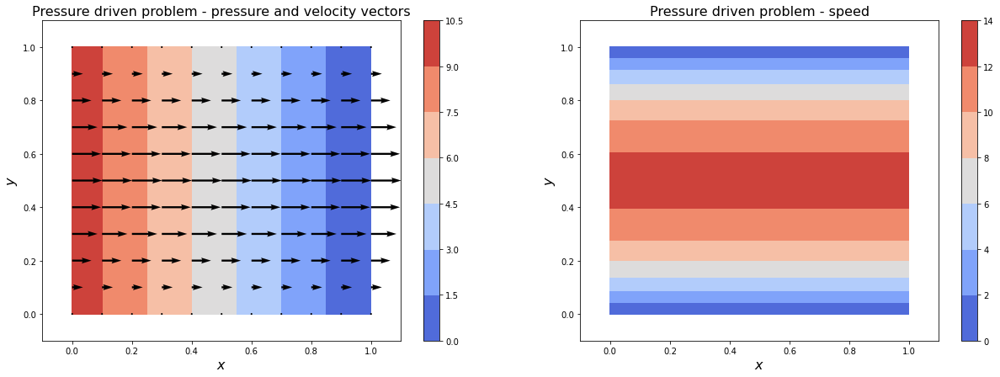

In [6]:
# set up figure
fig = plt.figure(figsize=(21, 7))
ax1 = fig.add_subplot(121)
cont = ax1.contourf(X,Y,p, cmap=cm.coolwarm)
fig.colorbar(cont)
# don't plot at every gird point - every 5th
ax1.quiver(X[::5,::5],Y[::5,::5],u[::5,::5],v[::5,::5])
ax1.set_xlim(-0.1, 1.1)
ax1.set_ylim(-0.1, 1.1)
ax1.set_xlabel('$x$', fontsize=16)
ax1.set_ylabel('$y$', fontsize=16)
ax1.set_title('Pressure driven problem - pressure and velocity vectors', fontsize=16)

ax1 = fig.add_subplot(122)
cont = ax1.contourf(X,Y,np.sqrt(u*u+v*v), cmap=cm.coolwarm)
fig.colorbar(cont)
ax1.set_xlim(-0.1, 1.1)
ax1.set_ylim(-0.1, 1.1)
ax1.set_xlabel('$x$', fontsize=16)
ax1.set_ylabel('$y$', fontsize=16)
ax1.set_title('Pressure driven problem - speed', fontsize=16)

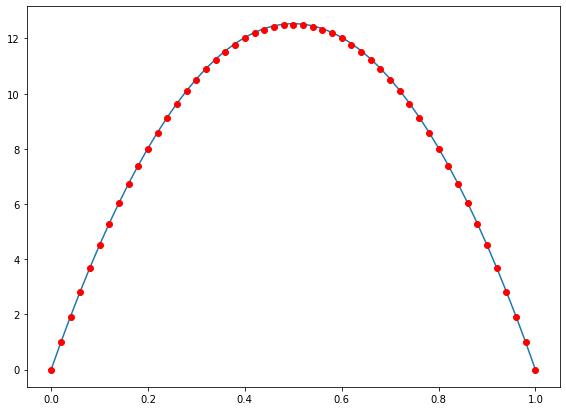

In [7]:
fig = plt.figure(figsize=(21, 7))

u_theor = P_max /(nu*2*Lx) * ((Ly/2.0)**2 - (Y[Nx//2,:]-Ly/2.0)**2)

ax1 = fig.add_subplot(121)
ax1.plot(Y[Nx//2,:],u[Nx//2,:])
ax1.plot(Y[Nx//2,:],u_theor,'ro')